# Imports

In [19]:
import pandas as pd
import numpy as np
import os
import snf

import src.modules.data_loading as data_loading
import src.modules.utils as utils
import src.modules.plotting as plotting

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from collections import Counter

### Raw data import for module calculation
import re

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


# Data location directory
data_dir = "./data/"
results_dir = './results/'

rna_dir = os.path.join(data_dir, 'RNA_seq/')
tcr_dir = os.path.join(data_dir, 'TCR_seq/')
cytof_dir = os.path.join(data_dir, 'CyTOF/')
micro_dir = os.path.join(data_dir, 'microbiome_analysis/')


for dir in [rna_dir, tcr_dir, cytof_dir, micro_dir, data_dir, results_dir]:
    try:
        os.mkdir(dir)
    except:
        pass



%matplotlib inline
random_state = 42

path_sets  = [ 
            'WikiPathway_2021_Human',
            'MSigDB_Hallmark_2020',
            'GO_Biological_Process_2021',
            'GO_Cellular_Component_2021',
            'GO_Molecular_Function_2021',
            ]

hallmark = ['MSigDB_Hallmark_2020']

# General metric to use
metric = 'sqeuclidean'

# Data imports

## Metadata

In [20]:
meta = data_loading.metadata_import(os.path.join(data_dir, 'ERC_meta.xlsx'))
print(f"Number of individuals with metadata: {len(meta['Subjectnr'].unique())}")
print(meta['Group'].value_counts())

meta['smoking'] = meta['smoking'].replace({'vaping' : 1, '?' : np.nan, '1 10/d': 1, '1 occasional' : 1})
print(meta['smoking'].value_counts())

print('\n\n\n\n')
print('******* Metadata description *******')
print('\n\n')
print(meta[['BDI T-score (depression)', 'BAI T-score (anxiety)','Age', 'CMV IgG (U/mL)', 'BMI', '25-OH-Vit D']].describe())
for col in ['Long covid', 'Covid 19 (1/0)', 'Group', 'Gender', 'smoking']:
    print(f'{meta[col].value_counts()}\n')

Number of individuals with metadata: 569
control             254
patient             164
household member    151
Name: Group, dtype: int64
0.0    478
1.0     55
Name: smoking, dtype: int64





******* Metadata description *******



       BDI T-score (depression)  BAI T-score (anxiety)         Age  \
count                135.000000             148.000000  564.000000   
mean                  51.525926              54.513514   47.980496   
std                    9.397387              11.654018   15.680014   
min                   35.000000              43.000000   15.000000   
25%                   44.000000              46.000000   34.750000   
50%                   53.000000              51.000000   49.500000   
75%                   58.000000              59.000000   60.000000   
max                   72.000000              99.000000   85.000000   

       CMV IgG (U/mL)         BMI  25-OH-Vit D  
count      510.000000  534.000000   510.000000  
mean       139.287149   25.996367    

In [21]:
### Identify those patients that had covid in one group and those that present anxiety and depression data in another
### The meta df will only contain the other variables

covid_patients = meta[['Subjectnr', 'Long covid', 'Covid 19 (1/0)']]
positivity_data = meta[['Subjectnr', 'Covid 19 (1/0)']]
dep_anx = meta[['Subjectnr', 'BDI T-score (depression)', 'BAI T-score (anxiety)']]

meta = meta[['Subjectnr', 'Group', 'Age', 'Gender', 'CMV IgG (U/mL)', 'BMI', '25-OH-Vit D','smoking']]
print('Patients with covid data:')
print(covid_patients['Covid 19 (1/0)'].value_counts())

Patients with covid data:
0.0    297
1.0    208
Name: Covid 19 (1/0), dtype: int64


In [22]:
# For those patients that had covid but are missing the long covid information it means that they did not have LC
covid_patients = covid_patients[covid_patients['Covid 19 (1/0)'] == 1]
covid_patients.fillna(0, inplace=True)
covid_patients.rename(columns={'Subjectnr': 'Donor'}, inplace = True)
covid_patients.drop(columns=['Covid 19 (1/0)'], inplace=True)
covid_patients.reset_index(drop = True, inplace=True)
covid_patients['Long covid'].value_counts()

0.0    119
1.0     89
Name: Long covid, dtype: int64

In [23]:
# We drop those that are missing either depression or anxiety parameters
dep_anx = dep_anx[dep_anx[['BDI T-score (depression)', 'BAI T-score (anxiety)']].notna()]
dep_anx.rename(columns={'Subjectnr': 'Donor'}, inplace = True)
dep_anx.reset_index(drop = True, inplace=True)

## TCR_stats

In [24]:
# We load the TCR metadata
TCR_stats = data_loading.tcr_stats_import(tcr_dir)
print(f"Number of TCR_stats people: {len(TCR_stats['Donor'].unique())}")

Number of TCR_stats people: 99


/Users/fabioaffaticati/Desktop/Work/activ_covid-tcell-omics/src/modules/data_loading.py:92: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  TCR_stats = TCR_stats.groupby(['description'], axis=0).sum()[['totalcountCD4','totalcountCD8',
/Users/fabioaffaticati/Desktop/Work/activ_covid-tcell-omics/src/modules/data_loading.py:100: FutureWarning: The default value of regex will change from True to False in a future version.
  TCR_stats['description'] = TCR_stats['description'].str.replace(orig, rep)


In [25]:
# Remove the columns used for the previous calculation
TCR_stats.drop(columns=['totalcountCD4', 'totalcountCD8'], inplace=True)
TCR_stats.head()

,Donor,entropyCD4,entropyCD8,tcrcovidmatchCD4,tcrcovidmatchCD8,tcrcovidfreqCD4,tcrcovidfreqCD8
0,Covid HH001,0.936322,0.811990,0.001242,0.000526,0.001080,0.000058
1,Covid HH031,0.933120,0.699470,0.001003,0.000891,0.000839,0.000532
2,Covid HH032,0.948882,0.754762,0.000664,0.000000,0.000865,0.000000
3,Covid HH039,0.951134,0.847985,0.000744,0.001045,0.000871,0.000092
4,Covid HH044,0.941967,0.931616,0.000715,0.000537,0.000694,0.000334


## TCR_seq

In [26]:
tcr_raw = utils.tcrseq_loading(tcr_dir)

In [9]:
len(tcr_raw['cdr3'].unique())

2024226

In [10]:
# Load TCR modules
tcr_modules = pd.read_csv(tcr_dir+'spectral_clustering.csv', index_col=0)
tcr_modules["module"] = "M"+tcr_modules["cluster"].astype(str)
tcr_modules.rename(columns={'v_call': 'vgene', 'junction_aa': 'cdr3'}, inplace=True)

In [12]:
module_annot = pd.merge(
    left=tcr_raw,
    right=tcr_modules,
    on=["vgene", "cdr3"]
)
module_annot.head()

,tcrseq,sample,count,freq,cdr3,vgene,jgene,cluster,module
0,TRBV10-1\tCASSAGDTQYF\tTRBJ2-3,Covid PT002,22.0,0.000011,CASSAGDTQYF,TRBV10-1*01,TRBJ2-3*01,84,M84
1,TRBV10-1\tCASSAGYEQYF\tTRBJ2-7,Covid PT043,11.0,0.000003,CASSAGYEQYF,TRBV10-1*01,TRBJ2-7*01,920,M920
2,TRBV10-1\tCASSDGNTEAFF\tTRBJ1-1,Covid PT040,5.0,0.000001,CASSDGNTEAFF,TRBV10-1*01,TRBJ1-1*01,873,M873
3,TRBV10-1\tCASSDGNTGELFF\tTRBJ2-2,ERC CO229,90.0,0.000013,CASSDGNTGELFF,TRBV10-1*01,TRBJ2-2*01,261,M261
4,TRBV10-1\tCASSDGYEQYF\tTRBJ2-7,Covid PT132,20.0,0.000005,CASSDGYEQYF,TRBV10-1*01,TRBJ2-7*01,489,M489


In [18]:
module_counts_tcr  = module_annot.groupby("module").agg({"sample":Counter})
module_counts_total = module_counts_tcr["sample"].sum()

for group in module_counts_total.keys():
    module_counts_tcr[group] = module_counts_tcr["sample"].str[group].fillna(0) / module_counts_total[group]
module_counts_tcr.drop(columns='sample', inplace = True)
    
module_counts_tcr = module_counts_tcr.T
module_counts_tcr.reset_index(names='Donor',inplace = True)
module_counts_tcr.sort_values(by=['Donor'], inplace=True)
module_counts_tcr.head()

module,Donor,M-1,M0,M1,M10,M100,M101,M102,M103,M104,...,M990,M991,M992,M993,M994,M995,M996,M997,M998,M999
0,Covid HH001,0.001062,0.009554,0.001062,0.0,0.001062,0.000000,0.0,0.001062,0.00000,...,0.000000,0.004246,0.000000,0.0,0.000000,0.001062,0.001062,0.000000,0.000000,0.0
36,Covid HH031,0.000000,0.004343,0.002172,0.0,0.000000,0.000000,0.0,0.000000,0.00000,...,0.000000,0.006515,0.003257,0.0,0.000000,0.002172,0.005429,0.001086,0.001086,0.0
57,Covid HH032,0.000000,0.006098,0.001742,0.0,0.000871,0.000871,0.0,0.000000,0.00000,...,0.001742,0.002613,0.004355,0.0,0.000871,0.001742,0.000000,0.000000,0.000000,0.0
79,Covid HH039,0.000000,0.001234,0.000617,0.0,0.000000,0.001234,0.0,0.000617,0.00000,...,0.000617,0.003701,0.003085,0.0,0.000000,0.001234,0.002468,0.000000,0.000617,0.0
27,Covid HH044,0.000000,0.006159,0.002309,0.0,0.000000,0.001540,0.0,0.000000,0.00077,...,0.000770,0.002309,0.003849,0.0,0.000000,0.001540,0.011547,0.000000,0.000000,0.0


## Cytof

In [110]:
all_cytof = data_loading.import_all_cytof(cytof_dir)

# Remove degraded frozen samples 
eliminate = pd.read_csv(results_dir + '/cytof_to_exclude.csv', sep='\t')
all_cytof = all_cytof[ ~all_cytof['Donor'].isin(eliminate['Donor']) ]
# Also remove PT085 degraded sample
all_cytof = all_cytof[all_cytof['Donor'] != 'Covid PT085']

all_cytof.sort_values(by = ['Donor'], inplace = True)
all_cytof.reset_index(drop=True,inplace = True)


# Select metacluster 0 low samples to save
column_to_query = 'Metacluster 0'
print(all_cytof.query('`' + column_to_query + '` <= 10').reset_index(drop=True)[['Donor', 'Metacluster 0']].to_csv('lowmetacluster0.csv', index = False))

# Divide Cytof dataset into cell counts DataFrame and metadata Dataframe for testing
cytof = all_cytof.iloc[:,1:145]

cytof_meta = all_cytof.iloc[:,146:-6]
print(f'Cytof shape {cytof.shape} and Cytof metaclusters shape {cytof_meta.shape}')

None
Cytof shape (236, 144) and Cytof metaclusters shape (236, 23)


## Microbiome

In [145]:
micro_fused, micro_taxa = data_loading.microbiome_import(micro_dir, .9, 'abundance')
micro_fused_rel, _ = data_loading.microbiome_import(micro_dir, .9, 'rel_abundance')
#micro_fused, micro_taxa = data_loading.microbiome_import(micro_dir, 1, 'abundance')
#micro_fused_rel, _ = data_loading.microbiome_import(micro_dir, 1, 'rel_abundance')
print(f"Number of patients with microbiome data: {len(micro_fused_rel['Donor'].unique())}")




#### Abundance normalisation
micro_data_norm = micro_fused.drop(columns = ['Donor']).T.copy()
micro_data_norm.columns = micro_fused['Donor']

micro_data_norm['genename'] = micro_data_norm.index
micro_data_norm['genename'] = [list(micro_taxa[micro_taxa['taxon_id'] == taxon]['taxon_name'])[0] for taxon in micro_data_norm['genename']]
micro_data_norm.reset_index(drop = True, inplace = True)
micro_data_norm.replace(0,1, inplace=True) 


# Dummy design variable for the microbial normalisation
clusters = pd.DataFrame()
clusters['Cluster'] = ['C']*(micro_data_norm.shape[1]-1)
clusters.index = micro_data_norm.drop(columns = 'genename').columns



micro_data_norm.iloc[:,:-1] = micro_data_norm.iloc[:,:-1].apply(pd.to_numeric)
micro_data_norm.reset_index(drop=True, inplace=True)
micro_data_norm= micro_data_norm[ ['genename'] + [ col for col in micro_data_norm.columns if col != 'genename' ] ]
micro_data_norm = utils.deseq2(micro_data_norm, clusters, 'genename','~1', results_dir + '/normalized_counts_bacteria.csv')




eigentaxa = pd.read_csv(data_dir + 'Eigentaxa_values.csv')
eigentaxa['eigentaxa'] = 'eigentaxa_' + eigentaxa['eigentaxa'].astype(str)

Number of patients with microbiome data: 182







   function: y = a/x + b, and a local regression fit was automatically substituted.
   specify fitType='local' or 'mean' to avoid this message next time.



-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)



INFO:DESeq2:Normalizing counts


In [146]:
### CSV for R visualisations
save = pd.merge(micro_fused, meta, how="left", left_on='Donor', right_on='Subjectnr')
save.drop(columns='Subjectnr', inplace = True)
save = pd.concat([save.iloc[:,0], save.iloc[:,-6:]], axis = 1)
save.to_csv(results_dir+'microbiome_patients.csv', sep='\t')

In [147]:
### Constructing bacterial sets for GSEA
custom_bacteria_gene_lists = {}
for family in micro_taxa['family'].unique():
    custom_bacteria_gene_lists[family] = list(micro_taxa[micro_taxa['family'] == family]['taxon_name'])

In [148]:
####### Restrict the analysis to the strains used to generate the eigen taxa
micro_data_norm = micro_data_norm[micro_data_norm['genename'].isin(list(eigentaxa['microbe']))]
micro_data_norm.reset_index(drop = True, inplace=True)

eigentaxa.replace({"microbe": dict(zip(micro_taxa['taxon_name'], micro_taxa['taxon_id']))}, inplace=True)
eigentaxa.head()

micro_fused_rel = micro_fused_rel[[c for c in micro_fused_rel.columns if c in list(eigentaxa['microbe']) or c == 'Donor']]
micro_fused = micro_fused[[c for c in micro_fused.columns if c in list(eigentaxa['microbe']) or c == 'Donor']]

In [249]:
micro_data_norm.T

,0,1,2,3,4,5,6,7,8,9,...,377,378,379,380,381,382,383,384,385,386
Donor,,,,,,,,,,,,,,,,,,,,,
genename,Prevotella 1,Blautia 2,Alistipes 3,Sporobacter 27,AB009176_g 25,Faecalibacterium 6,Caproiciproducens 9,Odoribacter 1,Eubacterium_g8 1,Oscillibacter 27,...,Caproiciproducens 6,Bacteroides 15,EF400272_g 2,Clostridium_g6 1,DQ057459_g 1,EF602946_g 2,Eubacterium_g23 1,Bacteroides 18,Eggerthella 1,Lachnospiraceae 20
Covid HH031,2.0,4710.0,146.0,2.0,2.0,2.0,2.0,98.0,166.0,12.0,...,2.0,2.0,2.0,2.0,250.0,2.0,2.0,314.0,2.0,21.0
Covid HH032,14010.0,644.0,127.0,1.0,1.0,1.0,1.0,58.0,101.0,1.0,...,1.0,68.0,1.0,1.0,59.0,1.0,292.0,136.0,1.0,1.0
Covid HH039,10.0,1252.0,145.0,13.0,1.0,1.0,3.0,272.0,1.0,29.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,7.0,10.0
Covid HH053,1.0,537.0,131.0,1.0,18.0,1.0,1.0,205.0,303.0,22.0,...,1.0,1.0,1.0,1.0,39.0,1.0,1268.0,67.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERC CO255,14093.0,201.0,139.0,2.0,2.0,2.0,2.0,162.0,18.0,13.0,...,2.0,2.0,2.0,2.0,36.0,2.0,442.0,2.0,2.0,2.0
ERC CO263,2.0,2229.0,663.0,2.0,2.0,2.0,2.0,71.0,2.0,2.0,...,2.0,2.0,2.0,12.0,2.0,2.0,105.0,2.0,2.0,21.0
ERC CO265,2.0,1920.0,154.0,2.0,2.0,2.0,2.0,107.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,232.0,2.0,2.0


In [149]:
### PCA reduction of the bacterial data into eigentaxa
pca = PCA(n_components=1)
scaler = StandardScaler()

dim_red_bacteria = micro_fused_rel.drop(columns = ['Donor']).T.copy()
dim_red_bacteria.columns = micro_fused_rel['Donor']
dim_red_bacteria['genename'] = dim_red_bacteria.index
dim_red_bacteria = dim_red_bacteria.replace({"genename": dict(zip(eigentaxa['microbe'], eigentaxa['eigentaxa']))})
#renamed = renamed.groupby('genename').filter(lambda x : len(x)>1)
#pd.set_option('display.max_rows', 10000)
dim_red_bacteria.reset_index(drop=True,inplace=True)

agg = dim_red_bacteria.groupby('genename', as_index = False)


pose = pd.DataFrame()

for group_name, df_group in agg:
    df_group = pca.fit_transform(scaler.fit_transform(df_group.drop(columns='genename').to_numpy().T)).T
    pose[group_name] = df_group.flatten().tolist()

pose.head()


,eigentaxa_0,eigentaxa_1,eigentaxa_10,eigentaxa_11,eigentaxa_12,eigentaxa_13,eigentaxa_14,eigentaxa_15,eigentaxa_16,eigentaxa_17,...,eigentaxa_70,eigentaxa_74,eigentaxa_75,eigentaxa_78,eigentaxa_79,eigentaxa_8,eigentaxa_80,eigentaxa_81,eigentaxa_83,eigentaxa_9
0,0.534674,-1.103063,-0.515694,-0.339305,-0.359047,-0.591040,0.071445,0.166510,-0.093703,-0.660860,...,-0.195794,-0.212473,-0.310594,-0.21511,-0.248261,-0.489774,-0.360282,0.080764,-0.423584,-0.569979
1,0.346591,-0.917328,-0.016080,-0.545573,1.809200,-0.856713,-0.014383,-0.878183,-0.632979,-0.075911,...,0.698922,2.331790,-0.310594,-0.21511,-0.053615,-0.430871,-0.416632,0.167324,1.448315,-0.298759
2,-0.316530,-0.918038,23.285471,0.073794,-0.359047,0.164954,2.043480,-0.377307,1.021821,2.061794,...,0.528947,-0.343732,-0.310594,-0.21511,-0.248261,0.085085,0.463747,-0.275697,-0.422569,-0.569979
3,-0.878883,0.158562,-0.020748,0.794913,2.978352,-1.081879,1.240059,3.345634,0.522228,-0.137327,...,-0.195794,-0.343732,-0.310594,-0.21511,6.615941,2.041002,-0.498553,-0.275697,-0.423584,1.245748
4,3.449191,-1.076712,-0.530904,-0.746954,-0.359047,0.873927,0.008099,-0.717923,-0.996548,-0.660860,...,-0.195794,-0.343732,-0.310594,-0.21511,-0.248261,-0.991343,-0.273423,0.946867,-0.423584,-0.569979


## RNA_seq

### Readcounts files

In [25]:
rna = data_loading.rna_import(rna_dir)
count_matrix, des = data_loading.cleanup_rna(rna)

des.set_index('colnames', inplace=True)

normalized_counts = utils.deseq2(count_matrix, des, 'genename','~1', results_dir + '/normalized_counts.csv')

# Checkpoint
normalized_counts = pd.read_csv(results_dir + 'normalized_counts.csv', sep='\t', index_col = 0)

['./data/RNA_seq/readcounts_210915.txt', './data/RNA_seq/readcounts_210901.txt', './data/RNA_seq/readcounts_210811.txt', './data/RNA_seq/readcounts_210804.txt', './data/RNA_seq/readcounts_210818.txt', './data/RNA_seq/readcounts_210825.txt', './data/RNA_seq/readcounts_210728.txt', './data/RNA_seq/readcounts_210908.txt']

Number of files: 8
Started!


/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/data_loading.py:378: FutureWarning:

Passing 'suffixes' which cause duplicate columns {'Unnamed: 161_x'} in the result is deprecated and will raise a MergeError in a future version.



Ended!
Number of unique transcripts: 30795
Number of patients: 317








-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)



INFO:DESeq2:Normalizing counts


In [26]:
# Select patients with gene expression and their metadata
patients = pd.DataFrame([c.replace('.', ' ', 1) for c in normalized_counts.drop('genename', axis = 1)],columns =['Patient'])
patients = pd.merge(patients, meta, how="left", left_on='Patient', right_on = 'Subjectnr').reset_index(drop=True)
patients.drop(columns={'Subjectnr'}, inplace=True)
patients.rename(columns={'Patient': 'Subjectnr'},inplace=True)

### Gene name mapping

In [27]:
mapped = utils.gene_mapping(normalized_counts, results_dir)

# Checkpoint
normalized_counts = pd.read_csv(results_dir + '/normalized_counts_renamed.csv', sep='\t', index_col = 0)

Finished querying!
Finished mapping!


### Module aggregation

In [28]:
aggregated = utils.aggregate_modules('pca', normalized_counts, data_dir, results_dir)

# Checkpoint
aggregated = pd.read_csv(results_dir + '/pca_aggregated.csv', sep='\t', index_col = 0)
aggregated['Donor'] = patients['Subjectnr']

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:150: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:150: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:150: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using

In [29]:
print(meta.describe())
print(meta['Gender'].value_counts())
print(meta['smoking'].value_counts())
print(meta['Group'].value_counts())

              Age  CMV IgG (U/mL)         BMI  25-OH-Vit D     smoking
count  564.000000      510.000000  534.000000   510.000000  533.000000
mean    47.980496      139.287149   25.996367    21.268627    0.103189
std     15.680014      193.521809    4.771720     8.931545    0.304492
min     15.000000        0.000000   16.464360     0.000000    0.000000
25%     34.750000        0.150000   22.679952    15.000000    0.000000
50%     49.500000        0.150000   25.254426    20.000000    0.000000
75%     60.000000      271.500000   28.622786    27.000000    0.000000
max     85.000000      500.000000   53.345527    65.000000    1.000000
f    321
m    213
Name: Gender, dtype: int64
0.0    478
1.0     55
Name: smoking, dtype: int64
control             254
patient             164
household member    151
Name: Group, dtype: int64


In [103]:
# Suumary statistics for the different datasets
for df,df_name in zip([all_cytof, micro_fused, aggregated, TCR_stats], ['Cytof', 'Microbiome', 'RNAseq', 'TCRseq']):
    print("*****************************************************************************************************************************************")
    print(f"\n\n{df_name} data:\n\n")
    print(f"Numeric metadata:\n{meta[meta['Subjectnr'].isin(df['Donor'])].describe()}")
    print(f"Gender:\n{meta[meta['Subjectnr'].isin(df['Donor'])]['Gender'].value_counts()}")
    print(f"Smoking:\n{meta[meta['Subjectnr'].isin(df['Donor'])]['smoking'].value_counts()}")
    print(f"Grouping:\n{meta[meta['Subjectnr'].isin(df['Donor'])]['Group'].value_counts()}")
    print(f"Anxiety/Depression information:\n{dep_anx[dep_anx['Donor'].isin(df['Donor'])].describe()}")
    print(f"Covid positivity:\n{positivity_data[positivity_data['Subjectnr'].isin(df['Donor'])]['Covid 19 (1/0)'].value_counts()}")
    print(F"Long Covid:\n{covid_patients[covid_patients['Donor'].isin(df['Donor'])]['Long covid'].value_counts()}")
    print("*****************************************************************************************************************************************")

*****************************************************************************************************************************************


Cytof data:


Numeric metadata:
              Age  CMV IgG (U/mL)         BMI  25-OH-Vit D     smoking
count  231.000000      219.000000  233.000000   219.000000  233.000000
mean    48.077922      137.482311   26.233963    20.894977    0.098712
std     16.170101      190.707380    5.040882     9.118130    0.298918
min     15.000000        0.000000   16.464360     0.000000    0.000000
25%     33.500000        0.150000   23.030045    14.000000    0.000000
50%     51.000000        0.150000   25.510204    20.000000    0.000000
75%     61.000000      262.500000   28.719723    27.000000    0.000000
max     77.000000      500.000000   53.345527    65.000000    1.000000
Gender:
f    142
m     91
Name: Gender, dtype: int64
Smoking:
0.0    210
1.0     23
Name: smoking, dtype: int64
Grouping:
control             154
patient              65
household member   

In [105]:
print(f"TCR specific feature statistics\n\n{TCR_stats.describe()}")

TCR specific feature statistics

       totalcountCD4  totalcountCD8  entropyCD4  entropyCD8  tcrcovidmatchCD4  \
count      99.000000      99.000000   99.000000   99.000000         99.000000   
mean    40298.656566   11895.323232    0.888940    0.790752          0.000618   
std     44044.574266   13326.273444    0.082743    0.093807          0.000436   
min         4.000000      20.000000    0.621429    0.571824          0.000000   
25%      3252.000000     909.000000    0.832901    0.746946          0.000296   
50%     20427.000000    9171.000000    0.927960    0.806180          0.000655   
75%     78049.500000   18448.000000    0.952600    0.848065          0.000876   
max    171241.000000   61948.000000    0.976104    0.965804          0.002232   

       tcrcovidmatchCD8  tcrcovidfreqCD4  tcrcovidfreqCD8  
count         99.000000        99.000000        99.000000  
mean           0.000993         0.000530         0.000829  
std            0.000864         0.000417         0.001615

In [109]:
# print the describe of all the columns
pd.set_option('display.max_columns', None)
print(f"Cytof specific feature statistics\n\n{cytof_meta.describe()}")

Cytof specific feature statistics

       Sen_CD8+Temra  Sen_CD4+Tem  Exh_CD4+Tef     CD8+Tcm  Exh_CD4+Tcm  \
count     236.000000   236.000000   236.000000  236.000000   236.000000   
mean        6.494032     1.645796     2.302212    0.847401    15.891626   
std         5.657958     3.252957     1.126411    1.197913     5.116453   
min         0.233135     0.002475     0.265508    0.018942     4.812681   
25%         2.197273     0.061125     1.587472    0.260043    12.174927   
50%         4.783486     0.276912     2.083979    0.488653    15.404297   
75%         8.538056     2.020860     2.817737    0.851629    18.765925   
max        29.005618    30.121696     8.323746    8.433960    35.287134   

        CD4+Tregs         NKT  Exh_CD4+Th2cm          NK     CD8+Tem  \
count  236.000000  236.000000     236.000000  236.000000  236.000000   
mean     1.068106    1.526669       0.783631    7.820064    2.934210   
std      0.453713    2.053987       1.427763    5.449710    1.892464   
m

In [ ]:
#### Save all preprocessed data for further use:

# metadata
meta.to_csv('metadata.csv', sep='\t')
# RNA
aggregated.to_csv('RNAseq.csv', sep='\t')
# TCRseq
#module_counts_tcr.to_csv('TCRseq.csv', sep='\t')
# TCRstats
TCR_stats.to_csv('TCRstats.csv', sep='\t')
# Microbiome
micro_fused_rel.to_csv('Microbiome.csv', sep='\t')
# Cytof
pd.concat([all_cytof.iloc[:,1:145], all_cytof.iloc[:,-7:-6]], axis=1).to_csv('Cytof.csv', sep='\t')
# Cytof meta
cytof_meta.to_csv('Cytof_meta.csv', sep='\t')

NameError: name 'micro_fused_rel' is not defined

In [50]:
# function that takes 4 dataframes in input and calculate the number of ids (column = 'Donor') that appear in at least one dataframe
def calculate_unique_patients(data1, data2, data3, data4):
    unique = set(data1['Donor'].unique()).union(set(data2['Donor'].unique())).union(set(data3['Donor'].unique())).union(set(data4['Donor'].unique()))
    return len(unique)
calculate_unique_patients(aggregated, TCR_stats, micro_fused_rel, cytof_meta)

394

# RNA_seq unimodal

Silhouette score: 0.5479299886957817


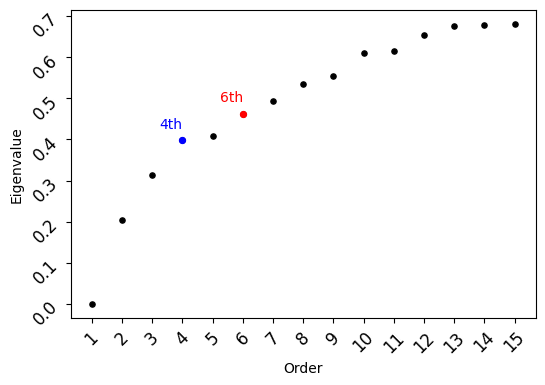

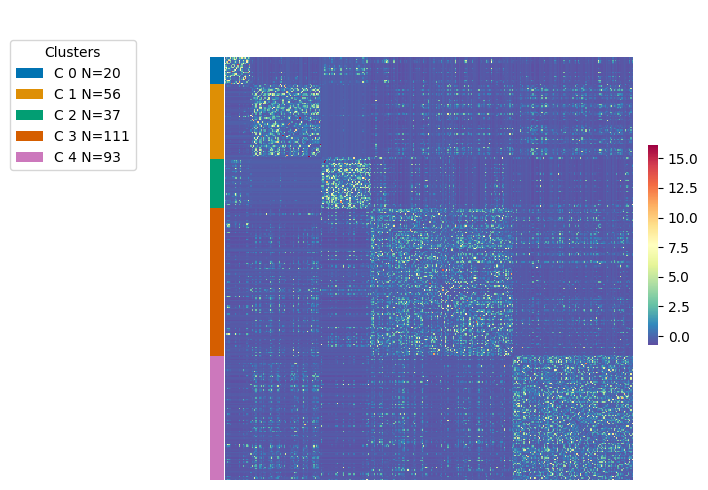

In [30]:
res_dir = results_dir + 'RNA_unimodal/'
dim = aggregated.shape[0]//10

affinity_RNA = snf.make_affinity(aggregated.drop(columns=['Donor']),
                                metric = metric, K = dim, mu = .5, normalize = True)


plotting.eigengap_visual(affinity_RNA, res_dir)

n_clusters = 5
clus_labels_RNA = utils.spectral_clustering_custom(affinity_RNA, n_clusters)

plotting.draw_clustermap(clus_labels_RNA, affinity_RNA, res_dir, 'standard')

dump = pd.DataFrame()
dump['Donor'] = aggregated['Donor']
dump['labels_RNA'] = clus_labels_RNA
dump.to_csv('RNA_clusters.csv', sep='\t')

#plotting.features_ami([(aggregated.drop(columns = ['Donor']), metric)], clus_labels_RNA, dim, n_clusters, plot_flag = True)

## Stability analysis

In [23]:
cooccurrence, amis = utils.stability_analysis(aggregated, aggregated['Donor'], metric, dim, n_clusters, 1000, 10, False)

plotting.draw_clustermap(clus_labels_RNA, (cooccurrence).to_numpy(), res_dir, 'no')

plotting.ami_boxplots(amis, aggregated.drop(columns=['Donor']).columns, res_dir)

Run 0:
Silhouette score: 0.5249853330764694
Silhouette score: 0.5432349158936108
Silhouette score: 0.5299029073659696
Silhouette score: 0.5276715482438645
Silhouette score: 0.5453375076091103


/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:714: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:714: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:714: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using

Silhouette score: 0.5407893554577939
Silhouette score: 0.5298869963246523
Silhouette score: 0.5498300216807384
Silhouette score: 0.5574036071534728


/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:714: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:714: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:714: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using

Silhouette score: 0.5547536384579789
Run 1:
Silhouette score: 0.5540460453048957
Silhouette score: 0.5537151561972686
Silhouette score: 0.5296358224434192
Silhouette score: 0.5705055814081164
Silhouette score: 0.5223674335267757
Silhouette score: 0.5165072846482439
Silhouette score: 0.5197991766175211
Silhouette score: 0.5472334851873637
Silhouette score: 0.5419308865670521
Silhouette score: 0.5502533407345659
Run 2:
Silhouette score: 0.5417933783807016
Silhouette score: 0.5311671460044189
Silhouette score: 0.5145230360800542
Silhouette score: 0.5402090914160497
Silhouette score: 0.5635160895708298
Silhouette score: 0.5400472073308171
Silhouette score: 0.5462073583183095
Silhouette score: 0.49130234046134724
Silhouette score: 0.5360678650991008
Silhouette score: 0.5551567297423958
Run 3:
Silhouette score: 0.5292854187281231
Silhouette score: 0.5591025359209232
Silhouette score: 0.5438333503999953
Silhouette score: 0.5160147789040933
Silhouette score: 0.5318743163344659
Silhouette score

KeyboardInterrupt: 

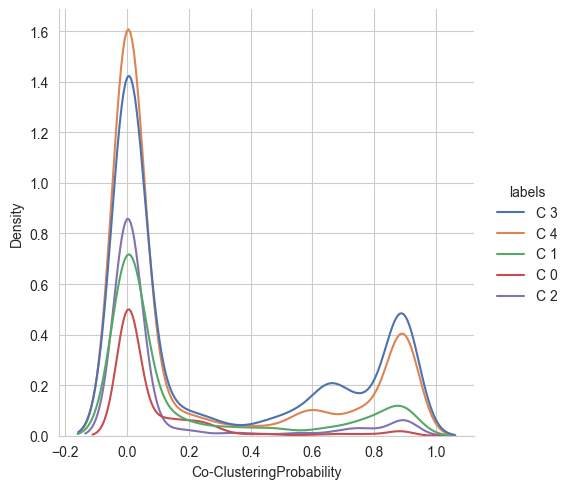

In [ ]:
stability_df = cooccurrence.unstack().reset_index()
comparison_df = aggregated.copy()
comparison_df['labels'] = clus_labels_RNA
comparison_df = comparison_df[['labels', 'Donor']]
stability_df.rename(columns={'level_0': 'Subjectnr', 0:'Co-ClusteringProbability'}, inplace=True)
stability_df = stability_df.query('Subjectnr != Donor')
stability_df['SortedCombination'] = stability_df.apply(lambda row: ''.join(sorted([row['Subjectnr'], row['Donor']])), axis=1)

stability_df = stability_df.drop_duplicates(subset='SortedCombination')
stability_df.sort_values(by='SortedCombination', inplace=True)
#stability_df = stability_df.drop('SortedCombination', axis=1)

stability_df = pd.merge(stability_df, comparison_df, on = 'Donor')

sns.displot(data=stability_df, x="Co-ClusteringProbability", kind="kde", hue = 'labels')

Silhouette score: 0.9596230794341315


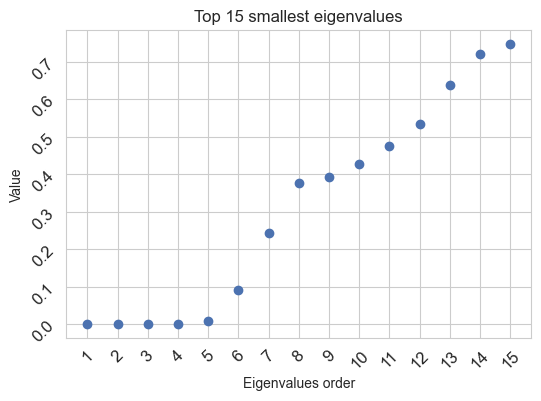

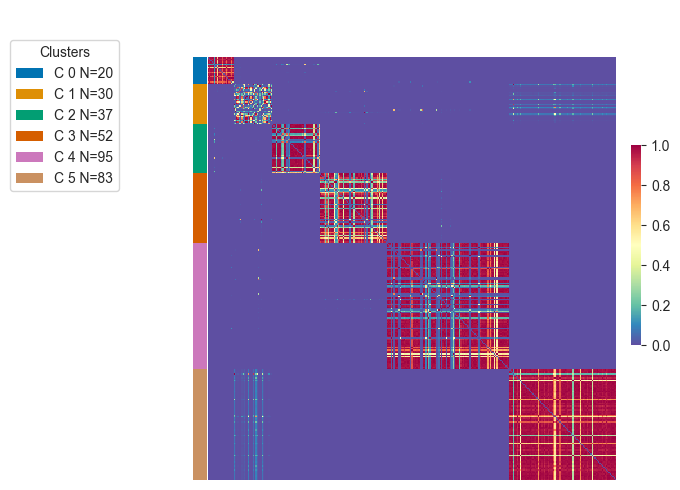

In [ ]:
affinity = snf.make_affinity(cooccurrence, metric = metric, K = dim, mu = .5, normalize = True)

plotting.eigengap_visual(affinity, res_dir)

clus_labels = utils.spectral_clustering_custom(affinity, n_clusters+1)

plotting.draw_clustermap(clus_labels, affinity, res_dir, 'minmax')

In [ ]:
from sklearn import metrics
sample_silhouette_values = metrics.silhouette_samples(cooccurrence, clus_labels)
means_lst = []
for label in sorted(clus_labels.unique()):
    print(f'Cluster {label}, average silhouette {sample_silhouette_values[clus_labels == label].mean()}')

Cluster C 0, average silhouette 0.6524980167698733
Cluster C 1, average silhouette 0.12416908486916339
Cluster C 2, average silhouette 0.7088944733998688
Cluster C 3, average silhouette 0.7731608147166698
Cluster C 4, average silhouette 0.7464384845788291
Cluster C 5, average silhouette 0.5909709298502723


/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



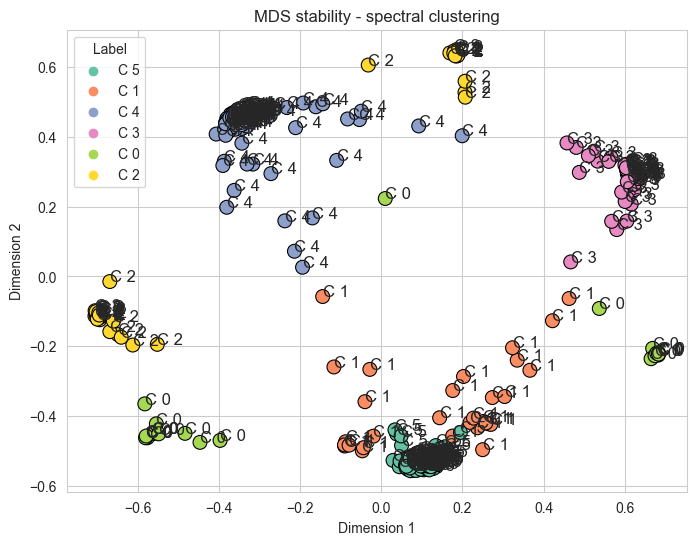

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import MDS
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist



# Convert similarity matrix to dissimilarity matrix (required for MDS)
dissimilarity_matrix = 1 - cooccurrence

# Apply Multidimensional Scaling (MDS)
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42, max_iter = 1000)
embedding = mds.fit_transform(dissimilarity_matrix)

# Create a DataFrame for Seaborn
df = pd.DataFrame({'X': embedding[:, 0], 'Y': embedding[:, 1], 'Label': clus_labels})

# Plot the scatter plot with Seaborn
plt.figure(figsize=(8, 6))
sns.scatterplot(x='X', y='Y', hue='Label', data=df, palette='Set2', edgecolor='k', s=100)


# Annotate the points with labels
for i, label in enumerate(clus_labels):
    plt.text(embedding[i, 0], embedding[i, 1], label, fontsize=12)

# Show the plot
plt.title('MDS stability - spectral clustering')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



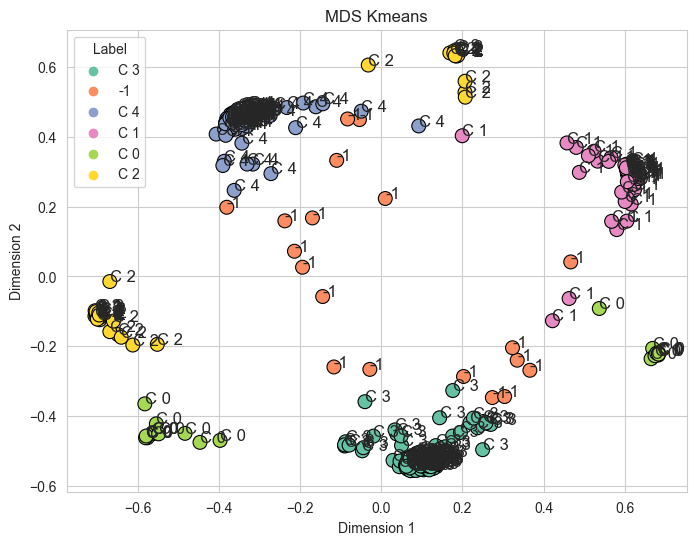

In [ ]:
# Convert similarity matrix to dissimilarity matrix (required for MDS)
dissimilarity_matrix = 1 - cooccurrence

# Apply Multidimensional Scaling (MDS)
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42, max_iter = 1000)
embedding = mds.fit_transform(dissimilarity_matrix)

# Create a DataFrame for Seaborn
df = pd.DataFrame({'X': embedding[:, 0], 'Y': embedding[:, 1], 'Label': clus_labels_RNA})

kmeans = KMeans(n_clusters=7, random_state=0, n_init="auto").fit(df[['X', 'Y']])
df['kmeans_labels'] = kmeans.labels_



# Compute Euclidean distances to assigned centroids
distances = cdist(df[['X', 'Y']], kmeans.cluster_centers_, metric='euclidean')
distances = pd.Series([d[l] for l, d in zip(kmeans.labels_, distances)])

# Set a threshold for identifying distant points
threshold = .2  # Adjust as needed

# Identify distant points
df.loc[df[distances > threshold].index, 'Label'] = -1


plt.figure(figsize=(8, 6))

sns.scatterplot(x='X', y='Y', hue='Label', data=df, palette='Set2', edgecolor='k', s=100)



# Annotate the points with labels
for i, label in enumerate(df['Label']):
    plt.text(embedding[i, 0], embedding[i, 1], label, fontsize=12)

# Show the plot
plt.title('MDS Kmeans')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()

In [ ]:
chord = pd.DataFrame()

chord['to'] = clus_labels_RNA
chord['from'] = list(clus_labels)
chord['from'].replace({'C 0': 'Stable C 0', 'C 1': 'Unstable', 'C 2': 'Stable C 2', 'C 3': 'Stable C 1', 'C 4': 'Stable C 4', 'C 5': 'Stable C 3'}, inplace=True)

count = chord.groupby(['from', 'to']).size()
chord = count.to_frame(name = 'value').reset_index()
chord.to_csv(results_dir+'RNA_chord.csv', sep='\t')
chord

,from,to,value
0,Stable C 0,C 0,20
1,Stable C 1,C 1,52
2,Stable C 2,C 2,37
3,Stable C 3,C 3,83
4,Stable C 4,C 1,2
5,Stable C 4,C 4,93
6,Unstable,C 1,2
7,Unstable,C 3,28


In [ ]:
#df_silhouettes = pd.DataFrame(columns=['metric', 'dimension', 'n_clusters','silhouette','dataset'])
#df_silhouettes = df_silhouettes.append(testing_metrics(aggregated.drop(columns = ['Donor']), ['euclidean', 'sqeuclidean', 'braycurtis'], range(int(aggregated.shape[0]*0.05), int(aggregated.shape[0]*0.15)),'RNA'))

## Logistic Regressions on clusters

Size of metadata: (317, 392)
Size of metadata after NaNs removal: (288, 390)
Shape of the regression input: (288, 8)
C 0
Optimization terminated successfully.
         Current function value: 0.216650
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                  288
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            8
Date:                Mar, 18 Giu 2024   Pseudo R-squ.:                  0.1088
Time:                        13:36:32   Log-Likelihood:                -62.395
converged:                       True   LL-Null:                       -70.011
Covariance Type:            nonrobust   LLR p-value:                   0.05480
                             coef    std err          z      P>|z|      [0.

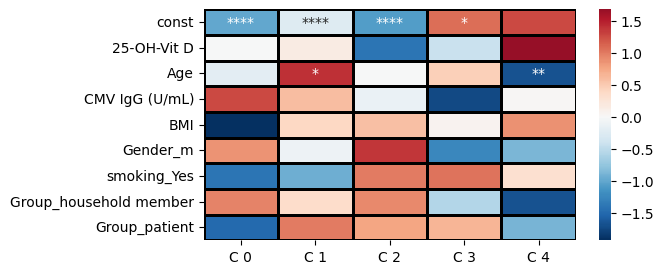

In [48]:
network = []
clus, parameters, pvalues = utils.lr_custom(aggregated, patients, clus_labels_RNA, res_dir)

network = utils.add_to_network(clus, parameters, pvalues, 'LR_reg', network)

## Addition to LR

In [ ]:
clus, parameters, pvalues = utils.lr_custom(aggregated, dep_anx.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels_RNA, res_dir)
clus, parameters, pvalues = utils.lr_custom(aggregated, covid_patients.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels_RNA, res_dir)

KeyError: 'Donor'

## GSEA

In [ ]:
gsea_res = utils.gsea_analysis_single(normalized_counts, clus_labels_RNA, res_dir, hallmark)

# Multiset analysis
utils.gsea_analysis_multi(normalized_counts, clus_labels_RNA, res_dir, path_sets)

# Add GSEA results to the network
[network.append(element) for element in gsea_res]

plotting.draw_network(network, clus_labels_RNA, res_dir)


2024-01-09 15:18:37,574 [WARNING] Dropping duplicated gene names, only keep the first values


2024-01-09 15:18:41,274 [WARNING] Dropping duplicated gene names, only keep the first values
2024-01-09 15:18:44,817 [WARNING] Dropping duplicated gene names, only keep the first values
2024-01-09 15:18:48,478 [WARNING] Dropping duplicated gene names, only keep the first values
2024-01-09 15:18:51,970 [WARNING] Dropping duplicated gene names, only keep the first values
2024-01-09 15:18:55,467 [WARNING] Dropping duplicated gene names, only keep the first values
2024-01-09 15:19:02,469 [WARNING] Dropping duplicated gene names, only keep the first values
2024-01-09 15:19:04,962 [WARNING] Dropping duplicated gene names, only keep the first values
2024-01-09 15:19:36,824 [WARNING] Dropping duplicated gene names, only keep the first values
2024-01-09 15:19:41,937 [WARNING] Dropping duplicated gene names, only keep the first values
2024-01-09 15:19:51,690 [WARNING] Dropping duplicated gene names, only keep the first values
2024-01-09 15:19:58,786 [WARNING] Dropping duplicated gene names, only

<class 'pyvis.network.Network'> |N|=45 |E|=59

# TCR unimodal

## TCR modules

Silhouette score: 0.2448084474015521


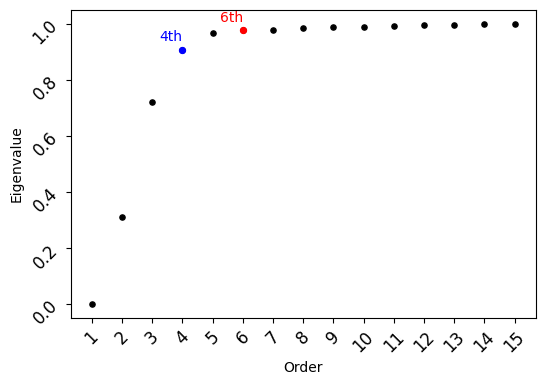

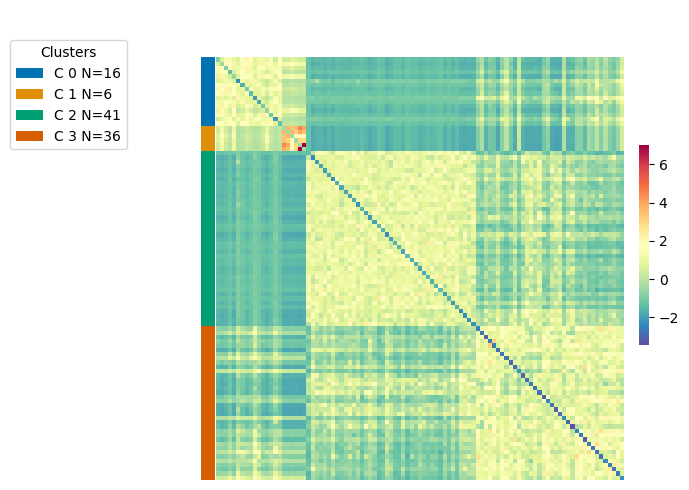

In [31]:
module_counts_tcr

res_dir = results_dir + 'TCR_unimodal_modules/'
dim = module_counts_tcr.shape[0]//10

affinity_tcr_modules = snf.make_affinity(module_counts_tcr.drop(columns = ['Donor']), 
                                        metric = 'braycurtis', K = dim, mu = .5, normalize = True)

plotting.eigengap_visual(affinity_tcr_modules, res_dir)

n_clusters = 4
clus_labels_tcr_modules = utils.spectral_clustering_custom(affinity_tcr_modules, n_clusters)

plotting.draw_clustermap(clus_labels_tcr_modules, affinity_tcr_modules, res_dir, 'standard')

plotting.features_ami([(module_counts_tcr.drop(columns = ['Donor']), 'braycurtis')], clus_labels_tcr_modules, dim, n_clusters, plot_flag = True)

dump = pd.DataFrame()
dump['Donor'] = module_counts_tcr['Donor']
dump['labels_TCR'] = clus_labels_tcr_modules
dump.to_csv('TCR_clusters.csv', sep='\t')

Size of metadata: (89, 1009)
Size of metadata after NaNs removal: (85, 1007)
Shape of the regression input: (85, 8)
C 0
Optimization terminated successfully.
         Current function value: 0.403760
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   85
Model:                          Logit   Df Residuals:                       76
Method:                           MLE   Df Model:                            8
Date:                Lun, 16 Set 2024   Pseudo R-squ.:                 0.05614
Time:                        12:02:21   Log-Likelihood:                -34.320
converged:                       True   LL-Null:                       -36.361
Covariance Type:            nonrobust   LLR p-value:                    0.8496
                             coef    std err          z      P>|z|      [0.0

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



Size of metadata: (58, 1010)
Size of metadata after NaNs removal: (55, 1008)
Shape of the regression input: (55, 8)
C 0
Optimization terminated successfully.
         Current function value: 0.411417
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   55
Model:                          Logit   Df Residuals:                       47
Method:                           MLE   Df Model:                            7
Date:                Lun, 16 Set 2024   Pseudo R-squ.:                 0.07682
Time:                        12:02:22   Log-Likelihood:                -22.628
converged:                       True   LL-Null:                       -24.511
Covariance Type:            nonrobust   LLR p-value:                    0.8063
                             coef    std err          z      P>|z|      [0.0

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffati

   mann_pvalues          features cluster
0  3.797200e-03        entropyCD4     C 0
1  5.088320e-01        entropyCD8     C 0
2  4.565860e-02  tcrcovidmatchCD4     C 0
3  6.359481e-03  tcrcovidmatchCD8     C 0
4  2.962813e-03   tcrcovidfreqCD4     C 0
5  8.929562e-04   tcrcovidfreqCD8     C 0
0  4.066721e-03        entropyCD4     C 1
1  4.168302e-01        entropyCD8     C 1
2  2.298240e-02  tcrcovidmatchCD4     C 1
3  4.152212e-02  tcrcovidmatchCD8     C 1
4  1.441742e-03   tcrcovidfreqCD4     C 1
5  6.573656e-03   tcrcovidfreqCD8     C 1
0  1.252662e-02        entropyCD4     C 2
1  3.881258e-03        entropyCD8     C 2
2  6.089106e-06  tcrcovidmatchCD4     C 2
3  8.375831e-03  tcrcovidmatchCD8     C 2
4  6.860847e-07   tcrcovidfreqCD4     C 2
5  7.218002e-03   tcrcovidfreqCD8     C 2
0  3.102426e-01        entropyCD4     C 3
1  4.205901e-03        entropyCD8     C 3
2  4.915197e-02  tcrcovidmatchCD4     C 3
3  6.896877e-01  tcrcovidmatchCD8     C 3
4  2.214427e-01   tcrcovidfreqCD4 

<class 'pyvis.network.Network'> |N|=10 |E|=13

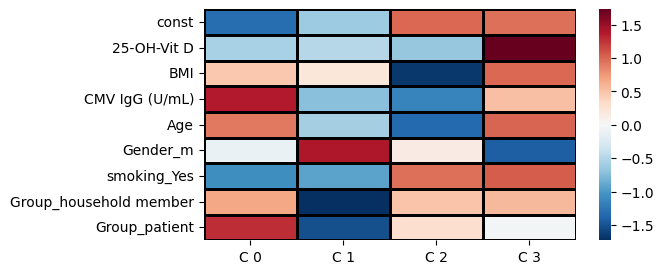

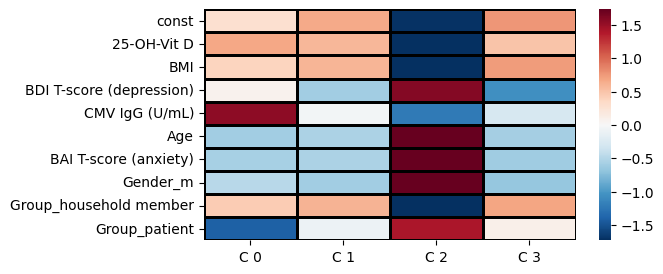

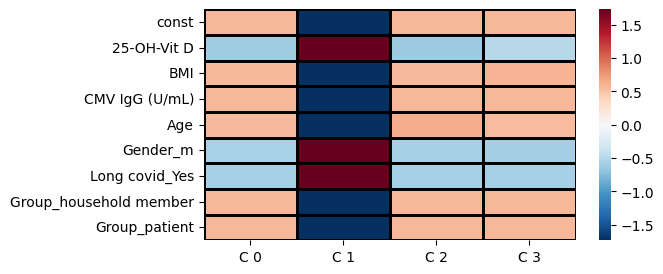

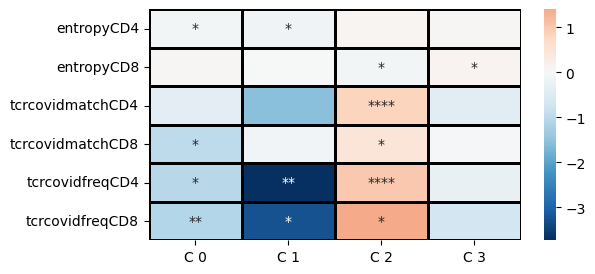

In [32]:
network = []
clus, parameters, pvalues = utils.lr_custom(module_counts_tcr, meta, clus_labels_tcr_modules, res_dir)

network = utils.add_to_network(clus, parameters, pvalues, 'LR_reg', network)

clus, parameters, pvalues = utils.lr_custom(module_counts_tcr, dep_anx.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels_tcr_modules, res_dir)
clus, parameters, pvalues = utils.lr_custom(module_counts_tcr, covid_patients.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels_tcr_modules, res_dir)



res = plotting.mann_sign([(TCR_stats.drop(columns = ['Donor']), 'TCR')], clus_labels_tcr_modules, res_dir)

for r in res:
    network = utils.add_to_network(list(r[0].index), pd.DataFrame(r[1]), pd.DataFrame(r[0].reset_index(drop=True)), r[2], network)

plotting.draw_network(network, clus_labels_tcr_modules, res_dir)

In [46]:
# save TCR results for bubble plot
res[0][0].to_csv('TCR_bubbles_pvalues.csv', sep='\t')
res[0][1].to_csv('TCR_bubbles_coefficients.csv', sep='\t')

## Top Clusters

Silhouette score: 0.5160253426777749


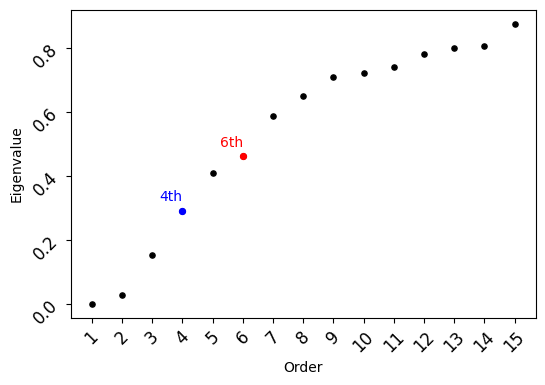

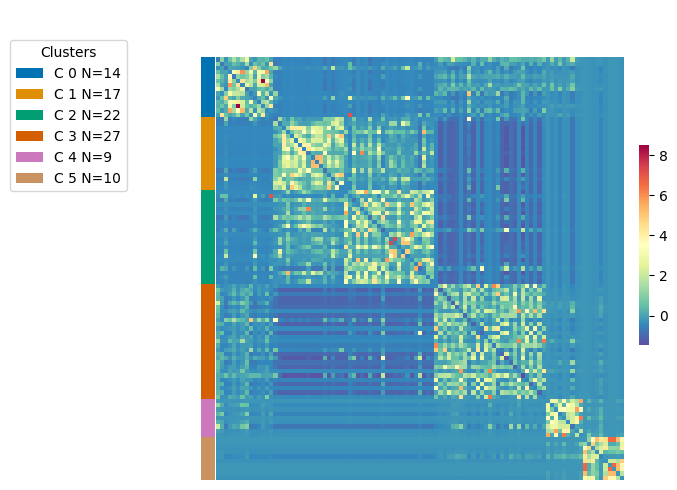

0      0.376178
1      0.477389
2      0.457500
3      0.415709
4      0.442742
         ...   
395    0.105615
396    0.086367
397    0.053361
398    0.175946
399    0.145204
Length: 400, dtype: float64

In [157]:
res_dir = results_dir + 'TCR_unimodal_top/'
dim = tcr_stats_fused_top.shape[0]//10

affinity_tcr_fused_top = snf.make_affinity(tcr_stats_fused_top.drop(columns = ['Donor']), 
                                        metric = 'braycurtis', K = dim, mu = .5, normalize = True)

plotting.eigengap_visual(affinity_tcr_fused_top, res_dir)

n_clusters = 6
clus_labels_tcr = utils.spectral_clustering_custom(affinity_tcr_fused_top, n_clusters)

plotting.draw_clustermap(clus_labels_tcr, affinity_tcr_fused_top, res_dir, 'standard')

plotting.features_ami([(tcr_stats_fused_top.drop(columns = ['Donor']), 'braycurtis')], clus_labels_tcr, dim, n_clusters, plot_flag = True)

In [ ]:
#df_silhouettes = df_silhouettes.append(testing_metrics(tcr_stats_fused_top.drop(columns = ['Donor']), ['euclidean', 'sqeuclidean', 'braycurtis'], range(int(tcr_stats_fused_top.shape[0]*0.05), int(tcr_stats_fused_top.shape[0]*0.15)), 'TCR'))

### Logistic Regression on clusters

Size of metadata: (89, 410)
Size of metadata after NaNs removal: (85, 408)
Shape of the regression input: (85, 8)
C 0
Optimization terminated successfully.
         Current function value: 0.357265
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   85
Model:                          Logit   Df Residuals:                       76
Method:                           MLE   Df Model:                            8
Date:                Gio, 12 Set 2024   Pseudo R-squ.:                  0.1648
Time:                        14:40:44   Log-Likelihood:                -30.368
converged:                       True   LL-Null:                       -36.361
Covariance Type:            nonrobust   LLR p-value:                    0.1518
                             coef    std err          z      P>|z|      [0.025

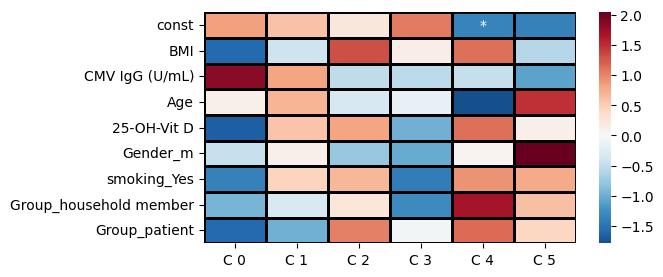

In [158]:
network = []
clus, parameters, pvalues = utils.lr_custom(tcr_stats_fused_top, meta, clus_labels_tcr, res_dir)

network = utils.add_to_network(clus, parameters, pvalues, 'LR_reg', network)

### Addition to LR

Size of metadata: (22, 411)
Size of metadata after NaNs removal: (20, 409)
Shape of the regression input: (20, 9)
C 0
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   20
Model:                          Logit   Df Residuals:                       10
Method:                           MLE   Df Model:                            9
Date:                Mon, 22 Jan 2024   Pseudo R-squ.:                   1.000
Time:                        15:45:27   Log-Likelihood:            -0.00012648
converged:                       True   LL-Null:                       -8.4542
Covariance Type:            nonrobust   LLR p-value:                   0.05017
                               coef    std err          z      P>|z|      [0.0

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



Size of metadata: (58, 410)
Size of metadata after NaNs removal: (55, 408)
Shape of the regression input: (55, 8)
C 0
Optimization terminated successfully.
         Current function value: 0.315379
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   55
Model:                          Logit   Df Residuals:                       47
Method:                           MLE   Df Model:                            7
Date:                Mon, 22 Jan 2024   Pseudo R-squ.:                  0.2396
Time:                        15:45:27   Log-Likelihood:                -17.346
converged:                       True   LL-Null:                       -22.811
Covariance Type:            nonrobust   LLR p-value:                    0.1417
                             coef    std err          z      P>|z|      [0.025

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



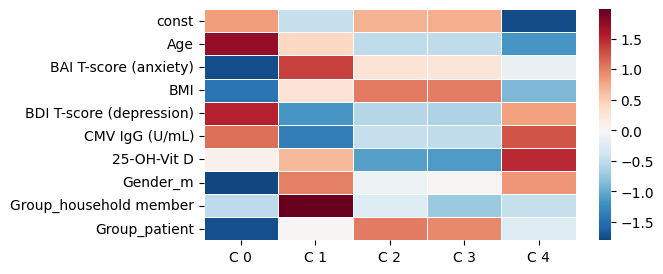

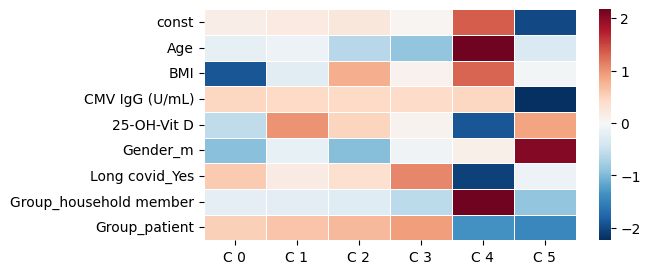

In [ ]:
clus, parameters, pvalues = utils.lr_custom(tcr_stats_fused_top, dep_anx.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels_tcr, res_dir)
clus, parameters, pvalues = utils.lr_custom(tcr_stats_fused_top, covid_patients.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels_tcr, res_dir)

### One vs Rest Testing

   mann_pvalues          features cluster
0      0.797897        entropyCD4     C 0
1      0.699042        entropyCD8     C 0
2      0.252707  tcrcovidmatchCD4     C 0
3      0.742376  tcrcovidmatchCD8     C 0
4      0.675789   tcrcovidfreqCD4     C 0
5      0.682083   tcrcovidfreqCD8     C 0
0      0.805783        entropyCD4     C 1
1      0.080304        entropyCD8     C 1
2      0.054515  tcrcovidmatchCD4     C 1
3      0.189202  tcrcovidmatchCD8     C 1
4      0.012419   tcrcovidfreqCD4     C 1
5      0.233472   tcrcovidfreqCD8     C 1
0      0.314523        entropyCD4     C 2
1      0.096459        entropyCD8     C 2
2      0.501911  tcrcovidmatchCD4     C 2
3      0.401341  tcrcovidmatchCD8     C 2
4      0.597570   tcrcovidfreqCD4     C 2
5      0.445502   tcrcovidfreqCD8     C 2
0      0.030424        entropyCD4     C 3
1      0.984329        entropyCD8     C 3
2      0.004704  tcrcovidmatchCD4     C 3
3      0.715852  tcrcovidmatchCD8     C 3
4      0.001918   tcrcovidfreqCD4 

<class 'pyvis.network.Network'> |N|=3 |E|=2

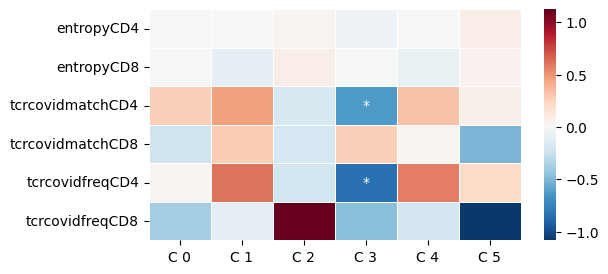

In [ ]:
res = plotting.mann_sign([(TCR_stats.drop(columns = ['Donor']), 'TCR')], clus_labels_tcr, res_dir)

for r in res:
    network = utils.add_to_network(list(r[0].index), pd.DataFrame(r[1]), pd.DataFrame(r[0].reset_index(drop=True)), r[2], network)

plotting.draw_network(network, clus_labels_tcr, res_dir)

## TCR CD4 unimodal

Silhouette score: 0.6382579256975092


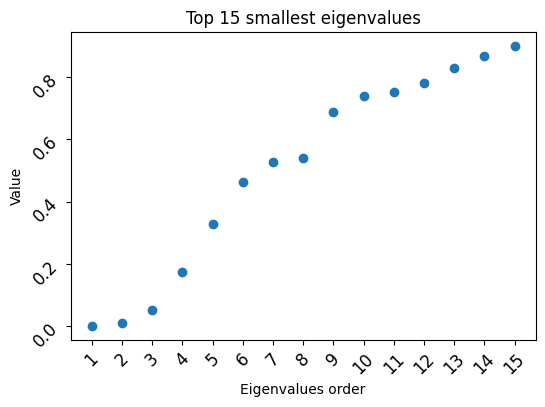

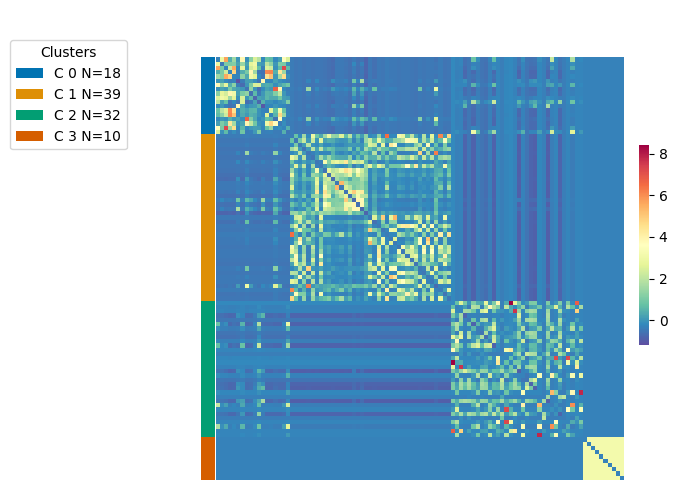

0      0.544833
1      0.612479
2      0.558932
3      0.498476
4      0.483768
         ...   
195    0.352586
196    0.392721
197    0.380000
198    0.511220
199    0.500112
Length: 200, dtype: float64

In [ ]:
res_dir = results_dir + 'TCR_unimodalCD4_top/'

dim = cd4topclusters.shape[0]//10

affinity_tcr4_top = snf.make_affinity(cd4topclusters.drop(columns = ['Donor']), 
                                        metric = 'braycurtis', K = dim, mu = .5, normalize = True)

plotting.eigengap_visual(affinity_tcr4_top, res_dir)

n_clusters = 4
clus_labels_tcr4 = utils.spectral_clustering_custom(affinity_tcr4_top, n_clusters)

plotting.draw_clustermap(clus_labels_tcr4, affinity_tcr4_top, res_dir, 'standard')

plotting.features_ami([(cd4topclusters.drop(columns = ['Donor']), 'braycurtis')], clus_labels_tcr4, dim, n_clusters, plot_flag = True)

### Logistic Regression on clusters

Size of metadata: (89, 209)
Size of metadata after NaNs removal: (85, 207)
Shape of the regression input: (85, 7)
C 0
Optimization terminated successfully.
         Current function value: 0.423755
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   85
Model:                          Logit   Df Residuals:                       77
Method:                           MLE   Df Model:                            7
Date:                Wed, 10 Jan 2024   Pseudo R-squ.:                  0.1238
Time:                        08:51:19   Log-Likelihood:                -36.019
converged:                       True   LL-Null:                       -41.111
Covariance Type:            nonrobust   LLR p-value:                    0.1784
                             coef    std err          z      P>|z|      [0.025

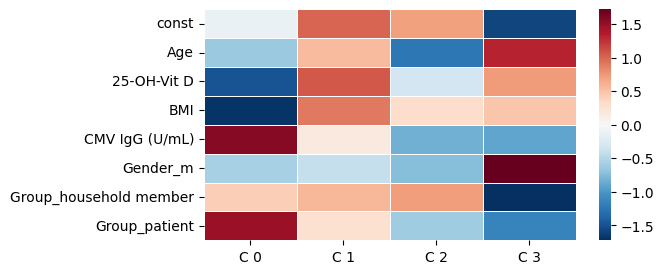

In [ ]:
network = []
clus, parameters, pvalues = utils.lr_custom(cd4topclusters, meta, clus_labels_tcr4, res_dir)

network = utils.add_to_network(clus, parameters, pvalues, 'LR_reg', network)

### Addition to LR

Size of metadata: (22, 211)
Size of metadata after NaNs removal: (20, 209)
Shape of the regression input: (20, 9)
C 0
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   20
Model:                          Logit   Df Residuals:                       10
Method:                           MLE   Df Model:                            9
Date:                Wed, 10 Jan 2024   Pseudo R-squ.:                   1.000
Time:                        08:51:20   Log-Likelihood:            -0.00027391
converged:                       True   LL-Null:                       -10.008
Covariance Type:            nonrobust   LLR p-value:                   0.01782
                               coef    std err          z      P>|z|      [0.0

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



Size of metadata: (58, 210)
Size of metadata after NaNs removal: (55, 208)
Shape of the regression input: (55, 8)
C 0
Optimization terminated successfully.
         Current function value: 0.361680
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   55
Model:                          Logit   Df Residuals:                       47
Method:                           MLE   Df Model:                            7
Date:                Wed, 10 Jan 2024   Pseudo R-squ.:                  0.2772
Time:                        08:51:20   Log-Likelihood:                -19.892
converged:                       True   LL-Null:                       -27.522
Covariance Type:            nonrobust   LLR p-value:                   0.03281
                             coef    std err          z      P>|z|      [0.025

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



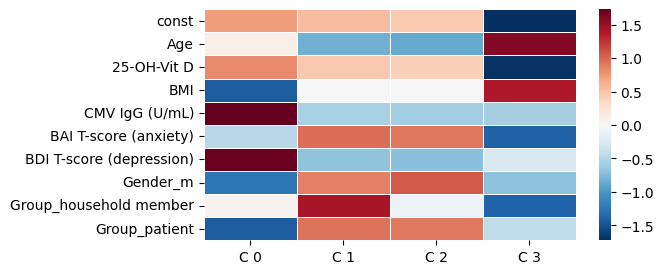

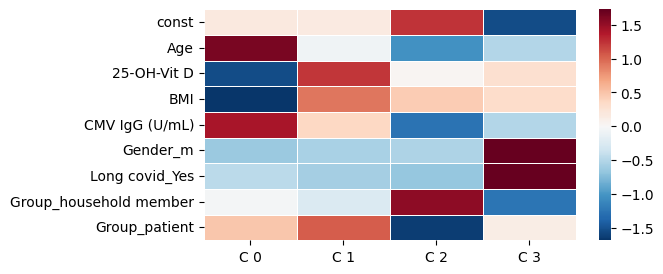

In [ ]:
clus, parameters, pvalues = utils.lr_custom(cd4topclusters, dep_anx.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels_tcr4, res_dir)
clus, parameters, pvalues = utils.lr_custom(cd4topclusters, covid_patients.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels_tcr4, res_dir)

### One vs Rest Testing

<class 'pyvis.network.Network'> |N|=6 |E|=7

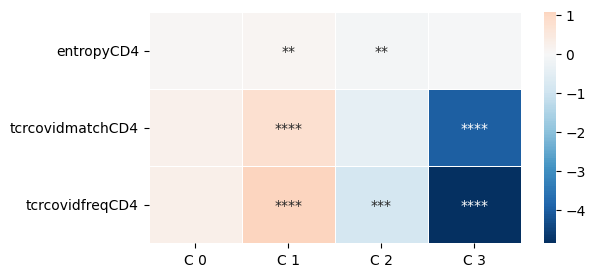

In [ ]:
res = plotting.mann_sign([(TCR_stats.drop(columns = ['Donor', 'entropyCD8', 'tcrcovidmatchCD8', 'tcrcovidfreqCD8']), 'TCR')], clus_labels_tcr4, res_dir)

for r in res:
    network = utils.add_to_network(list(r[0].index), pd.DataFrame(r[1]), pd.DataFrame(r[0].reset_index(drop=True)), r[2], network)

plotting.draw_network(network, clus_labels_tcr4, res_dir)

## TCR CD8 unimodal

Silhouette score: 0.5829237804802321


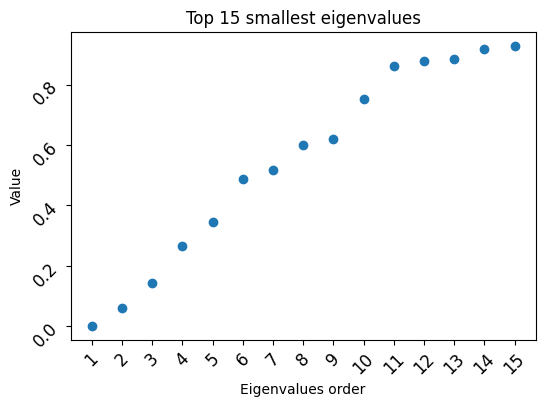

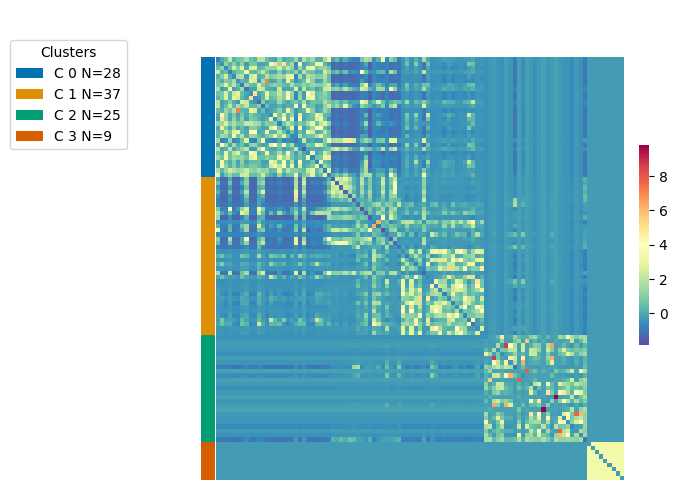

0      0.190345
1      0.316930
2      0.085758
3      0.337505
4      0.262519
         ...   
195    0.097810
196    0.108454
197    0.134335
198    0.224999
199    0.186012
Length: 200, dtype: float64

In [ ]:
res_dir = results_dir + 'TCR_unimodalCD8_top/'

try:
    os.mkdir(res_dir)
except:
    pass


dim = cd8topclusters.shape[0]//10

affinity_tcr8_top = snf.make_affinity(cd8topclusters.drop(columns = ['Donor']), 
                                        metric = 'braycurtis', K = dim, mu = .5, normalize = True)

plotting.eigengap_visual(affinity_tcr8_top, res_dir)

n_clusters = 4
clus_labels_tcr8 = utils.spectral_clustering_custom(affinity_tcr8_top, n_clusters)

plotting.draw_clustermap(clus_labels_tcr8, affinity_tcr8_top, res_dir, 'standard')

plotting.features_ami([(cd8topclusters.drop(columns = ['Donor']), 'braycurtis')], clus_labels_tcr8, dim, n_clusters, plot_flag = True)

### Logistic Regression on clusters

Size of metadata: (89, 209)
Size of metadata after NaNs removal: (85, 207)
Shape of the regression input: (85, 7)
C 0
Optimization terminated successfully.
         Current function value: 0.585246
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   85
Model:                          Logit   Df Residuals:                       77
Method:                           MLE   Df Model:                            7
Date:                Wed, 10 Jan 2024   Pseudo R-squ.:                 0.01666
Time:                        08:51:26   Log-Likelihood:                -49.746
converged:                       True   LL-Null:                       -50.589
Covariance Type:            nonrobust   LLR p-value:                    0.9752
                             coef    std err          z      P>|z|      [0.025

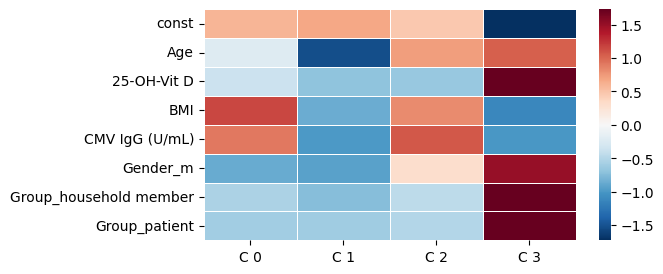

In [ ]:
network = []
clus, parameters, pvalues = utils.lr_custom(cd8topclusters, meta, clus_labels_tcr8, res_dir)

network = utils.add_to_network(clus, parameters, pvalues, 'LR_reg', network)

### Addition to LR

Size of metadata: (22, 211)
Size of metadata after NaNs removal: (20, 209)
Shape of the regression input: (20, 9)
C 0
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   20
Model:                          Logit   Df Residuals:                       10
Method:                           MLE   Df Model:                            9
Date:                Wed, 10 Jan 2024   Pseudo R-squ.:                   1.000
Time:                        08:51:27   Log-Likelihood:            -0.00011811
converged:                       True   LL-Null:                       -12.217
Covariance Type:            nonrobust   LLR p-value:                  0.003665
                               coef    std err          z      P>|z|      [0.0

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp

/Users/fabioaffaticati/Desktop/Work/activ_

Size of metadata: (58, 210)
Size of metadata after NaNs removal: (55, 208)
Shape of the regression input: (55, 8)
C 0
Optimization terminated successfully.
         Current function value: 0.559272
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   55
Model:                          Logit   Df Residuals:                       47
Method:                           MLE   Df Model:                            7
Date:                Wed, 10 Jan 2024   Pseudo R-squ.:                 0.04553
Time:                        08:51:28   Log-Likelihood:                -30.760
converged:                       True   LL-Null:                       -32.227
Covariance Type:            nonrobust   LLR p-value:                    0.8910
                             coef    std err          z      P>|z|      [0.025

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



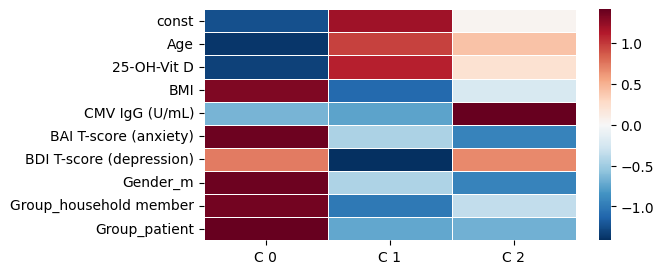

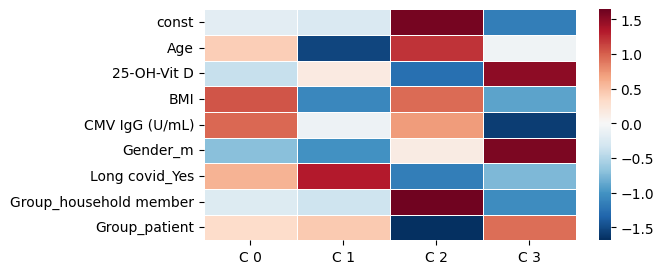

In [ ]:
clus, parameters, pvalues = utils.lr_custom(cd8topclusters, dep_anx.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels_tcr8, res_dir)
clus, parameters, pvalues = utils.lr_custom(cd8topclusters, covid_patients.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels_tcr8, res_dir)

### One vs Rest Testing

<class 'pyvis.network.Network'> |N|=5 |E|=5

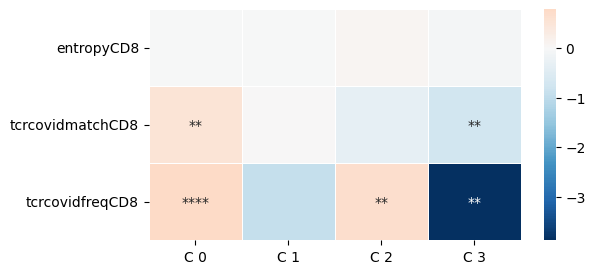

In [ ]:
res = plotting.mann_sign([(TCR_stats.drop(columns = ['Donor', 'entropyCD4', 'tcrcovidmatchCD4', 'tcrcovidfreqCD4']), 'TCR')], clus_labels_tcr8, res_dir)

for r in res:
    network = utils.add_to_network(list(r[0].index), pd.DataFrame(r[1]), pd.DataFrame(r[0].reset_index(drop=True)), r[2], network)

plotting.draw_network(network, clus_labels_tcr8, res_dir)

## Overlap CD4 and CD8 clusters

In [ ]:
chord = pd.DataFrame()
chord['to'] = ['CD8_C ' + val.split(' ')[1] for val in list(clus_labels_tcr8)]
chord['from'] = ['CD4_C ' + val.split(' ')[1] for val in list(clus_labels_tcr4)]
count = chord.groupby(['from', 'to']).size()
chord = count.to_frame(name = 'value').reset_index()
#chord.to_csv(results_dir+'CD4+CD8_chord.csv', sep='\t')

In [ ]:
### Statistical testing
from scipy.stats import fisher_exact

overlap = pd.DataFrame()

overlap['to'] = ['CD8_C_' + val.split(' ')[1] for val in list(clus_labels_tcr8)]
overlap['from'] = ['CD4_C_' + val.split(' ')[1] for val in  list(clus_labels_tcr4)]

overlap_cluster = pd.Series(overlap['from'] + ' ' + overlap['to'])

testing = pd.DataFrame()
testing['Clusters'] = overlap_cluster.copy()

pvals = []

for el in sorted(overlap['from'].unique()):
    for tn in sorted(overlap['to'].unique()):

        print(el, tn)
        table = np.array([  [ len(testing[ (testing['Clusters'].str.startswith(el)) & (testing['Clusters'].str.split(' ').str[1].str.startswith(tn)) ])  ,  len(testing[ (testing['Clusters'].str.startswith(el)) & ~(testing['Clusters'].str.split(' ').str[1].str.startswith(tn)) ]) ],
                           [  len(testing[ ~(testing['Clusters'].str.startswith(el)) & (testing['Clusters'].str.split(' ').str[1].str.startswith(tn)) ])  ,   len(testing[ ~(testing['Clusters'].str.startswith(el)) & ~(testing['Clusters'].str.split(' ').str[1].str.startswith(tn)) ])] ])
        
        print(table)
        res = fisher_exact(table, alternative='two-sided')
        print(f'P-value: {res.pvalue}\n')
        pvals.append(res.pvalue)        

chord['p-value'] = pvals
chord.to_csv(results_dir+'CD4+CD8_chord.csv', sep='\t')

CD4_C_0 CD8_C_0
[[ 2 16]
 [26 55]]
P-value: 0.08823811199151652

CD4_C_0 CD8_C_1
[[12  6]
 [25 56]]
P-value: 0.006758230900210486

CD4_C_0 CD8_C_2
[[ 3 15]
 [22 59]]
P-value: 0.54945842314941

CD4_C_0 CD8_C_3
[[ 1 17]
 [ 8 73]]
P-value: 1.0

CD4_C_1 CD8_C_0
[[18 21]
 [10 50]]
P-value: 0.0026169365147698004

CD4_C_1 CD8_C_1
[[ 9 30]
 [28 32]]
P-value: 0.0204829638423712

CD4_C_1 CD8_C_2
[[10 29]
 [15 45]]
P-value: 1.0

CD4_C_1 CD8_C_3
[[ 2 37]
 [ 7 53]]
P-value: 0.4761801097006617

CD4_C_2 CD8_C_0
[[ 5 27]
 [23 44]]
P-value: 0.06017883940002024

CD4_C_2 CD8_C_1
[[13 19]
 [24 43]]
P-value: 0.6627425803066651

CD4_C_2 CD8_C_2
[[11 21]
 [14 53]]
P-value: 0.21548013432486124

CD4_C_2 CD8_C_3
[[ 3 29]
 [ 6 61]]
P-value: 1.0

CD4_C_3 CD8_C_0
[[ 3  7]
 [25 64]]
P-value: 1.0

CD4_C_3 CD8_C_1
[[ 3  7]
 [34 55]]
P-value: 0.7393920004356124

CD4_C_3 CD8_C_2
[[ 1  9]
 [24 65]]
P-value: 0.4441029962011055

CD4_C_3 CD8_C_3
[[ 3  7]
 [ 6 83]]
P-value: 0.04568898996636729



## TCR CD4 + CD8 fusion

Silhouette score: 0.24858541743420362


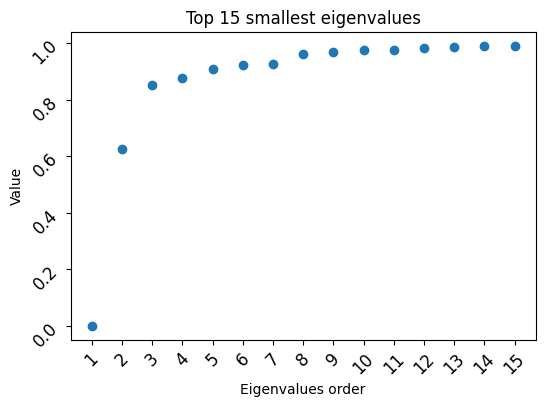

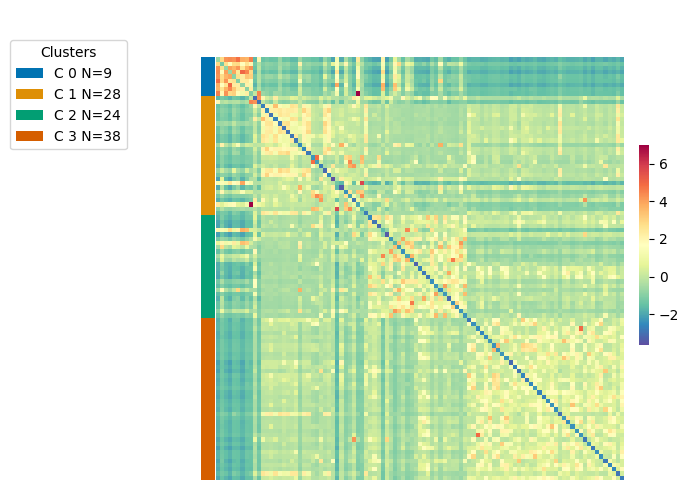

0      0.044997
1      0.023204
2      0.021239
3      0.013914
4      0.012206
         ...   
395    0.039786
396    0.036522
397    0.048980
398    0.053392
399    0.082163
Length: 400, dtype: float64

In [ ]:
res_dir = results_dir + 'TCR_unimodalCD8+CD4_top/'


dim = cd8topclusters.shape[0]//10

affinity_tcr84_top = snf.snf([affinity_tcr8_top, affinity_tcr4_top], K=dim)

plotting.eigengap_visual(affinity_tcr84_top, res_dir)

n_clusters = 4
clus_labels_tcr84 = utils.spectral_clustering_custom(affinity_tcr84_top, n_clusters)

plotting.draw_clustermap(clus_labels_tcr84, affinity_tcr84_top, res_dir, 'standard')

plotting.features_ami([(tcr_stats_fused_top.drop(columns = ['Donor']), 'braycurtis')], clus_labels_tcr84, dim, n_clusters, plot_flag = True)

### Logistic Regression on clusters

Size of metadata: (89, 408)
Size of metadata after NaNs removal: (85, 406)
Shape of the regression input: (85, 5)
C 0
Optimization terminated successfully.
         Current function value: 0.109806
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   85
Model:                          Logit   Df Residuals:                       79
Method:                           MLE   Df Model:                            5
Date:                Wed, 10 Jan 2024   Pseudo R-squ.:                  0.2808
Time:                        08:51:44   Log-Likelihood:                -9.3335
converged:                       True   LL-Null:                       -12.979
Covariance Type:            nonrobust   LLR p-value:                    0.2000
                     coef    std err          z      P>|z|      [0.025      0.

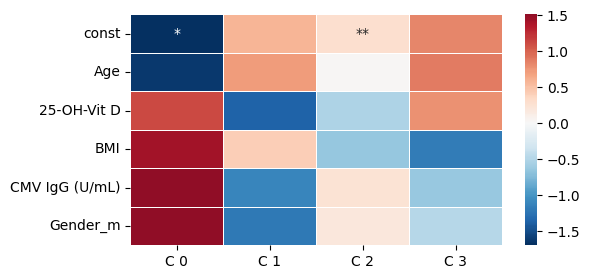

In [ ]:
network = []
clus, parameters, pvalues = utils.lr_custom(tcr_stats_fused_top, meta.drop(columns=['Group']), clus_labels_tcr84, res_dir)

network = utils.add_to_network(clus, parameters, pvalues, 'LR_reg', network)

### Addition to LR

Size of metadata: (22, 411)
Size of metadata after NaNs removal: (20, 409)
Shape of the regression input: (20, 9)
C 1
Optimization terminated successfully.
         Current function value: 0.455695
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   20
Model:                          Logit   Df Residuals:                       10
Method:                           MLE   Df Model:                            9
Date:                Wed, 10 Jan 2024   Pseudo R-squ.:                  0.3229
Time:                        08:51:48   Log-Likelihood:                -9.1139
converged:                       True   LL-Null:                       -13.460
Covariance Type:            nonrobust   LLR p-value:                    0.4661
                               coef    std err          z      P>|z|      [0.0

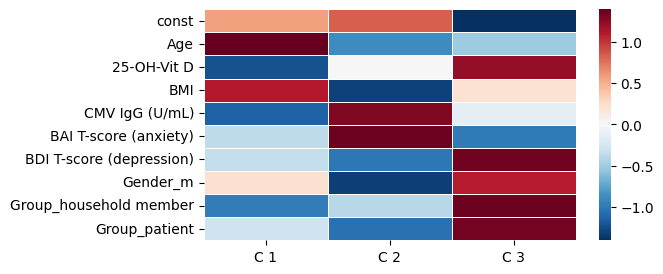

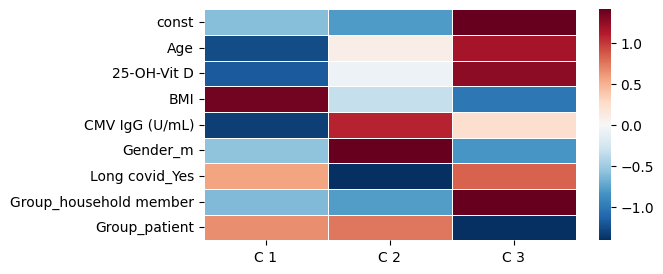

In [ ]:
clus, parameters, pvalues = utils.lr_custom(tcr_stats_fused_top, dep_anx.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels_tcr84, res_dir)
clus, parameters, pvalues = utils.lr_custom(tcr_stats_fused_top, covid_patients.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels_tcr84, res_dir)

### One vs Rest Testing

<class 'pyvis.network.Network'> |N|=8 |E|=9

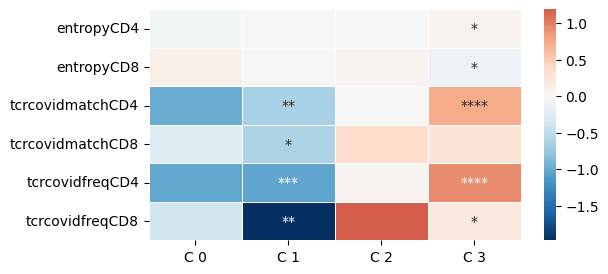

In [ ]:
res = plotting.mann_sign([(TCR_stats.drop(columns = ['Donor']), 'TCR')], clus_labels_tcr84, res_dir)

for r in res:
    network = utils.add_to_network(list(r[0].index), pd.DataFrame(r[1]), pd.DataFrame(r[0].reset_index(drop=True)), r[2], network)

plotting.draw_network(network, clus_labels_tcr84, res_dir)

###  Assign values of the fusion to the overall TCR view

In [131]:
#clus_labels_tcr = clus_labels_tcr84.copy()
clus_labels_tcr = clus_labels_tcr_modules.copy()
#affinity_tcr_fused_top = affinity_tcr84_top.copy()
affinity_tcr_fused_top = affinity_tcr_modules.copy()

# Cytof unimodal

Silhouette score: 0.396577681778258


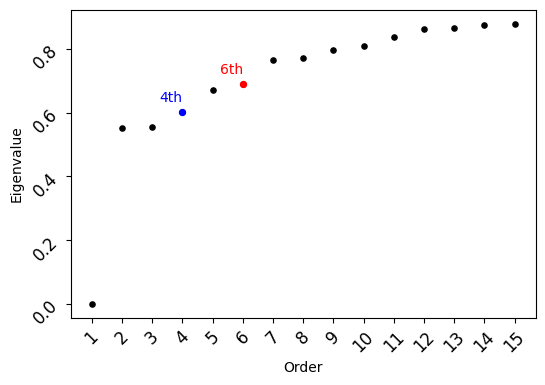

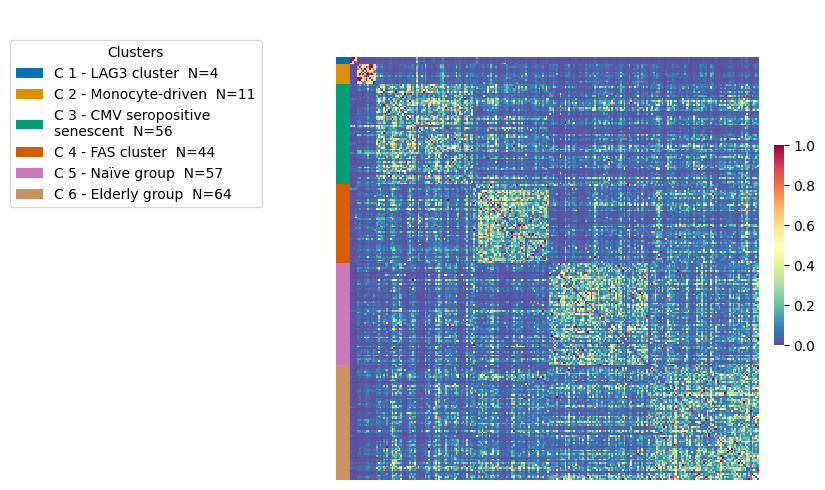

In [111]:
res_dir = results_dir + 'Cytof_unimodal/'
dim = cytof.shape[0]//10

affinity_cytof = snf.make_affinity(cytof, metric = metric, K = dim, mu = .5, normalize = True)

plotting.eigengap_visual(affinity_cytof, res_dir)

n_clusters = 6
clus_labels_cytof = utils.spectral_clustering_custom(affinity_cytof, n_clusters)


plotting.draw_clustermap(clus_labels_cytof.replace({"C 0": "C 1 - LAG3 cluster ",
                        "C 1": "C 2 - Monocyte-driven ",
                        "C 2": "C 3 - CMV seropositive\nsenescent ",
                        "C 3": "C 4 - FAS cluster ",
                        "C 4": "C 5 - Naïve group ",
                        "C 5": "C 6 - Elderly group "}), affinity_cytof, res_dir, 'minmax')


ami = plotting.features_ami([(cytof, metric)], clus_labels_cytof, dim, n_clusters, plot_flag = True)

plotting.draw_pca(cytof, pd.DataFrame(clus_labels_cytof, columns = ['clus_labels']),
               'clus_labels', 'clus_labels', 'Cytof clustered SNF')

dump = pd.DataFrame()
dump['Donor'] = cytof_meta['Donor']
dump['labels_Cytof'] = clus_labels_cytof
dump.to_csv('Cytof_clusters.csv', sep='\t')

In [66]:
temp = cytof_meta.copy()
temp['labels'] = clus_labels_cytof

#temp['MC9+16+18'] = temp[['Metacluster 9', 'Metacluster 16', 'Metacluster 18']].sum(axis=1)
#temp['all_others'] = temp[['Metacluster 1', 'Metacluster 2', 'Metacluster 3', 'Metacluster 4', 'Metacluster 5', 'Metacluster 6', 'Metacluster 7', 'Metacluster 8', 'Metacluster 10', 'Metacluster 11', 'Metacluster 12', 'Metacluster 13', 'Metacluster 14', 'Metacluster 15', 'Metacluster 17', 'Metacluster 20', 'Metacluster 21']].sum(axis=1)
#temp['Metacluster 0'] = all_cytof['Metacluster 0']
import plotly.graph_objects as go

print(temp)
fig = go.Figure()

for col in temp.columns[:-2]:
    fig.add_trace(go.Box(y = temp[col], x = temp['labels'], name = col, boxpoints='all', jitter=0.3))

fig.update_layout(
    yaxis_title='Cell percentages',
    xaxis_title='cluster',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    boxmode='group',
    width=1200, height=700
)
fig.update_xaxes(categoryorder='array', 
                 categoryarray= sorted(set((temp['labels']))))
fig.write_html(res_dir + "boxplots_distributions.html")
fig.show()

#fig = go.Figure()
#for col in ['MC9+16+18', 'Metacluster 19', 'all_others']:
#    fig.add_trace(go.Box(y = temp[col], x = temp['labels'], name = col, boxpoints='all', jitter=0.3))

#fig.update_layout(
#    yaxis_title='Cell percentages',
#    xaxis_title='cluster',
#    paper_bgcolor='rgb(243, 243, 243)',
#    plot_bgcolor='rgb(243, 243, 243)',
#    boxmode='group',
#    width=1200, height=700
#)
#fig.update_xaxes(categoryorder='array', 
#                 categoryarray= sorted(set((temp['labels']))))
#fig.write_html(res_dir + "grouped_boxplots_distributions.html")
#ig.show()

     Sen_CD8+Temra  Sen_CD4+Tem  Exh_CD4+Tef   CD8+Tcm  Exh_CD4+Tcm  \
0         1.141687     0.022097     0.826434  1.518812    21.132259   
1        10.877180     4.225352     1.644409  0.469484    12.732005   
2         6.611636     0.290403     2.357036  1.947290    32.799602   
3         8.236766     0.115223     1.725046  0.213985    16.806031   
4         0.293684     0.078240     3.061572  0.691688    16.067581   
..             ...          ...          ...       ...          ...   
231       5.046742     0.086413     2.776437  0.185171    22.414625   
232      29.005618     9.733522     2.207350  0.187272    11.812698   
233       0.826884     0.092759     2.806636  1.476201    21.218064   
234       5.091071     3.020255     1.586177  0.328761    17.280732   
235       4.614626     0.771158     5.447395  0.451810    22.366665   

     CD4+Tregs       NKT  Exh_CD4+Th2cm         NK   CD8+Tem  ...  \
0     2.000530  0.201821       0.592204   4.982175  1.371498  ...   
1     0.8

## Stability analysis

Run 0:
Silhouette score: 0.4033793565881931
Silhouette score: 0.39189151628942814
Silhouette score: 0.38722424067363803


/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:714: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Silhouette score: 0.40649571306779264


/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:714: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Silhouette score: 0.4067097265047854


/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:714: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Silhouette score: 0.3818544553671342


/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:714: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Silhouette score: 0.3746094850945167


/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:714: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Silhouette score: 0.4002444518715347


/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:714: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Silhouette score: 0.39261223497827236
Silhouette score: 0.332889200702103
Run 1:
Silhouette score: 0.38372016732340175
Silhouette score: 0.3643436818780549
Silhouette score: 0.4108859319635355
Silhouette score: 0.3687537555436008
Silhouette score: 0.3969429573511686
Silhouette score: 0.4074493940306536
Silhouette score: 0.3844570631844101
Silhouette score: 0.3782464776216241
Silhouette score: 0.39811974369227543
Silhouette score: 0.4142266679574862
Run 2:
Silhouette score: 0.3812590721385094
Silhouette score: 0.40466696128218965
Silhouette score: 0.3938034447280918
Silhouette score: 0.3822000598047549
Silhouette score: 0.3927177253177686
Silhouette score: 0.3358956743474434
Silhouette score: 0.394728851724487
Silhouette score: 0.42223335856211364
Silhouette score: 0.3952849397917292
Silhouette score: 0.39362069144627443
Run 3:
Silhouette score: 0.4032256437766896
Silhouette score: 0.4134013983933541
Silhouette score: 0.40631239715927325
Silhouette score: 0.34992331451527353
Silhouette 

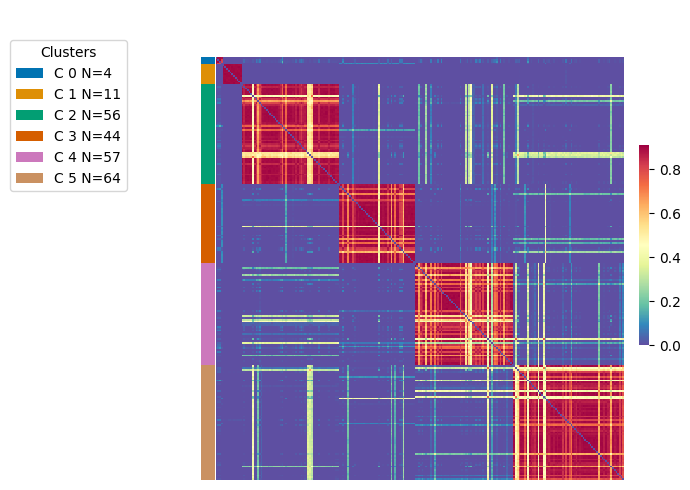

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/seaborn/categorical.py:82: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/seaborn/categorical.py:1296: UserWarning:

54.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/seaborn/categorical.py:1296: UserWarning:

49.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/seaborn/categorical.py:1296: UserWarning:

52.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/en

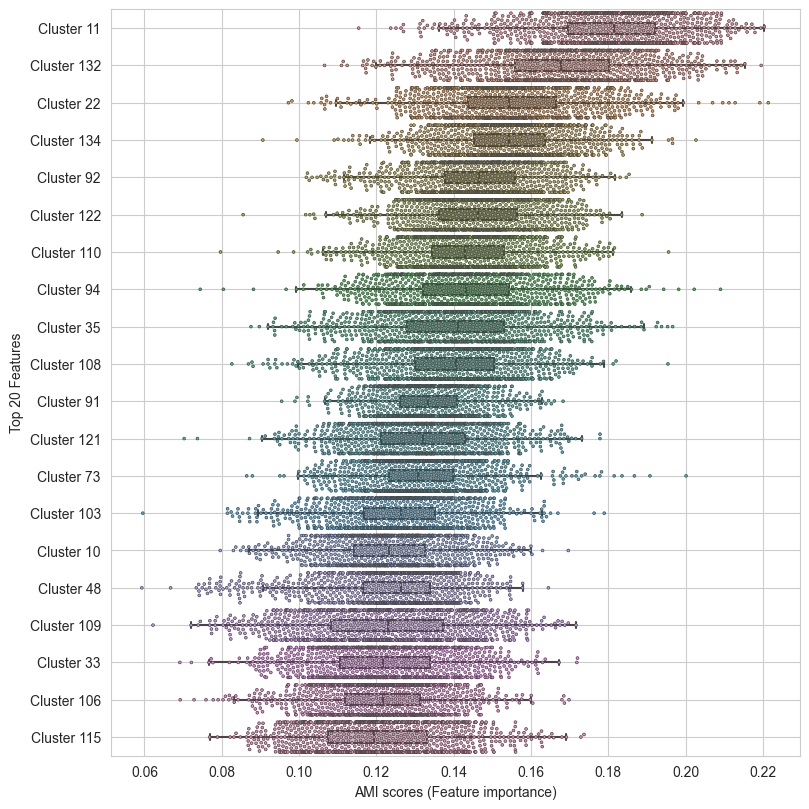

In [68]:
cooccurrence, amis = utils.stability_analysis(cytof, cytof_meta['Donor'], metric, dim, n_clusters, 1000, 10, False)

plotting.draw_clustermap(clus_labels_cytof, (cooccurrence).to_numpy(), res_dir, 'no')

plotting.ami_boxplots(amis, cytof.columns, res_dir)

Silhouette score: 0.940409127929429


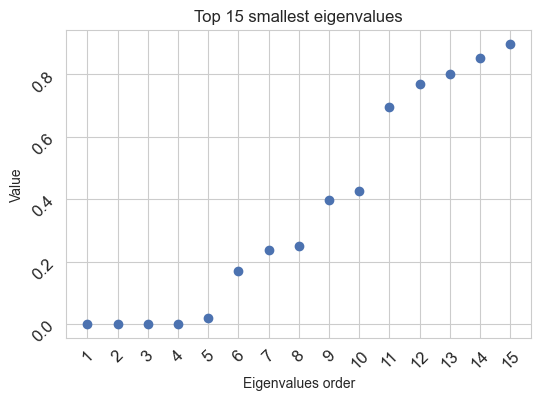

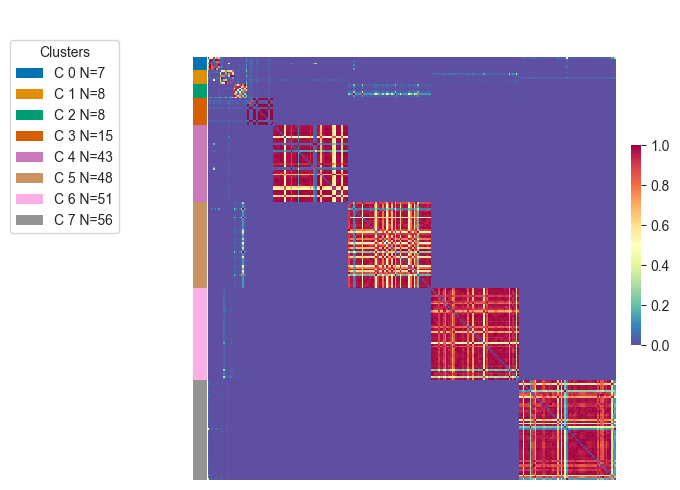

In [20]:
affinity = snf.make_affinity(cooccurrence, metric = metric, K = dim, mu = .5, normalize = True)

plotting.eigengap_visual(affinity, res_dir)

clus_labels = utils.spectral_clustering_custom(affinity, n_clusters+1)

plotting.draw_clustermap(clus_labels, affinity, res_dir, 'minmax')

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



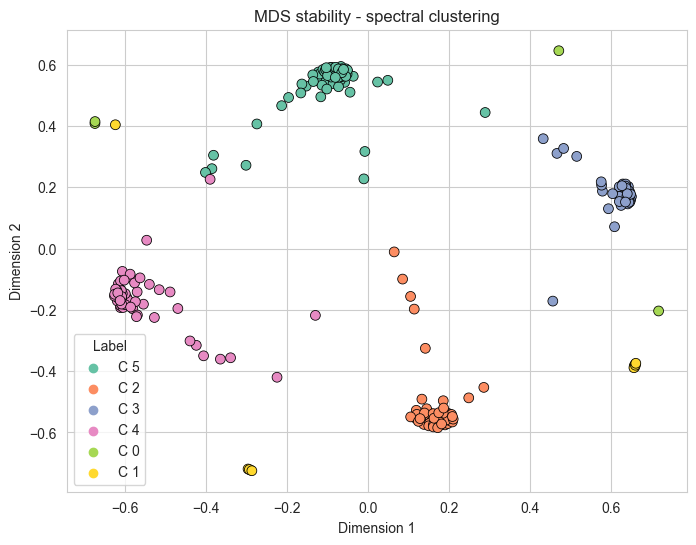

In [21]:
from sklearn.manifold import MDS
# Convert similarity matrix to dissimilarity matrix (required for MDS)
dissimilarity_matrix = 1 - cooccurrence

# Apply Multidimensional Scaling (MDS)
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42, max_iter = 1000)
embedding = mds.fit_transform(dissimilarity_matrix)

# Create a DataFrame for Seaborn
df = pd.DataFrame({'X': embedding[:, 0], 'Y': embedding[:, 1], 'Label': clus_labels_cytof})

# Plot the scatter plot with Seaborn
plt.figure(figsize=(8, 6))
sns.scatterplot(x='X', y='Y', hue='Label', data=df, palette='Set2', edgecolor='k', s=50)


# Annotate the points with labels
#for i, label in enumerate(clus_labels):
#    plt.text(embedding[i, 0], embedding[i, 1], label, fontsize=12)

# Show the plot
plt.title('MDS stability - spectral clustering')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()

In [15]:
# Convert similarity matrix to dissimilarity matrix (required for MDS)
dissimilarity_matrix = 1 - cooccurrence

# Apply Multidimensional Scaling (MDS)
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42, max_iter = 1000)
embedding = mds.fit_transform(dissimilarity_matrix)

# Create a DataFrame for Seaborn
df = pd.DataFrame({'X': embedding[:, 0], 'Y': embedding[:, 1], 'Label': clus_labels_cytof})

kmeans = KMeans(n_clusters=10, random_state=0, n_init="auto").fit(df[['X', 'Y']])
df['kmeans_labels'] = kmeans.labels_



# Compute Euclidean distances to assigned centroids
distances = cdist(df[['X', 'Y']], kmeans.cluster_centers_, metric='euclidean')
distances = pd.Series([d[l] for l, d in zip(kmeans.labels_, distances)])

# Set a threshold for identifying distant points
threshold = .15  # Adjust as needed

# Identify distant points
df.loc[df[distances > threshold].index, 'Label'] = -1


plt.figure(figsize=(8, 6))

sns.scatterplot(x='X', y='Y', hue='Label', data=df, palette='Set2', edgecolor='k', s=50)



# Annotate the points with labels
#for i, label in enumerate(df['Label']):
#    plt.text(embedding[i, 0], embedding[i, 1], label, fontsize=12)

# Show the plot
plt.title('MDS Kmeans')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



NameError: name 'KMeans' is not defined

In [16]:
chord = pd.DataFrame()
chord['to'] = clus_labels_cytof

chord['from'] = clus_labels
chord['from'] = chord['from'].str.replace('C 0','Stable C 0')
chord['from'] = chord['from'].str.replace('C 1','Unstable')
chord['from'] = chord['from'].str.replace('C 2','Stable C 1')
chord['from'] = chord['from'].str.replace('C 3','Stable C 2')
chord['from'] = chord['from'].str.replace('C 4','Stable C 4')
chord['from'] = chord['from'].str.replace('C 5','Stable C 3')
chord['from'] = chord['from'].str.replace('C 6','Stable C 5')

In [17]:
#chord['from'] = ['Stable C ' + str(int(val.split(' ')[1])-1) if (int(val.split(' ')[1])-1) >= 0 else 'Unstable' for val in list(clus_labels)]
count = chord.groupby(['from', 'to']).size()
chord = count.to_frame(name = 'value').reset_index()
chord.to_csv(results_dir+'cytof_chord.csv', sep='\t')
chord

,from,to,value
0,Stable C 0,C 4,1
1,Stable C 0,C 5,6
2,Stable C 1,C 0,4
3,Stable C 1,C 1,11
4,Stable C 2,C 3,43
5,Stable C 3,C 2,51
6,Stable C 4,C 4,49
7,Stable C 5,C 5,56
8,Unstable,C 2,5
9,Unstable,C 3,1


In [ ]:
chord = pd.read_csv(results_dir+'cytof_chord.csv', sep='\t')
chord.drop(columns = ['Unnamed: 0'], inplace = True)
chord['from'].replace({'Stable C 3': 'Stable C 4', 'Stable C 4': 'Stable C 3'}, inplace=True)
chord.to_csv(results_dir+'cytof_chord.csv', sep='\t')
chord

,from,to,value
0,Stable C 0,C 0,18
1,Stable C 0,C 1,1
2,Stable C 1,C 1,32
3,Stable C 2,C 2,55
4,Stable C 4,C 4,57
5,Stable C 3,C 3,57
6,Stable C 5,C 5,106
7,Unstable,C 2,5
8,Unstable,C 3,2
9,Unstable,C 4,2


In [ ]:
#df_silhouettes = df_silhouettes.append(testing_metrics(cytof, ['euclidean', 'sqeuclidean', 'braycurtis'], range(int(cytof.shape[0]*0.05), int(cytof.shape[0]*0.15)), 'Cytof'))

## Logistic Regression on clusters

Size of metadata: (233, 32)
Size of metadata after NaNs removal: (217, 30)
Shape of the regression input: (217, 8)
C 0
Optimization terminated successfully.
         Current function value: 0.067827
         Iterations: 63
         Function evaluations: 65
         Gradient evaluations: 65
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                  217
Model:                          Logit   Df Residuals:                      208
Method:                           MLE   Df Model:                            8
Date:                Ven, 21 Giu 2024   Pseudo R-squ.:                  0.2618
Time:                        16:13:47   Log-Likelihood:                -14.718
converged:                       True   LL-Null:                       -19.937
Covariance Type:            nonrobust   LLR p-value:                    0.2356
                             coef    std err          z      P>|z|      [0.02

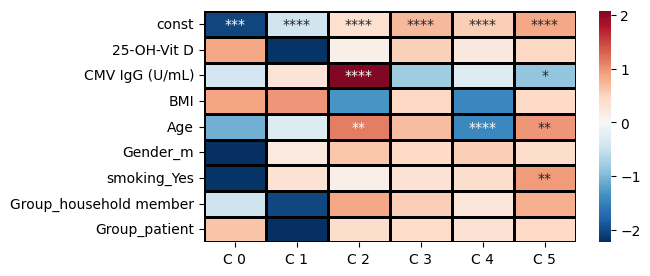

In [42]:
network = []
clus, parameters, pvalues = utils.lr_custom(cytof_meta, meta, clus_labels_cytof, res_dir)

network = utils.add_to_network(clus, parameters, pvalues, 'LR_reg', network)

## Addition to LR

Size of metadata: (62, 33)
Size of metadata after NaNs removal: (57, 31)
Shape of the regression input: (57, 9)
C 0
Optimization terminated successfully.
         Current function value: 0.151730
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations: 69
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   57
Model:                          Logit   Df Residuals:                       47
Method:                           MLE   Df Model:                            9
Date:                Fri, 09 Feb 2024   Pseudo R-squ.:                  0.2641
Time:                        15:30:52   Log-Likelihood:                -8.6486
converged:                       True   LL-Null:                       -11.753
Covariance Type:            nonrobust   LLR p-value:                    0.7189
                               coef    std err          z      P>|z|      [0.025

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp



Size of metadata: (65, 32)
Size of metadata after NaNs removal: (62, 30)
Shape of the regression input: (62, 7)
C 0
Optimization terminated successfully.
         Current function value: 0.063910
         Iterations: 58
         Function evaluations: 60
         Gradient evaluations: 60
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   62
Model:                          Logit   Df Residuals:                       55
Method:                           MLE   Df Model:                            6
Date:                Fri, 09 Feb 2024   Pseudo R-squ.:                  0.5515
Time:                        15:30:52   Log-Likelihood:                -3.9624
converged:                       True   LL-Null:                       -8.8354
Covariance Type:            nonrobust   LLR p-value:                    0.1358
                     coef    std err          z      P>|z|      [0.025      0.97

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



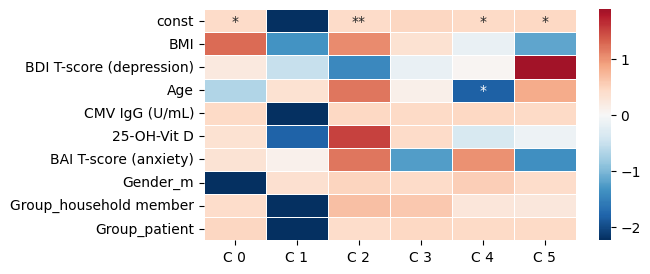

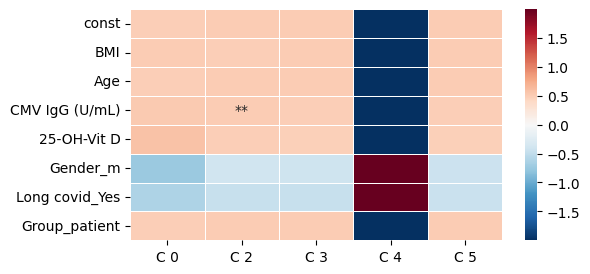

In [43]:
clus, parameters, pvalues = utils.lr_custom(cytof_meta, dep_anx.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels_cytof, res_dir)
clus, parameters, pvalues = utils.lr_custom(cytof_meta, covid_patients.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels_cytof, res_dir)

## Cytof clusters analysis

Cytof number of columns 22
No need to drop Donor


/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:522: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<class 'pyvis.network.Network'> |N|=30 |E|=69

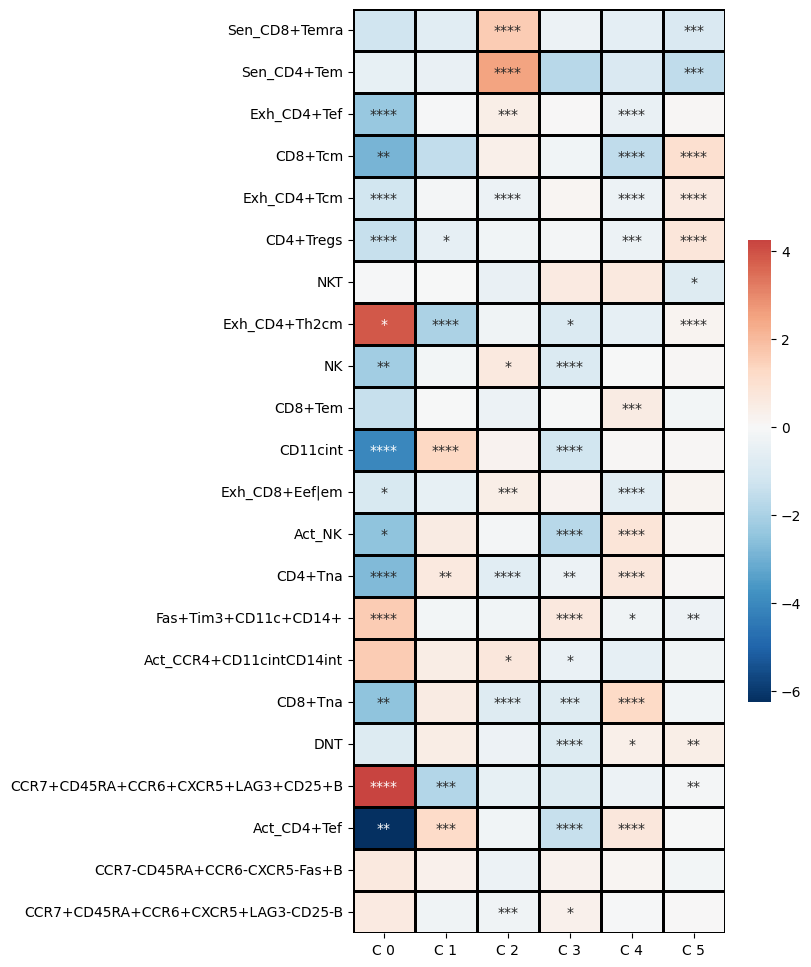

In [45]:
r = utils.cytof_clusters_analysis(cytof_meta.drop(columns='Donor'), clus_labels_cytof, res_dir)

network = utils.add_to_network(list(r[0].index), pd.DataFrame(r[1]), pd.DataFrame(r[0].reset_index(drop=True)), r[2], network)



# for every element in the list network, take the 'table' element and split it
for element in network:
    if element['target'] == 'C 0':
        element['target'] = 'LAG3 cluster'
    if element['target'] == 'C 1':
        element['target'] = 'Monocyte-driven'
    if element['target'] == 'C 2':
        element['target'] = 'CMV seropositive\nsenescent'
    if element['target'] == 'C 3':
        element['target'] = 'FAS cluster'
    if element['target'] == 'C 4':
        element['target'] = 'Naïve group'
    if element['target'] == 'C 5':
        element['target'] = 'Elderly group'
        

clus_labels = clus_labels_cytof.copy()
# replace values in a pd.Series
clus_labels.replace({'C 0': 'LAG3 cluster', 'C 1': 'Monocyte-driven', 'C 2': 'CMV seropositive\nsenescent', 'C 3': 'FAS cluster', 'C 4': 'Naïve group', 'C 5': 'Elderly group'}, inplace=True)

plotting.draw_network(network, clus_labels, res_dir)

# Microbiome unimodal

In [ ]:
# chord = pd.DataFrame()

Silhouette score: 0.2292481254562651


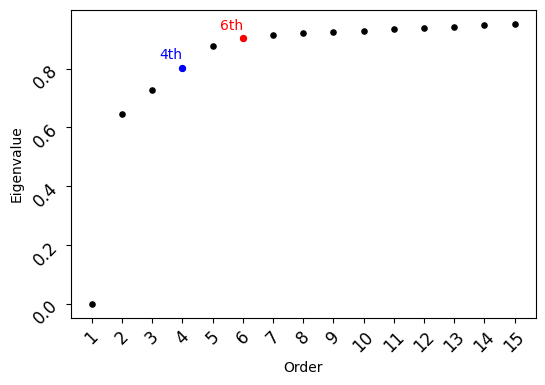

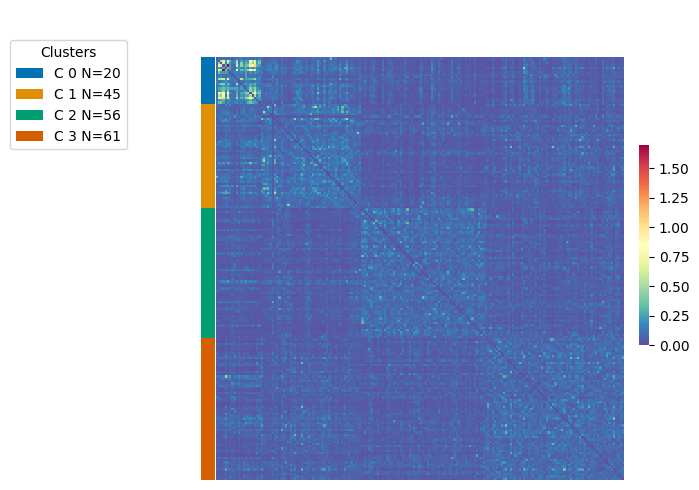

In [150]:
res_dir = results_dir + 'Microbiome_unimodal/'
#dim = micro_fused_rel.drop(columns=['Donor']).shape[0]//10
dim = pose.shape[0]//10

affinity_microbe = snf.make_affinity(pose, metric = 'braycurtis', K = dim, 
                                      mu = .5, normalize = True)

plotting.eigengap_visual(affinity_microbe, res_dir)

n_clusters = 4
clus_labels_micro = utils.spectral_clustering_custom(affinity_microbe, n_clusters)

plotting.draw_clustermap(clus_labels_micro, affinity_microbe, res_dir, 'no')

plotting.features_ami([(pose, 'braycurtis')], clus_labels_micro, dim, n_clusters, plot_flag = True)

dump = pd.DataFrame()
dump['Donor'] = micro_fused_rel['Donor']
dump['labels_Micro'] = clus_labels_micro
dump.to_csv('Micro_clusters.csv', sep='\t')

In [151]:
temp_micro = micro_fused_rel.copy()
temp_micro['to'] = 'M_' + clus_labels_micro
temp_cytof = cytof_meta.copy()
temp_cytof['from'] = 'C_' + clus_labels_cytof


count = pd.merge(temp_micro, temp_cytof, on = 'Donor', how = 'inner')[['Donor', 'to', 'from']].groupby(['to', 'from']).size()
aux = count.to_frame(name = 'value').reset_index()
aux.to_csv(results_dir+'cytof_vs_microbiome.csv', sep='\t')
pd.merge(temp_micro, temp_cytof, on = 'Donor', how = 'inner')[['Donor', 'to', 'from']].to_csv(results_dir+'randindexpermu.csv', sep='\t')

In [152]:
temp = micro_fused_rel.copy()
temp['labels'] = clus_labels_micro
pd.merge(temp.query('labels == "C 0"'), meta, how = 'inner', left_on = 'Donor', right_on='Subjectnr')

,Donor,t1,t10,t101,t1014,t1015,t102,t1029,t103,t104,...,t994,labels,Subjectnr,Group,Age,Gender,CMV IgG (U/mL),BMI,25-OH-Vit D,smoking
0,Covid PT001,0.031912,0.002081,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,C 0,Covid PT001,patient,70.0,m,38.40,39.682540,15.0,0.0
1,Covid PT060,0.000000,0.023502,0.000000,0.0,0.0,0.000000,0.0,0.000230,0.000000,...,0.000000,C 0,Covid PT060,patient,60.0,f,0.15,28.628792,18.0,0.0
2,Covid PT068,0.485828,0.018825,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,C 0,Covid PT068,patient,46.0,m,0.15,42.265427,16.0,0.0
3,Covid PT072,0.753246,0.005762,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,C 0,Covid PT072,patient,42.0,f,0.15,53.345527,14.0,0.0
4,Covid PT083,0.096167,0.044669,0.000000,0.0,0.0,0.002892,0.0,0.000000,0.000000,...,0.000000,C 0,Covid PT083,patient,52.0,m,0.15,23.268698,19.0,0.0
5,Covid PT097,0.114849,0.008913,0.000000,0.0,0.0,0.000000,0.0,0.000108,0.000065,...,0.000000,C 0,Covid PT097,patient,54.0,f,0.15,30.468750,30.0,0.0
6,Covid PT103,0.594498,0.005456,0.000000,0.0,0.0,0.000000,0.0,0.001045,0.000000,...,0.000000,C 0,Covid PT103,patient,57.0,m,0.15,28.726788,24.0,0.0
7,Covid PT117,0.006283,0.012565,0.000000,0.0,0.0,0.003770,0.0,0.001257,0.000568,...,0.000000,C 0,Covid PT117,patient,62.0,m,0.15,29.168692,21.0,0.0
8,Covid PT135,0.306325,0.008602,0.000000,0.0,0.0,0.000000,0.0,0.000618,0.001371,...,0.000000,C 0,Covid PT135,patient,51.0,f,500.00,28.282828,18.0,0.0
9,Covid PT148,0.219516,0.013898,0.001261,0.0,0.0,0.000000,0.0,0.002266,0.000107,...,0.000000,C 0,Covid PT148,patient,66.0,f,57.50,32.596372,30.0,0.0


In [153]:
pd.DataFrame(micro_fused_rel.drop(columns=['Donor'])).to_csv('microbial_unimodal_adonis.csv')
adonis_labels = pd.DataFrame()
adonis_labels['labels'] = clus_labels_micro
adonis_labels['Donor'] = micro_fused['Donor']
adonis_labels.to_csv('adonis_labels.csv')

In [154]:
plotting.draw_pca(micro_fused_rel.drop(columns=['Donor']), pd.DataFrame(clus_labels_micro, columns = ['clus_labels']),
               'clus_labels', 'clus_labels', 'Micro clustered SNF')

In [155]:
clus_labels_micro

0      C 3
1      C 2
2      C 3
3      C 2
4      C 3
      ... 
177    C 2
178    C 3
179    C 3
180    C 2
181    C 2
Length: 182, dtype: object

     Shannon index  Simpson index  Chao1 richness Cluster
0         5.404588       0.956193           143.0     C 3
1         4.803342       0.890112           165.0     C 2
2         6.020344       0.971639           166.0     C 3
3         5.100961       0.901752           169.0     C 2
4         5.396443       0.961326           104.0     C 3
..             ...            ...             ...     ...
177       4.564746       0.888319           129.0     C 2
178       5.887697       0.970314           158.0     C 3
179       5.129678       0.945811           109.0     C 3
180       6.146568       0.973593           189.0     C 2
181       5.613101       0.960746           132.0     C 2

[182 rows x 4 columns]
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C 0 vs. C 1: ns
C 1 vs. C 2: ****
C 2 vs. C 3: ns
C 0 vs. C 2: ****
C 1 vs. C 3: ****
C 

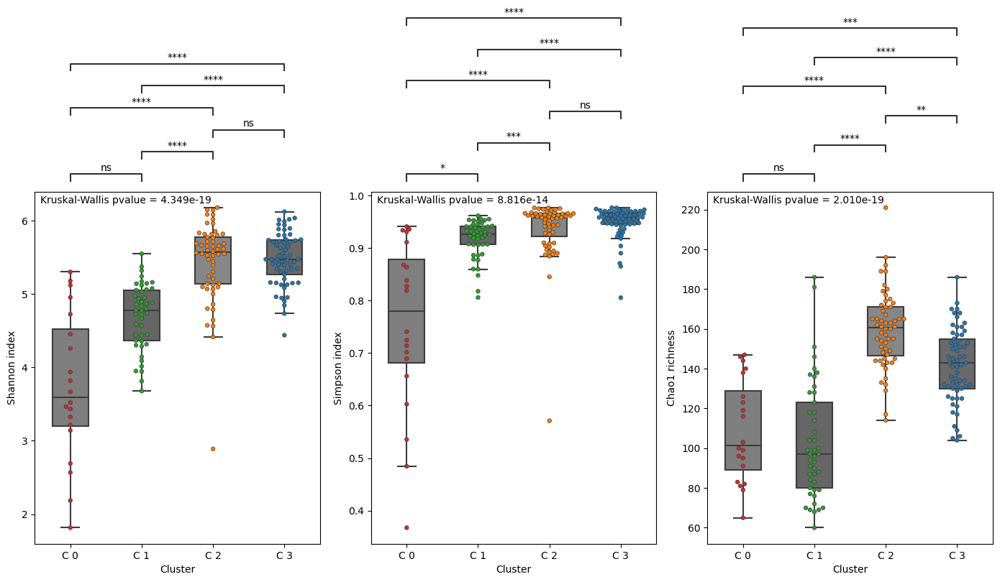

In [156]:
plotting.alpha_diversity_microbiome(micro_fused_rel.drop(columns=['Donor']), micro_fused_rel['Donor'], clus_labels_micro, res_dir)

In [157]:
# chord['from'] = clus_labels_micro

In [158]:
# res_dir = results_dir + 'Microbiome_unimodal/'
# dim = micro_fused_rel.shape[0]//10

# affinity_microbe = snf.make_affinity(micro_fused_rel.drop(columns = ['Donor']), metric = 'braycurtis', K = dim, 
#                                       mu = .5, normalize = True)

# plotting.eigengap_visual(affinity_microbe, res_dir)

# n_clusters = 4
# clus_labels_micro = utils.spectral_clustering_custom(affinity_microbe, n_clusters)

# plotting.draw_clustermap(clus_labels_micro, affinity_microbe, res_dir, 'no')

# taxa_list = [list(micro_taxa[micro_taxa['taxon_id'] == taxon]['taxon_name'])[0] for taxon in micro_fused_rel.drop(columns = ['Donor']).columns]
# rel_counts = micro_fused_rel.drop(columns = ['Donor'])
# rel_counts.columns = taxa_list

# plotting.features_ami([(rel_counts, 'braycurtis')], clus_labels_micro, dim, n_clusters)

In [159]:
# chord['to'] = clus_labels_micro
# chord['from'] = ['EC ' + val.split(' ')[1] for val in chord['from']]
# count = chord.groupby(['from', 'to']).size()
# chord = count.to_frame(name = 'value').reset_index()
# chord.to_csv(results_dir+'chord.csv', sep='\t')
# chord

In [160]:
# taxa_list = [list(micro_taxa[micro_taxa['taxon_id'] == taxon]['taxon_name'])[0] for taxon in micro_fused_rel.drop(columns = ['Donor']).columns]
# temp = micro_fused_rel.copy()
# temp.drop(columns = ['Donor'], inplace=True)
# temp.columns = taxa_list
# temp

In [161]:
#df_silhouettes = df_silhouettes.append(testing_metrics(micro_fused_rel.drop(columns = ['Donor']), ['euclidean','sqeuclidean', 'braycurtis'], range(int(micro_fused_rel.shape[0]*0.05), int(micro_fused.shape[0]*0.15)), 'Micro'))
#g = sns.FacetGrid(df_silhouettes, col="n_clusters", row='dataset', hue="metric", sharex=False)
#g.map(sns.scatterplot, "dimension", "silhouette", alpha=.7)
#g.add_legend()
#plt.savefig('results/silhouettes.png', bbox_inches='tight', dpi=600)

In [162]:
temp = pd.DataFrame()
temp['sample_id'] = micro_fused_rel['Donor']
temp['Clusters'] = clus_labels_micro
temp.to_csv(data_dir+'clus_labels.csv', sep='\t')

temp =  micro_fused_rel.copy()
temp.rename(columns  = {'Donor': 'Taxon'}, inplace=True)
temp =  temp.set_index('Taxon')
temp = temp.T
temp.to_csv(results_dir + 'relative_abundances_forplot.csv', sep='\t')

## Logistic Regression on clusters

Size of metadata: (177, 397)
Size of metadata after NaNs removal: (167, 395)
Shape of the regression input: (167, 8)
Bacteroidaceae-driven
Optimization terminated successfully.
         Current function value: 0.552018
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                  167
Model:                          Logit   Df Residuals:                      158
Method:                           MLE   Df Model:                            8
Date:                Mar, 17 Set 2024   Pseudo R-squ.:                 0.03224
Time:                        14:54:53   Log-Likelihood:                -92.187
converged:                       True   LL-Null:                       -95.258
Covariance Type:            nonrobust   LLR p-value:                    0.6312
                             coef    std err          z  

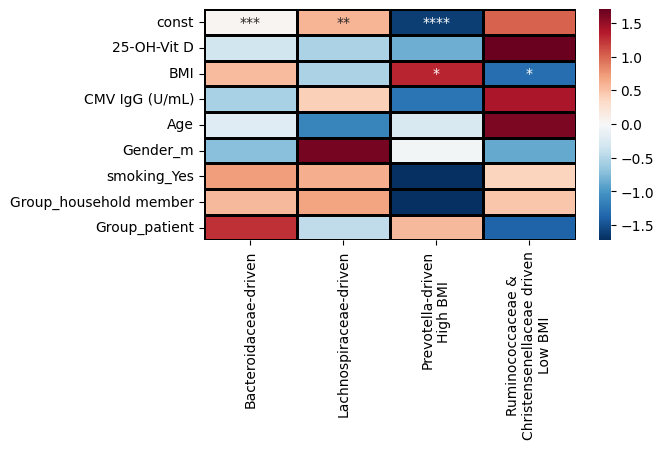

In [163]:
clus, parameters, pvalues = utils.lr_custom(micro_fused, meta, clus_labels_micro.replace({"C 0": "Prevotella-driven\nHigh BMI ",
                        "C 1": "Bacteroidaceae-driven",
                        "C 2": "Ruminococcaceae &\nChristensenellaceae driven\nLow BMI",
                        "C 3": "Lachnospiraceae-driven"}), res_dir)

Size of metadata: (177, 397)
Size of metadata after NaNs removal: (167, 395)
Shape of the regression input: (167, 8)
C 0
Optimization terminated successfully.
         Current function value: 0.307312
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                  167
Model:                          Logit   Df Residuals:                      158
Method:                           MLE   Df Model:                            8
Date:                Mar, 17 Set 2024   Pseudo R-squ.:                  0.1327
Time:                        14:54:54   Log-Likelihood:                -51.321
converged:                       True   LL-Null:                       -59.173
Covariance Type:            nonrobust   LLR p-value:                   0.04682
                             coef    std err          z      P>|z|      [0.

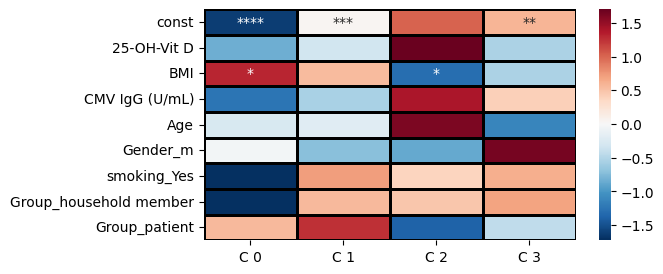

In [164]:
network = []
clus, parameters, pvalues = utils.lr_custom(micro_fused, meta, clus_labels_micro, res_dir)

network = utils.add_to_network(clus, parameters, pvalues, 'LR_reg', network)

## Addition to LR

In [246]:
clus, parameters, pvalues = utils.lr_custom(micro_fused, dep_anx.merge(meta, left_on = 'Subjectnr', right_on='Subjectnr', how = 'inner').reset_index(drop=True), clus_labels_micro, res_dir)
clus, parameters, pvalues = utils.lr_custom(micro_fused, covid_patients.merge(meta, left_on = 'Subjectnr', right_on='Subjectnr', how = 'inner').reset_index(drop=True), clus_labels_micro, res_dir)

KeyError: 'Donor'

## One vs Rest Testing

In [267]:
aux = micro_data_norm.set_index('genename').T
aux.columns = [list(micro_taxa[micro_taxa['taxon_name'] == taxon]['taxon_id'])[0] for taxon in aux.columns]
aux.reset_index(inplace=True)



res = micro_analysis(aux, clus_labels_micro, micro_taxa, res_dir)

#[network.append(element) for element in res]

## GSEA on BACTERIA

Cluster C 0
Cluster C 1
Cluster C 2
Cluster C 3


<class 'pyvis.network.Network'> |N|=9 |E|=14

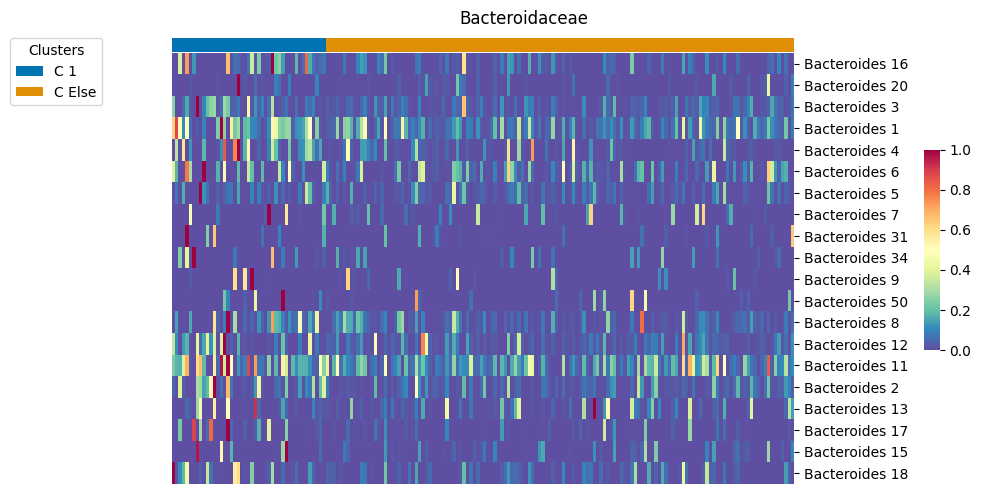

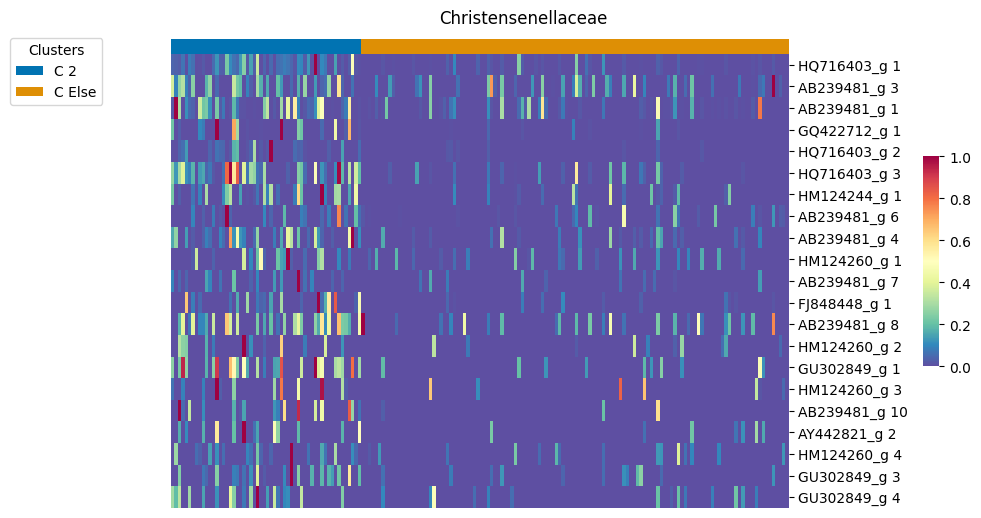

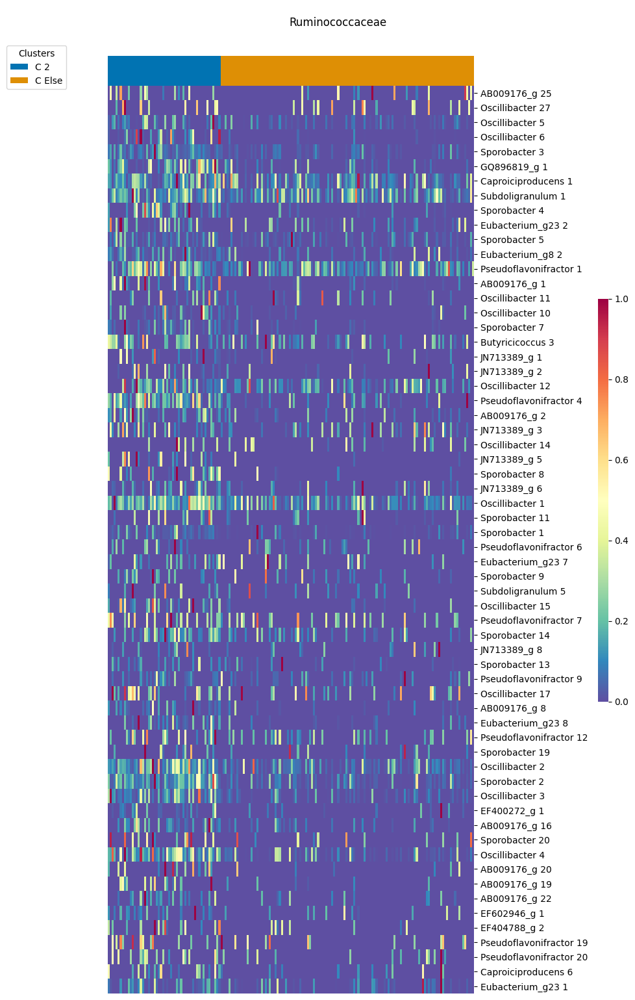

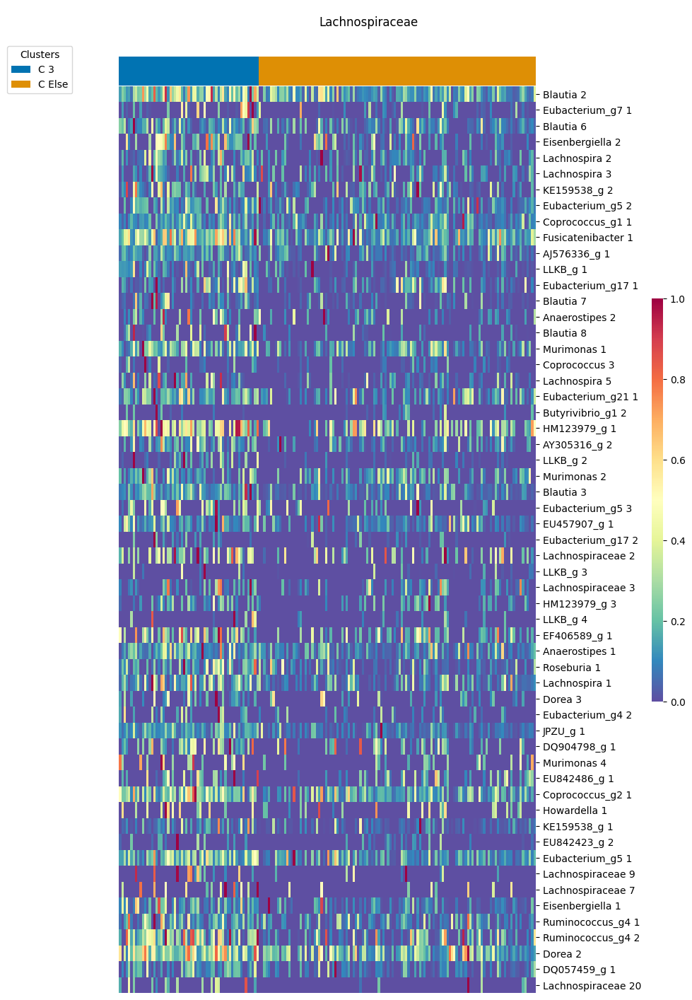

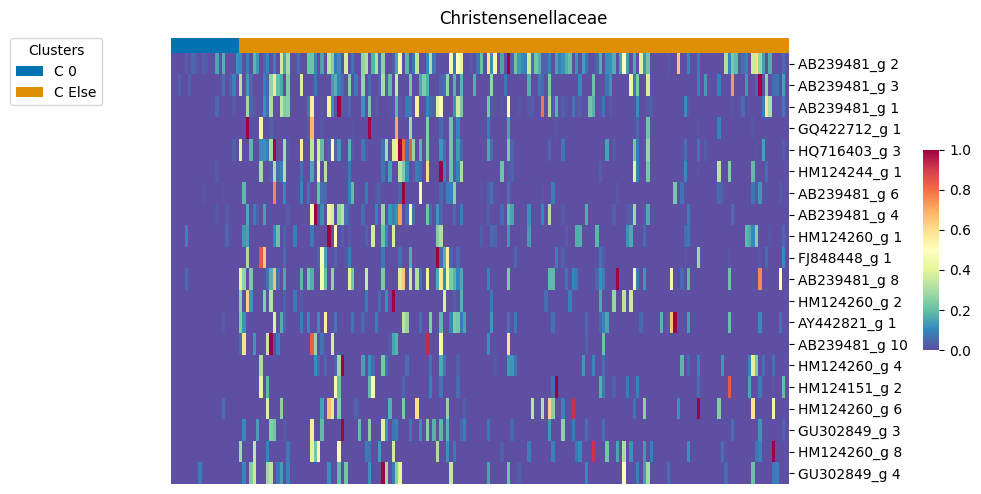

...

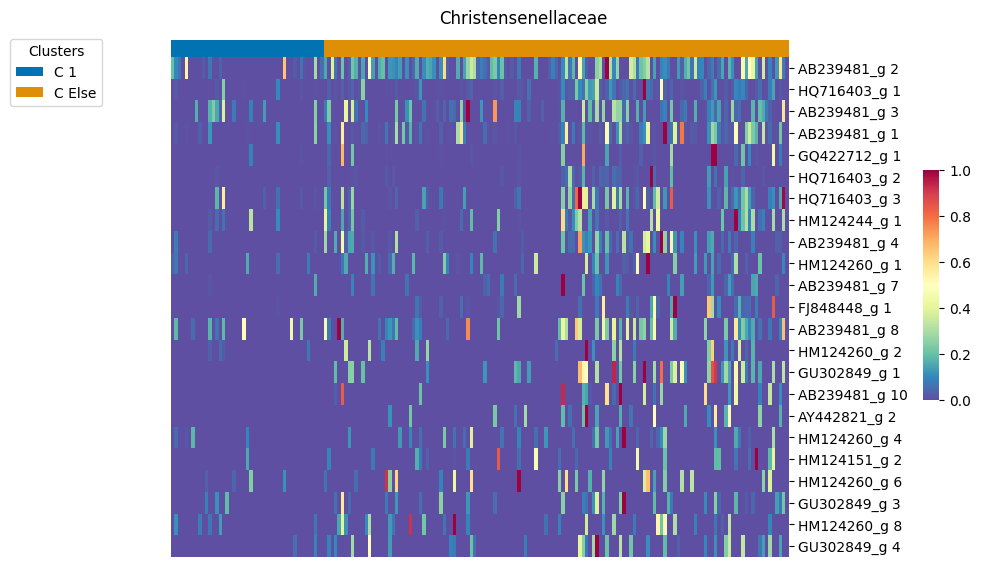

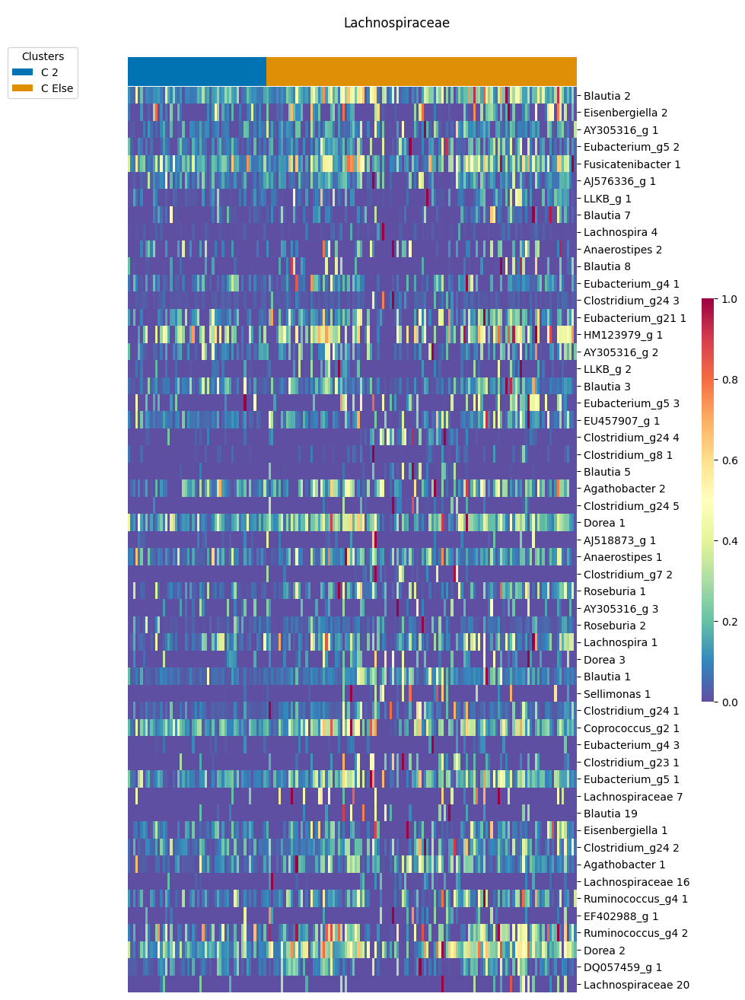

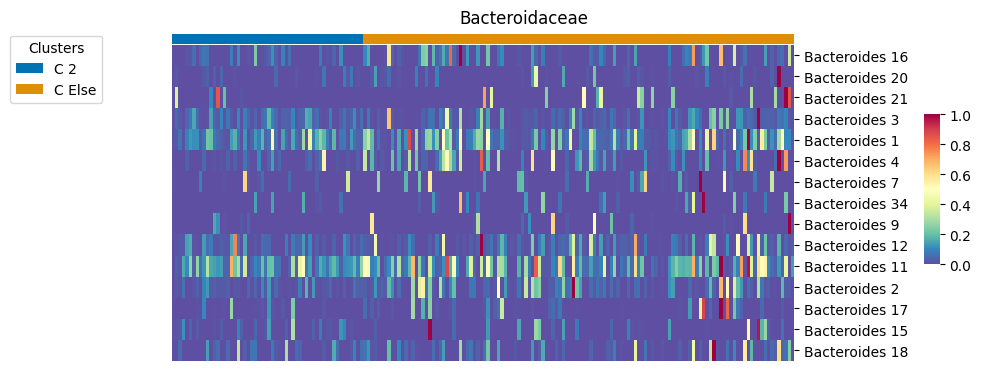

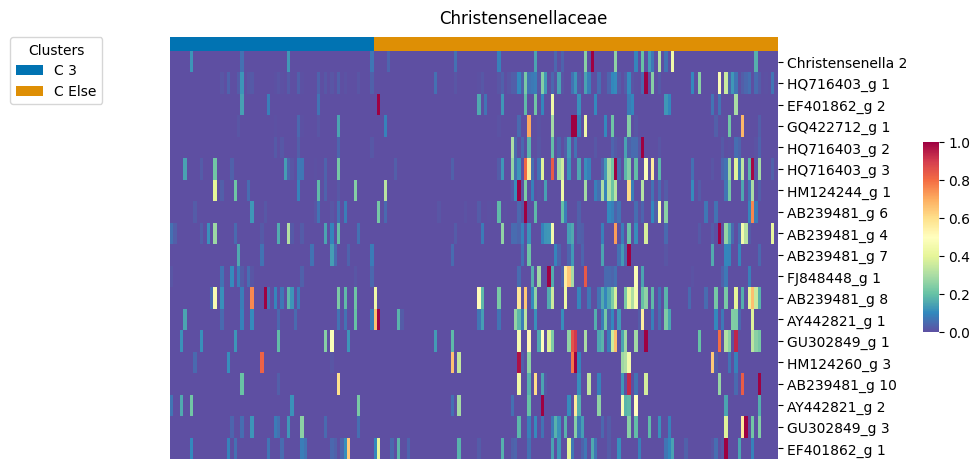

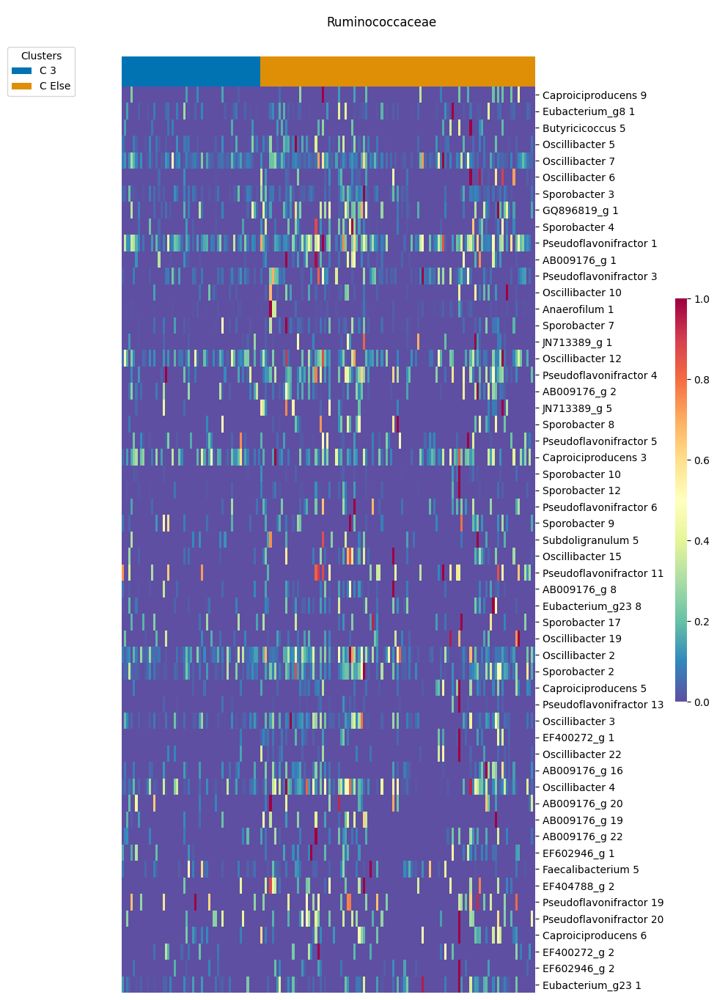

In [142]:
res = utils.gsea_analysis_bacteria(micro_data_norm, clus_labels_micro, res_dir, [custom_bacteria_gene_lists])

[network.append(element) for element in res]

utils.plot_heatmaps_gsea_bacteria(res, micro_fused_rel, clus_labels_micro, micro_taxa, res_dir)

plotting.draw_network(network, clus_labels_micro, res_dir)

In [143]:
gsea_bacteria_bubble = [el for el in network if el['origin'] == 'GSEA_bacteria']
for el in gsea_bacteria_bubble:
    el['weight']*=2
pd.DataFrame(gsea_bacteria_bubble).to_csv('micro_unimodal_bubbleplot.csv', sep='\t')

# TCRseq vs RNAseq

In [132]:
RNA_shared = aggregated[aggregated['Donor'].isin(tcr_stats_fused_top['Donor'])]
tcr_shared = tcr_stats_fused_top[tcr_stats_fused_top['Donor'].isin(aggregated['Donor'])]
tcr_shared.reset_index(drop = True, inplace = True)
RNA_shared.reset_index(drop=True, inplace = True)

In [133]:
# RNA
idx = list(set(range(affinity_RNA.shape[0])).difference(list(aggregated[~aggregated['Donor'].isin(tcr_stats_fused_top['Donor'])].index)))
affinity_RNA_mod = affinity_RNA[np.ix_(idx,idx)]
print(affinity_RNA_mod.shape)
# TCR
idx = list(set(range(affinity_tcr_fused_top.shape[0])).difference(list(tcr_stats_fused_top[~tcr_stats_fused_top['Donor'].isin(aggregated['Donor'])].index)))
affinity_tcr_fused_top_mod = affinity_tcr_fused_top[np.ix_(idx,idx)]
print(affinity_tcr_fused_top_mod.shape)

(86, 86)
(86, 86)


Silhouette score: 0.1403376007484052


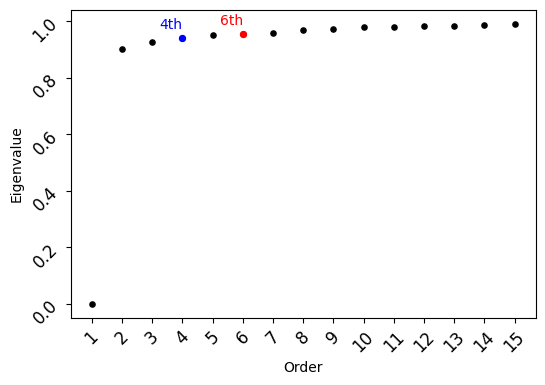

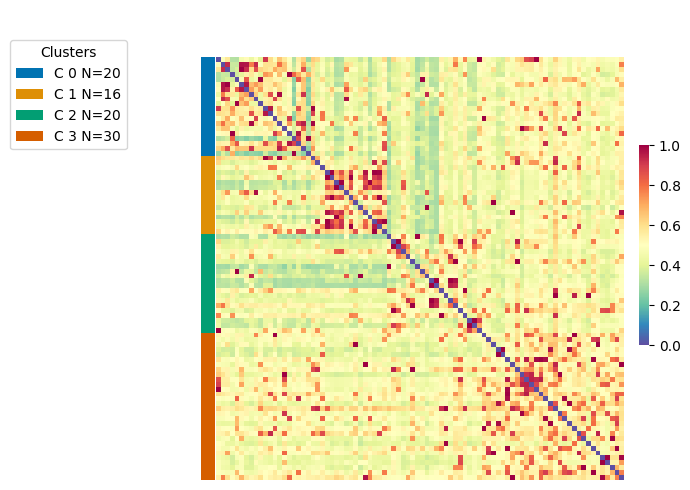

In [134]:
res_dir = results_dir + 'TCR+RNA/'
dim = affinity_RNA_mod.shape[0]//10

affinity_rna_tcr = snf.snf([affinity_RNA_mod, affinity_tcr_fused_top_mod], K=dim)

plotting.eigengap_visual(affinity_rna_tcr, res_dir)

n_clusters = 4
clus_labels = utils.spectral_clustering_custom(affinity_rna_tcr, n_clusters)

plotting.draw_clustermap(clus_labels, affinity_rna_tcr, res_dir, 'minmax')

## Check wether infected

Cluster C 0
covid    0   1
labels        
False   16  50
True    13   7
SignificanceResult(statistic=0.1723076923076923, pvalue=0.0012200963670643916)
Cluster C 2
covid    0   1
labels        
False   24  42
True     5  15
SignificanceResult(statistic=1.7142857142857142, pvalue=0.4253699539671593)
Cluster C 3
covid    0   1
labels        
False   23  33
True     6  24
SignificanceResult(statistic=2.787878787878788, pvalue=0.05829914559294643)
Cluster C 1
covid    0   1
labels        
False   24  46
True     5  11
SignificanceResult(statistic=1.1478260869565218, pvalue=1.0)


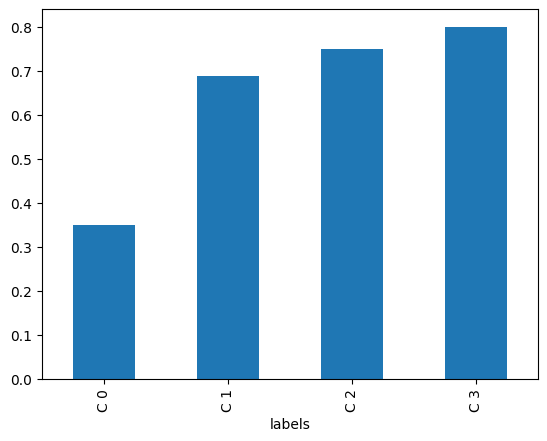

In [115]:
df = tcr_shared['Donor']
df = pd.DataFrame(df)
df['labels'] = clus_labels
# if Donor in covid_patients, then 1, else 0
df['covid'] = df['Donor'].isin(covid_patients['Donor']).astype(int)
# plot the ratio of covid patients in each cluster
df.groupby('labels')['covid'].mean().plot(kind='bar')

# all labels that are not 'C 0' call them 'other'
#df['labels'] = df['labels'].replace('C 0', 'C 0').replace(df['labels'].unique()[1:], 'other')
table = pd.crosstab(df['labels'], df['covid'])
# do a fisher exact test for all clusters
for cluster in df['labels'].unique():
    print(f'Cluster {cluster}')
    table = pd.crosstab(df['labels'] == cluster, df['covid'])
    print(table)
    from scipy.stats import fisher_exact
    print(fisher_exact(table, alternative='two-sided'))

In [116]:
iggs = pd.merge(df, pd.read_csv('data/Covid_IgG.csv', sep=',').rename(columns={'donor': 'Donor'}), on = 'Donor', how = 'inner')
iggs['labels'] = iggs['labels'].replace('C 0', 'C 0').replace(iggs['labels'].unique()[1:], 'other')
sns.swarmplot(data=iggs, y='RBD', x = 'labels', hue='labels')
# do a mann whitney test between C 0 and the rest of the clusters
from scipy.stats import mannwhitneyu

print(mannwhitneyu(iggs[iggs['labels'] == 'C 0']['RBD'], iggs[iggs['labels'] == 'other']['RBD']))
print(mannwhitneyu(iggs[iggs['labels'] == 'C 0']['NP'], iggs[iggs['labels'] == 'other']['NP']))
print(mannwhitneyu(iggs[iggs['labels'] == 'C 0']['S1-S2'], iggs[iggs['labels'] == 'other']['S1-S2']))

FileNotFoundError: [Errno 2] No such file or directory: 'data/Covid_IgG.csv'

## Logistic Regression on clusters

Size of metadata: (86, 410)
Size of metadata after NaNs removal: (82, 408)
Shape of the regression input: (82, 8)
C 0
Optimization terminated successfully.
         Current function value: 0.438676
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   82
Model:                          Logit   Df Residuals:                       73
Method:                           MLE   Df Model:                            8
Date:                Mar, 17 Set 2024   Pseudo R-squ.:                  0.1896
Time:                        14:36:46   Log-Likelihood:                -35.971
converged:                       True   LL-Null:                       -44.389
Covariance Type:            nonrobust   LLR p-value:                   0.03187
                             coef    std err          z      P>|z|      [0.025

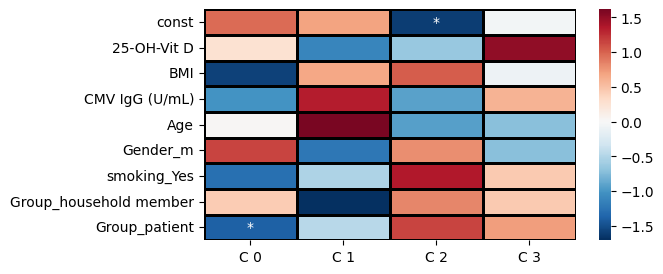

In [135]:
network = []
clus, parameters, pvalues = utils.lr_custom(tcr_shared, meta, clus_labels, res_dir)

network = utils.add_to_network(clus, parameters, pvalues, 'LR_reg', network)


## Addition to LR

Size of metadata: (22, 412)
Size of metadata after NaNs removal: (20, 410)
Shape of the regression input: (20, 9)
C 0
Optimization terminated successfully.
         Current function value: 0.000003
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   20
Model:                          Logit   Df Residuals:                       10
Method:                           MLE   Df Model:                            9
Date:                Mar, 17 Set 2024   Pseudo R-squ.:                   1.000
Time:                        14:23:38   Log-Likelihood:            -6.0813e-05
converged:                       True   LL-Null:                       -11.247
Covariance Type:            nonrobust   LLR p-value:                  0.007440
                               coef    std err          z      P>|z|      [0.0

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



Size of metadata: (57, 411)
Size of metadata after NaNs removal: (54, 409)
Shape of the regression input: (54, 7)
C 0
Optimization terminated successfully.
         Current function value: 0.320817
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   54
Model:                          Logit   Df Residuals:                       47
Method:                           MLE   Df Model:                            6
Date:                Mar, 17 Set 2024   Pseudo R-squ.:                  0.1682
Time:                        14:23:38   Log-Likelihood:                -17.324
converged:                       True   LL-Null:                       -20.827
Covariance Type:            nonrobust   LLR p-value:                    0.3203
                     coef    std err          z      P>|z|      [0.025      0.

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



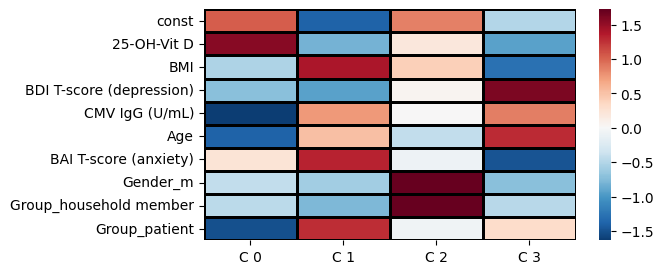

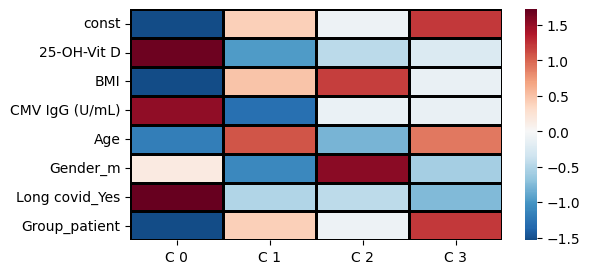

In [124]:
clus, parameters, pvalues = utils.lr_custom(tcr_shared, dep_anx.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels, res_dir)
clus, parameters, pvalues = utils.lr_custom(tcr_shared, covid_patients.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels, res_dir)

## One vs Rest Testing

In [136]:
genenames = normalized_counts['genename']
usable_RNA = normalized_counts.drop(columns = 'genename')
usable_RNA = usable_RNA[[c for c in usable_RNA.columns if c in list(RNA_shared['Donor'])]]
usable_RNA['genename'] = genenames
usable_RNA.reset_index(drop = True, inplace=True)


usable_TCR = TCR_stats[TCR_stats['Donor'].isin(tcr_shared['Donor'])]
usable_TCR.drop(columns = 'Donor', inplace = True)
usable_TCR.reset_index(drop = True, inplace = True)

/var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T/ipykernel_85729/1498411686.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [137]:
t = TCR_stats[TCR_stats['Donor'].isin(tcr_shared['Donor'])].reset_index(drop=True)
t['labels'] = clus_labels
t.loc[t['labels'] != 'C 1', 'labels'] = 'other Clusters'

import plotly.graph_objects as go
fig = go.Figure()
for col in t.columns[1:-1]:
    fig.add_trace(go.Box(y = t[col], x = t['labels'], name = col, boxpoints='all', jitter=0.3))

fig.update_layout(
    yaxis_title='Cell percentages',
    xaxis_title='cluster',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    boxmode='group', width=500, height=700
    
)
fig.update_xaxes(categoryorder='array', 
                 categoryarray= sorted(set((t['labels']))))
#fig.write_html(res_dir + "boxplots_distributions.html")
fig.show()

   mann_pvalues          features cluster
0      0.129016        entropyCD4     C 0
1      0.116623        entropyCD8     C 0
2      0.979533  tcrcovidmatchCD4     C 0
3      0.337706  tcrcovidmatchCD8     C 0
4      0.562056   tcrcovidfreqCD4     C 0
5      0.812580   tcrcovidfreqCD8     C 0
0      0.000304        entropyCD4     C 1
1      0.854714        entropyCD8     C 1
2      0.412890  tcrcovidmatchCD4     C 1
3      0.002291  tcrcovidmatchCD8     C 1
4      0.006453   tcrcovidfreqCD4     C 1
5      0.001021   tcrcovidfreqCD8     C 1
0      0.098762        entropyCD4     C 2
1      0.404783        entropyCD8     C 2
2      0.087528  tcrcovidmatchCD4     C 2
3      0.796625  tcrcovidmatchCD8     C 2
4      0.235925   tcrcovidfreqCD4     C 2
5      0.522733   tcrcovidfreqCD8     C 2
0      0.002161        entropyCD4     C 3
1      0.422611        entropyCD8     C 3
2      0.026767  tcrcovidmatchCD4     C 3
3      0.160727  tcrcovidmatchCD8     C 3
4      0.005768   tcrcovidfreqCD4 

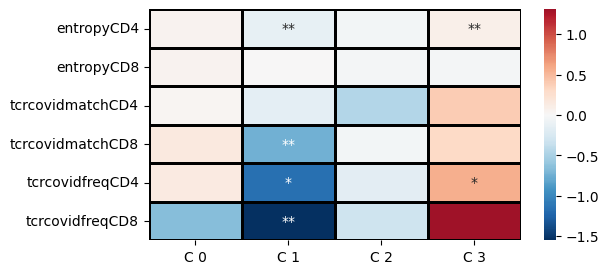

In [138]:
res = plotting.mann_sign([(usable_TCR, 'TCR')], clus_labels, res_dir)

for r in res:
    network = utils.add_to_network(list(r[0].index), pd.DataFrame(r[1]), pd.DataFrame(r[0].reset_index(drop=True)), r[2], network)

## GSEA

In [128]:
gsea_res = utils.gsea_analysis_single(usable_RNA, clus_labels, res_dir, hallmark)

# Multiset analysis
utils.gsea_analysis_multi(usable_RNA, clus_labels, res_dir, path_sets)

# Add GSEA results to the network
[network.append(element) for element in gsea_res]

# for every element in the list network, take the 'table' element and split it
for element in network:
    if element['target'] == 'C 0':
        element['target'] = 'Non-patient\nT&R cluster'
    if element['target'] == 'C 1':
        element['target'] = 'Non-Covid T&R\ninflammation cluster'
    if element['target'] == 'C 2':
        element['target'] = 'T&R cluster 3'
    if element['target'] == 'C 3':
        element['target'] = 'Covid T&R\ninflammation cluster'
        

# replace values in a pd.Series
clus_labels.replace({'C 0': 'Non-patient\nT&R cluster',
                     'C 1': 'Non-Covid T&R\ninflammation cluster',
                     'C 2': 'T&R cluster 3',
                     'C 3': 'Covid T&R\ninflammation cluster'}, inplace=True)


plotting.draw_network(network, clus_labels, res_dir)

2024-09-17 14:23:40,346 [WARNING] Dropping duplicated gene names, only keep the first values
2024-09-17 14:23:42,960 [WARNING] Dropping duplicated gene names, only keep the first values
2024-09-17 14:23:45,358 [WARNING] Dropping duplicated gene names, only keep the first values
2024-09-17 14:23:46,684 [WARNING] Dropping duplicated gene names, only keep the first values
2024-09-17 14:23:49,153 [WARNING] Dropping duplicated gene names, only keep the first values
2024-09-17 14:23:54,809 [WARNING] Dropping duplicated gene names, only keep the first values
2024-09-17 14:23:56,276 [WARNING] Dropping duplicated gene names, only keep the first values
2024-09-17 14:24:24,827 [WARNING] Dropping duplicated gene names, only keep the first values
2024-09-17 14:24:28,988 [WARNING] Dropping duplicated gene names, only keep the first values
2024-09-17 14:24:36,719 [WARNING] Dropping duplicated gene names, only keep the first values
2024-09-17 14:24:41,990 [WARNING] Dropping duplicated gene names, only

<class 'pyvis.network.Network'> |N|=25 |E|=35

# Cytof vs RNA

In [93]:
RNA_shared = aggregated[aggregated['Donor'].isin(cytof_meta['Donor'])]
cytof_shared = cytof[cytof_meta['Donor'].isin(aggregated['Donor'])]
cytof_shared.reset_index(drop = True, inplace = True)
RNA_shared.reset_index(drop=True, inplace = True)

In [94]:
# RNA
idx = list(set(range(affinity_RNA.shape[0])).difference(list(aggregated[~aggregated['Donor'].isin(cytof_meta['Donor'])].index)))
affinity_RNA_mod = affinity_RNA[np.ix_(idx,idx)]
print(affinity_RNA_mod.shape)
# Cytof
idx = list(set(range(affinity_cytof.shape[0])).difference(list(cytof[~cytof_meta['Donor'].isin(aggregated['Donor'])].index)))
affinity_cytof_mod = affinity_cytof[np.ix_(idx,idx)]
print(affinity_cytof_mod.shape)

(177, 177)
(177, 177)


Silhouette score: 0.07185228486566712


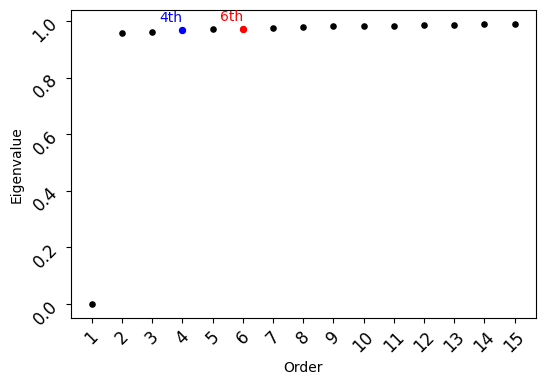

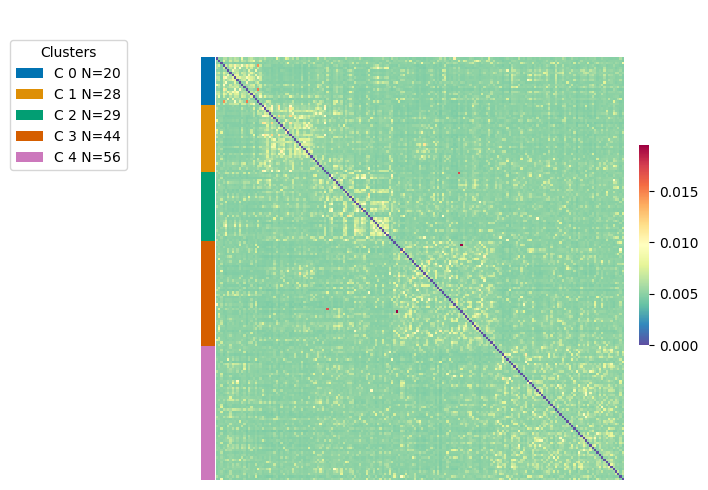

In [95]:
res_dir = results_dir + 'Cytof+RNA/'
dim = affinity_RNA_mod.shape[0]//10

affinity_cytof_rna = snf.snf([affinity_RNA_mod, affinity_cytof_mod], K=dim)

plotting.eigengap_visual(affinity_cytof_rna, res_dir)

n_clusters = 5
clus_labels = utils.spectral_clustering_custom(affinity_cytof_rna, n_clusters)

plotting.draw_clustermap(clus_labels, affinity_cytof_rna, res_dir, 'no')

clus_labels_CYTOFRNA = clus_labels.copy()

## Stability Analysis

Run 0:
Silhouette score: 0.07424253756870296
Silhouette score: 0.05931561344164161
Silhouette score: 0.07302908733609423
Silhouette score: 0.06818090803322915


/var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T/ipykernel_84095/575437949.py:46: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Silhouette score: 0.05231814959023889


/var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T/ipykernel_84095/575437949.py:46: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Silhouette score: 0.07939636476028288


/var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T/ipykernel_84095/575437949.py:46: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Silhouette score: 0.0900490018263798
Silhouette score: 0.06814946789746268
Silhouette score: 0.07038559686381154
Silhouette score: 0.06250699329781506
Run 1:
Silhouette score: 0.07474793494273199
Silhouette score: 0.0753939970076301
Silhouette score: 0.0657478407542486
Silhouette score: 0.08203006106640812
Silhouette score: 0.07958692051825894
Silhouette score: 0.07210748054872242
Silhouette score: 0.07121746084575384
Silhouette score: 0.06555835498816001
Silhouette score: 0.07220356093153549
Silhouette score: 0.06259036237218737
Run 2:
Silhouette score: 0.06100118126026742
Silhouette score: 0.07079449897566631
Silhouette score: 0.06559375403091566
Silhouette score: 0.059560018687513754
Silhouette score: 0.07889739170889744
Silhouette score: 0.0767291240042476
Silhouette score: 0.06246751239837703
Silhouette score: 0.06603004372094443
Silhouette score: 0.050657228365865704
Silhouette score: 0.0704118828959305
Run 3:
Silhouette score: 0.08531407294229366
Silhouette score: 0.080989367637

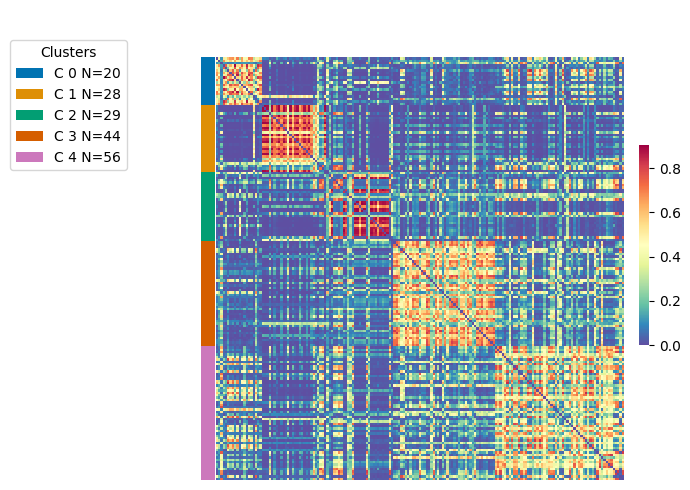

In [36]:
from sklearn.model_selection import KFold
from snf.metrics import silhouette_score
import statistics

silhouettes = []

cooccurrence = pd.DataFrame(0, index=np.arange(len(RNA_shared['Donor'])), columns=list(RNA_shared['Donor']))
cooccurrence['Donor'] = RNA_shared['Donor']

for j in range(100):

    print(f"Run {j}:")
    
    kf = KFold(n_splits=10, random_state=random_state+j, shuffle=True)

    for i, (train_index, test_index) in enumerate(kf.split(RNA_shared)):
        
        
        run = RNA_shared.copy()
        run = run.iloc[train_index,:]
        run.reset_index(drop=True,inplace = True)


        n_clusters = 5

        affinity = snf.snf([snf.make_affinity(RNA_shared.drop(columns='Donor').iloc[train_index,:], metric = metric, K = dim, mu = .5, normalize = True),
                                       snf.make_affinity(cytof_shared.iloc[train_index,:], metric = metric, K = dim, mu = .5, normalize = True)], K=dim)



        clus_labels = utils.spectral_clustering_custom(affinity, n_clusters)

        silhouettes.append(silhouette_score(affinity, clus_labels))


        one_hot = pd.DataFrame()
        one_hot['labels'] = clus_labels
        one_hot = pd.get_dummies(one_hot['labels'])
        one_hot['Donor'] = run['Donor']
        one_hot.set_index(keys = ['Donor'], inplace=True)
        one_hot = one_hot.T.astype(int)
        one_hot = one_hot.T.dot(one_hot)



        cooccurrence = pd.concat([cooccurrence,one_hot.reset_index()]).groupby('Donor',as_index=False).sum()
        #print(one_hot.reset_index())


cooccurrence.set_index(keys = ['Donor'], inplace = True)
cooccurrence = cooccurrence/900
np.fill_diagonal(cooccurrence.values, 0)

print(f'Mean silhouette over the runs: {statistics.mean(silhouettes)}, standard deviation: {statistics.stdev(silhouettes)}')

plotting.draw_clustermap(clus_labels_CYTOFRNA, (cooccurrence).to_numpy(), res_dir, 'no')


Silhouette score: 0.861773460344572


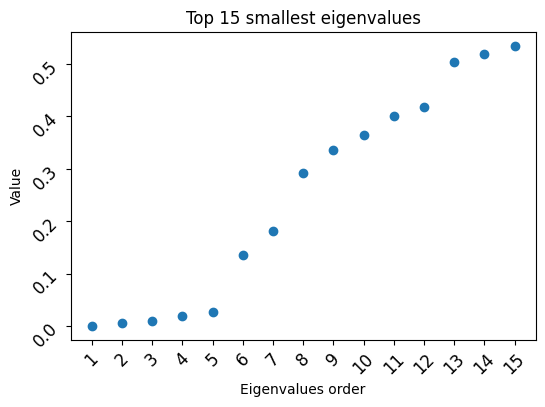

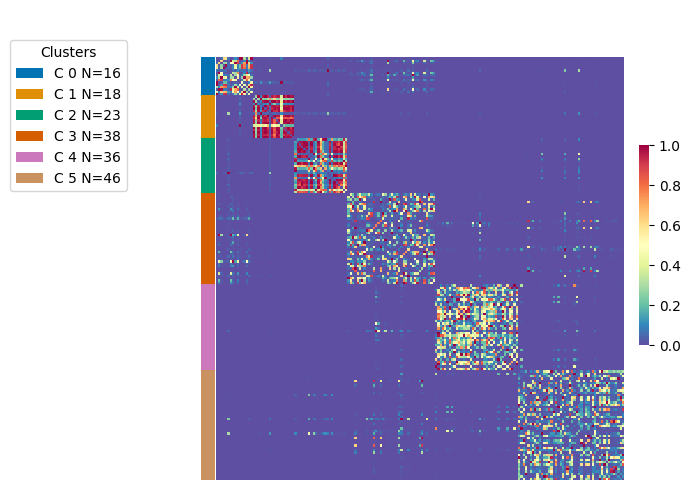

In [37]:
affinity = snf.make_affinity(cooccurrence, metric = metric, K = dim, mu = .5, normalize = True)

plotting.eigengap_visual(affinity, res_dir)

n_clusters = 6
clus_labels = utils.spectral_clustering_custom(affinity, n_clusters)

plotting.draw_clustermap(clus_labels, affinity, res_dir, 'minmax')

In [42]:
chord = pd.DataFrame()
chord['to'] = clus_labels_CYTOFRNA
chord['from'] = list(clus_labels)
chord['from'].replace({'C 1': 'Stable C 2', 'C 0': 'Stable C 0', 'C 2': 'Stable C 1', 'C 3': 'Stable C 4', 'C 4': 'Stable C 3', 'C 5': 'Unstable'}, inplace=True)

count = chord.groupby(['from', 'to']).size()
chord = count.to_frame(name = 'value').reset_index()
chord.to_csv(results_dir+'CytofRNA_chord.csv', sep='\t')
chord

,from,to,value
0,Stable C 0,C 0,15
1,Stable C 0,C 1,1
2,Stable C 1,C 0,1
3,Stable C 1,C 1,22
4,Stable C 2,C 2,18
5,Stable C 3,C 3,33
6,Stable C 3,C 4,3
7,Stable C 4,C 0,3
8,Stable C 4,C 2,4
9,Stable C 4,C 3,5


## TO-DO test LYM MON ratio

In [ ]:
cyt = pd.DataFrame(RNA_shared['Donor'])
cyt['Clusters'] = clus_labels_CYTOFRNA

cyt = pd.merge(cyt, cytocount, left_on='Donor', right_on='Subjectnr', how ='left')
cyt.dropna(inplace=True)
cyt.reset_index(drop=True, inplace=True)

cyt['MON'] = pd.to_numeric(cyt['MON'], errors='coerce')
cyt['LYM'] = pd.to_numeric(cyt['LYM'], errors='coerce')
cyt['GRA'] = pd.to_numeric(cyt['GRA'], errors='coerce')
#print(cyt)
cyt.dropna(inplace=True)
cyt.reset_index(drop=True, inplace=True)
cyt = cyt.iloc[:,-5:]
cyt['Mon/Lym'] = (cyt['MON']/cyt['GRA'])/cyt['LYM']
cyt['Mon/Lym'] = cyt['MON']/cyt['LYM']
cyt

,Clusters,Subjectnr,MON,LYM,GRA,Mon/Lym
0,C 4,Covid HH008,0.2,2.2,5.8,0.090909
1,C 3,Covid HH021,0.4,3.1,5.9,0.129032
2,C 3,Covid HH021,0.2,1.0,2.6,0.200000
3,C 4,Covid HH023,0.4,1.9,5.7,0.210526
4,C 3,Covid HH031,0.2,1.7,2.7,0.117647
...,...,...,...,...,...,...
152,C 4,ERC CO261,0.3,1.4,3.3,0.214286
153,C 1,ERC CO262,0.3,2.5,5.0,0.120000
154,C 1,ERC CO263,0.1,1.5,2.3,0.066667
155,C 4,ERC CO267,0.1,1.3,2.6,0.076923


In [ ]:
px.box(cyt.sort_values(by ='Clusters'), "Mon/Lym", "Clusters", color='Clusters', hover_name="Subjectnr", template="seaborn", points = 'all', width=800, height=500)

## Logistic Regression on clusters

Size of metadata: (175, 392)
Size of metadata after NaNs removal: (166, 390)
Shape of the regression input: (166, 8)
C 0
Optimization terminated successfully.
         Current function value: 0.336085
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                  166
Model:                          Logit   Df Residuals:                      157
Method:                           MLE   Df Model:                            8
Date:                Thu, 27 Jun 2024   Pseudo R-squ.:                 0.02081
Time:                        14:32:40   Log-Likelihood:                -55.790
converged:                       True   LL-Null:                       -56.976
Covariance Type:            nonrobust   LLR p-value:                    0.9675
                             coef    std err          z      P>|z|      [0.

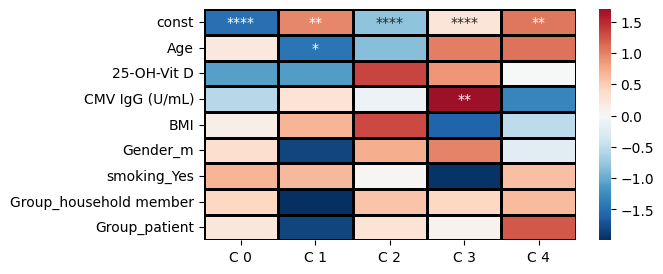

In [22]:
network = []
clus, parameters, pvalues = utils.lr_custom(RNA_shared, meta, clus_labels_CYTOFRNA, res_dir)

network = utils.add_to_network(clus, parameters, pvalues, 'LR_reg', network)

## Addition to LR

Size of metadata: (47, 393)
Size of metadata after NaNs removal: (42, 391)
Shape of the regression input: (42, 9)
C 0
Optimization terminated successfully.
         Current function value: 0.350628
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   42
Model:                          Logit   Df Residuals:                       32
Method:                           MLE   Df Model:                            9
Date:                Thu, 29 Feb 2024   Pseudo R-squ.:                  0.2218
Time:                        11:29:02   Log-Likelihood:                -14.726
converged:                       True   LL-Null:                       -18.924
Covariance Type:            nonrobust   LLR p-value:                    0.4949
                               coef    std err          z      P>|z|      [0.0

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



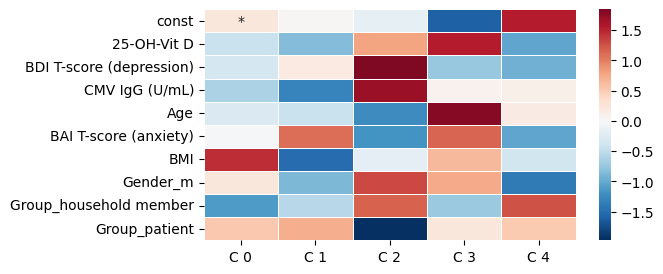

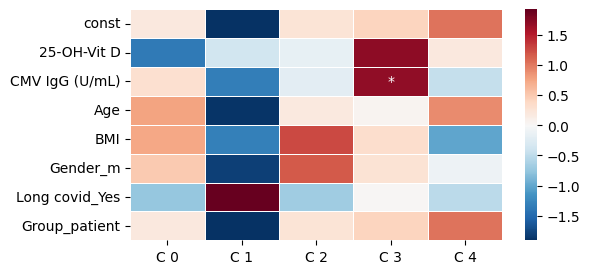

In [37]:
clus, parameters, pvalues = utils.lr_custom(RNA_shared, dep_anx.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels_CYTOFRNA, res_dir)
clus, parameters, pvalues = utils.lr_custom(RNA_shared, covid_patients.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels_CYTOFRNA, res_dir)

## One vs Rest Testing

In [23]:
genenames = normalized_counts['genename']
usable_RNA = normalized_counts.drop(columns = 'genename')
usable_RNA = usable_RNA[[c for c in usable_RNA.columns if c in list(RNA_shared['Donor'])]]
usable_RNA['genename'] = genenames
usable_RNA.reset_index(drop = True, inplace=True)

usable_cytof = cytof_meta[cytof_meta['Donor'].isin(aggregated['Donor'])]
usable_cytof.drop(columns = 'Donor', inplace = True)
usable_cytof.reset_index(drop = True, inplace = True)


/var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T/ipykernel_48154/1340035615.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [24]:
temp = cytof_meta[cytof_meta['Donor'].isin(list(RNA_shared['Donor']))]
temp.reset_index(drop=True,inplace=True)
temp['Clusters'] = clus_labels_CYTOFRNA
temp.to_csv(results_dir+'Cluster_RNA_Cytof_meta.csv', sep='\t')
temp.drop(columns=['Clusters'], inplace = True)
temp.set_index(keys = ['Donor'], inplace = True)
temp.T.to_csv(results_dir+'Cluster_RNA_Cytof_tab.csv', sep='\t')

/var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T/ipykernel_46968/2333964795.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T/ipykernel_46968/2333964795.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [80]:
temp = usable_cytof.copy()
temp['labels'] = clus_labels_CYTOFRNA
import plotly.graph_objects as go

fig = go.Figure()

for col in temp.columns[:-1]:
    fig.add_trace(go.Box(y = temp[col], x = temp['labels'], name = col, boxpoints='all', jitter=0.3))

fig.update_layout(
    yaxis_title='Cell percentages',
    xaxis_title='cluster',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    boxmode='group',
    
)
fig.update_xaxes(categoryorder='array', 
                 categoryarray= sorted(set((temp['labels']))))
fig.write_html(res_dir + "boxplots_distributions.html")
fig.show()

In [81]:
test = all_cytof.iloc[:,-29:]
test = test[test['Donor'].isin(aggregated['Donor'])]
test.drop(columns = 'Donor', inplace = True)
test.reset_index(drop = True, inplace = True)
test.head()

,Sen_CD8+Temra,Sen_CD4+Tem,Exh_CD4+Tef,CD8+Tcm,Exh_CD4+Tcm,CD4+Tregs,NKT,Exh_CD4+Th2cm,NK,CD8+Tem,...,CCR7+CD45RA+CCR6+CXCR5+LAG3+CD25+B,Act_CD4+Tef,CCR7-CD45RA+CCR6-CXCR5-Fas+B,CCR7+CD45RA+CCR6+CXCR5+LAG3-CD25-B,CD4_Tcell_percent,CD8_Tcell_percent,Bcell_percent,NKcell_percent,DC_percent,monocyte_percent
0,1.141687,0.022097,0.826434,1.518812,21.132259,2.000530,0.201821,0.592204,4.982175,1.371498,...,0.116378,0.160573,0.114905,6.249079,51.856162,6.387555,4.709643,2.666392,1.051825,5.646563
1,10.877180,4.225352,1.644409,0.469484,12.732005,0.885451,0.250553,0.505972,17.600769,1.725899,...,0.063246,0.150819,0.031623,3.322873,38.642390,14.843465,3.556399,11.019485,3.127052,4.456445
2,6.611636,0.290403,2.357036,1.947290,32.799602,1.631029,0.125311,1.883640,2.345102,1.012432,...,0.268523,0.031825,0.049727,6.022874,43.834908,8.877176,3.902536,0.954749,0.853307,5.493784
3,8.236766,0.115223,1.725046,0.213985,16.806031,0.707796,2.274822,0.385173,2.136555,9.938767,...,0.141559,0.016460,0.023045,8.987358,23.446142,13.688438,6.877140,1.260864,1.376086,12.918093
4,0.293684,0.078240,3.061572,0.691688,16.067581,1.001247,0.163284,0.899195,11.241637,4.340628,...,0.149677,0.374192,0.068035,5.906565,40.165552,9.125751,5.191065,6.586915,3.419889,8.273047


## Temporary test

In [97]:
usable_micro = micro_fused[micro_fused['Donor'].isin(aggregated['Donor'])]
usable_micro = usable_micro[usable_micro['Donor'].isin(cytof_meta['Donor'])]
usable_micro.reset_index(drop=True, inplace = True)

test_labels = pd.DataFrame()
test_labels['labels'] = clus_labels_CYTOFRNA
test_labels['Donor'] = RNA_shared['Donor']

test_labels = pd.merge(test_labels,usable_micro, how='right')
test_labels.reset_index(drop=True,inplace=True)
test_labels = pd.Series(test_labels['labels'])

In [98]:
multi_chord = pd.DataFrame()
multi_chord['Cytof+RNA'] = test_labels

In [84]:
res = plotting.micro_analysis(usable_micro, test_labels, micro_taxa, res_dir)

[network.append(element) for element in res]


Caricamento pacchetto: ‘tidyr’



    expand















Caricamento pacchetto: ‘Matrix’



    expand, pack, unpack



    expand









[1] "Creating output folder"
[1] "Creating output feature tables folder"
[1] "Creating output fits folder"
2024-06-27 13:53:20.704709 INFO::Writing function arguments to log file
2024-06-27 13:53:20.715457 INFO::Verifying options selected are valid
2024-06-27 13:53:20.734006 INFO::Determining format of input files
2024-06-27 13:53:20.73465 INFO::Input format is data samples as rows and metadata samples as rows
2024-06-27 13:53:20.736947 INFO::Formula for fixed effects: expr ~  cluster_3
2024-06-27 13:53:20.73747 INFO::Filter data based on min abundance and min prevalence
2024-06-27 13:53:20.738013 INFO::Total samples in data: 97
2024-06-27 13:53:20.738641 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-06-27 13:53:20.740881 INFO::Total filtered features: 0
2024-06-27 13:53:20.74143 INFO::Filtered feature names from abundance and prevalence filtering:
2024-06-27 13:53:20.744972 INFO::Total filtered features with variance filtering: 0
2024-06

[1] "Warning: Deleting existing log file: /var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T//Rtmp0EaaFv/maaslin2.output.folder/maaslin2.log"
2024-06-27 13:53:21.683028 INFO::Writing function arguments to log file
2024-06-27 13:53:21.68557 INFO::Verifying options selected are valid
2024-06-27 13:53:21.686217 INFO::Determining format of input files
2024-06-27 13:53:21.686829 INFO::Input format is data samples as rows and metadata samples as rows
2024-06-27 13:53:21.689185 INFO::Formula for fixed effects: expr ~  cluster_4
2024-06-27 13:53:21.689715 INFO::Filter data based on min abundance and min prevalence
2024-06-27 13:53:21.690138 INFO::Total samples in data: 97
2024-06-27 13:53:21.690657 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-06-27 13:53:21.692845 INFO::Total filtered features: 0
2024-06-27 13:53:21.693473 INFO::Filtered feature names from abundance and prevalence filtering:
2024-06-27 13:53:21.697112 INFO::Total filtered features

[1] "Warning: Deleting existing log file: /var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T//Rtmp0EaaFv/maaslin2.output.folder/maaslin2.log"
2024-06-27 13:53:22.69499 INFO::Writing function arguments to log file
2024-06-27 13:53:22.700555 INFO::Verifying options selected are valid
2024-06-27 13:53:22.702899 INFO::Determining format of input files
2024-06-27 13:53:22.704747 INFO::Input format is data samples as rows and metadata samples as rows
2024-06-27 13:53:22.711728 INFO::Formula for fixed effects: expr ~  cluster_2
2024-06-27 13:53:22.712639 INFO::Filter data based on min abundance and min prevalence
2024-06-27 13:53:22.71312 INFO::Total samples in data: 97
2024-06-27 13:53:22.713601 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-06-27 13:53:22.71579 INFO::Total filtered features: 0
2024-06-27 13:53:22.716705 INFO::Filtered feature names from abundance and prevalence filtering:
2024-06-27 13:53:22.722713 INFO::Total filtered features w

[1] "Warning: Deleting existing log file: /var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T//Rtmp0EaaFv/maaslin2.output.folder/maaslin2.log"
2024-06-27 13:53:23.699048 INFO::Writing function arguments to log file
2024-06-27 13:53:23.701697 INFO::Verifying options selected are valid
2024-06-27 13:53:23.702366 INFO::Determining format of input files
2024-06-27 13:53:23.702914 INFO::Input format is data samples as rows and metadata samples as rows
2024-06-27 13:53:23.70521 INFO::Formula for fixed effects: expr ~  cluster_0
2024-06-27 13:53:23.705749 INFO::Filter data based on min abundance and min prevalence
2024-06-27 13:53:23.706166 INFO::Total samples in data: 97
2024-06-27 13:53:23.706679 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-06-27 13:53:23.708937 INFO::Total filtered features: 0
2024-06-27 13:53:23.709597 INFO::Filtered feature names from abundance and prevalence filtering:
2024-06-27 13:53:23.713386 INFO::Total filtered features

[1] "Warning: Deleting existing log file: /var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T//Rtmp0EaaFv/maaslin2.output.folder/maaslin2.log"
2024-06-27 13:53:25.086984 INFO::Writing function arguments to log file
2024-06-27 13:53:25.089146 INFO::Verifying options selected are valid
2024-06-27 13:53:25.08982 INFO::Determining format of input files
2024-06-27 13:53:25.090434 INFO::Input format is data samples as rows and metadata samples as rows
2024-06-27 13:53:25.092805 INFO::Formula for fixed effects: expr ~  cluster_1
2024-06-27 13:53:25.093496 INFO::Filter data based on min abundance and min prevalence
2024-06-27 13:53:25.094152 INFO::Total samples in data: 97
2024-06-27 13:53:25.094774 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-06-27 13:53:25.097201 INFO::Total filtered features: 0
2024-06-27 13:53:25.097779 INFO::Filtered feature names from abundance and prevalence filtering:
2024-06-27 13:53:25.101465 INFO::Total filtered features

RRuntimeError: Errore in xtfrm.data.frame(x) : non è possibile xtfrm i data frame


Cluster C 0
Cluster C 1
Cluster C 2
Cluster C 3
Cluster C 4


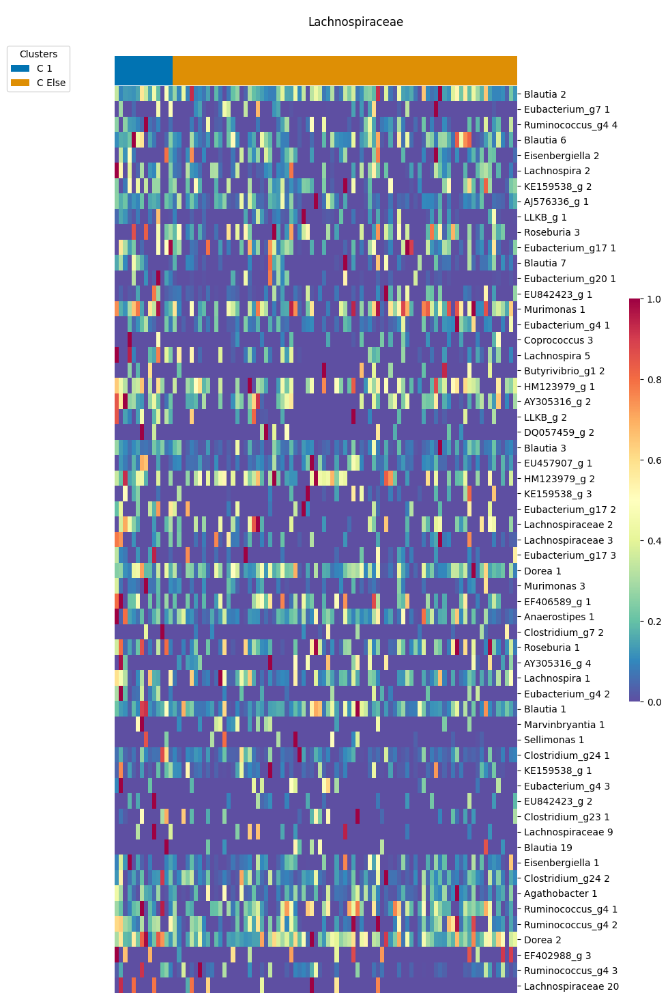

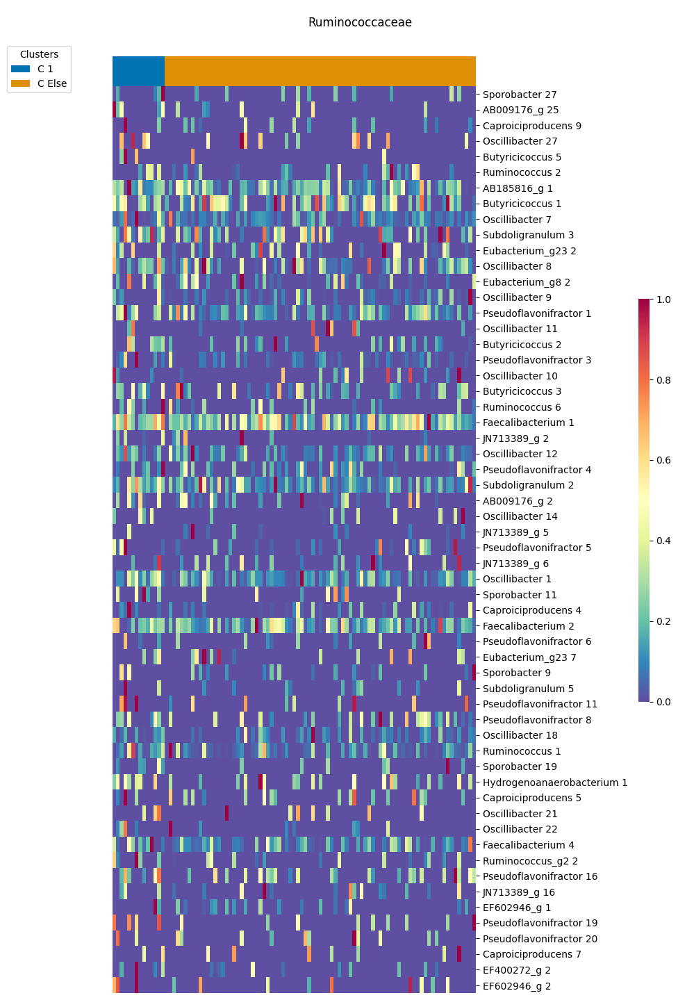

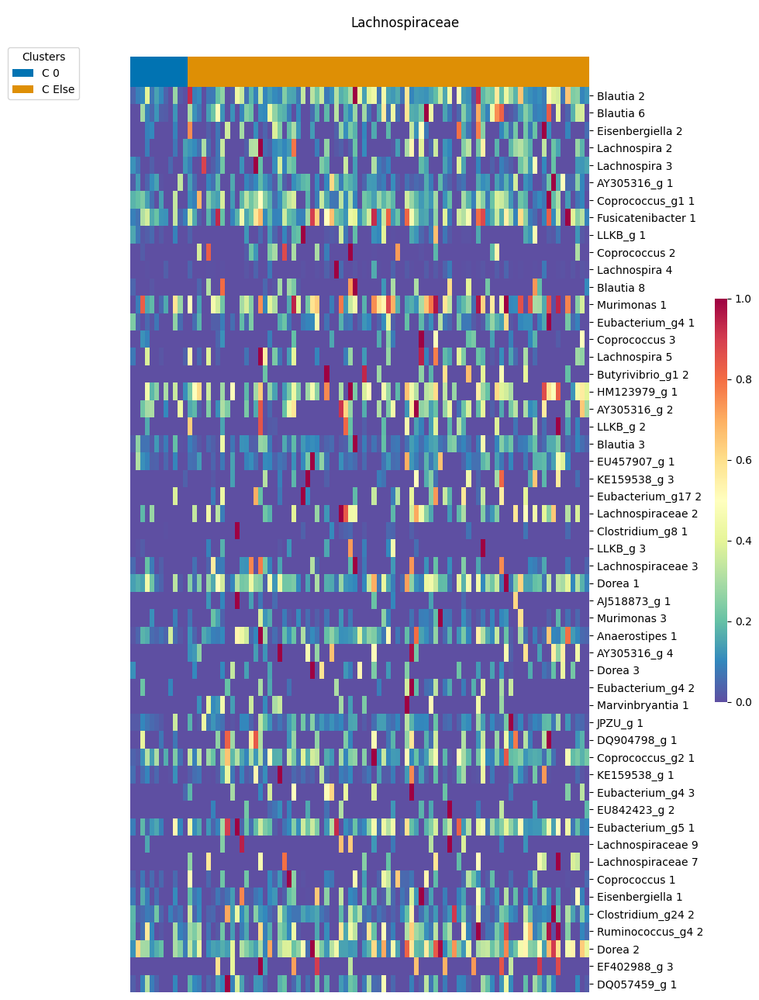

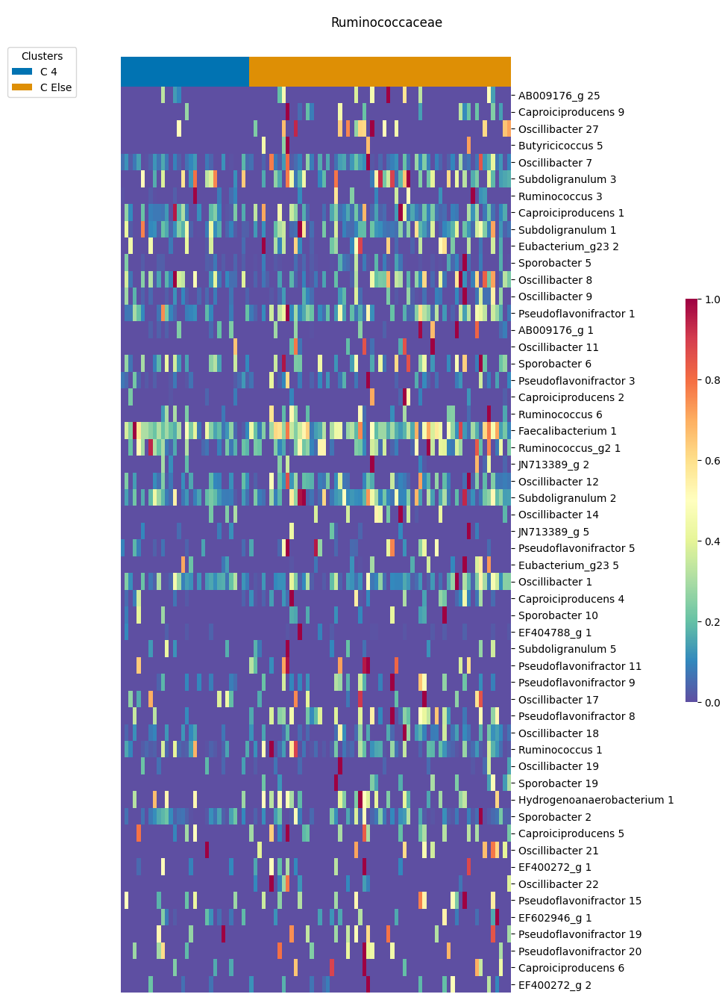

In [25]:
res = utils.gsea_analysis_bacteria(micro_data_norm.iloc[:,micro_data_norm.columns.isin(list(usable_micro['Donor'])+['genename'])],
                                test_labels, res_dir, [custom_bacteria_gene_lists])

[network.append(element) for element in res]

utils.plot_heatmaps_gsea_bacteria(res, micro_fused_rel[micro_fused_rel['Donor'].isin(list(usable_micro['Donor']))].reset_index(drop=True), 
                                test_labels, micro_taxa, res_dir)

## Cytof clusters analysis

Cytof number of columns 22
No need to drop Donor


/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:522: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



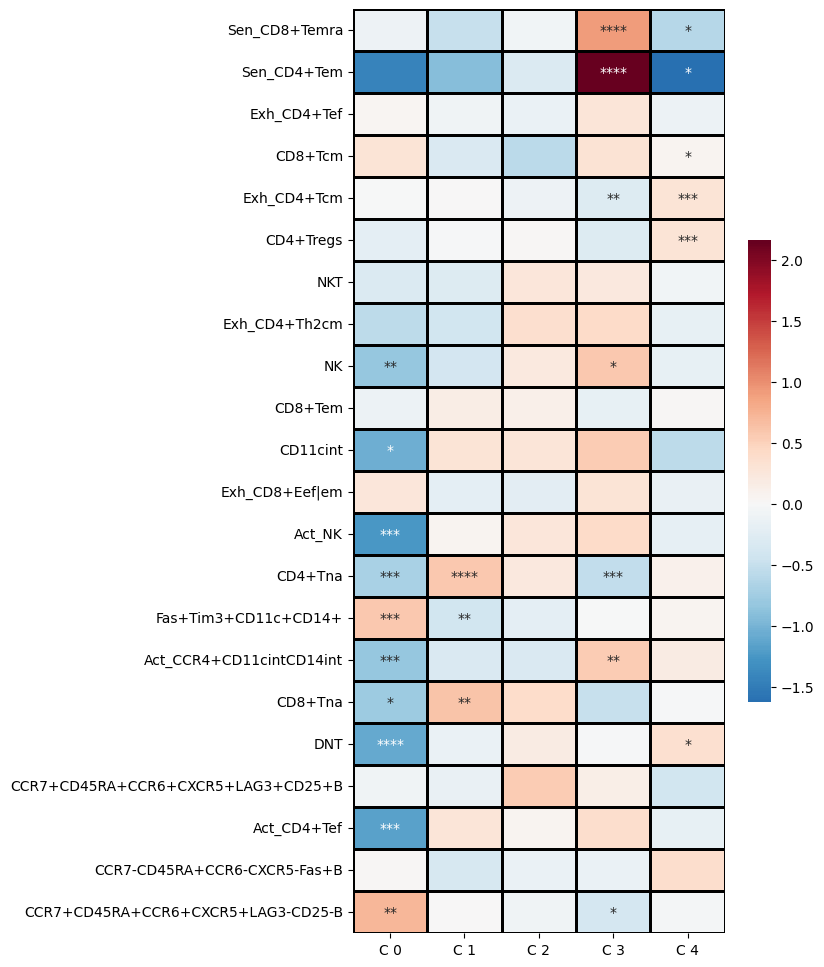

In [ ]:
r = utils.cytof_clusters_analysis(usable_cytof, clus_labels_CYTOFRNA, res_dir)

network = utils.add_to_network(list(r[0].index), pd.DataFrame(r[1]), pd.DataFrame(r[0].reset_index(drop=True)), r[2], network)

## GSEA

In [85]:
gsea_res = utils.gsea_analysis_single(usable_RNA, clus_labels_CYTOFRNA, res_dir, hallmark)

# Multiset analysis
utils.gsea_analysis_multi(usable_RNA, clus_labels_CYTOFRNA, res_dir, path_sets)

# Add GSEA results to the network
[network.append(element) for element in gsea_res]

plotting.draw_network(network, clus_labels_CYTOFRNA, res_dir)

2024-06-27 13:55:14,398 [WARNING] Dropping duplicated gene names, only keep the first values
2024-06-27 13:55:16,871 [WARNING] Dropping duplicated gene names, only keep the first values
2024-06-27 13:55:19,155 [WARNING] Dropping duplicated gene names, only keep the first values
2024-06-27 13:55:21,570 [WARNING] Dropping duplicated gene names, only keep the first values
2024-06-27 13:55:23,913 [WARNING] Dropping duplicated gene names, only keep the first values
2024-06-27 13:55:26,367 [WARNING] Dropping duplicated gene names, only keep the first values
2024-06-27 13:55:31,562 [WARNING] Dropping duplicated gene names, only keep the first values
2024-06-27 13:55:33,064 [WARNING] Dropping duplicated gene names, only keep the first values
2024-06-27 13:55:58,179 [WARNING] Dropping duplicated gene names, only keep the first values
2024-06-27 13:56:01,622 [WARNING] Dropping duplicated gene names, only keep the first values
2024-06-27 13:56:08,552 [WARNING] Dropping duplicated gene names, only

<class 'pyvis.network.Network'> |N|=40 |E|=52

# Cytof vs TCR data

In [39]:
cytof_shared = cytof[cytof_meta['Donor'].isin(tcr_stats_fused_top['Donor'])]
cytof_shared.reset_index(drop = True, inplace = True)
tcr_shared = tcr_stats_fused_top[tcr_stats_fused_top['Donor'].isin(cytof_meta['Donor'])]
tcr_shared.reset_index(drop = True, inplace = True)

In [42]:
# Cytof
idx = list(set(range(affinity_cytof.shape[0])).difference(list(cytof[~cytof_meta['Donor'].isin(tcr_stats_fused_top['Donor'])].index)))
affinity_cytof_mod = affinity_cytof[np.ix_(idx,idx)]
print(affinity_cytof_mod.shape)
# TCR
idx = list(set(range(affinity_tcr_fused_top.shape[0])).difference(list(tcr_stats_fused_top[~tcr_stats_fused_top['Donor'].isin(cytof_meta['Donor'])].index)))
affinity_tcr_fused_top_mod = affinity_tcr_fused_top[np.ix_(idx,idx)]
print(affinity_tcr_fused_top_mod.shape)

(47, 47)
(47, 47)


Silhouette score: 0.3558232533934804


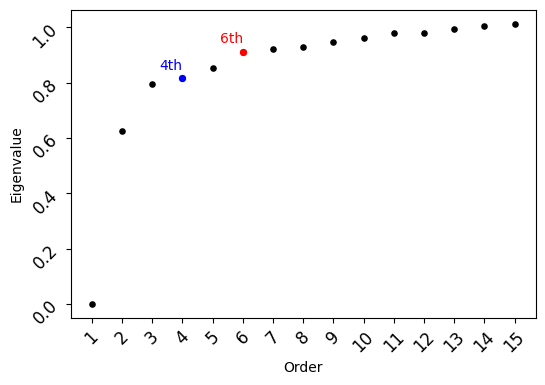

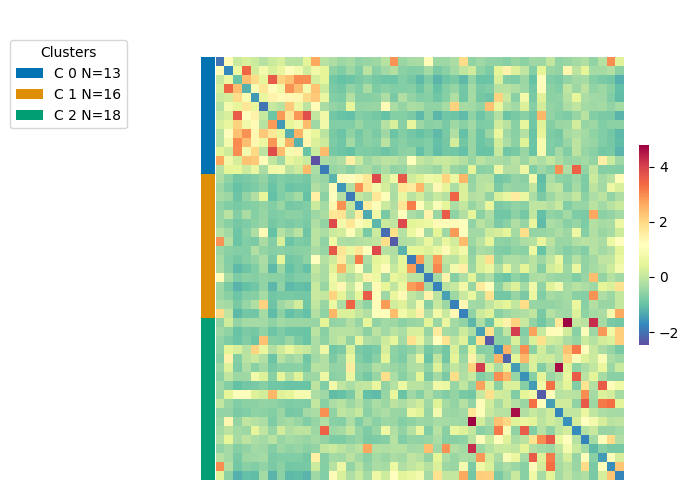

In [43]:
res_dir = results_dir + 'Cytof+TCR/'
dim = affinity_cytof_mod.shape[0]//10

affinity_cytof_tcr = snf.snf([affinity_cytof_mod, affinity_tcr_fused_top_mod], K=dim)

plotting.eigengap_visual(affinity_cytof_tcr, res_dir)

n_clusters = 3
clus_labels = utils.spectral_clustering_custom(affinity_cytof_tcr, n_clusters)

plotting.draw_clustermap(clus_labels, affinity_cytof_tcr, res_dir, 'standard')

## Logistic Regression on clusters

Size of metadata: (47, 410)
Size of metadata after NaNs removal: (45, 408)
Shape of the regression input: (45, 8)
C 0
Optimization terminated successfully.
         Current function value: 0.361103
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   45
Model:                          Logit   Df Residuals:                       36
Method:                           MLE   Df Model:                            8
Date:                Mer, 03 Lug 2024   Pseudo R-squ.:                  0.3993
Time:                        12:49:24   Log-Likelihood:                -16.250
converged:                       True   LL-Null:                       -27.052
Covariance Type:            nonrobust   LLR p-value:                  0.005704
                             coef    std err          z      P>|z|      [0.025

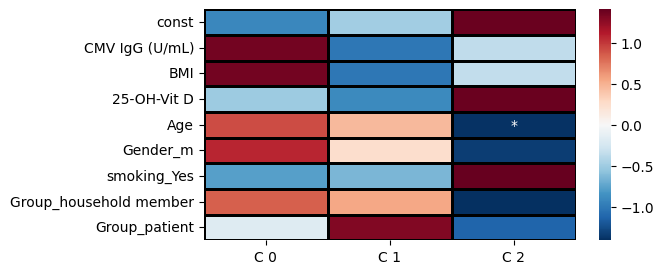

In [44]:
network = []
clus, parameters, pvalues = utils.lr_custom(tcr_shared, meta, clus_labels, res_dir)

network = utils.add_to_network(clus, parameters, pvalues, 'LR_reg', network)


## Addition to LR

Size of metadata: (12, 411)
Size of metadata after NaNs removal: (10, 409)
Shape of the regression input: (10, 9)
C 0
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 17
         Function evaluations: 18
         Gradient evaluations: 18
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   10
Model:                          Logit   Df Residuals:                        0
Method:                           MLE   Df Model:                            9
Date:                Fri, 09 Feb 2024   Pseudo R-squ.:                   1.000
Time:                        15:49:45   Log-Likelihood:            -0.00010158
converged:                       True   LL-Null:                       -5.0040
Covariance Type:            nonrobust   LLR p-value:                    0.3499
                               coef    std err          z      P>|z|      [0.0

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp



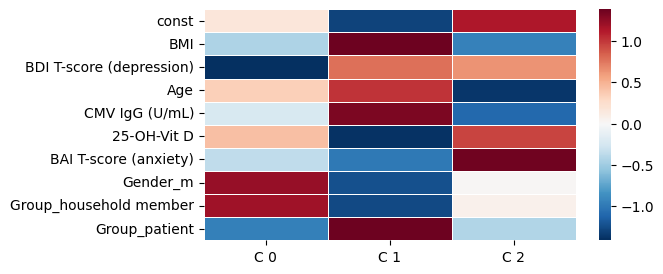

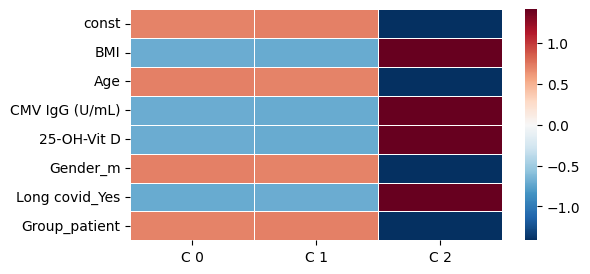

In [77]:
clus, parameters, pvalues = utils.lr_custom(tcr_shared, dep_anx.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels, res_dir)
clus, parameters, pvalues = utils.lr_custom(tcr_shared, covid_patients.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels, res_dir)

## One vs Rest Testing

In [45]:
usable_TCR = TCR_stats[TCR_stats['Donor'].isin(tcr_shared['Donor'])]
usable_TCR.drop(columns = 'Donor', inplace = True)
usable_TCR.reset_index(drop = True, inplace = True)

usable_cytof = cytof_meta[cytof_meta['Donor'].isin(tcr_stats_fused_top['Donor'])]
usable_cytof.drop(columns = 'Donor', inplace = True)
usable_cytof.reset_index(drop = True, inplace = True)

/var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T/ipykernel_36409/264304253.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T/ipykernel_36409/264304253.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



   mann_pvalues          features cluster
0      0.037436        entropyCD4     C 0
1      0.012945        entropyCD8     C 0
2      0.600455  tcrcovidmatchCD4     C 0
3      0.175429  tcrcovidmatchCD8     C 0
4      0.905249   tcrcovidfreqCD4     C 0
5      0.589481   tcrcovidfreqCD8     C 0
0      0.124080        entropyCD4     C 1
1      0.493505        entropyCD8     C 1
2      0.233618  tcrcovidmatchCD4     C 1
3      0.252935  tcrcovidmatchCD8     C 1
4      0.736041   tcrcovidfreqCD4     C 1
5      0.110484   tcrcovidfreqCD8     C 1
0      0.685579        entropyCD4     C 2
1      0.107725        entropyCD8     C 2
2      0.504037  tcrcovidmatchCD4     C 2
3      0.017679  tcrcovidmatchCD8     C 2
4      0.653370   tcrcovidfreqCD4     C 2
5      0.039082   tcrcovidfreqCD8     C 2


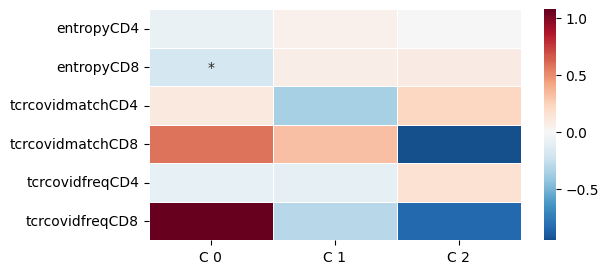

In [46]:
res = plotting.mann_sign([(usable_TCR, 'TCR')], clus_labels, res_dir)

for r in res:
    network = utils.add_to_network(list(r[0].index), pd.DataFrame(r[1]), pd.DataFrame(r[0].reset_index(drop=True)), r[2], network)

## Cytof clusters analysis

Cytof number of columns 22
No need to drop Donor


/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:522: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



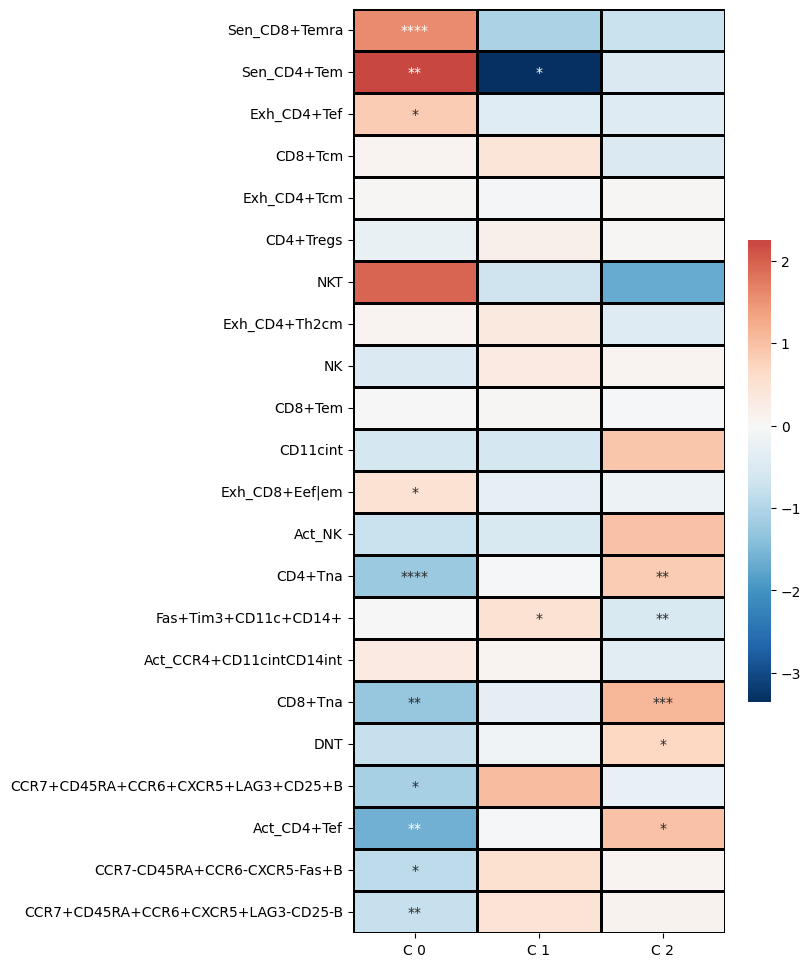

In [47]:
r = utils.cytof_clusters_analysis(usable_cytof,clus_labels, res_dir)

network = utils.add_to_network(list(r[0].index), pd.DataFrame(r[1]), pd.DataFrame(r[0].reset_index(drop=True)), r[2], network)

#plotting.draw_network(network, clus_labels, res_dir)

In [48]:
# for every element in the list network, take the 'table' element and split it
for element in network:
    if element['target'] == 'C 0':
        element['target'] = 'T&C C1'
    if element['target'] == 'C 1':
        element['target'] = 'T&C C2'
    if element['target'] == 'C 2':
        element['target'] = 'T&C C3'
        
        
# replace values in a pd.Series
clus_labels.replace({'C 0': 'T&C C1', 'C 1': 'T&C C2', 'C 2': 'T&C C3'}, inplace=True)

plotting.draw_network(network, clus_labels, res_dir)

<class 'pyvis.network.Network'> |N|=17 |E|=19

# Cytof vs RNAseq vs TCRseq

In [38]:
RNA_shared = aggregated[aggregated['Donor'].isin(cytof_meta['Donor'])]
RNA_shared = RNA_shared[RNA_shared['Donor'].isin(tcr_stats_fused_top['Donor'])]
RNA_shared.reset_index(drop=True, inplace = True)

aux = cytof.copy()
aux['Donor'] = cytof_meta['Donor']
cytof_shared = aux[aux['Donor'].isin(aggregated['Donor'])]
cytof_shared = cytof_shared[cytof_shared['Donor'].isin(tcr_stats_fused_top['Donor'])]
cytof_shared.reset_index(drop=True, inplace = True)

tcr_shared = tcr_stats_fused_top[tcr_stats_fused_top['Donor'].isin(aggregated['Donor'])]
tcr_shared = tcr_shared[tcr_shared['Donor'].isin(cytof_meta['Donor'])]
tcr_shared.reset_index(drop = True, inplace = True)

In [39]:
# Cytof
idx = list(set(range(affinity_cytof.shape[0])).difference(list(cytof[~ ( (cytof_meta['Donor'].isin(tcr_stats_fused_top['Donor']))  & (cytof_meta['Donor'].isin(aggregated['Donor']))) ].index)))
affinity_cytof_mod = affinity_cytof[np.ix_(idx,idx)]
print(affinity_cytof_mod.shape)
# TCR
idx = list(set(range(affinity_tcr_fused_top.shape[0])).difference(list(tcr_stats_fused_top[~ ( (tcr_stats_fused_top['Donor'].isin(cytof_meta['Donor']))  & (tcr_stats_fused_top['Donor'].isin(aggregated['Donor']))) ].index)))
affinity_tcr_fused_top_mod = affinity_tcr_fused_top[np.ix_(idx,idx)]
print(affinity_tcr_fused_top_mod.shape)
# RNA
idx = list(set(range(affinity_RNA.shape[0])).difference(list(aggregated[~ ( (aggregated['Donor'].isin(cytof_meta['Donor']))  & (aggregated['Donor'].isin(tcr_stats_fused_top['Donor']))) ].index)))
affinity_RNA_mod = affinity_RNA[np.ix_(idx,idx)]
print(affinity_RNA_mod.shape)

(45, 45)
(45, 45)
(45, 45)


Silhouette score: 0.2289152983061532


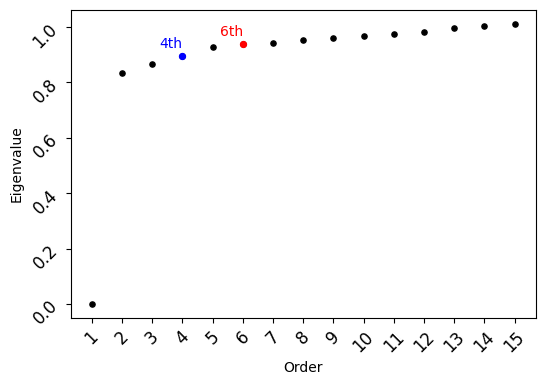

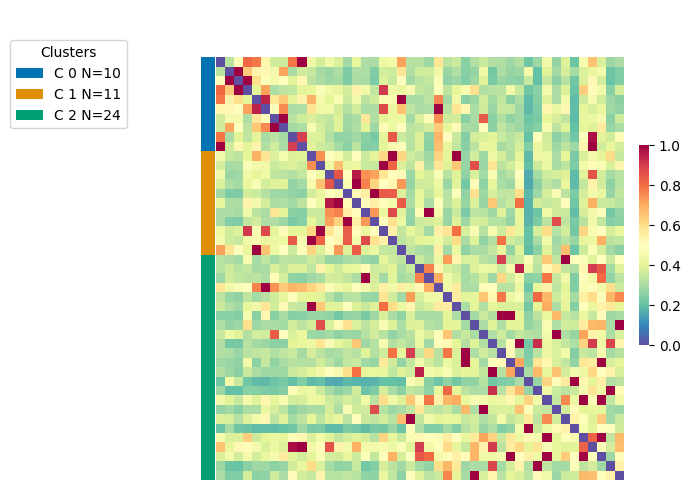

In [40]:
res_dir = results_dir + 'Cytof+RNA+TCR/'
dim = affinity_RNA_mod.shape[0]//10

affinity_cytof_rna_tcr = snf.snf([affinity_cytof_mod, 
                                  affinity_tcr_fused_top_mod, 
                                  affinity_RNA_mod], K=dim)

plotting.eigengap_visual(affinity_cytof_rna_tcr, res_dir)

n_clusters = 3
clus_labels = utils.spectral_clustering_custom(affinity_cytof_rna_tcr, n_clusters)

plotting.draw_clustermap(clus_labels, affinity_cytof_rna_tcr, res_dir, 'minmax')

## Logistic Regression on clusters

Size of metadata: (45, 392)
Size of metadata after NaNs removal: (43, 390)
Shape of the regression input: (43, 8)
C 0
Optimization terminated successfully.
         Current function value: 0.320682
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   43
Model:                          Logit   Df Residuals:                       34
Method:                           MLE   Df Model:                            8
Date:                Mer, 03 Lug 2024   Pseudo R-squ.:                  0.3749
Time:                        14:12:48   Log-Likelihood:                -13.789
converged:                       True   LL-Null:                       -22.060
Covariance Type:            nonrobust   LLR p-value:                   0.03525
                             coef    std err          z      P>|z|      [0.025

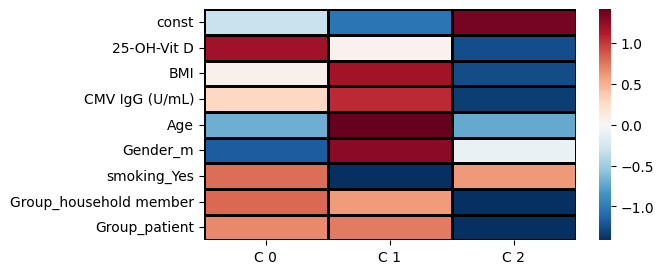

In [41]:
network = []
clus, parameters, pvalues = utils.lr_custom(RNA_shared, meta, clus_labels, res_dir)

network = utils.add_to_network(clus, parameters, pvalues, 'LR_reg', network)

## Addition to LR

Size of metadata: (12, 393)
Size of metadata after NaNs removal: (10, 391)
Shape of the regression input: (10, 9)
C 0
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 17
         Function evaluations: 18
         Gradient evaluations: 18
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   10
Model:                          Logit   Df Residuals:                        0
Method:                           MLE   Df Model:                            9
Date:                Fri, 09 Feb 2024   Pseudo R-squ.:                   1.000
Time:                        15:51:27   Log-Likelihood:            -9.8783e-05
converged:                       True   LL-Null:                       -3.2508
Covariance Type:            nonrobust   LLR p-value:                    0.6889
                               coef    std err          z      P>|z|      [0.0

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_

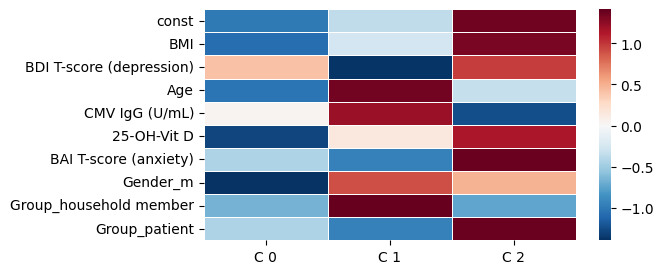

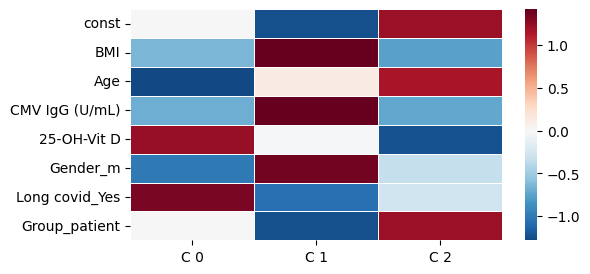

In [ ]:
clus, parameters, pvalues = utils.lr_custom(RNA_shared, dep_anx.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels, res_dir)
clus, parameters, pvalues = utils.lr_custom(RNA_shared, covid_patients.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels, res_dir)

## One vs Rest Testing

In [42]:
genenames = normalized_counts['genename']
usable_RNA = normalized_counts.drop(columns = 'genename')
usable_RNA = usable_RNA[[c for c in usable_RNA.columns if c in list(RNA_shared['Donor'])]]
usable_RNA['genename'] = genenames
usable_RNA.reset_index(drop = True, inplace=True)

usable_cytof = cytof_meta[cytof_meta['Donor'].isin(cytof_shared['Donor'])]
usable_cytof.drop(columns = 'Donor', inplace = True)
usable_cytof.reset_index(drop = True, inplace = True)

usable_TCR = TCR_stats[TCR_stats['Donor'].isin(tcr_shared['Donor'])]
usable_TCR.drop(columns = 'Donor', inplace = True)
usable_TCR.reset_index(drop = True, inplace = True)

/var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T/ipykernel_55270/1880912552.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T/ipykernel_55270/1880912552.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



   mann_pvalues          features cluster
0      0.967335        entropyCD4     C 0
1      0.632816        entropyCD8     C 0
2      0.262445  tcrcovidmatchCD4     C 0
3      0.553463  tcrcovidmatchCD8     C 0
4      0.584620   tcrcovidfreqCD4     C 0
5      0.945066   tcrcovidfreqCD8     C 0
0      0.150046        entropyCD4     C 1
1      0.012568        entropyCD8     C 1
2      0.284233  tcrcovidmatchCD4     C 1
3      0.149926  tcrcovidmatchCD8     C 1
4      0.721127   tcrcovidfreqCD4     C 1
5      0.831091   tcrcovidfreqCD8     C 1
0      0.232315        entropyCD4     C 2
1      0.081783        entropyCD8     C 2
2      0.061801  tcrcovidmatchCD4     C 2
3      0.462351  tcrcovidmatchCD8     C 2
4      0.438682   tcrcovidfreqCD4     C 2
5      0.908571   tcrcovidfreqCD8     C 2


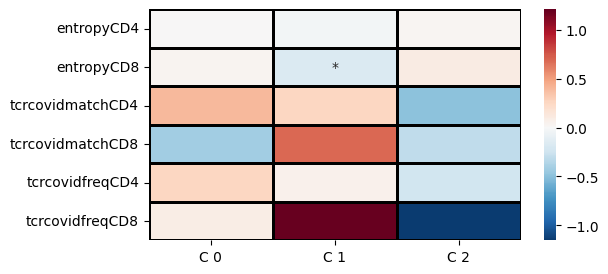

In [43]:
res = plotting.mann_sign([(usable_TCR, 'TCR')], clus_labels, res_dir)

for r in res:
    network = utils.add_to_network(list(r[0].index), pd.DataFrame(r[1]), pd.DataFrame(r[0].reset_index(drop=True)), r[2], network)

## Cytof clusters analysis

Cytof number of columns 22
No need to drop Donor


/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:522: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



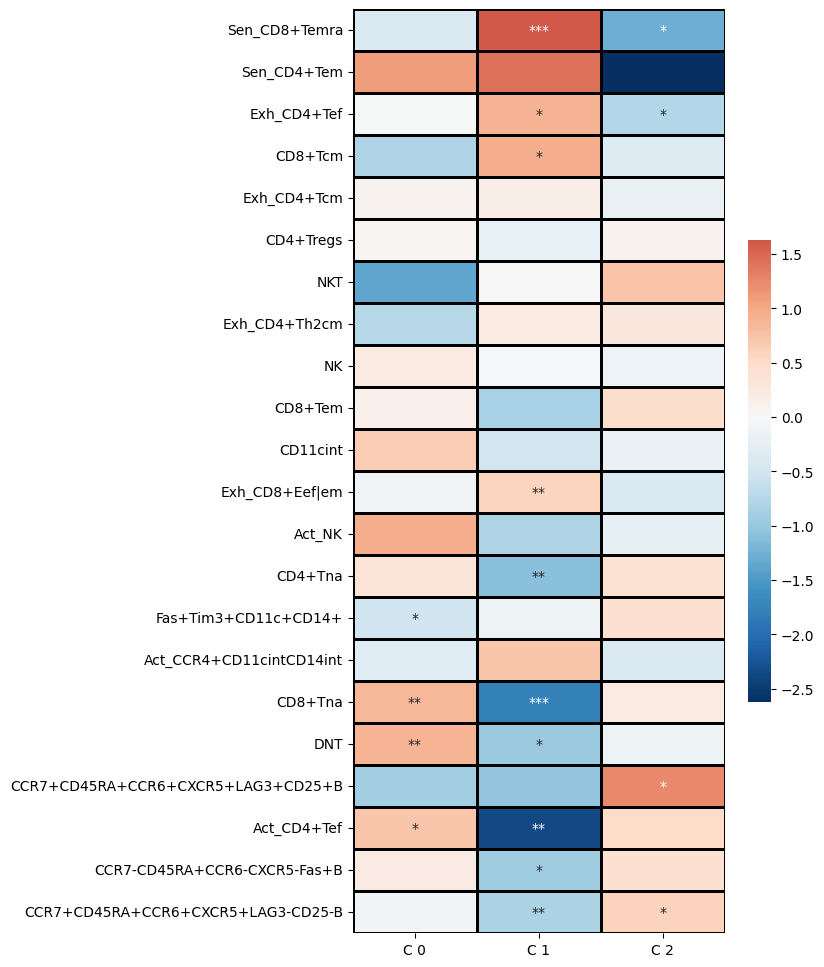

In [59]:
r = utils.cytof_clusters_analysis(usable_cytof, clus_labels, res_dir)

network = utils.add_to_network(list(r[0].index), pd.DataFrame(r[1]), pd.DataFrame(r[0].reset_index(drop=True)), r[2], network)

## GSEA

In [72]:
gsea_res = utils.gsea_analysis_single(usable_RNA, clus_labels, res_dir, hallmark)

# Multiset analysis
utils.gsea_analysis_multi(usable_RNA, clus_labels, res_dir, path_sets)

# Add GSEA results to the network
[network.append(element) for element in gsea_res]

#plotting.draw_network(network, clus_labels, res_dir)

2024-06-27 13:29:19,388 [WARNING] Dropping duplicated gene names, only keep the first values


2024-06-27 13:29:20,349 [WARNING] Dropping duplicated gene names, only keep the first values
2024-06-27 13:29:21,952 [WARNING] Dropping duplicated gene names, only keep the first values
2024-06-27 13:29:23,685 [WARNING] Dropping duplicated gene names, only keep the first values
2024-06-27 13:29:27,810 [WARNING] Dropping duplicated gene names, only keep the first values
2024-06-27 13:29:28,867 [WARNING] Dropping duplicated gene names, only keep the first values
2024-06-27 13:29:51,255 [WARNING] Dropping duplicated gene names, only keep the first values
2024-06-27 13:29:54,349 [WARNING] Dropping duplicated gene names, only keep the first values
2024-06-27 13:29:58,577 [WARNING] Dropping duplicated gene names, only keep the first values
2024-06-27 13:30:02,680 [WARNING] Dropping duplicated gene names, only keep the first values
2024-06-27 13:30:03,607 [WARNING] Dropping duplicated gene names, only keep the first values
2024-06-27 13:30:26,153 [WARNING] Dropping duplicated gene names, only

[None, None, None, None, None, None]

In [73]:
# for every element in the list network, take the 'table' element and split it
for element in network:
    if element['target'] == 'C 0':
        element['target'] = 'Trimodal TCR 1'
    if element['target'] == 'C 1':
        element['target'] = 'Trimodal TCR 2'
    if element['target'] == 'C 2':
        element['target'] = 'Trimodal TCR 3'
        
        
# replace values in a pd.Series
clus_labels.replace({'C 0': 'Trimodal TCR 1', 'C 1': 'Trimodal TCR 2', 'C 2': 'Trimodal TCR 3'}, inplace=True)

plotting.draw_network(network, clus_labels, res_dir)

<class 'pyvis.network.Network'> |N|=22 |E|=25

# Microbiome vs RNAseq

In [145]:
RNA_shared = aggregated[aggregated['Donor'].isin(micro_fused['Donor'])]
RNA_shared.reset_index(drop=True, inplace = True)
micro_shared = micro_fused[micro_fused['Donor'].isin(aggregated['Donor'])]
micro_shared.reset_index(drop=True, inplace = True)

In [146]:
# RNA
idx = list(set(range(affinity_RNA.shape[0])).difference(list(aggregated[~aggregated['Donor'].isin(micro_fused['Donor'])].index)))
affinity_RNA_mod = affinity_RNA[np.ix_(idx,idx)]
print(affinity_RNA_mod.shape)
# Microbiome
idx = list(set(range(affinity_microbe.shape[0])).difference(list(micro_fused[~micro_fused['Donor'].isin(aggregated['Donor'])].index)))
affinity_microbe_mod = affinity_microbe[np.ix_(idx,idx)]
print(affinity_microbe_mod.shape)

(171, 171)
(171, 171)


Silhouette score: 0.05707070881968989


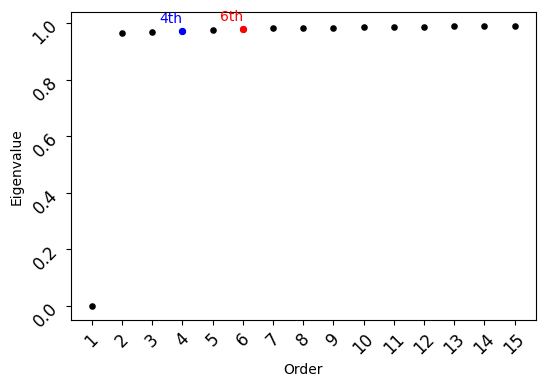

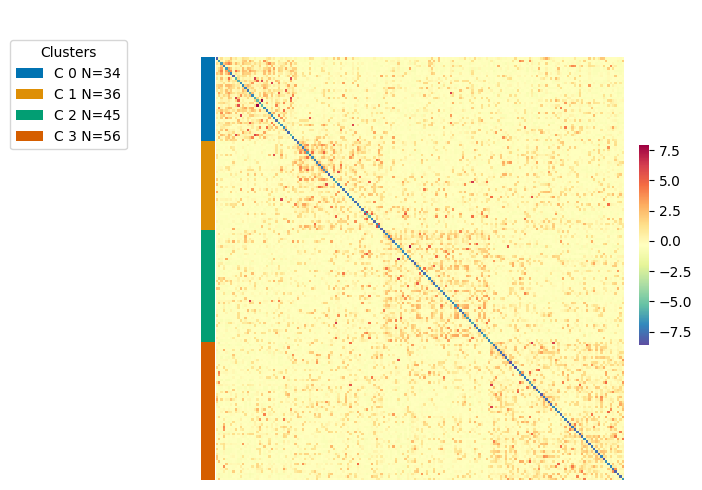

In [147]:
res_dir = results_dir + 'Microbiome+RNA/'
dim = affinity_microbe_mod.shape[0]//10

affinity_micro_rna = snf.snf([affinity_RNA_mod, affinity_microbe_mod], K=dim)

plotting.eigengap_visual(affinity_micro_rna, res_dir)

n_clusters = 4
clus_labels = utils.spectral_clustering_custom(affinity_micro_rna, n_clusters)

plotting.draw_clustermap(clus_labels, affinity_micro_rna, res_dir, 'standard')

     Shannon index  Simpson index  Chao1 richness Cluster
0         5.404588       0.956193           143.0     C 0
1         4.803342       0.890112           165.0     C 3
2         6.020344       0.971639           166.0     C 3
3         5.100961       0.901752           169.0     C 1
4         4.937250       0.922678           123.0     C 3
..             ...            ...             ...     ...
166       5.513889       0.947911           143.0     C 1
167       4.564746       0.888319           129.0     C 3
168       5.887697       0.970314           158.0     C 1
169       5.129678       0.945811           109.0     C 1
170       5.613101       0.960746           132.0     C 3

[171 rows x 4 columns]
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C 0 vs. C 1: **
C 1 vs. C 2: ****
C 2 vs. C 3: ****
C 0 vs. C 2: ns
C 1 vs. C 3: ns
C 0 

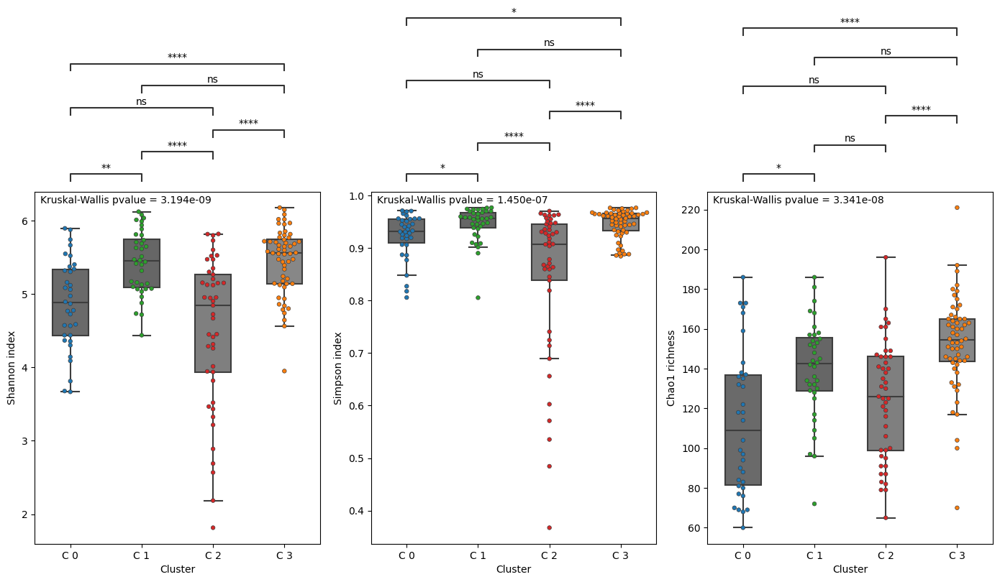

In [107]:
plotting.alpha_diversity_microbiome(micro_fused_rel[micro_fused_rel['Donor'].isin(list(micro_shared['Donor']))].drop(columns=['Donor']), 
                                                    micro_shared['Donor'], clus_labels, res_dir)

## Logistic regression on clusters

Size of metadata: (168, 392)
Size of metadata after NaNs removal: (158, 390)
Shape of the regression input: (158, 8)
C 0
Optimization terminated successfully.
         Current function value: 0.472727
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                  158
Model:                          Logit   Df Residuals:                      149
Method:                           MLE   Df Model:                            8
Date:                Mer, 11 Set 2024   Pseudo R-squ.:                 0.07750
Time:                        14:41:42   Log-Likelihood:                -74.691
converged:                       True   LL-Null:                       -80.966
Covariance Type:            nonrobust   LLR p-value:                    0.1283
                             coef    std err          z      P>|z|      [0.

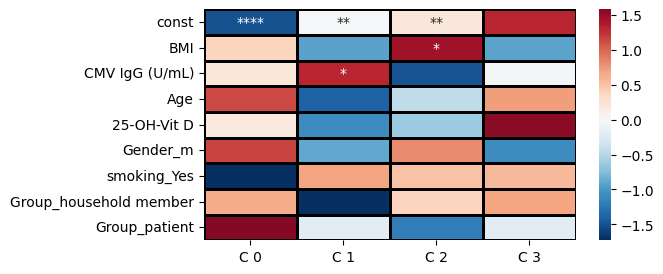

In [148]:
network = []
clus, parameters, pvalues = utils.lr_custom(RNA_shared, meta, clus_labels, res_dir)

network = utils.add_to_network(clus, parameters, pvalues, 'LR_reg', network)

## Addition to LR

Size of metadata: (50, 393)
Size of metadata after NaNs removal: (45, 391)
Shape of the regression input: (45, 9)
C 0
Optimization terminated successfully.
         Current function value: 0.269603
         Iterations: 69
         Function evaluations: 70
         Gradient evaluations: 70
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   45
Model:                          Logit   Df Residuals:                       35
Method:                           MLE   Df Model:                            9
Date:                Mon, 12 Feb 2024   Pseudo R-squ.:                  0.3762
Time:                        17:24:31   Log-Likelihood:                -12.132
converged:                       True   LL-Null:                       -19.450
Covariance Type:            nonrobust   LLR p-value:                    0.1014
                               coef    std err          z      P>|z|      [0.0

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



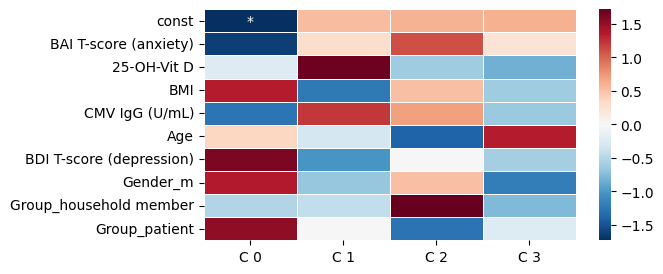

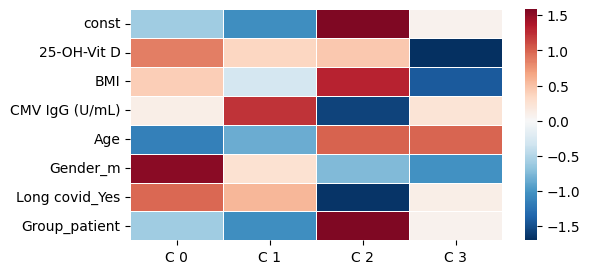

In [48]:
clus, parameters, pvalues = utils.lr_custom(RNA_shared, dep_anx.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels, res_dir)
clus, parameters, pvalues = utils.lr_custom(RNA_shared, covid_patients.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels, res_dir)

## One vs Rest Testing

In [150]:
genenames = normalized_counts['genename']
usable_RNA = normalized_counts.drop(columns = 'genename')
usable_RNA = usable_RNA[[c for c in usable_RNA.columns if c in list(RNA_shared['Donor'])]]
usable_RNA['genename'] = genenames
usable_RNA.reset_index(drop = True, inplace=True)

usable_micro = micro_fused[micro_fused['Donor'].isin(micro_shared['Donor'])]
usable_micro.reset_index(drop = True, inplace = True)


## Temporary analysis

In [103]:
aux = cytof.copy()
aux['Donor'] = cytof_meta['Donor']
cytof_shared = aux[aux['Donor'].isin(aggregated['Donor'])]
cytof_shared = cytof_shared[cytof_shared['Donor'].isin(micro_fused['Donor'])]
cytof_shared.reset_index(drop=True, inplace = True)

usable_cytof = cytof_meta[cytof_meta['Donor'].isin(cytof_shared['Donor'])]

test_labels = pd.DataFrame()
test_labels['labels'] = clus_labels
test_labels['Donor'] = RNA_shared['Donor']

test_labels = pd.merge(test_labels,usable_cytof, how='right')
test_labels.reset_index(drop=True,inplace=True)
test_labels = pd.Series(test_labels['labels'])

usable_cytof.drop(columns = 'Donor', inplace = True)
usable_cytof.reset_index(drop = True, inplace = True)

/var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T/ipykernel_87694/2136915240.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [104]:
multi_chord['Micro+RNA'] = test_labels

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:516: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Cytof number of columns 22
No need to drop Donor


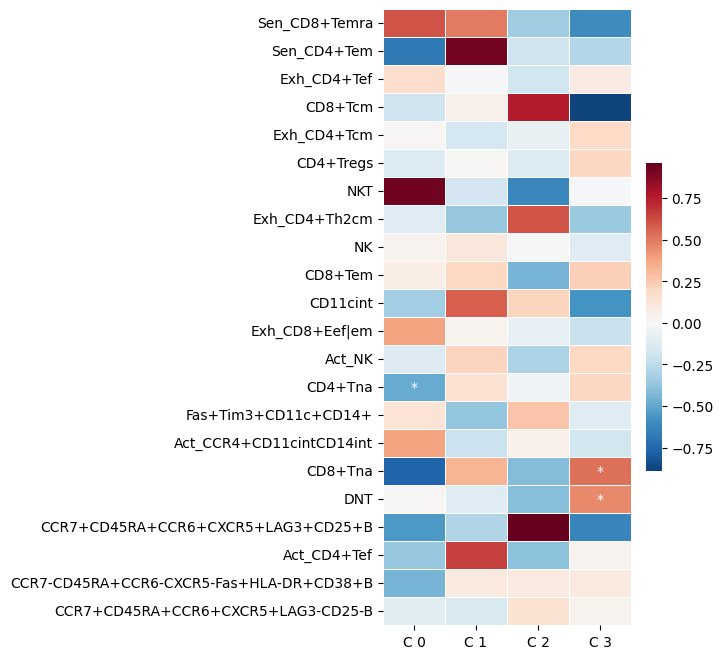

In [33]:
r = utils.cytof_clusters_analysis(usable_cytof, test_labels, res_dir)

network = utils.add_to_network(list(r[0].index), pd.DataFrame(r[1]), pd.DataFrame(r[0].reset_index(drop=True)), r[2], network)

In [19]:
res = plotting.micro_analysis(usable_micro, clus_labels, micro_taxa, res_dir)

[network.append(element) for element in res]

                 t1     t10   t101  t1014  t1015   t102  t1029   t103   t104  \
Donor                                                                          
Covid HH031     0.0  3088.0   96.0    0.0    0.0    0.0    0.0   64.0  109.0   
Covid HH032  9698.0   446.0   88.0    0.0    0.0    0.0    0.0   40.0   70.0   
Covid HH039     7.0   865.0  100.0    9.0    0.0    0.0    2.0  188.0    0.0   
Covid HH053     0.0   361.0   88.0    0.0   12.0    0.0    0.0  138.0  204.0   
Covid HH080     0.0   295.0   81.0    0.0    0.0    0.0    0.0   64.0    0.0   
...             ...     ...    ...    ...    ...    ...    ...    ...    ...   
ERC CO250       0.0  2443.0  136.0   16.0    0.0  209.0    0.0   94.0    0.0   
ERC CO255    8505.0   121.0   84.0    0.0    0.0    0.0    0.0   98.0   11.0   
ERC CO263       0.0  1480.0  440.0    0.0    0.0    0.0    0.0   47.0    0.0   
ERC CO265       0.0  1149.0   92.0    0.0    0.0    0.0    0.0   64.0    0.0   
ERC CO267       0.0   325.0    0.0    0.

AttributeError: module 'rpy2.robjects.pandas2ri' has no attribute 'py2ri'

## GSEA

In [151]:
gsea_res = utils.gsea_analysis_single(usable_RNA, clus_labels, res_dir, hallmark)

# Multiset analysis
utils.gsea_analysis_multi(usable_RNA, clus_labels, res_dir, path_sets)

# Add GSEA results to the network
[network.append(element) for element in gsea_res]

#plotting.draw_network(network, clus_labels, res_dir)

2024-09-11 14:42:01,731 [WARNING] Dropping duplicated gene names, only keep the first values


2024-09-11 14:42:05,016 [WARNING] Dropping duplicated gene names, only keep the first values
2024-09-11 14:42:07,661 [WARNING] Dropping duplicated gene names, only keep the first values
2024-09-11 14:42:10,302 [WARNING] Dropping duplicated gene names, only keep the first values
2024-09-11 14:42:13,189 [WARNING] Dropping duplicated gene names, only keep the first values
2024-09-11 14:42:19,383 [WARNING] Dropping duplicated gene names, only keep the first values
2024-09-11 14:42:21,208 [WARNING] Dropping duplicated gene names, only keep the first values
2024-09-11 14:42:51,016 [WARNING] Dropping duplicated gene names, only keep the first values
2024-09-11 14:42:55,299 [WARNING] Dropping duplicated gene names, only keep the first values
2024-09-11 14:43:03,764 [WARNING] Dropping duplicated gene names, only keep the first values
2024-09-11 14:43:09,763 [WARNING] Dropping duplicated gene names, only keep the first values
2024-09-11 14:43:11,507 [WARNING] Dropping duplicated gene names, only

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

## GSEA on BACTERIA

Cluster C 0
Cluster C 1
Cluster C 2
Cluster C 3


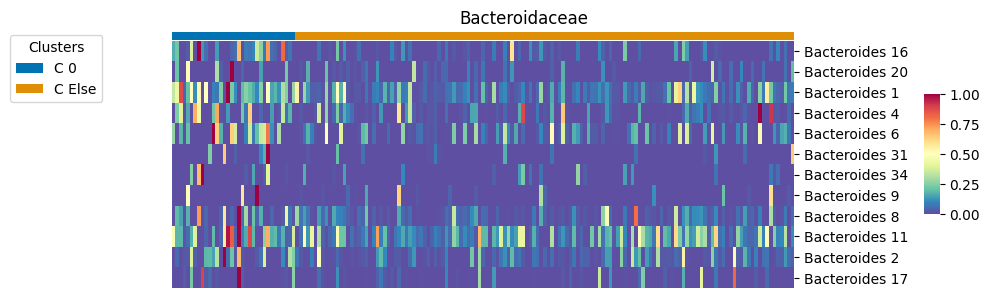

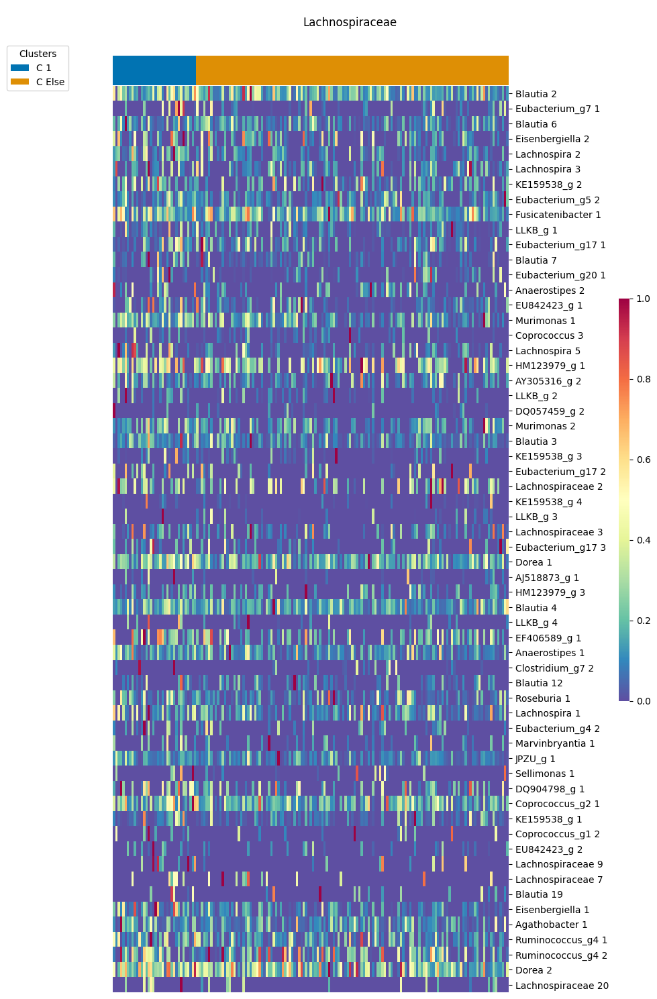

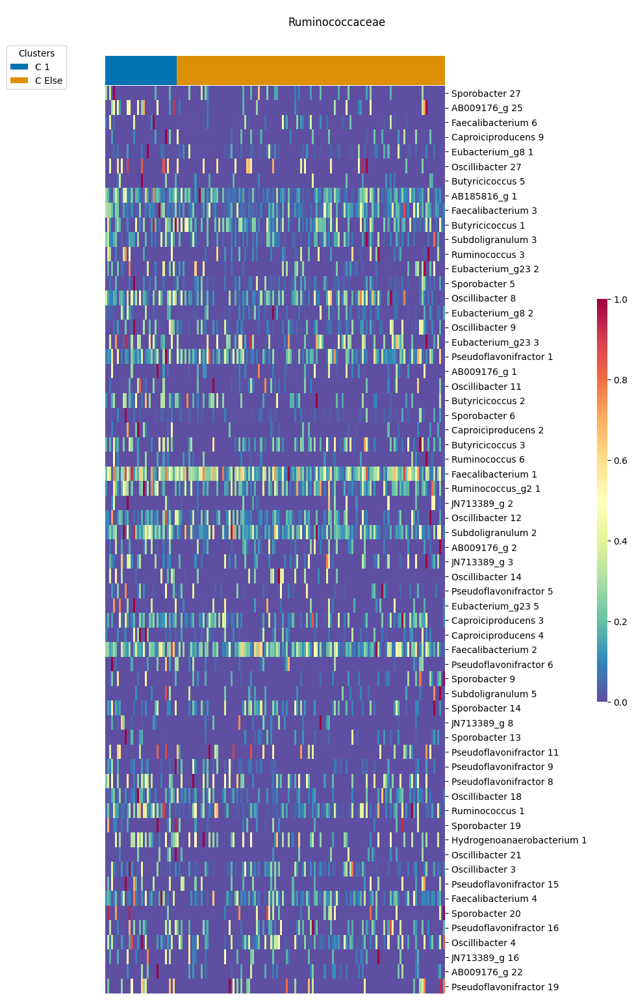

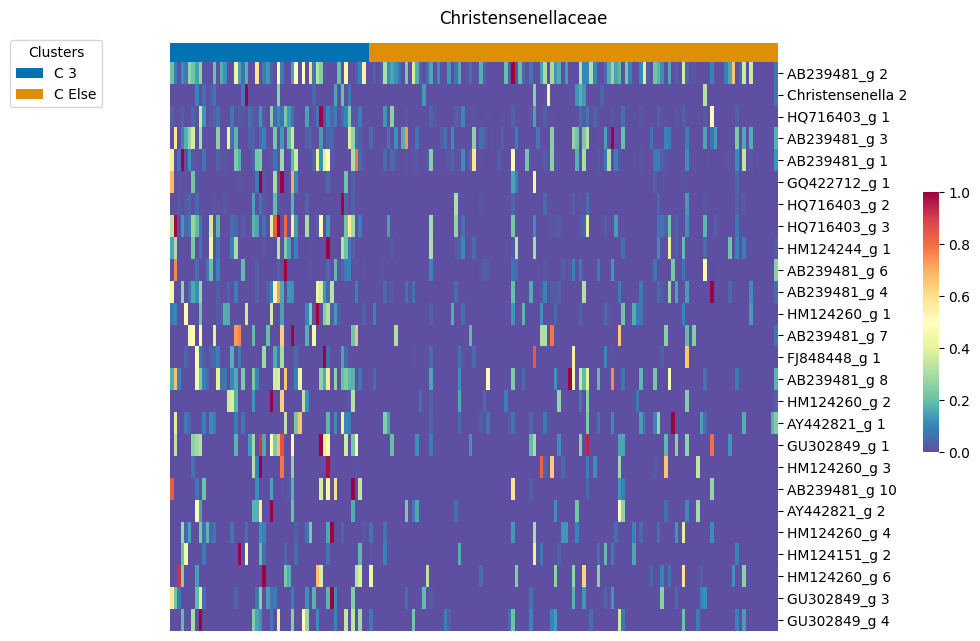

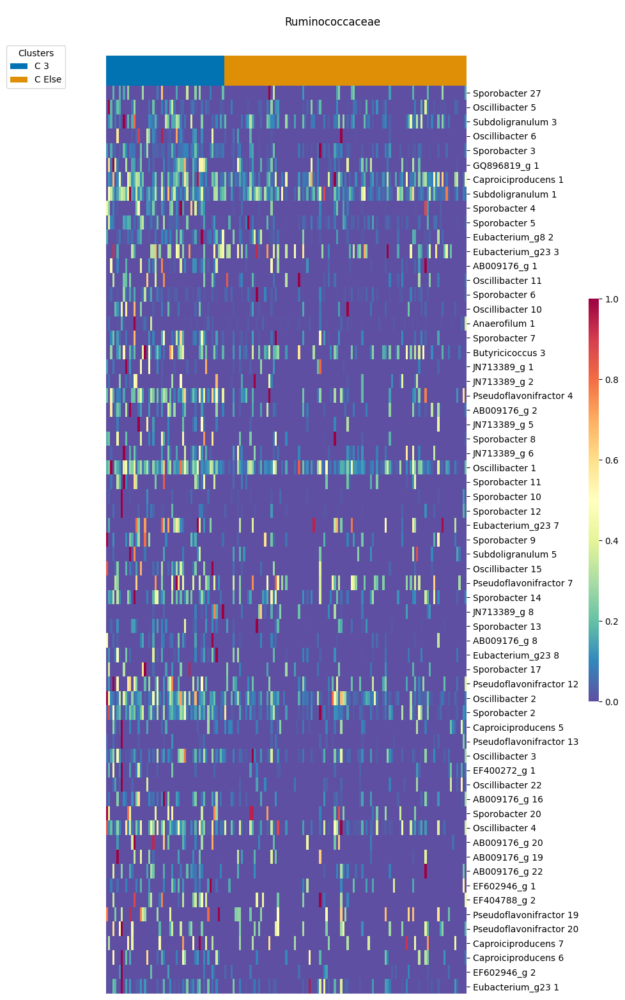

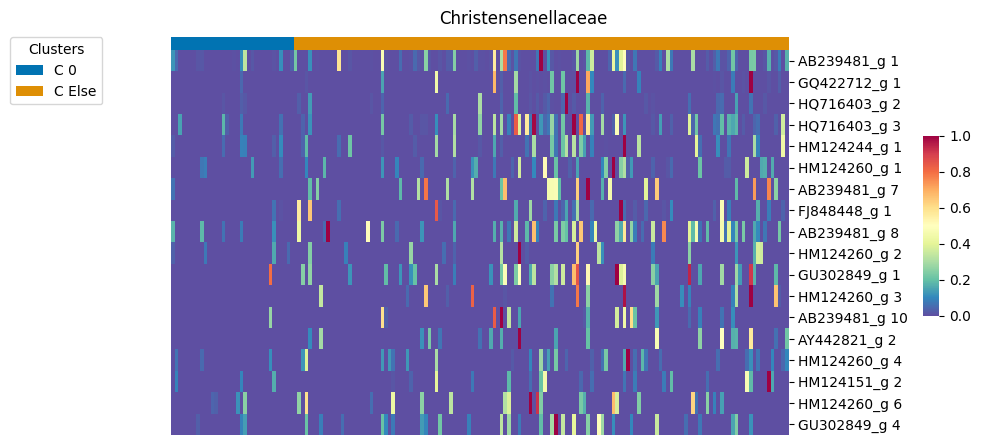

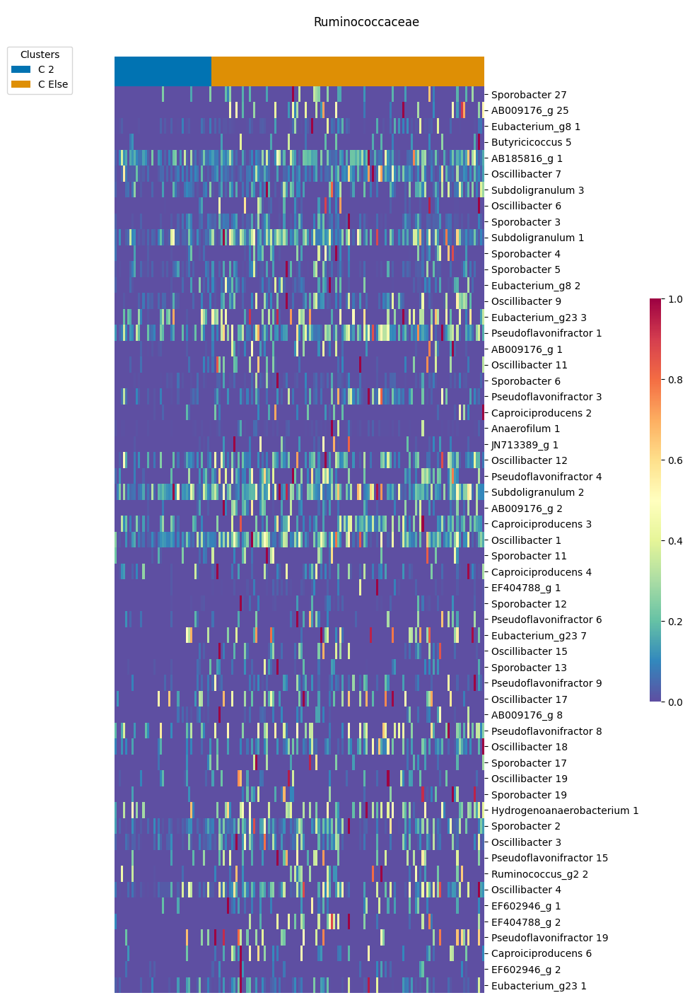

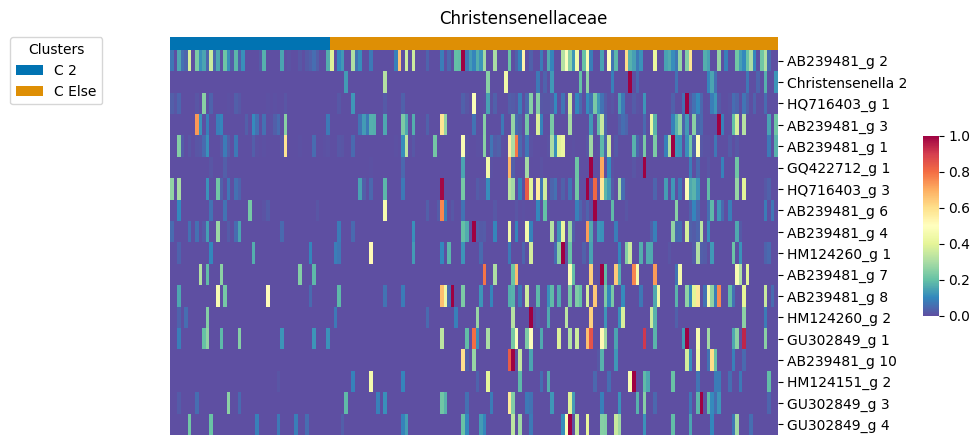

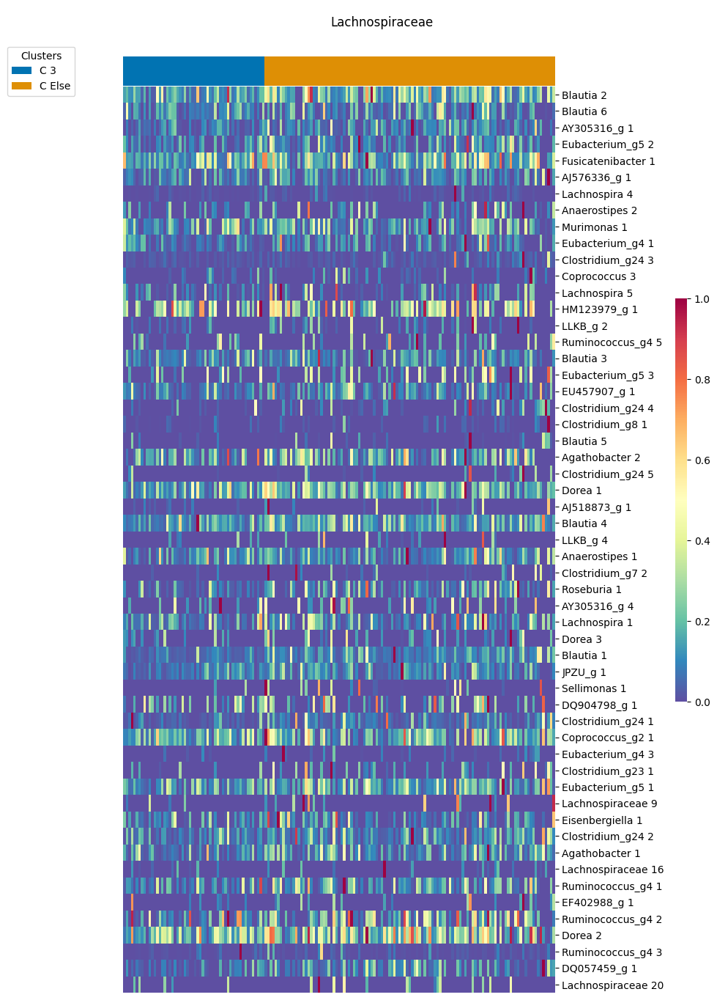

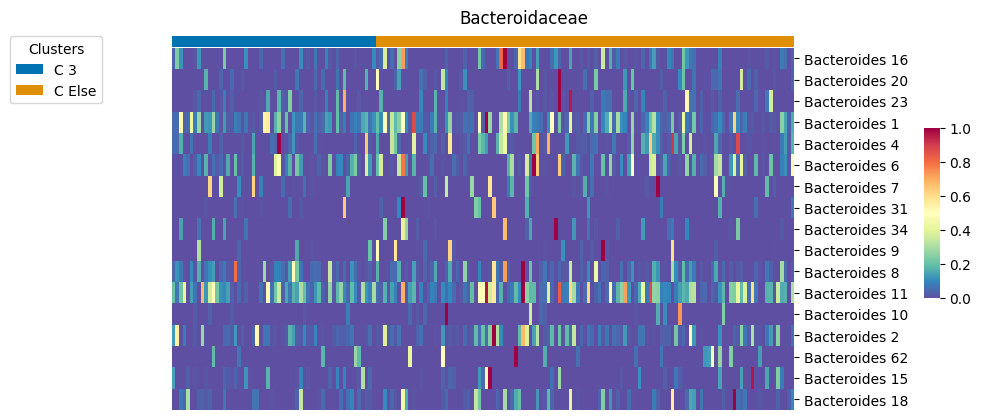

In [152]:
res = utils.gsea_analysis_bacteria(micro_data_norm.iloc[:,micro_data_norm.columns.isin(list(usable_micro['Donor'])+['genename'])],
                                clus_labels, res_dir, [custom_bacteria_gene_lists])

[network.append(element) for element in res]

utils.plot_heatmaps_gsea_bacteria(res, micro_fused_rel[micro_fused_rel['Donor'].isin(list(usable_micro['Donor']))].reset_index(drop=True), 
                                clus_labels, micro_taxa, res_dir)


In [28]:
# for every element in the list network, take the 'table' element and split it
for element in network:
    if element['target'] == 'C 0':
        element['target'] = 'M&R Upregulated\nmetabolic sets'
    if element['target'] == 'C 1':
        element['target'] = 'M&R CMV seropositive'
    if element['target'] == 'C 2':
        element['target'] = 'M&R Higher BMI\n(Prevotella)'
    if element['target'] == 'C 3':
        element['target'] = 'M&R Ruminococcaceae &\nChristensenellaceae - driven'
        
        
# replace values in a pd.Series
clus_labels.replace({'C 0': 'M&R Upregulated\nmetabolic sets', 'C 1': 'M&R CMV seropositive', 'C 2': 'M&R Higher BMI\n(Prevotella)', 'C 3': 'M&R Ruminococcaceae &\nChristensenellaceae - driven'}, inplace=True)

plotting.draw_network(network, clus_labels, res_dir)

# Microbiome vs TCRseq

In [ ]:
micro_shared = micro_fused[micro_fused['Donor'].isin(tcr_stats_fused_top['Donor'])]
micro_shared.reset_index(drop=True, inplace = True)

tcr_shared = tcr_stats_fused_top[tcr_stats_fused_top['Donor'].isin(micro_fused['Donor'])]
tcr_shared.reset_index(drop = True, inplace = True)

In [ ]:
# Microbiome
idx = list(set(range(affinity_microbe.shape[0])).difference(list(micro_fused[~micro_fused['Donor'].isin(tcr_stats_fused_top['Donor'])].index)))
affinity_microbe_mod = affinity_microbe[np.ix_(idx,idx)]
print(affinity_microbe_mod.shape)
# TCR
idx = list(set(range(affinity_tcr_fused_top.shape[0])).difference(list(tcr_stats_fused_top[~tcr_stats_fused_top['Donor'].isin(micro_fused['Donor'])].index)))
affinity_tcr_fused_top_mod = affinity_tcr_fused_top[np.ix_(idx,idx)]
print(affinity_tcr_fused_top_mod.shape)

(71, 71)
(71, 71)


Silhouette score: 0.11121031860698134


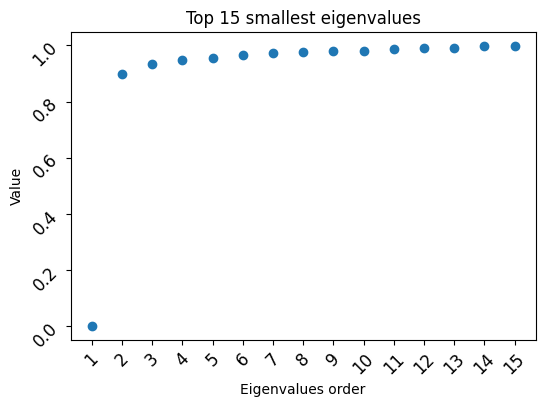

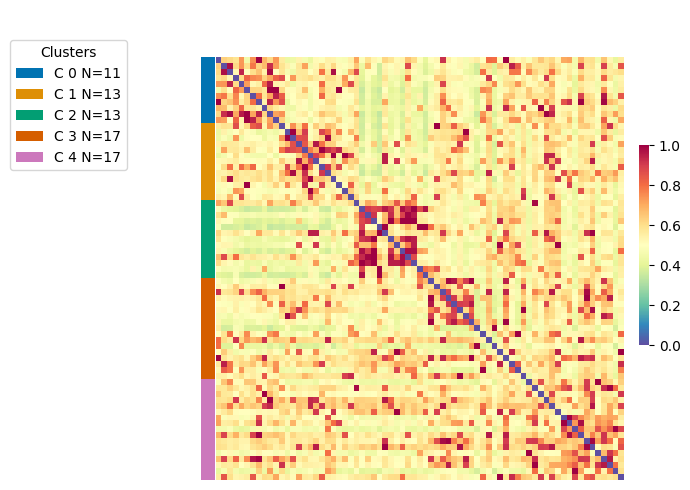

In [ ]:
res_dir = results_dir + 'Microbiome+TCR/'
dim = affinity_microbe_mod.shape[0]//10

affinity_micro_tcr = snf.snf([affinity_microbe_mod, affinity_tcr_fused_top_mod], K=dim)

plotting.eigengap_visual(affinity_micro_tcr, res_dir)

n_clusters = 5
clus_labels = utils.spectral_clustering_custom(affinity_micro_tcr, n_clusters)

plotting.draw_clustermap(clus_labels, affinity_micro_tcr, res_dir, 'minmax')

    Shannon index  Simpson index  Chao1 richness Cluster
0        5.404588       0.956193           143.0     C 4
1        4.803342       0.890112           165.0     C 3
2        6.020344       0.971639           166.0     C 1
3        4.937250       0.922678           123.0     C 0
4        5.667028       0.960775           164.0     C 1
..            ...            ...             ...     ...
66       5.565463       0.943235           161.0     C 3
67       4.955365       0.940961           100.0     C 4
68       5.143139       0.940709           118.0     C 2
69       4.720536       0.938593            72.0     C 4
70       4.564746       0.888319           129.0     C 3

[71 rows x 4 columns]
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C 0 vs. C 1: ns
C 1 vs. C 2: ns
C 2 vs. C 3: ns
C 3 vs. C 4: ns
C 0 vs. C 2: ***
C 1 vs. C 3: ns
C 2 

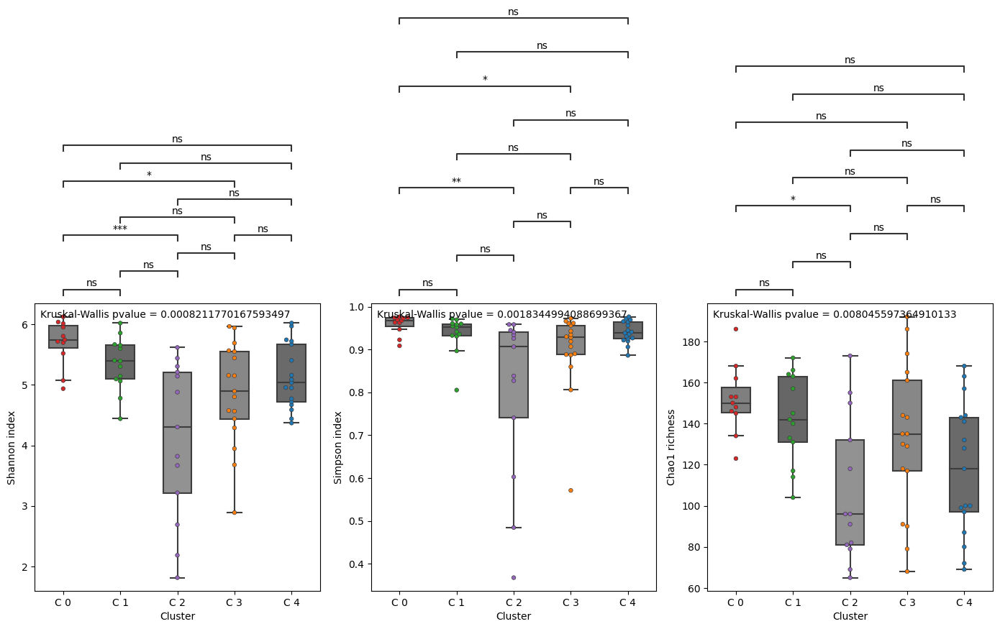

In [ ]:
plotting.alpha_diversity_microbiome(micro_fused_rel[micro_fused_rel['Donor'].isin(list(micro_shared['Donor']))].drop(columns=['Donor']), 
                                                    micro_shared['Donor'], clus_labels, res_dir)

## Logistic regression on clusters

Size of metadata: (71, 409)
Size of metadata after NaNs removal: (68, 407)
Shape of the regression input: (68, 7)
C 0
Optimization terminated successfully.
         Current function value: 0.395646
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   68
Model:                          Logit   Df Residuals:                       60
Method:                           MLE   Df Model:                            7
Date:                Thu, 01 Feb 2024   Pseudo R-squ.:                 0.05251
Time:                        15:22:25   Log-Likelihood:                -26.904
converged:                       True   LL-Null:                       -28.395
Covariance Type:            nonrobust   LLR p-value:                    0.8867
                             coef    std err          z      P>|z|      [0.025

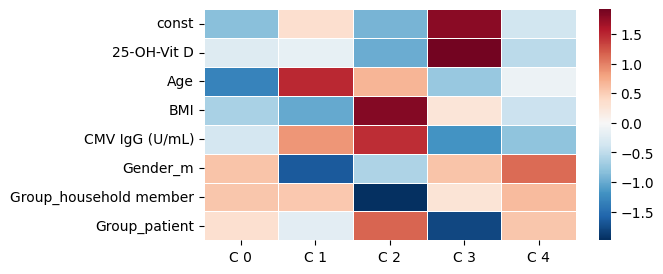

In [ ]:
network = []
clus, parameters, pvalues = utils.lr_custom(tcr_shared, meta, clus_labels, res_dir)

network = utils.add_to_network(clus, parameters, pvalues, 'LR_reg', network)


## Addition to LR

Size of metadata: (18, 411)
Size of metadata after NaNs removal: (17, 409)
Shape of the regression input: (17, 9)
C 0
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   17
Model:                          Logit   Df Residuals:                        7
Method:                           MLE   Df Model:                            9
Date:                Thu, 01 Feb 2024   Pseudo R-squ.:                   1.000
Time:                        15:22:26   Log-Likelihood:            -0.00014782
converged:                       True   LL-Null:                       -6.1576
Covariance Type:            nonrobust   LLR p-value:                    0.1961
                               coef    std err          z      P>|z|      [0.0

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params avail

Size of metadata: (49, 410)
Size of metadata after NaNs removal: (47, 408)
Shape of the regression input: (47, 7)
C 0
Optimization terminated successfully.
         Current function value: 0.321044
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   47
Model:                          Logit   Df Residuals:                       40
Method:                           MLE   Df Model:                            6
Date:                Thu, 01 Feb 2024   Pseudo R-squ.:                  0.2372
Time:                        15:22:27   Log-Likelihood:                -15.089
converged:                       True   LL-Null:                       -19.780
Covariance Type:            nonrobust   LLR p-value:                    0.1532
                     coef    std err          z      P>|z|      [0.025      0.

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



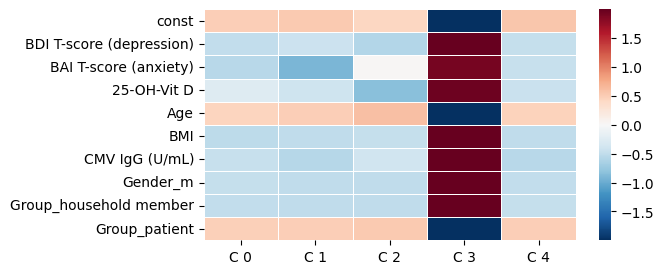

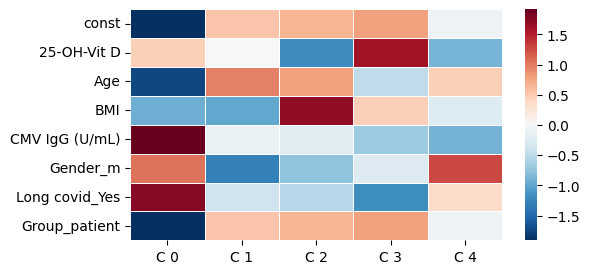

In [ ]:
clus, parameters, pvalues = utils.lr_custom(tcr_shared, dep_anx.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels, res_dir)
clus, parameters, pvalues = utils.lr_custom(tcr_shared, covid_patients.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels, res_dir)

## One vs Rest Testing

In [ ]:
usable_TCR = TCR_stats[TCR_stats['Donor'].isin(tcr_shared['Donor'])]
usable_TCR.drop(columns = 'Donor', inplace = True)
usable_TCR.reset_index(drop = True, inplace = True)

usable_micro = micro_fused[micro_fused['Donor'].isin(micro_shared['Donor'])]
usable_micro.reset_index(drop = True, inplace = True)

/var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T/ipykernel_91440/1074349785.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



   mann_pvalues          features cluster
0      0.459947        entropyCD4     C 0
1      0.805441        entropyCD8     C 0
2      0.879319  tcrcovidmatchCD4     C 0
3      0.208498  tcrcovidmatchCD8     C 0
4      0.829173   tcrcovidfreqCD4     C 0
5      0.766923   tcrcovidfreqCD8     C 0
0      0.749232        entropyCD4     C 1
1      0.330144        entropyCD8     C 1
2      0.164338  tcrcovidmatchCD4     C 1
3      0.182174  tcrcovidmatchCD8     C 1
4      0.103127   tcrcovidfreqCD4     C 1
5      0.032070   tcrcovidfreqCD8     C 1
0      0.006966        entropyCD4     C 2
1      0.934829        entropyCD8     C 2
2      0.055622  tcrcovidmatchCD4     C 2
3      0.003384  tcrcovidmatchCD8     C 2
4      0.001175   tcrcovidfreqCD4     C 2
5      0.000030   tcrcovidfreqCD8     C 2
0      0.813589        entropyCD4     C 3
1      0.603930        entropyCD8     C 3
2      0.828343  tcrcovidmatchCD4     C 3
3      0.509977  tcrcovidmatchCD8     C 3
4      0.881500   tcrcovidfreqCD4 

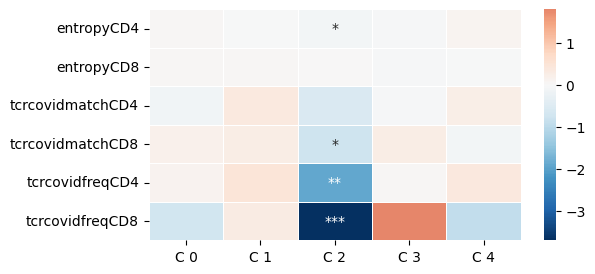

In [ ]:
res = plotting.mann_sign([(usable_TCR, 'TCR')], clus_labels, res_dir)

for r in res:
    network = utils.add_to_network(list(r[0].index), pd.DataFrame(r[1]), pd.DataFrame(r[0].reset_index(drop=True)), r[2], network)

In [ ]:
res = plotting.micro_analysis(usable_micro, clus_labels, micro_taxa, res_dir)

[network.append(element) for element in res]

[None, None, None, None, None, None, None, None, None, None, None]

## GSEA on BACTERIA

Cluster C 0
Cluster C 1
Cluster C 2
Cluster C 3
Cluster C 4


<class 'pyvis.network.Network'> |N|=23 |E|=21

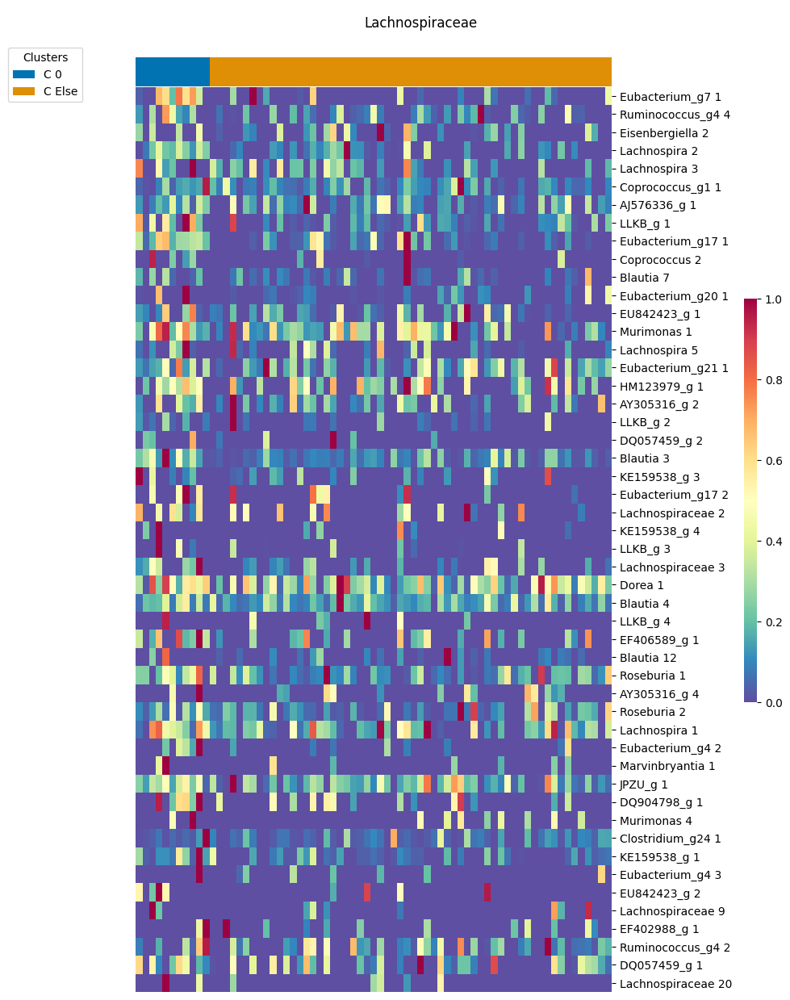

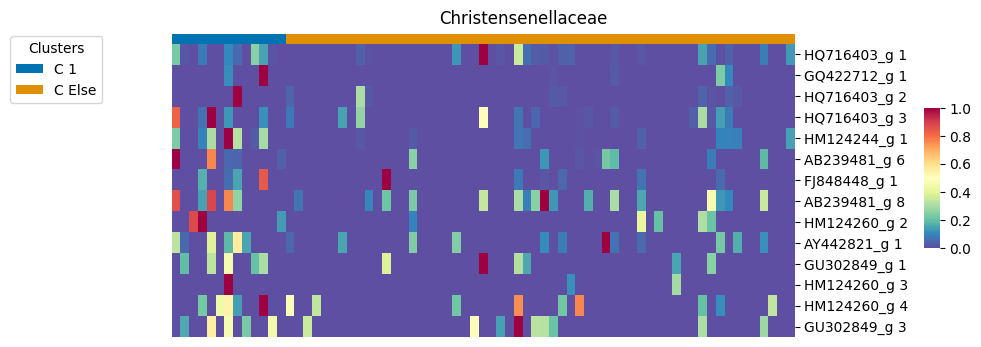

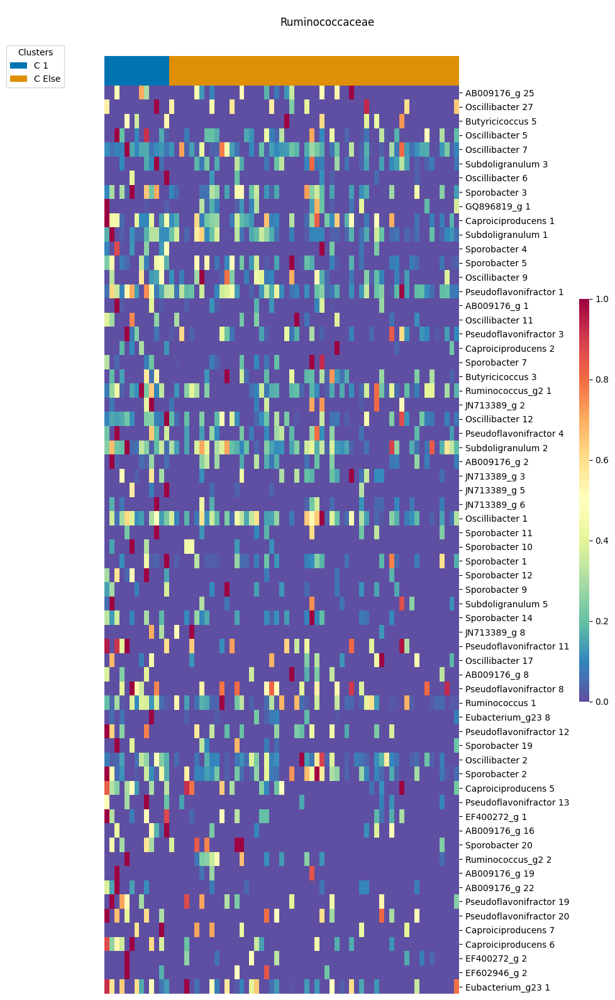

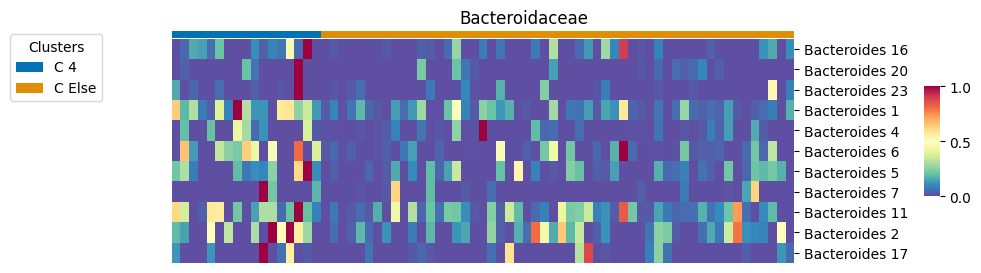

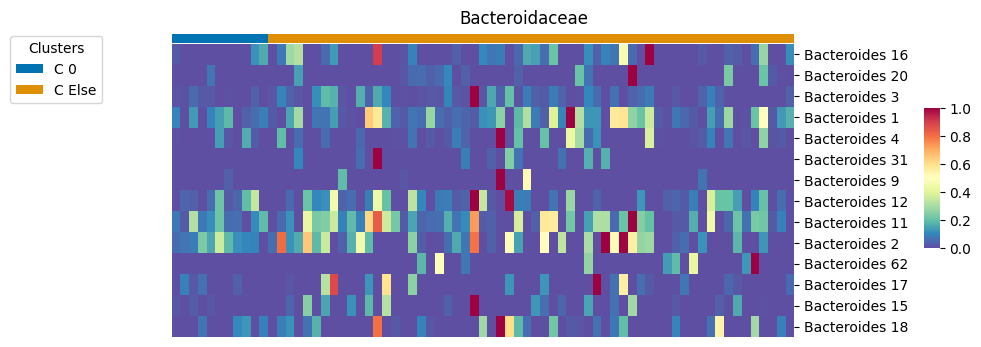

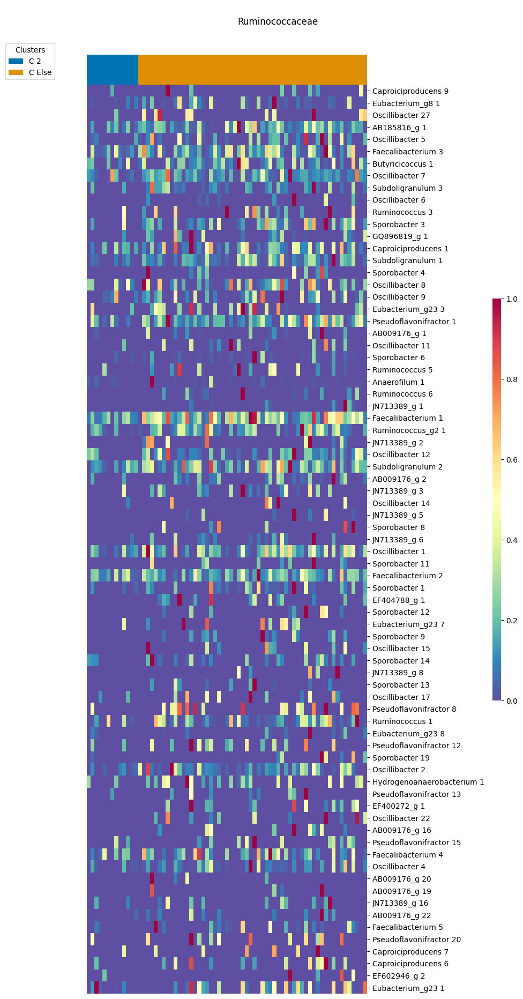

In [ ]:
res = utils.gsea_analysis_bacteria(micro_data_norm.iloc[:,micro_data_norm.columns.isin(list(usable_micro['Donor'])+['genename'])],
                                clus_labels, res_dir, [custom_bacteria_gene_lists])

[network.append(element) for element in res]

utils.plot_heatmaps_gsea_bacteria(res, micro_fused_rel[micro_fused_rel['Donor'].isin(list(usable_micro['Donor']))].reset_index(drop=True), 
                                clus_labels, micro_taxa, res_dir)

plotting.draw_network(network, clus_labels, res_dir)

# Microbiome vs Cytof

In [105]:
micro_shared = micro_fused[micro_fused['Donor'].isin(cytof_meta['Donor'])]
micro_shared.reset_index(drop=True, inplace = True)

cytof_shared = cytof[cytof_meta['Donor'].isin(micro_fused['Donor'])]
cytof_shared.reset_index(drop = True, inplace = True)

In [106]:
# Cytof
idx = list(set(range(affinity_cytof.shape[0])).difference(list(cytof[~cytof_meta['Donor'].isin(micro_fused['Donor'])].index)))
affinity_cytof_mod = affinity_cytof[np.ix_(idx,idx)]
print(affinity_cytof_mod.shape)
# Microbiome
idx = list(set(range(affinity_microbe.shape[0])).difference(list(micro_fused[~micro_fused['Donor'].isin(cytof_meta['Donor'])].index)))
affinity_microbe_mod = affinity_microbe[np.ix_(idx,idx)]
print(affinity_microbe_mod.shape)

(101, 101)
(101, 101)


Silhouette score: 0.08088424650149913


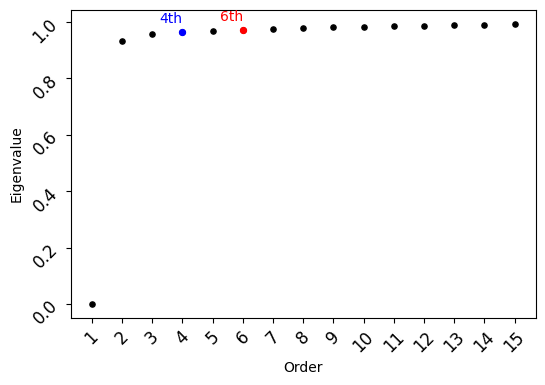

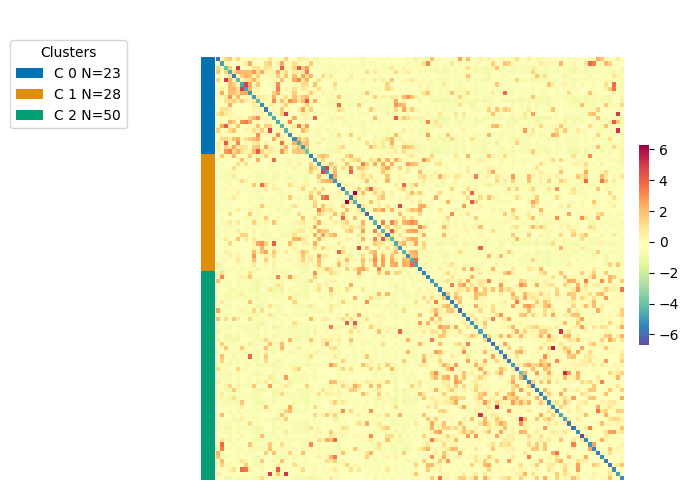

In [107]:
res_dir = results_dir + 'Microbiome+Cytof/'
dim = affinity_microbe_mod.shape[0]//10

affinity_micro_cytof = snf.snf([affinity_microbe_mod, affinity_cytof_mod], K=dim)

plotting.eigengap_visual(affinity_micro_cytof, res_dir)

n_clusters = 3
clus_labels = utils.spectral_clustering_custom(affinity_micro_cytof, n_clusters)

plotting.draw_clustermap(clus_labels, affinity_micro_cytof, res_dir, 'standard')

     Shannon index  Simpson index  Chao1 richness Cluster
0         5.404588       0.956193           143.0     C 0
1         4.803342       0.890112           165.0     C 2
2         5.667028       0.960775           164.0     C 1
3         5.151253       0.929988           135.0     C 2
4         2.185117       0.484440            65.0     C 1
..             ...            ...             ...     ...
96        4.720536       0.938593            72.0     C 0
97        4.564746       0.888319           129.0     C 0
98        5.887697       0.970314           158.0     C 1
99        6.146568       0.973593           189.0     C 2
100       5.613101       0.960746           132.0     C 1

[101 rows x 4 columns]
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C 0 vs. C 1: ns
C 1 vs. C 2: *
C 0 vs. C 2: ***
p-value annotation legend:
      ns: 5.0

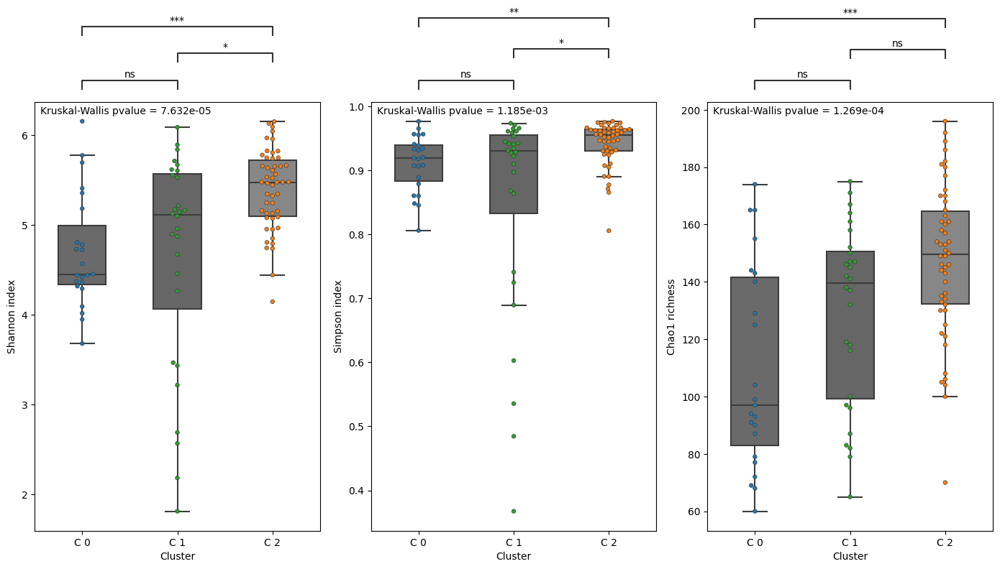

In [52]:
plotting.alpha_diversity_microbiome(micro_fused_rel[micro_fused_rel['Donor'].isin(list(micro_shared['Donor']))].drop(columns=['Donor']), 
                                                    micro_shared['Donor'], clus_labels, res_dir)

## Logistic regression on clusters

Size of metadata: (100, 396)
Size of metadata after NaNs removal: (94, 394)
Shape of the regression input: (94, 7)
C 0
Optimization terminated successfully.
         Current function value: 0.504843
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   94
Model:                          Logit   Df Residuals:                       86
Method:                           MLE   Df Model:                            7
Date:                Tue, 13 Feb 2024   Pseudo R-squ.:                 0.09269
Time:                        09:32:16   Log-Likelihood:                -47.455
converged:                       True   LL-Null:                       -52.303
Covariance Type:            nonrobust   LLR p-value:                    0.2065
                             coef    std err          z      P>|z|      [0.02

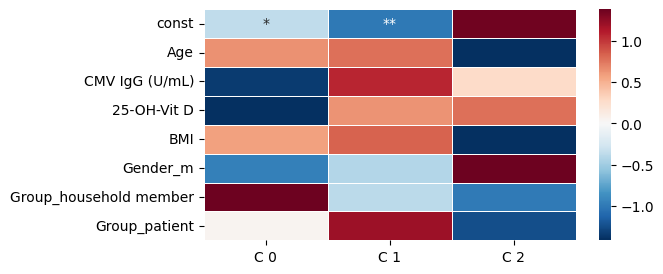

In [45]:
network = []
clus, parameters, pvalues = utils.lr_custom(micro_shared, meta, clus_labels, res_dir)

network = utils.add_to_network(clus, parameters, pvalues, 'LR_reg', network)


## Addition to LR

Size of metadata: (30, 398)
Size of metadata after NaNs removal: (27, 396)
Shape of the regression input: (27, 9)
C 0
Optimization terminated successfully.
         Current function value: 0.247560
         Iterations: 75
         Function evaluations: 76
         Gradient evaluations: 76
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   27
Model:                          Logit   Df Residuals:                       17
Method:                           MLE   Df Model:                            9
Date:                Fri, 09 Feb 2024   Pseudo R-squ.:                  0.6337
Time:                        15:53:46   Log-Likelihood:                -6.6841
converged:                       True   LL-Null:                       -18.249
Covariance Type:            nonrobust   LLR p-value:                  0.005910
                               coef    std err          z      P>|z|      [0.0

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp



Size of metadata: (29, 397)
Size of metadata after NaNs removal: (28, 395)
Shape of the regression input: (28, 7)
C 0
Optimization terminated successfully.
         Current function value: 0.447914
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   28
Model:                          Logit   Df Residuals:                       21
Method:                           MLE   Df Model:                            6
Date:                Fri, 09 Feb 2024   Pseudo R-squ.:                  0.2035
Time:                        15:53:47   Log-Likelihood:                -12.542
converged:                       True   LL-Null:                       -15.745
Covariance Type:            nonrobust   LLR p-value:                    0.3791
                     coef    std err          z      P>|z|      [0.025      0.

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



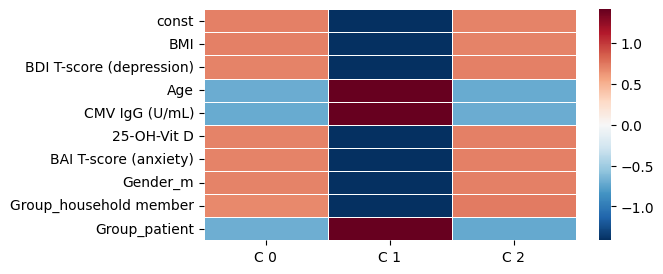

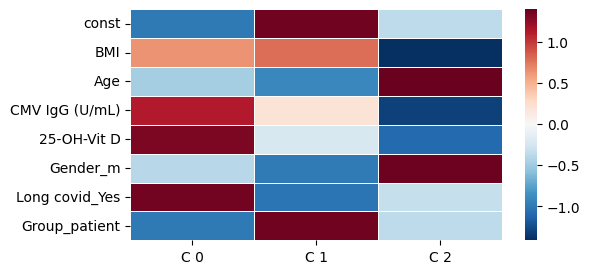

In [95]:
clus, parameters, pvalues = utils.lr_custom(micro_shared, dep_anx.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels, res_dir)
clus, parameters, pvalues = utils.lr_custom(micro_shared, covid_patients.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels, res_dir)

## One vs Rest Testing

In [108]:
usable_micro = micro_fused[micro_fused['Donor'].isin(micro_shared['Donor'])]
usable_micro.reset_index(drop = True, inplace = True)

usable_cytof = cytof_meta[cytof_meta['Donor'].isin(micro_fused['Donor'])]
usable_cytof.drop(columns = 'Donor', inplace = True)
usable_cytof.reset_index(drop = True, inplace = True)

/var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T/ipykernel_87694/803847092.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Temporary analysis

In [109]:
RNA_shared = aggregated[aggregated['Donor'].isin(cytof_meta['Donor'])]
RNA_shared = RNA_shared[RNA_shared['Donor'].isin(micro_fused['Donor'])]
RNA_shared.reset_index(drop=True, inplace = True)

genenames = normalized_counts['genename']
usable_RNA = normalized_counts.drop(columns = 'genename')
usable_RNA = usable_RNA[[c for c in usable_RNA.columns if c in list(RNA_shared['Donor'])]]
usable_RNA['genename'] = genenames
usable_RNA.reset_index(drop = True, inplace=True)

test_labels = pd.DataFrame()
test_labels['labels'] = clus_labels
test_labels['Donor'] = micro_shared['Donor']

test_labels = pd.merge(test_labels, RNA_shared, how='right')
test_labels.reset_index(drop=True,inplace=True)
test_labels = pd.Series(test_labels['labels'])

In [110]:
multi_chord['Cytof+Micro'] = test_labels

In [111]:
chord = pd.DataFrame()
chord['from'] = test_labels

In [100]:
gsea_res = utils.gsea_analysis_single(usable_RNA, test_labels, res_dir, hallmark)

# Add GSEA results to the network
[network.append(element) for element in gsea_res]

2024-02-09 15:53:50,500 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-09 15:53:51,661 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-09 15:53:53,085 [WARNING] Dropping duplicated gene names, only keep the first values


[]

In [101]:
res = plotting.micro_analysis(usable_micro, clus_labels, micro_taxa, res_dir)

[network.append(element) for element in res]

[1] "Warning: Deleting existing log file: /var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T//RtmpR394O7/maaslin2.output.folder/maaslin2.log"
2024-02-09 15:54:30 INFO::Writing function arguments to log file
2024-02-09 15:54:30 INFO::Verifying options selected are valid
2024-02-09 15:54:30 INFO::Determining format of input files
2024-02-09 15:54:30 INFO::Input format is data samples as rows and metadata samples as rows
2024-02-09 15:54:30 INFO::Formula for fixed effects: expr ~  cluster_0
2024-02-09 15:54:30 INFO::Filter data based on min abundance and min prevalence
2024-02-09 15:54:30 INFO::Total samples in data: 101
2024-02-09 15:54:30 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-02-09 15:54:30 INFO::Total filtered features: 0
2024-02-09 15:54:30 INFO::Filtered feature names from abundance and prevalence filtering:
2024-02-09 15:54:30 INFO::Total filtered features with variance filtering: 0
2024-02-09 15:54:30 INFO::Filtered feature name

[1] "Warning: Deleting existing log file: /var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T//RtmpR394O7/maaslin2.output.folder/maaslin2.log"
2024-02-09 15:54:31 INFO::Writing function arguments to log file
2024-02-09 15:54:31 INFO::Verifying options selected are valid
2024-02-09 15:54:31 INFO::Determining format of input files
2024-02-09 15:54:31 INFO::Input format is data samples as rows and metadata samples as rows
2024-02-09 15:54:31 INFO::Formula for fixed effects: expr ~  cluster_2
2024-02-09 15:54:31 INFO::Filter data based on min abundance and min prevalence
2024-02-09 15:54:31 INFO::Total samples in data: 101
2024-02-09 15:54:31 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-02-09 15:54:31 INFO::Total filtered features: 0
2024-02-09 15:54:31 INFO::Filtered feature names from abundance and prevalence filtering:
2024-02-09 15:54:31 INFO::Total filtered features with variance filtering: 0
2024-02-09 15:54:31 INFO::Filtered feature name

[1] "Warning: Deleting existing log file: /var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T//RtmpR394O7/maaslin2.output.folder/maaslin2.log"
2024-02-09 15:54:32 INFO::Writing function arguments to log file
2024-02-09 15:54:32 INFO::Verifying options selected are valid
2024-02-09 15:54:32 INFO::Determining format of input files
2024-02-09 15:54:32 INFO::Input format is data samples as rows and metadata samples as rows
2024-02-09 15:54:32 INFO::Formula for fixed effects: expr ~  cluster_1
2024-02-09 15:54:32 INFO::Filter data based on min abundance and min prevalence
2024-02-09 15:54:32 INFO::Total samples in data: 101
2024-02-09 15:54:32 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-02-09 15:54:32 INFO::Total filtered features: 0
2024-02-09 15:54:32 INFO::Filtered feature names from abundance and prevalence filtering:
2024-02-09 15:54:32 INFO::Total filtered features with variance filtering: 0
2024-02-09 15:54:32 INFO::Filtered feature name









-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)











-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)











-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)






[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

## Cytof clusters analysis

Cytof number of columns 22
No need to drop Donor


/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:516: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



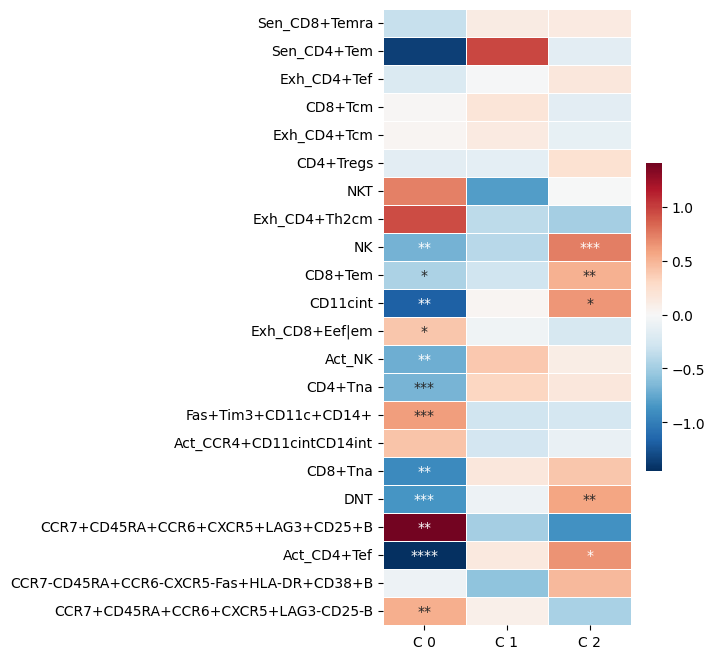

In [102]:
r = utils.cytof_clusters_analysis(usable_cytof,clus_labels, res_dir)

network = utils.add_to_network(list(r[0].index), pd.DataFrame(r[1]), pd.DataFrame(r[0].reset_index(drop=True)), r[2], network)

## GSEA on BACTERIA

Cluster C 0
Cluster C 1
Cluster C 2


<class 'pyvis.network.Network'> |N|=30 |E|=35

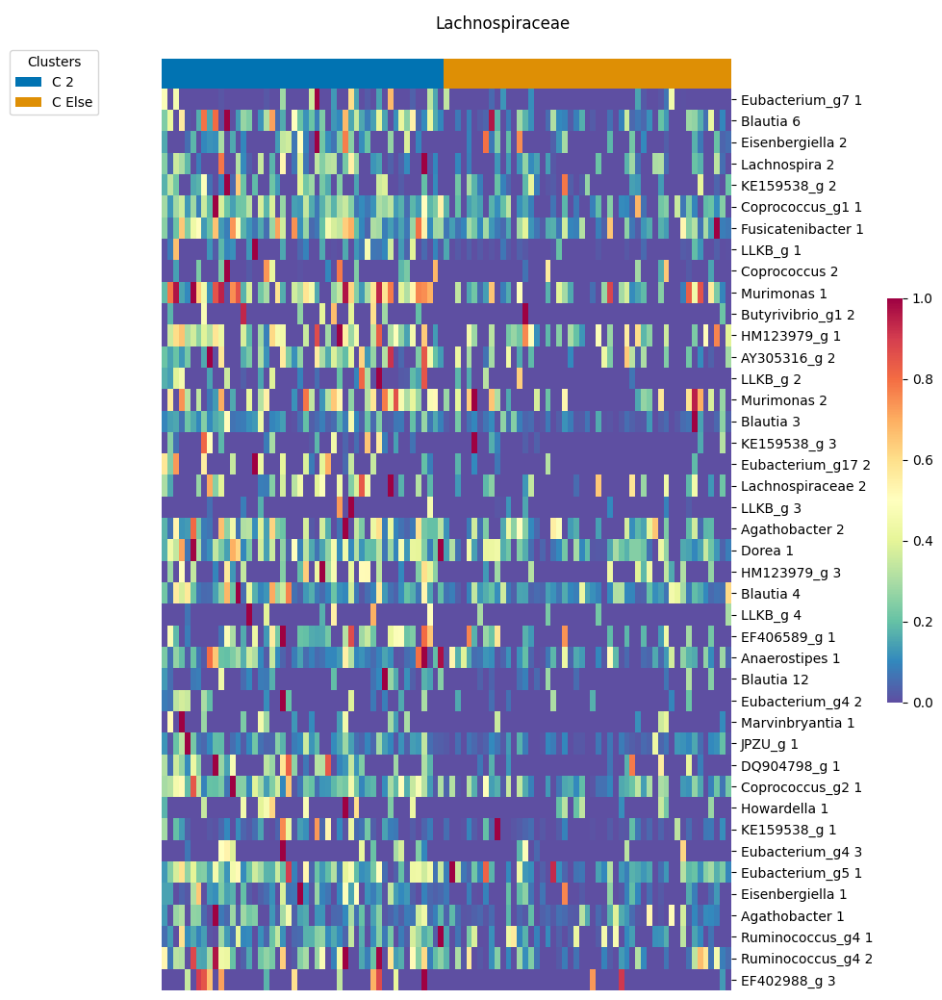

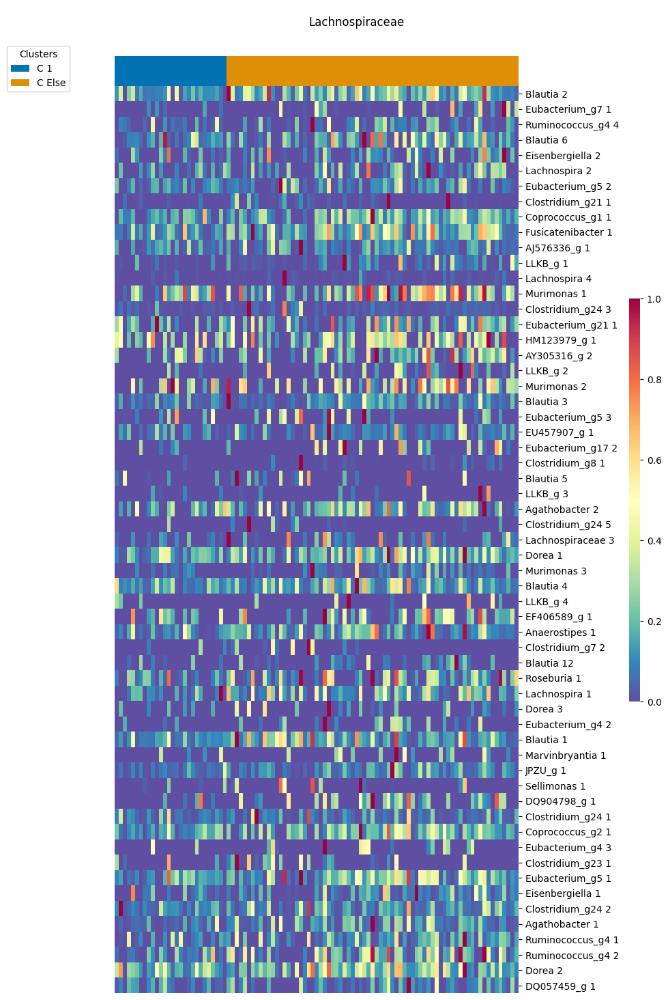

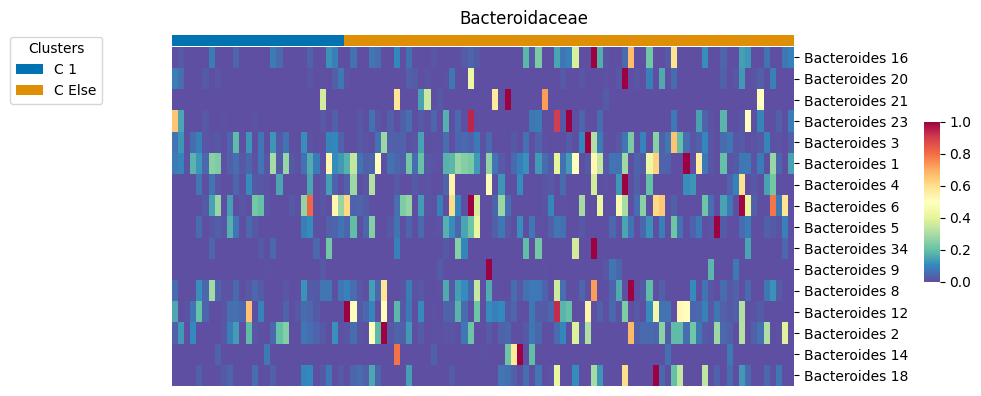

In [103]:
res = utils.gsea_analysis_bacteria(micro_data_norm.iloc[:,micro_data_norm.columns.isin(list(usable_micro['Donor'])+['genename'])],
                                clus_labels, res_dir, [custom_bacteria_gene_lists])

[network.append(element) for element in res]

utils.plot_heatmaps_gsea_bacteria(res, micro_fused_rel[micro_fused_rel['Donor'].isin(list(usable_micro['Donor']))].reset_index(drop=True), 
                                clus_labels, micro_taxa, res_dir)

plotting.draw_network(network, clus_labels, res_dir)

# Microbiome vs Cytof vs RNAseq

In [112]:
RNA_shared = aggregated[aggregated['Donor'].isin(cytof_meta['Donor'])]
RNA_shared = RNA_shared[RNA_shared['Donor'].isin(micro_fused['Donor'])]
RNA_shared.reset_index(drop=True, inplace = True)

micro_shared = micro_fused[micro_fused['Donor'].isin(aggregated['Donor'])]
micro_shared = micro_shared[micro_shared['Donor'].isin(cytof_meta['Donor'])]
micro_shared.reset_index(drop=True, inplace = True)

aux = cytof.copy()
aux['Donor'] = cytof_meta['Donor']
cytof_shared = aux[aux['Donor'].isin(aggregated['Donor'])]
cytof_shared = cytof_shared[cytof_shared['Donor'].isin(micro_fused['Donor'])]
cytof_shared.reset_index(drop=True, inplace = True)

In [113]:
# Cytof
idx = list(set(range(affinity_cytof.shape[0])).difference(list(cytof[~ ( (cytof_meta['Donor'].isin(micro_fused['Donor']))  & (cytof_meta['Donor'].isin(aggregated['Donor']))) ].index)))
affinity_cytof_mod = affinity_cytof[np.ix_(idx,idx)]
print(affinity_cytof_mod.shape)
# Microbiome
idx = list(set(range(affinity_microbe.shape[0])).difference(list(micro_fused[~ ( (micro_fused['Donor'].isin(cytof_meta['Donor']))  & (micro_fused['Donor'].isin(aggregated['Donor']))) ].index)))
affinity_microbe_mod = affinity_microbe[np.ix_(idx,idx)]
print(affinity_microbe_mod.shape)
# RNA
idx = list(set(range(affinity_RNA.shape[0])).difference(list(aggregated[~ ( (aggregated['Donor'].isin(cytof_meta['Donor']))  & (aggregated['Donor'].isin(micro_fused['Donor']))) ].index)))
affinity_RNA_mod = affinity_RNA[np.ix_(idx,idx)]
print(affinity_RNA_mod.shape)

(97, 97)
(97, 97)
(97, 97)


Silhouette score: 0.08059834510254708


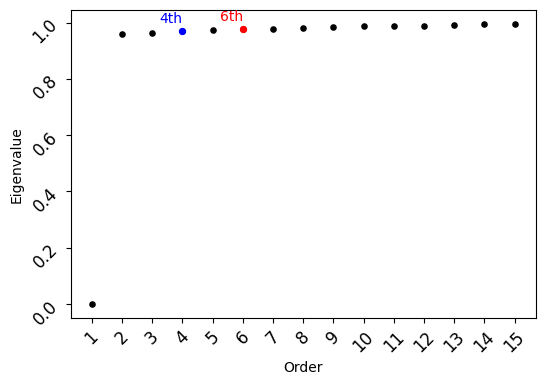

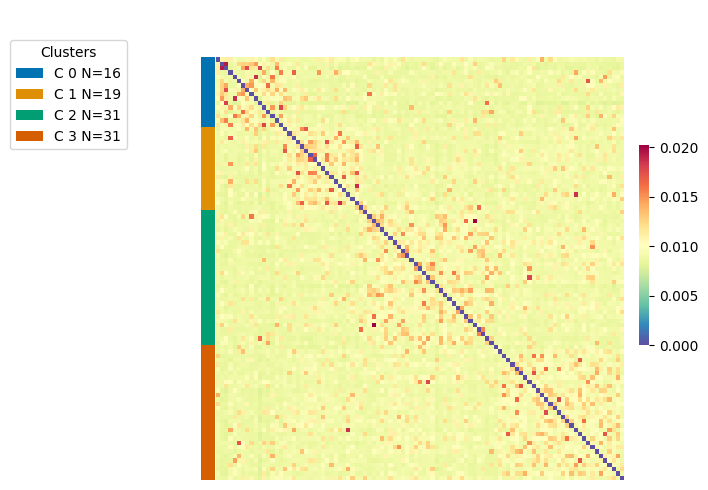

In [114]:
res_dir = results_dir + 'Microbiome+RNA+Cytof/'
dim = affinity_RNA_mod.shape[0]//10

affinity_cytof_rna_micro = snf.snf([affinity_cytof_mod, 
                                    affinity_microbe_mod, 
                                    affinity_RNA_mod], K=dim)

plotting.eigengap_visual(affinity_cytof_rna_micro, res_dir)

n_clusters = 4
clus_labels = utils.spectral_clustering_custom(affinity_cytof_rna_micro, n_clusters)

plotting.draw_clustermap(clus_labels, affinity_cytof_rna_micro, res_dir, 'no')

    Shannon index  Simpson index  Chao1 richness Cluster
0        5.404588       0.956193           143.0     C 0
1        4.803342       0.890112           165.0     C 3
2        5.667028       0.960775           164.0     C 2
3        5.151253       0.929988           135.0     C 3
4        2.185117       0.484440            65.0     C 2
..            ...            ...             ...     ...
92       5.801673       0.963728           170.0     C 2
93       4.720536       0.938593            72.0     C 1
94       4.564746       0.888319           129.0     C 0
95       5.887697       0.970314           158.0     C 2
96       5.613101       0.960746           132.0     C 2

[97 rows x 4 columns]
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C 0 vs. C 1: *
C 1 vs. C 2: **
C 2 vs. C 3: ns
C 0 vs. C 2: ns
C 1 vs. C 3: ns
C 0 vs. C 3: ns
p-valu

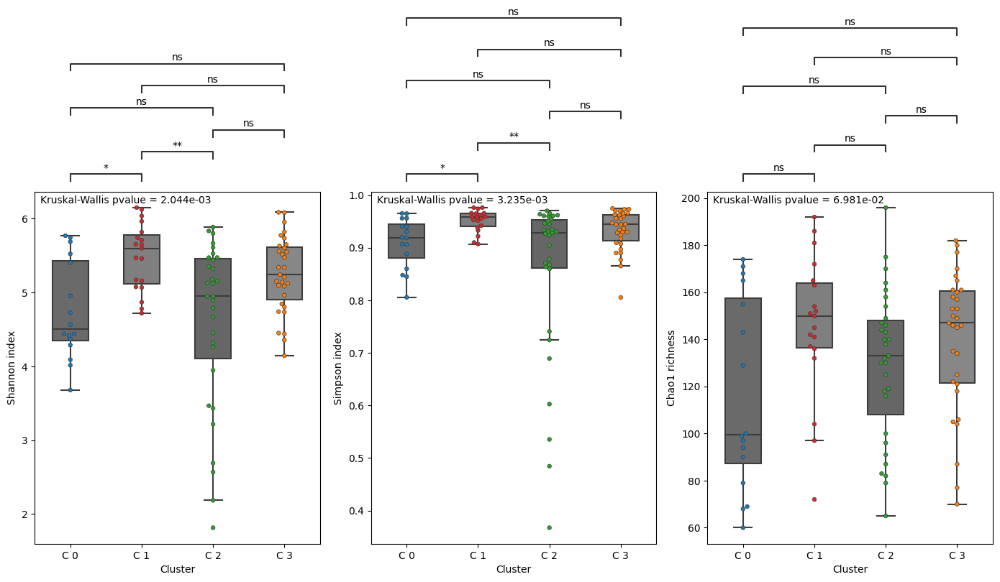

In [83]:
plotting.alpha_diversity_microbiome(micro_fused_rel[micro_fused_rel['Donor'].isin(list(micro_shared['Donor']))].drop(columns=['Donor']), 
                                                    micro_shared['Donor'], clus_labels, res_dir)

In [115]:
multi_chord['Cytof+Micro+RNA'] = clus_labels

In [54]:
### Save data for Cytof Microbiome RNA comparisons vs 2 view fusions

In [116]:
aux = multi_chord.copy()
aux['Cytof+Micro+RNA'] = ['CMR_C ' + val.split(' ')[1] for val in aux['Cytof+Micro+RNA']]
count = aux.groupby(['Cytof+Micro+RNA', 'Cytof+Micro']).size()
aux = count.to_frame(name = 'value').reset_index()
aux.to_csv(results_dir+'multi_chord_cmr_cm.csv', sep='\t')

In [117]:
aux = multi_chord.copy()
aux['Cytof+Micro+RNA'] = ['CMR_C ' + val.split(' ')[1] for val in aux['Cytof+Micro+RNA']]
count = aux.groupby(['Cytof+Micro+RNA', 'Cytof+RNA']).size()
aux = count.to_frame(name = 'value').reset_index()
aux.to_csv(results_dir+'multi_chord_cmr_cr.csv', sep='\t')

In [118]:
aux = multi_chord.copy()
aux['Cytof+Micro+RNA'] = ['CMR_C ' + val.split(' ')[1] for val in aux['Cytof+Micro+RNA']]
count = aux.groupby(['Cytof+Micro+RNA', 'Micro+RNA']).size()
aux = count.to_frame(name = 'value').reset_index()
aux.to_csv(results_dir+'multi_chord_cmr_mr.csv', sep='\t')

In [119]:
chord['to'] = clus_labels
chord['from'] = ['EC ' + val.split(' ')[1] for val in chord['from']]
count = chord.groupby(['from', 'to']).size()
chord = count.to_frame(name = 'value').reset_index()
chord.to_csv(results_dir+'chord.csv', sep='\t')

## Logistic Regression on clusters

Size of metadata: (96, 392)
Size of metadata after NaNs removal: (90, 390)
Shape of the regression input: (90, 8)
C 0
Optimization terminated successfully.
         Current function value: 0.418137
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   90
Model:                          Logit   Df Residuals:                       81
Method:                           MLE   Df Model:                            8
Date:                Mar, 02 Lug 2024   Pseudo R-squ.:                 0.07196
Time:                        16:14:40   Log-Likelihood:                -37.632
converged:                       True   LL-Null:                       -40.551
Covariance Type:            nonrobust   LLR p-value:                    0.6655
                             coef    std err          z      P>|z|      [0.025

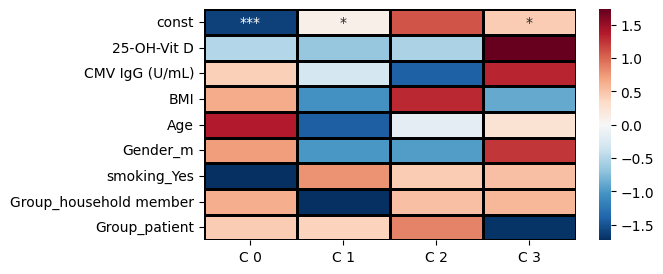

In [85]:
network = []
clus, parameters, pvalues = utils.lr_custom(RNA_shared, meta, clus_labels, res_dir)

network = utils.add_to_network(clus, parameters, pvalues, 'LR_reg', network)

## Addition to LR

Size of metadata: (28, 393)
Size of metadata after NaNs removal: (25, 391)
Shape of the regression input: (25, 9)
C 0
Optimization terminated successfully.
         Current function value: 0.000003
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   25
Model:                          Logit   Df Residuals:                       15
Method:                           MLE   Df Model:                            9
Date:                Fri, 09 Feb 2024   Pseudo R-squ.:                   1.000
Time:                        15:58:18   Log-Likelihood:            -7.5338e-05
converged:                       True   LL-Null:                       -13.777
Covariance Type:            nonrobust   LLR p-value:                  0.001132
                               coef    std err          z      P>|z|      [0.0

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp



Size of metadata: (28, 392)
Size of metadata after NaNs removal: (27, 390)
Shape of the regression input: (27, 7)
C 0
Optimization terminated successfully.
         Current function value: 0.448222
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   27
Model:                          Logit   Df Residuals:                       20
Method:                           MLE   Df Model:                            6
Date:                Fri, 09 Feb 2024   Pseudo R-squ.:                  0.1538
Time:                        15:58:18   Log-Likelihood:                -12.102
converged:                       True   LL-Null:                       -14.302
Covariance Type:            nonrobust   LLR p-value:                    0.6227
                     coef    std err          z      P>|z|      [0.025      0.

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



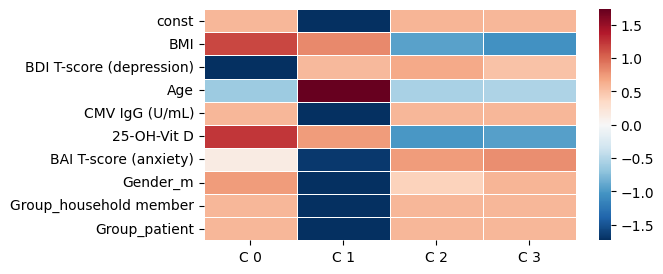

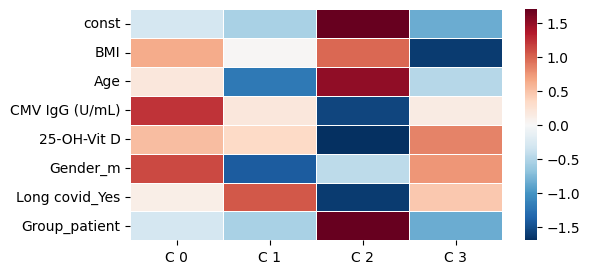

In [109]:
clus, parameters, pvalues = utils.lr_custom(RNA_shared, dep_anx.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels, res_dir)
clus, parameters, pvalues = utils.lr_custom(RNA_shared, covid_patients.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels, res_dir)

## One vs Rest Testing

In [86]:
genenames = normalized_counts['genename']
usable_RNA = normalized_counts.drop(columns = 'genename')
usable_RNA = usable_RNA[[c for c in usable_RNA.columns if c in list(RNA_shared['Donor'])]]
usable_RNA['genename'] = genenames
usable_RNA.reset_index(drop = True, inplace=True)

usable_cytof = cytof_meta[cytof_meta['Donor'].isin(cytof_shared['Donor'])]
usable_cytof.drop(columns = 'Donor', inplace = True)
usable_cytof.reset_index(drop = True, inplace = True)

usable_micro = micro_fused[micro_fused['Donor'].isin(micro_shared['Donor'])]
usable_micro.reset_index(drop = True, inplace = True)

/var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T/ipykernel_87694/818301692.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [60]:
res = plotting.micro_analysis(usable_micro, clus_labels, micro_taxa, res_dir)

[network.append(element) for element in res]


Caricamento pacchetto: ‘tidyr’



    expand













Caricamento pacchetto: ‘Matrix’



    expand, pack, unpack



    expand








[1] "Creating output folder"
[1] "Creating output feature tables folder"
[1] "Creating output fits folder"
2024-07-02 16:08:51.549015 INFO::Writing function arguments to log file
2024-07-02 16:08:51.559092 INFO::Verifying options selected are valid
2024-07-02 16:08:51.601835 INFO::Determining format of input files
2024-07-02 16:08:51.602719 INFO::Input format is data samples as rows and metadata samples as rows
2024-07-02 16:08:51.604997 INFO::Formula for fixed effects: expr ~  cluster_0
2024-07-02 16:08:51.605542 INFO::Filter data based on min abundance and min prevalence
2024-07-02 16:08:51.606386 INFO::Total samples in data: 97
2024-07-02 16:08:51.607261 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-07-02 16:08:51.609706 INFO::Total filtered features: 0
2024-07-02 16:08:51.610362 INFO::Filtered feature names from abundance and prevalence filtering:
2024-07-02 16:08:51.614032 INFO::Total filtered features with variance filtering: 0
2024

[1] "Warning: Deleting existing log file: /var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T//Rtmpfkgp2o/maaslin2.output.folder/maaslin2.log"
2024-07-02 16:08:52.601434 INFO::Writing function arguments to log file
2024-07-02 16:08:52.603702 INFO::Verifying options selected are valid
2024-07-02 16:08:52.604287 INFO::Determining format of input files
2024-07-02 16:08:52.604771 INFO::Input format is data samples as rows and metadata samples as rows
2024-07-02 16:08:52.607021 INFO::Formula for fixed effects: expr ~  cluster_3
2024-07-02 16:08:52.607608 INFO::Filter data based on min abundance and min prevalence
2024-07-02 16:08:52.608064 INFO::Total samples in data: 97
2024-07-02 16:08:52.608521 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-07-02 16:08:52.610665 INFO::Total filtered features: 0
2024-07-02 16:08:52.611229 INFO::Filtered feature names from abundance and prevalence filtering:
2024-07-02 16:08:52.614811 INFO::Total filtered feature

[1] "Warning: Deleting existing log file: /var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T//Rtmpfkgp2o/maaslin2.output.folder/maaslin2.log"
2024-07-02 16:08:53.654431 INFO::Writing function arguments to log file
2024-07-02 16:08:53.656835 INFO::Verifying options selected are valid
2024-07-02 16:08:53.657328 INFO::Determining format of input files
2024-07-02 16:08:53.657798 INFO::Input format is data samples as rows and metadata samples as rows
2024-07-02 16:08:53.66044 INFO::Formula for fixed effects: expr ~  cluster_2
2024-07-02 16:08:53.661032 INFO::Filter data based on min abundance and min prevalence
2024-07-02 16:08:53.661537 INFO::Total samples in data: 97
2024-07-02 16:08:53.661983 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-07-02 16:08:53.664239 INFO::Total filtered features: 0
2024-07-02 16:08:53.664795 INFO::Filtered feature names from abundance and prevalence filtering:
2024-07-02 16:08:53.668635 INFO::Total filtered features

[1] "Warning: Deleting existing log file: /var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T//Rtmpfkgp2o/maaslin2.output.folder/maaslin2.log"
2024-07-02 16:08:54.700877 INFO::Writing function arguments to log file
2024-07-02 16:08:54.702949 INFO::Verifying options selected are valid
2024-07-02 16:08:54.703522 INFO::Determining format of input files
2024-07-02 16:08:54.704097 INFO::Input format is data samples as rows and metadata samples as rows
2024-07-02 16:08:54.706418 INFO::Formula for fixed effects: expr ~  cluster_1
2024-07-02 16:08:54.706898 INFO::Filter data based on min abundance and min prevalence
2024-07-02 16:08:54.707322 INFO::Total samples in data: 97
2024-07-02 16:08:54.707796 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-07-02 16:08:54.709927 INFO::Total filtered features: 0
2024-07-02 16:08:54.710406 INFO::Filtered feature names from abundance and prevalence filtering:
2024-07-02 16:08:54.713891 INFO::Total filtered feature

RRuntimeError: Errore in xtfrm.data.frame(x) : non è possibile xtfrm i data frame


## Cytof clusters analysis

Cytof number of columns 22
No need to drop Donor


/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:522: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



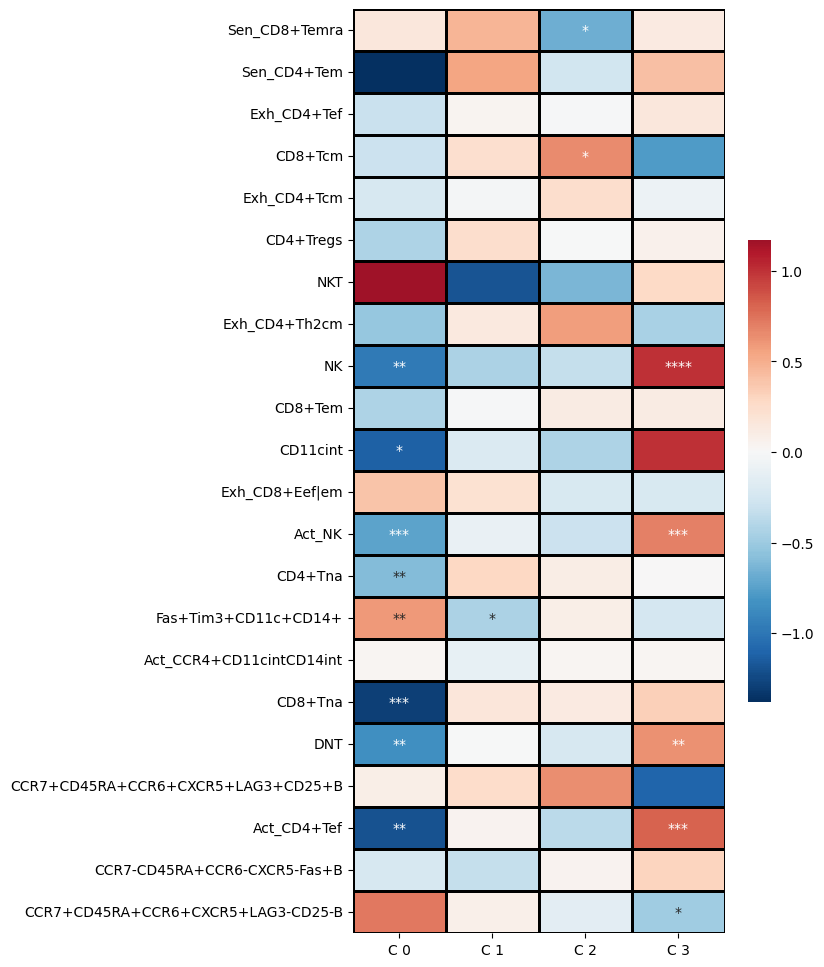

In [89]:
r = utils.cytof_clusters_analysis(usable_cytof,clus_labels, res_dir)

network = utils.add_to_network(list(r[0].index), pd.DataFrame(r[1]), pd.DataFrame(r[0].reset_index(drop=True)), r[2], network)

## GSEA

In [90]:
gsea_res = utils.gsea_analysis_single(usable_RNA, clus_labels, res_dir, hallmark)

# Multiset analysis
utils.gsea_analysis_multi(usable_RNA, clus_labels, res_dir, path_sets)

# Add GSEA results to the network
[network.append(element) for element in gsea_res]

2024-07-02 16:15:02,447 [WARNING] Dropping duplicated gene names, only keep the first values
2024-07-02 16:15:04,742 [WARNING] Dropping duplicated gene names, only keep the first values
2024-07-02 16:15:06,809 [WARNING] Dropping duplicated gene names, only keep the first values
2024-07-02 16:15:08,824 [WARNING] Dropping duplicated gene names, only keep the first values
2024-07-02 16:15:10,939 [WARNING] Dropping duplicated gene names, only keep the first values
2024-07-02 16:15:15,410 [WARNING] Dropping duplicated gene names, only keep the first values
2024-07-02 16:15:16,572 [WARNING] Dropping duplicated gene names, only keep the first values
2024-07-02 16:15:40,125 [WARNING] Dropping duplicated gene names, only keep the first values
2024-07-02 16:15:43,220 [WARNING] Dropping duplicated gene names, only keep the first values
2024-07-02 16:15:49,506 [WARNING] Dropping duplicated gene names, only keep the first values
2024-07-02 16:15:53,875 [WARNING] Dropping duplicated gene names, only

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

## GSEA on BACTERIA

Cluster C 0
Cluster C 1
Cluster C 2
Cluster C 3


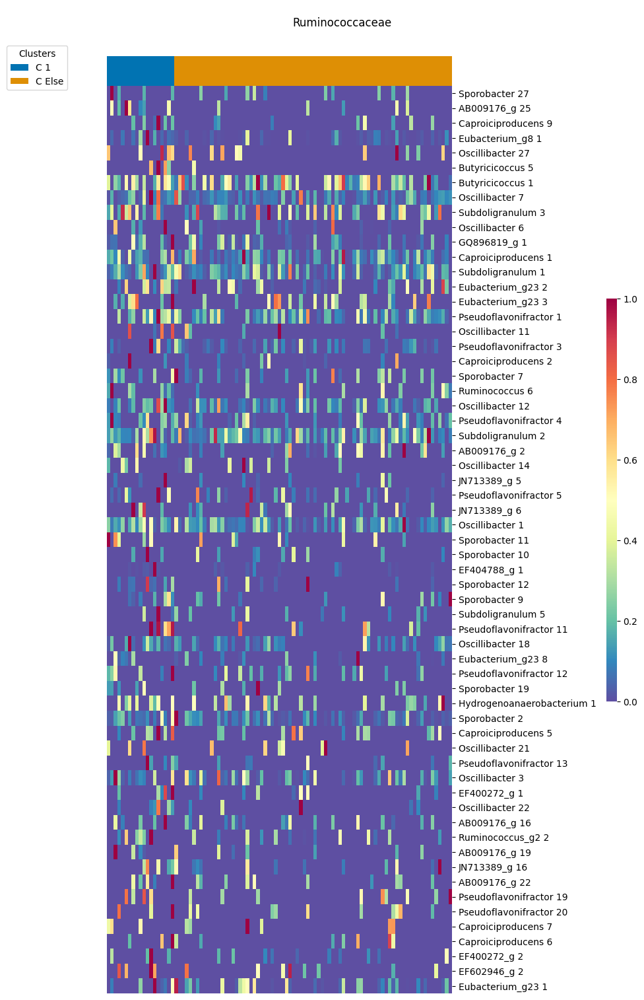

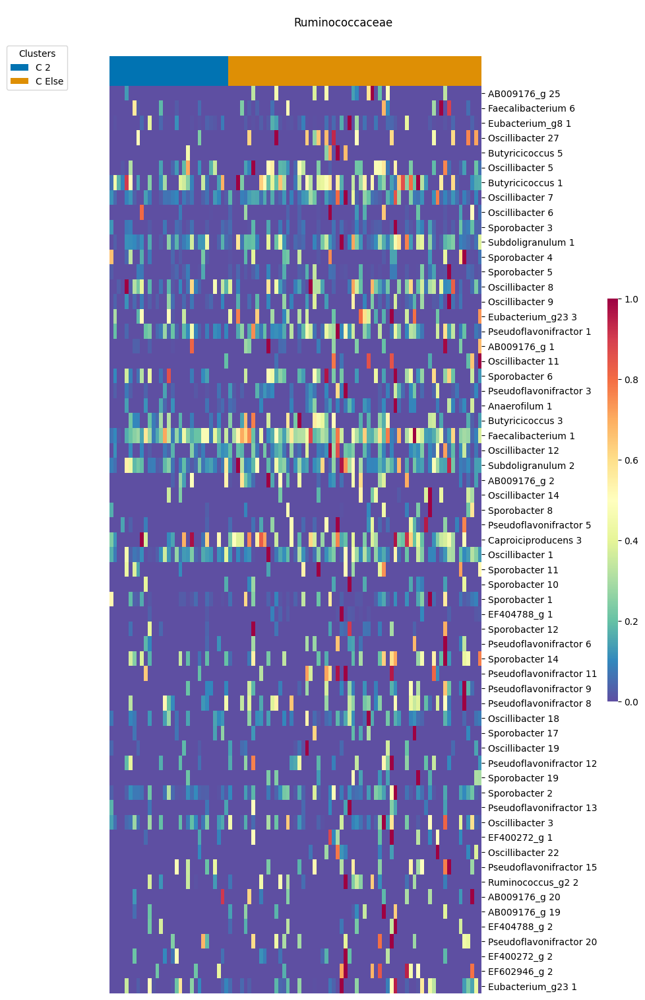

In [91]:
res = utils.gsea_analysis_bacteria(micro_data_norm.iloc[:,micro_data_norm.columns.isin(list(usable_micro['Donor'])+['genename'])],
                                clus_labels, res_dir, [custom_bacteria_gene_lists])

[network.append(element) for element in res]

utils.plot_heatmaps_gsea_bacteria(res, micro_fused_rel[micro_fused_rel['Donor'].isin(list(usable_micro['Donor']))].reset_index(drop=True), 
                                clus_labels, micro_taxa, res_dir)

In [92]:
# for every element in the list network, take the 'table' element and split it
for element in network:
    if element['target'] == 'C 0':
        element['target'] = 'Trimodal - C 1'
    if element['target'] == 'C 1':
        element['target'] = 'Trimodal - C 2'
    if element['target'] == 'C 2':
        element['target'] = 'Trimodal - C 3'
    if element['target'] == 'C 3':
        element['target'] = 'Trimodal - C 4'
        
        
# replace values in a pd.Series
clus_labels.replace({'C 0': 'Trimodal - C 1', 'C 1': 'Trimodal - C 2', 'C 2': 'Trimodal - C 3', 'C 3': 'Trimodal - C 4'}, inplace=True)

plotting.draw_network(network, clus_labels, res_dir)

<class 'pyvis.network.Network'> |N|=33 |E|=37

# Microbiome vs RNA vs TCR

In [ ]:
RNA_shared = aggregated[aggregated['Donor'].isin(tcr_stats_fused_top['Donor'])]
RNA_shared = RNA_shared[RNA_shared['Donor'].isin(micro_fused['Donor'])]
RNA_shared.reset_index(drop=True, inplace = True)

micro_shared = micro_fused[micro_fused['Donor'].isin(aggregated['Donor'])]
micro_shared = micro_shared[micro_shared['Donor'].isin(tcr_stats_fused_top['Donor'])]
micro_shared.reset_index(drop=True, inplace = True)

tcr_shared = tcr_stats_fused_top[tcr_stats_fused_top['Donor'].isin(micro_fused['Donor'])]
tcr_shared = tcr_shared[tcr_shared['Donor'].isin(aggregated['Donor'])]
tcr_shared.reset_index(drop = True, inplace = True)

In [ ]:
# TCR
idx = list(set(range(affinity_tcr_fused_top.shape[0])).difference(list(tcr_stats_fused_top[~ ( (tcr_stats_fused_top['Donor'].isin(micro_fused['Donor']))  & (tcr_stats_fused_top['Donor'].isin(aggregated['Donor']))) ].index)))
affinity_tcr_fused_top_mod = affinity_tcr_fused_top[np.ix_(idx,idx)]
print(affinity_tcr_fused_top_mod.shape)
# Microbiome
idx = list(set(range(affinity_microbe.shape[0])).difference(list(micro_fused[~ ( (micro_fused['Donor'].isin(tcr_stats_fused_top['Donor']))  & (micro_fused['Donor'].isin(aggregated['Donor']))) ].index)))
affinity_microbe_mod = affinity_microbe[np.ix_(idx,idx)]
print(affinity_microbe_mod.shape)
# RNA
idx = list(set(range(affinity_RNA.shape[0])).difference(list(aggregated[~ ( (aggregated['Donor'].isin(tcr_stats_fused_top['Donor']))  & (aggregated['Donor'].isin(micro_fused['Donor']))) ].index)))
affinity_RNA_mod = affinity_RNA[np.ix_(idx,idx)]
print(affinity_RNA_mod.shape)

(71, 71)
(71, 71)
(71, 71)


Silhouette score: 0.08010986709708831


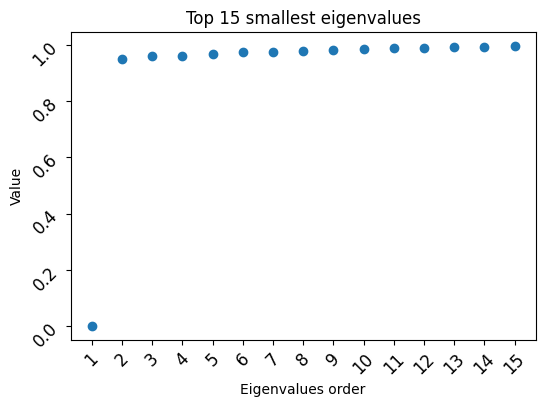

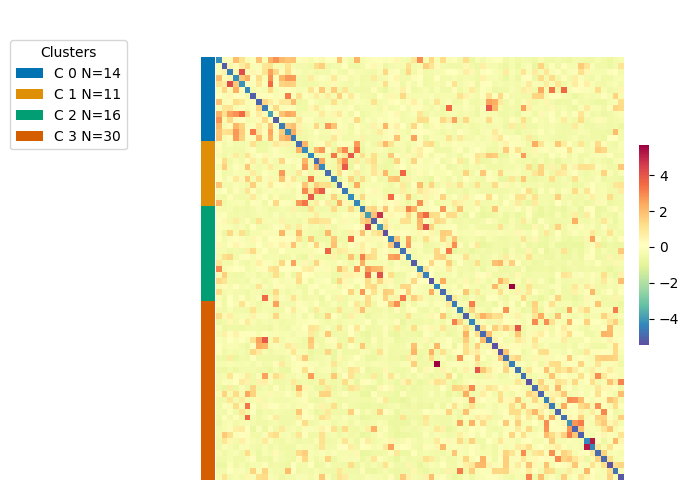

In [ ]:
res_dir = results_dir + 'Microbiome+RNA+TCR/'
dim = affinity_RNA_mod.shape[0]//10

affinity_tcr_rna_micro = snf.snf([affinity_tcr_fused_top_mod, affinity_microbe_mod, affinity_RNA_mod], K=dim)

plotting.eigengap_visual(affinity_tcr_rna_micro, res_dir)

n_clusters = 4
clus_labels = utils.spectral_clustering_custom(affinity_tcr_rna_micro, n_clusters)

plotting.draw_clustermap(clus_labels, affinity_tcr_rna_micro, res_dir, 'standard')

    Shannon index  Simpson index  Chao1 richness Cluster
0        5.404588       0.956193           143.0     C 3
1        4.803342       0.890112           165.0     C 3
2        6.020344       0.971639           166.0     C 2
3        4.937250       0.922678           123.0     C 2
4        5.667028       0.960775           164.0     C 3
..            ...            ...             ...     ...
66       5.565463       0.943235           161.0     C 3
67       4.955365       0.940961           100.0     C 2
68       5.143139       0.940709           118.0     C 0
69       4.720536       0.938593            72.0     C 1
70       4.564746       0.888319           129.0     C 2

[71 rows x 4 columns]
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C 0 vs. C 1: ns
C 1 vs. C 2: ns
C 2 vs. C 3: ns
C 0 vs. C 2: ns
C 1 vs. C 3: ns
C 0 vs. C 3: ns
p-val

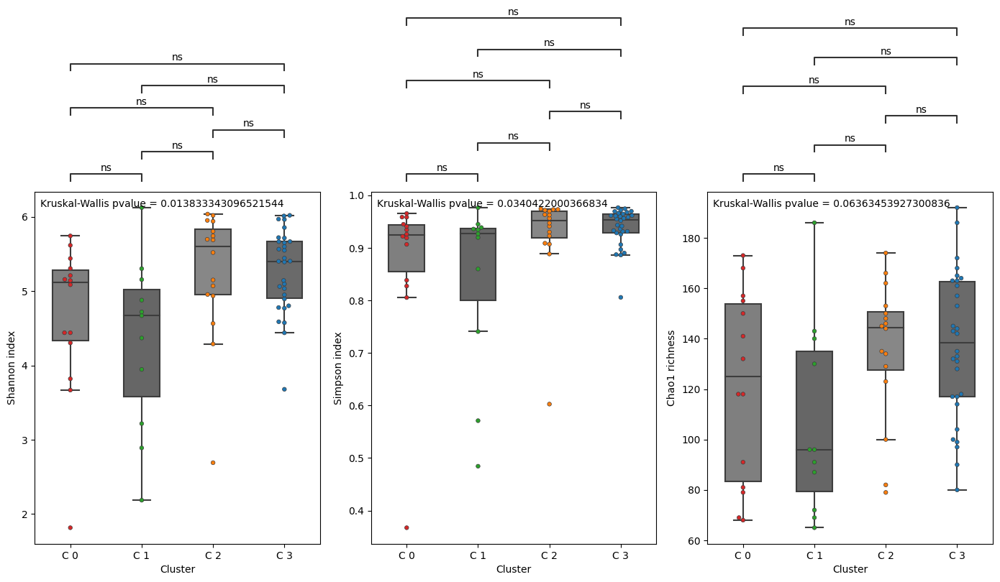

In [ ]:
plotting.alpha_diversity_microbiome(micro_fused_rel[micro_fused_rel['Donor'].isin(list(micro_shared['Donor']))].drop(columns=['Donor']), 
                                                    micro_shared['Donor'], clus_labels, res_dir)

## Logistic Regression on clusters

Size of metadata: (71, 391)
Size of metadata after NaNs removal: (68, 389)
Shape of the regression input: (68, 7)
C 0
Optimization terminated successfully.
         Current function value: 0.443315
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   68
Model:                          Logit   Df Residuals:                       60
Method:                           MLE   Df Model:                            7
Date:                Thu, 01 Feb 2024   Pseudo R-squ.:                 0.09143
Time:                        15:42:02   Log-Likelihood:                -30.145
converged:                       True   LL-Null:                       -33.179
Covariance Type:            nonrobust   LLR p-value:                    0.5320
                             coef    std err          z      P>|z|      [0.025

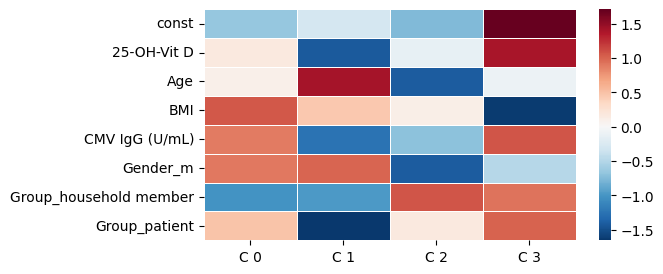

In [ ]:
network = []
clus, parameters, pvalues = utils.lr_custom(RNA_shared, meta, clus_labels, res_dir)

network = utils.add_to_network(clus, parameters, pvalues, 'LR_reg', network)

## Addition to LR

Size of metadata: (18, 393)
Size of metadata after NaNs removal: (17, 391)
Shape of the regression input: (17, 9)
C 0
Optimization terminated successfully.
         Current function value: 0.435979
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   17
Model:                          Logit   Df Residuals:                        7
Method:                           MLE   Df Model:                            9
Date:                Thu, 01 Feb 2024   Pseudo R-squ.:                  0.2009
Time:                        15:42:02   Log-Likelihood:                -7.4116
converged:                       True   LL-Null:                       -9.2751
Covariance Type:            nonrobust   LLR p-value:                    0.9284
                               coef    std err          z      P>|z|      [0.0

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp



Size of metadata: (49, 392)
Size of metadata after NaNs removal: (47, 390)
Shape of the regression input: (47, 7)
C 0
Optimization terminated successfully.
         Current function value: 0.501624
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   47
Model:                          Logit   Df Residuals:                       40
Method:                           MLE   Df Model:                            6
Date:                Thu, 01 Feb 2024   Pseudo R-squ.:                 0.03086
Time:                        15:42:03   Log-Likelihood:                -23.576
converged:                       True   LL-Null:                       -24.327
Covariance Type:            nonrobust   LLR p-value:                    0.9594
                     coef    std err          z      P>|z|      [0.025      0.

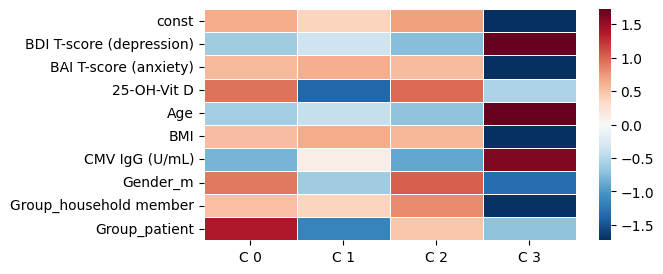

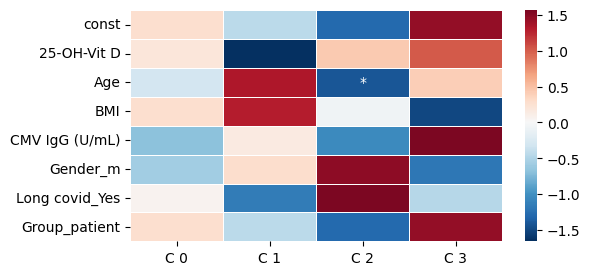

In [ ]:
clus, parameters, pvalues = utils.lr_custom(RNA_shared, dep_anx.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels, res_dir)
clus, parameters, pvalues = utils.lr_custom(RNA_shared, covid_patients.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels, res_dir)

## One vs Rest Testing

In [ ]:
genenames = normalized_counts['genename']
usable_RNA = normalized_counts.drop(columns = 'genename')
usable_RNA = usable_RNA[[c for c in usable_RNA.columns if c in list(RNA_shared['Donor'])]]
usable_RNA['genename'] = genenames
usable_RNA.reset_index(drop = True, inplace=True)

usable_micro = micro_fused[micro_fused['Donor'].isin(micro_shared['Donor'])]
usable_micro.reset_index(drop = True, inplace = True)

usable_TCR = TCR_stats[TCR_stats['Donor'].isin(tcr_shared['Donor'])]
usable_TCR.drop(columns = 'Donor', inplace = True)
usable_TCR.reset_index(drop = True, inplace = True)

/var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T/ipykernel_91440/228599666.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



   mann_pvalues          features cluster
0      0.005167        entropyCD4     C 0
1      0.322198        entropyCD8     C 0
2      0.106663  tcrcovidmatchCD4     C 0
3      0.003737  tcrcovidmatchCD8     C 0
4      0.008160   tcrcovidfreqCD4     C 0
5      0.000357   tcrcovidfreqCD8     C 0
0      0.594484        entropyCD4     C 1
1      0.880003        entropyCD8     C 1
2      0.671906  tcrcovidmatchCD4     C 1
3      0.186237  tcrcovidmatchCD8     C 1
4      0.341628   tcrcovidfreqCD4     C 1
5      0.316654   tcrcovidfreqCD8     C 1
0      0.799034        entropyCD4     C 2
1      0.558624        entropyCD8     C 2
2      0.174961  tcrcovidmatchCD4     C 2
3      0.374533  tcrcovidmatchCD8     C 2
4      0.332604   tcrcovidfreqCD4     C 2
5      0.273016   tcrcovidfreqCD8     C 2
0      0.101946        entropyCD4     C 3
1      0.237400        entropyCD8     C 3
2      0.032630  tcrcovidmatchCD4     C 3
3      0.034142  tcrcovidmatchCD8     C 3
4      0.024216   tcrcovidfreqCD4 

[1] "Warning: Deleting existing log file: /var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T//RtmpaOtIou/maaslin2.output.folder/maaslin2.log"
2024-02-01 15:42:51 INFO::Writing function arguments to log file
2024-02-01 15:42:51 INFO::Verifying options selected are valid
2024-02-01 15:42:51 INFO::Determining format of input files
2024-02-01 15:42:51 INFO::Input format is data samples as rows and metadata samples as rows
2024-02-01 15:42:51 INFO::Formula for fixed effects: expr ~  cluster_3
2024-02-01 15:42:51 INFO::Filter data based on min abundance and min prevalence
2024-02-01 15:42:51 INFO::Total samples in data: 71
2024-02-01 15:42:51 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-02-01 15:42:51 INFO::Total filtered features: 0
2024-02-01 15:42:51 INFO::Filtered feature names from abundance and prevalence filtering:
2024-02-01 15:42:51 INFO::Total filtered features with variance filtering: 0
2024-02-01 15:42:51 INFO::Filtered feature names

[1] "Warning: Deleting existing log file: /var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T//RtmpaOtIou/maaslin2.output.folder/maaslin2.log"
2024-02-01 15:42:51 INFO::Writing function arguments to log file
2024-02-01 15:42:51 INFO::Verifying options selected are valid
2024-02-01 15:42:51 INFO::Determining format of input files
2024-02-01 15:42:51 INFO::Input format is data samples as rows and metadata samples as rows
2024-02-01 15:42:51 INFO::Formula for fixed effects: expr ~  cluster_2
2024-02-01 15:42:51 INFO::Filter data based on min abundance and min prevalence
2024-02-01 15:42:51 INFO::Total samples in data: 71
2024-02-01 15:42:51 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-02-01 15:42:51 INFO::Total filtered features: 0
2024-02-01 15:42:51 INFO::Filtered feature names from abundance and prevalence filtering:
2024-02-01 15:42:51 INFO::Total filtered features with variance filtering: 0
2024-02-01 15:42:51 INFO::Filtered feature names

[1] "Warning: Deleting existing log file: /var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T//RtmpaOtIou/maaslin2.output.folder/maaslin2.log"
2024-02-01 15:42:52 INFO::Writing function arguments to log file
2024-02-01 15:42:52 INFO::Verifying options selected are valid
2024-02-01 15:42:52 INFO::Determining format of input files
2024-02-01 15:42:52 INFO::Input format is data samples as rows and metadata samples as rows
2024-02-01 15:42:52 INFO::Formula for fixed effects: expr ~  cluster_1
2024-02-01 15:42:52 INFO::Filter data based on min abundance and min prevalence
2024-02-01 15:42:52 INFO::Total samples in data: 71
2024-02-01 15:42:52 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-02-01 15:42:52 INFO::Total filtered features: 0
2024-02-01 15:42:52 INFO::Filtered feature names from abundance and prevalence filtering:
2024-02-01 15:42:52 INFO::Total filtered features with variance filtering: 0
2024-02-01 15:42:52 INFO::Filtered feature names

[1] "Warning: Deleting existing log file: /var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T//RtmpaOtIou/maaslin2.output.folder/maaslin2.log"
2024-02-01 15:42:53 INFO::Writing function arguments to log file
2024-02-01 15:42:53 INFO::Verifying options selected are valid
2024-02-01 15:42:53 INFO::Determining format of input files
2024-02-01 15:42:53 INFO::Input format is data samples as rows and metadata samples as rows
2024-02-01 15:42:53 INFO::Formula for fixed effects: expr ~  cluster_0
2024-02-01 15:42:53 INFO::Filter data based on min abundance and min prevalence
2024-02-01 15:42:53 INFO::Total samples in data: 71
2024-02-01 15:42:53 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-02-01 15:42:53 INFO::Total filtered features: 0
2024-02-01 15:42:53 INFO::Filtered feature names from abundance and prevalence filtering:
2024-02-01 15:42:53 INFO::Total filtered features with variance filtering: 0
2024-02-01 15:42:53 INFO::Filtered feature names









-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)











-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)











-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)











-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)






[None, None, None, None, None]

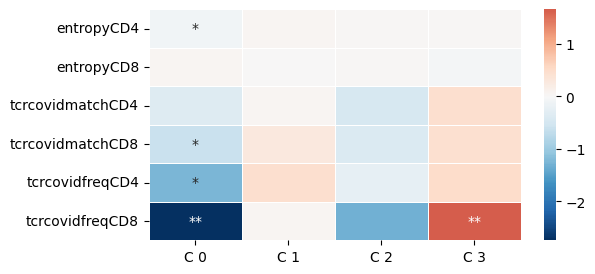

In [ ]:
res = plotting.mann_sign([(usable_TCR, 'TCR')], clus_labels, res_dir)

for r in res:
    network = utils.add_to_network(list(r[0].index), pd.DataFrame(r[1]), pd.DataFrame(r[0].reset_index(drop=True)), r[2], network)

res = plotting.micro_analysis(usable_micro, clus_labels, micro_taxa, res_dir)

[network.append(element) for element in res]

## GSEA

In [ ]:
gsea_res = utils.gsea_analysis_single(usable_RNA, clus_labels, res_dir, hallmark)

# Multiset analysis
utils.gsea_analysis_multi(usable_RNA, clus_labels, res_dir, path_sets)

# Add GSEA results to the network
[network.append(element) for element in gsea_res]

2024-02-01 15:43:03,160 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-01 15:43:05,246 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-01 15:43:07,137 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-01 15:43:09,010 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-01 15:43:10,963 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-01 15:43:15,462 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-01 15:43:16,526 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-01 15:43:40,635 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-01 15:43:43,614 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-01 15:43:49,875 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-01 15:43:54,473 [WARNING] Dropping duplicated gene names, only

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

## GSEA on BACTERIA

Cluster C 0
Cluster C 1
Cluster C 2
Cluster C 3


<class 'pyvis.network.Network'> |N|=34 |E|=38

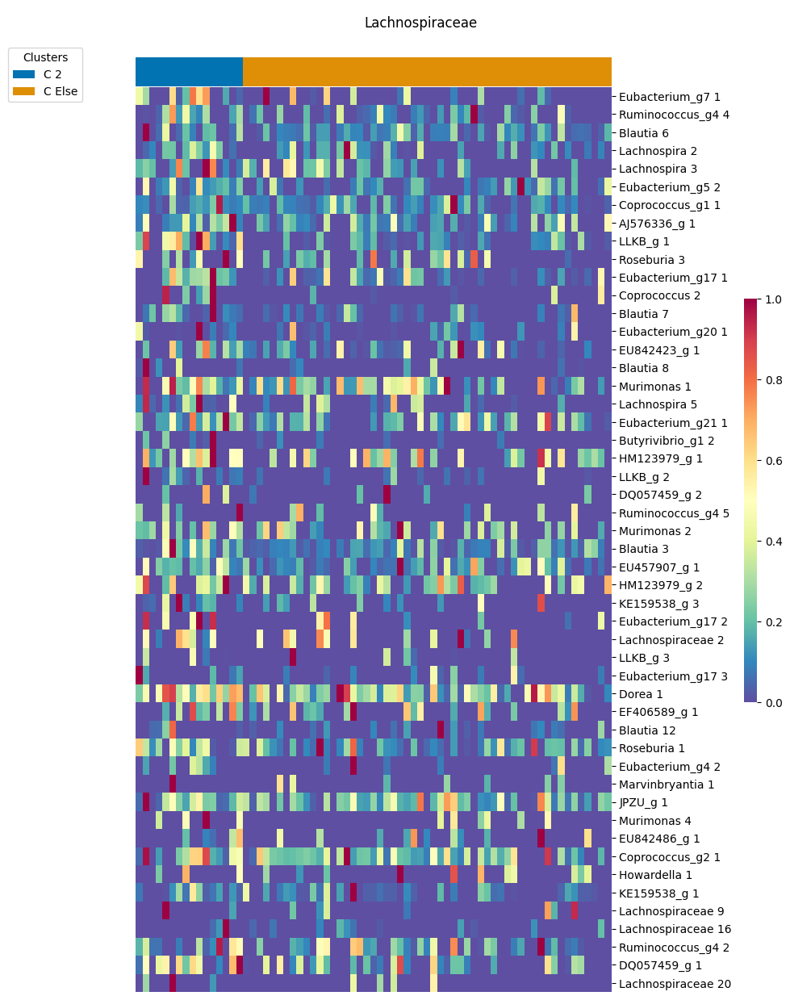

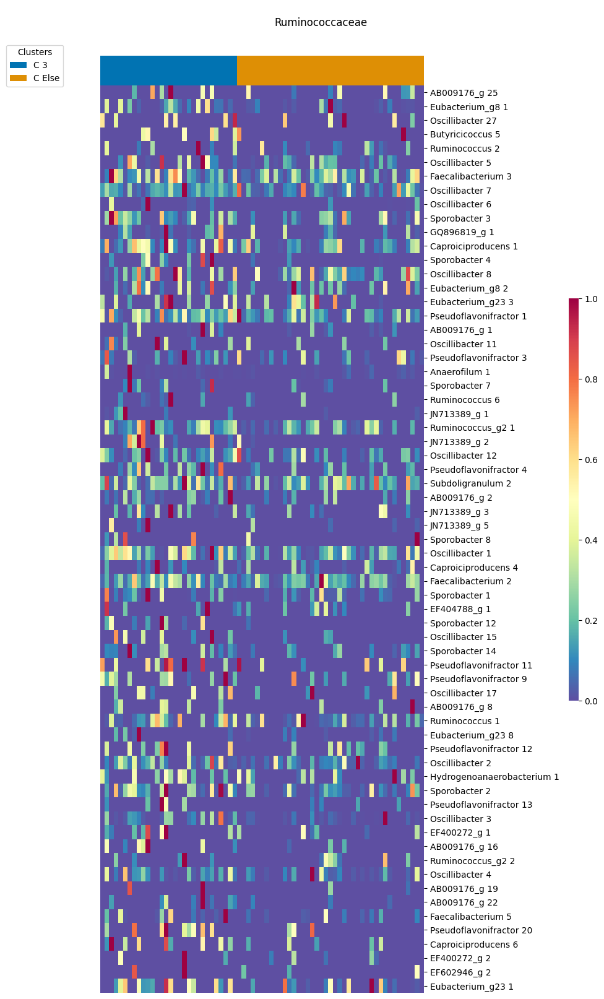

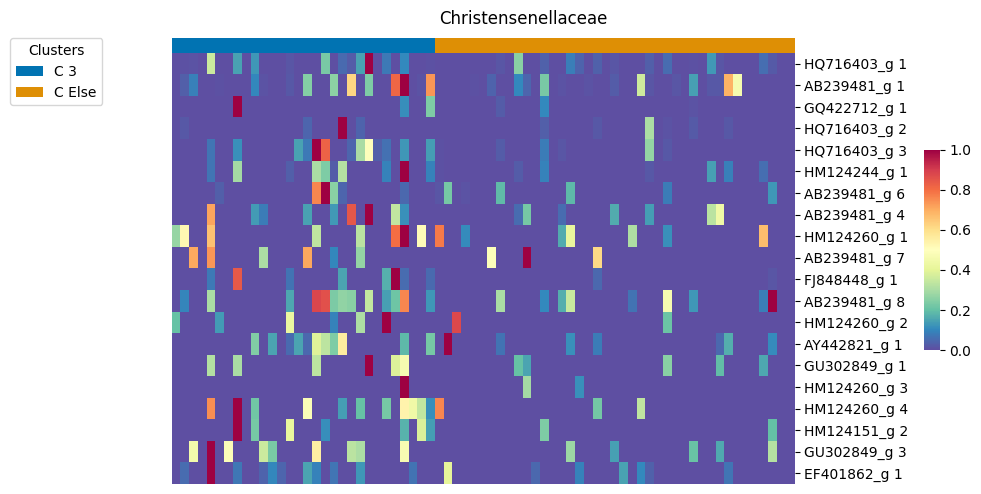

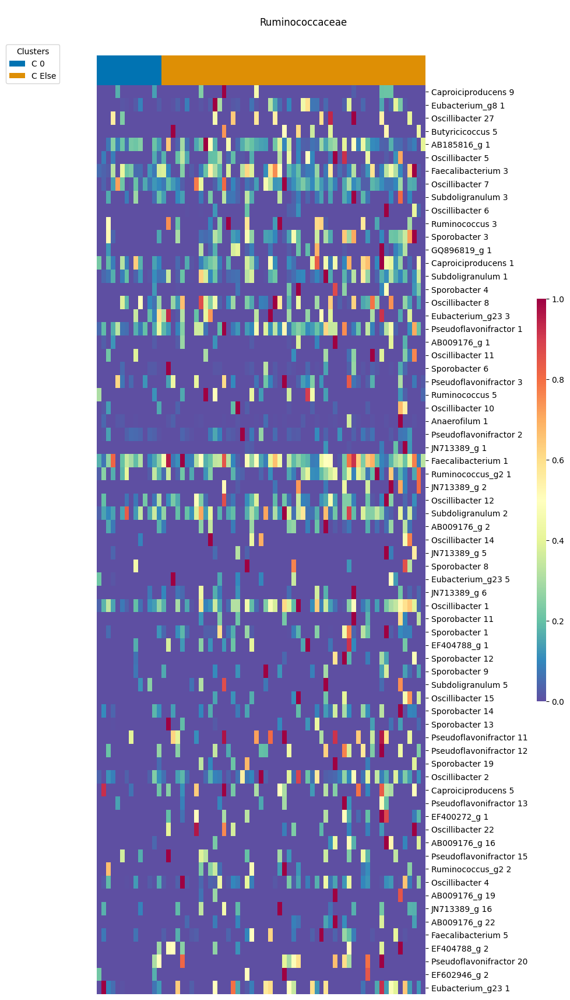

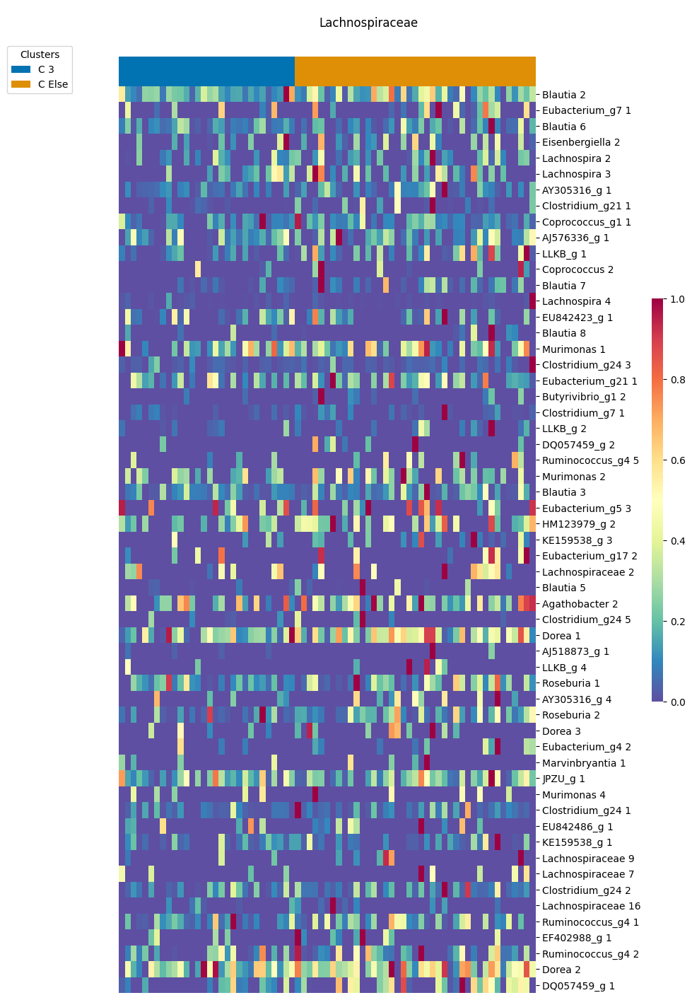

In [ ]:
res = utils.gsea_analysis_bacteria(micro_data_norm.iloc[:,micro_data_norm.columns.isin(list(usable_micro['Donor'])+['genename'])],
                                clus_labels, res_dir, [custom_bacteria_gene_lists])

[network.append(element) for element in res]

utils.plot_heatmaps_gsea_bacteria(res, micro_fused_rel[micro_fused_rel['Donor'].isin(list(usable_micro['Donor']))].reset_index(drop=True), 
                                clus_labels, micro_taxa, res_dir)

plotting.draw_network(network, clus_labels, res_dir)

# Microbiome vs Cytof vs TCR

In [115]:
aux = cytof.copy()
aux['Donor'] = cytof_meta['Donor']
cytof_shared = aux[aux['Donor'].isin(tcr_stats_fused_top['Donor'])]
cytof_shared = cytof_shared[cytof_shared['Donor'].isin(micro_fused['Donor'])]
cytof_shared.reset_index(drop=True, inplace = True)

micro_shared = micro_fused[micro_fused['Donor'].isin(cytof_meta['Donor'])]
micro_shared = micro_shared[micro_shared['Donor'].isin(tcr_stats_fused_top['Donor'])]
micro_shared.reset_index(drop=True, inplace = True)

tcr_shared = tcr_stats_fused_top[tcr_stats_fused_top['Donor'].isin(micro_fused['Donor'])]
tcr_shared = tcr_shared[tcr_shared['Donor'].isin(cytof_meta['Donor'])]
tcr_shared.reset_index(drop = True, inplace = True)

In [116]:
# Cytof
idx = list(set(range(affinity_cytof.shape[0])).difference(list(cytof[~ ( (cytof_meta['Donor'].isin(micro_fused['Donor']))  & (cytof_meta['Donor'].isin(tcr_stats_fused_top['Donor']))) ].index)))
affinity_cytof_mod = affinity_cytof[np.ix_(idx,idx)]
print(affinity_cytof_mod.shape)
# Microbiome
idx = list(set(range(affinity_microbe.shape[0])).difference(list(micro_fused[~ ( (micro_fused['Donor'].isin(cytof_meta['Donor']))  & (micro_fused['Donor'].isin(tcr_stats_fused_top['Donor']))) ].index)))
affinity_microbe_mod = affinity_microbe[np.ix_(idx,idx)]
print(affinity_microbe_mod.shape)
# TCR
idx = list(set(range(affinity_tcr_fused_top.shape[0])).difference(list(tcr_stats_fused_top[~ ( (tcr_stats_fused_top['Donor'].isin(cytof_meta['Donor']))  & (tcr_stats_fused_top['Donor'].isin(micro_fused['Donor']))) ].index)))
affinity_tcr_fused_top_mod = affinity_tcr_fused_top[np.ix_(idx,idx)]
print(affinity_tcr_fused_top_mod.shape)

(37, 37)
(37, 37)
(37, 37)


Silhouette score: 0.27728924268043137


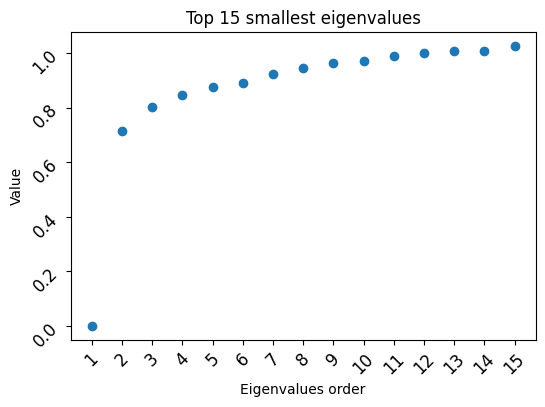

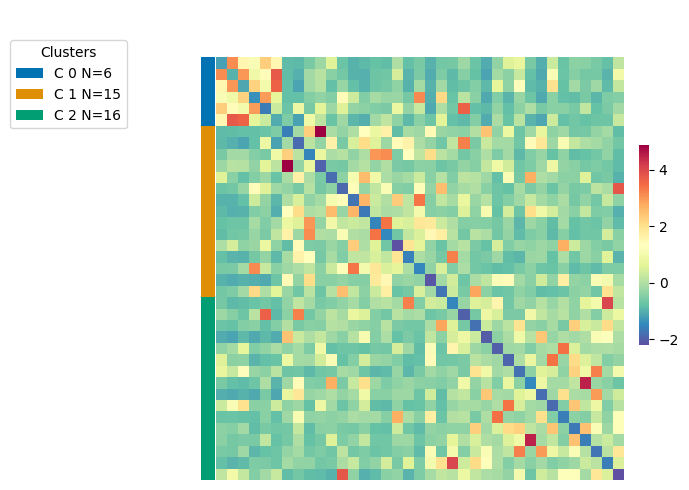

In [117]:
res_dir = results_dir + 'Microbiome+TCR+Cytof/'
dim = affinity_microbe_mod.shape[0]//10

affinity_micro_tcr_cytof = snf.snf([affinity_microbe_mod, affinity_tcr_fused_top_mod, affinity_cytof_mod], K=dim)

plotting.eigengap_visual(affinity_micro_tcr_cytof, res_dir)

n_clusters = 3
clus_labels = utils.spectral_clustering_custom(affinity_micro_tcr_cytof, n_clusters)

plotting.draw_clustermap(clus_labels, affinity_micro_tcr_cytof, res_dir, 'standard')

    Shannon index  Simpson index  Chao1 richness Cluster
0        5.404588       0.956193           143.0     C 2
1        4.803342       0.890112           165.0     C 2
2        5.667028       0.960775           164.0     C 2
3        5.151253       0.929988           135.0     C 2
4        2.185117       0.484440            65.0     C 1
5        5.652822       0.951746           172.0     C 1
6        4.670710       0.926658            87.0     C 1
7        4.779579       0.932829           104.0     C 1
8        5.743790       0.962472           150.0     C 0
9        5.953117       0.973073           153.0     C 2
10       4.439294       0.906097            97.0     C 2
11       4.440118       0.918895            68.0     C 0
12       5.156061       0.934494           130.0     C 2
13       2.690157       0.602660            82.0     C 1
14       5.158967       0.921853           141.0     C 2
15       1.814680       0.367421            79.0     C 1
16       4.369336       0.91967

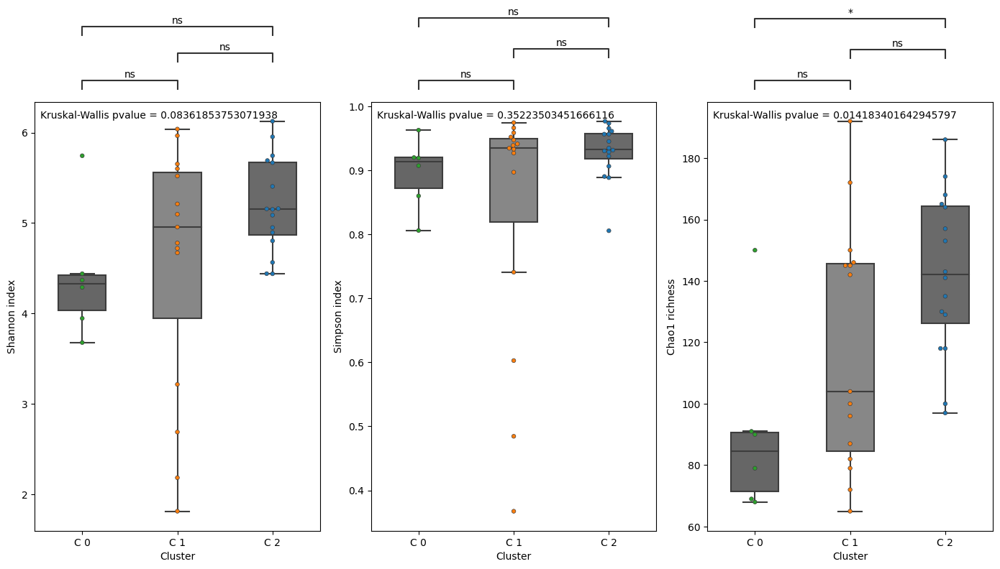

In [118]:
plotting.alpha_diversity_microbiome(micro_fused_rel[micro_fused_rel['Donor'].isin(list(micro_shared['Donor']))].drop(columns=['Donor']), 
                                                    micro_shared['Donor'], clus_labels, res_dir)

## Logistic Regression on clusters

Size of metadata: (37, 409)
Size of metadata after NaNs removal: (36, 407)
Shape of the regression input: (36, 7)
C 0
Optimization terminated successfully.
         Current function value: 0.372984
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   36
Model:                          Logit   Df Residuals:                       28
Method:                           MLE   Df Model:                            7
Date:                Fri, 09 Feb 2024   Pseudo R-squ.:                  0.1722
Time:                        16:02:26   Log-Likelihood:                -13.427
converged:                       True   LL-Null:                       -16.220
Covariance Type:            nonrobust   LLR p-value:                    0.5889
                             coef    std err          z      P>|z|      [0.025

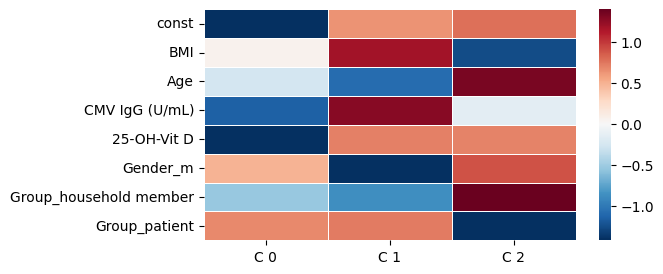

In [119]:
network = []
clus, parameters, pvalues = utils.lr_custom(tcr_shared, meta, clus_labels, res_dir)

network = utils.add_to_network(clus, parameters, pvalues, 'LR_reg', network)

## Addition to LR

Size of metadata: (9, 411)
Size of metadata after NaNs removal: (8, 409)
Shape of the regression input: (8, 9)
C 0
Optimization terminated successfully.
         Current function value: 0.000004
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                    8
Model:                          Logit   Df Residuals:                        0
Method:                           MLE   Df Model:                            7
Date:                Fri, 09 Feb 2024   Pseudo R-squ.:                   1.000
Time:                        16:02:27   Log-Likelihood:            -3.2389e-05
converged:                       True   LL-Null:                       -5.5452
Covariance Type:            nonrobust   LLR p-value:                    0.1347
                               coef    std err          z      P>|z|      [0.025 

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



Size of metadata: (22, 410)
Size of metadata after NaNs removal: (22, 408)
Shape of the regression input: (22, 7)
C 0
Optimization terminated successfully.
         Current function value: 0.449576
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   22
Model:                          Logit   Df Residuals:                       15
Method:                           MLE   Df Model:                            6
Date:                Fri, 09 Feb 2024   Pseudo R-squ.:                  0.1612
Time:                        16:02:27   Log-Likelihood:                -9.8907
converged:                       True   LL-Null:                       -11.791
Covariance Type:            nonrobust   LLR p-value:                    0.7036
                     coef    std err          z      P>|z|      [0.025      0.

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



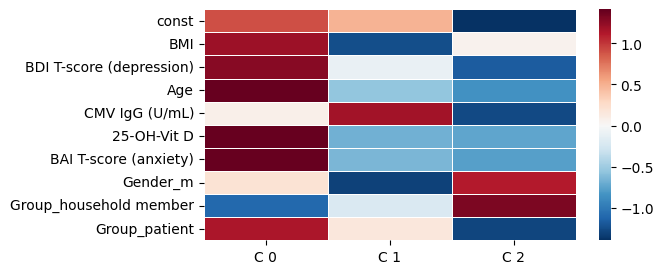

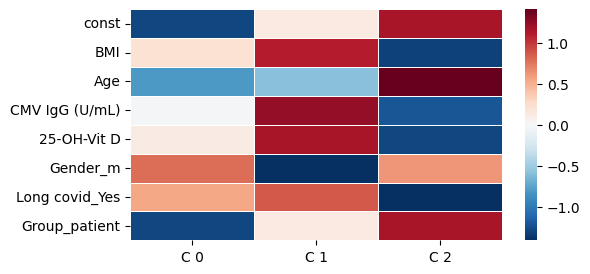

In [120]:
clus, parameters, pvalues = utils.lr_custom(tcr_shared, dep_anx.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels, res_dir)
clus, parameters, pvalues = utils.lr_custom(tcr_shared, covid_patients.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels, res_dir)

## One vs Rest Testing

In [121]:
usable_cytof = cytof_meta[cytof_meta['Donor'].isin(cytof_shared['Donor'])]
usable_cytof.drop(columns = 'Donor', inplace = True)
usable_cytof.reset_index(drop = True, inplace = True)

usable_micro = micro_fused[micro_fused['Donor'].isin(micro_shared['Donor'])]
usable_micro.reset_index(drop = True, inplace = True)

usable_TCR = TCR_stats[TCR_stats['Donor'].isin(tcr_shared['Donor'])]
usable_TCR.drop(columns = 'Donor', inplace = True)
usable_TCR.reset_index(drop = True, inplace = True)

/var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T/ipykernel_29400/2676392010.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T/ipykernel_29400/2676392010.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



   mann_pvalues          features cluster
0      0.247300        entropyCD4     C 0
1      0.856650        entropyCD8     C 0
2      0.002758  tcrcovidmatchCD4     C 0
3      0.204368  tcrcovidmatchCD8     C 0
4      0.008744   tcrcovidfreqCD4     C 0
5      0.546248   tcrcovidfreqCD8     C 0
0      0.768852        entropyCD4     C 1
1      0.314720        entropyCD8     C 1
2      0.456894  tcrcovidmatchCD4     C 1
3      0.077540  tcrcovidmatchCD8     C 1
4      0.733114   tcrcovidfreqCD4     C 1
5      0.023512   tcrcovidfreqCD8     C 1
0      0.237884        entropyCD4     C 2
1      0.399191        entropyCD8     C 2
2      0.140321  tcrcovidmatchCD4     C 2
3      0.429813  tcrcovidmatchCD8     C 2
4      0.110159   tcrcovidfreqCD4     C 2
5      0.075031   tcrcovidfreqCD8     C 2


[1] "Warning: Deleting existing log file: /var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T//RtmpR394O7/maaslin2.output.folder/maaslin2.log"
2024-02-09 16:02:53 INFO::Writing function arguments to log file
2024-02-09 16:02:53 INFO::Verifying options selected are valid
2024-02-09 16:02:53 INFO::Determining format of input files
2024-02-09 16:02:54 INFO::Input format is data samples as rows and metadata samples as rows
2024-02-09 16:02:54 INFO::Formula for fixed effects: expr ~  cluster_2
2024-02-09 16:02:54 INFO::Filter data based on min abundance and min prevalence
2024-02-09 16:02:54 INFO::Total samples in data: 37
2024-02-09 16:02:54 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-02-09 16:02:54 INFO::Total filtered features: 1
2024-02-09 16:02:54 INFO::Filtered feature names from abundance and prevalence filtering: t513
2024-02-09 16:02:54 INFO::Total filtered features with variance filtering: 0
2024-02-09 16:02:54 INFO::Filtered feature 

[1] "Warning: Deleting existing log file: /var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T//RtmpR394O7/maaslin2.output.folder/maaslin2.log"
2024-02-09 16:02:54 INFO::Writing function arguments to log file
2024-02-09 16:02:54 INFO::Verifying options selected are valid
2024-02-09 16:02:54 INFO::Determining format of input files
2024-02-09 16:02:54 INFO::Input format is data samples as rows and metadata samples as rows
2024-02-09 16:02:54 INFO::Formula for fixed effects: expr ~  cluster_1
2024-02-09 16:02:54 INFO::Filter data based on min abundance and min prevalence
2024-02-09 16:02:54 INFO::Total samples in data: 37
2024-02-09 16:02:54 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-02-09 16:02:54 INFO::Total filtered features: 1
2024-02-09 16:02:54 INFO::Filtered feature names from abundance and prevalence filtering: t513
2024-02-09 16:02:54 INFO::Total filtered features with variance filtering: 0
2024-02-09 16:02:54 INFO::Filtered feature 

[1] "Warning: Deleting existing log file: /var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T//RtmpR394O7/maaslin2.output.folder/maaslin2.log"
2024-02-09 16:02:55 INFO::Writing function arguments to log file
2024-02-09 16:02:55 INFO::Verifying options selected are valid
2024-02-09 16:02:55 INFO::Determining format of input files
2024-02-09 16:02:55 INFO::Input format is data samples as rows and metadata samples as rows
2024-02-09 16:02:55 INFO::Formula for fixed effects: expr ~  cluster_0
2024-02-09 16:02:55 INFO::Filter data based on min abundance and min prevalence
2024-02-09 16:02:55 INFO::Total samples in data: 37
2024-02-09 16:02:55 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-02-09 16:02:55 INFO::Total filtered features: 1
2024-02-09 16:02:55 INFO::Filtered feature names from abundance and prevalence filtering: t513
2024-02-09 16:02:55 INFO::Total filtered features with variance filtering: 0
2024-02-09 16:02:55 INFO::Filtered feature 









-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)











-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)











-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)






[None, None, None, None, None, None, None, None]

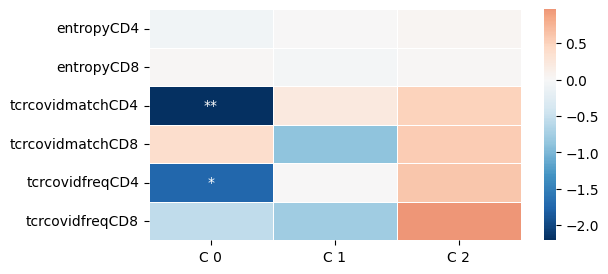

In [122]:
res = plotting.mann_sign([(usable_TCR, 'TCR')], clus_labels, res_dir)

for r in res:
    network = utils.add_to_network(list(r[0].index), pd.DataFrame(r[1]), pd.DataFrame(r[0].reset_index(drop=True)), r[2], network)

res = plotting.micro_analysis(usable_micro, clus_labels, micro_taxa, res_dir)

[network.append(element) for element in res]

## Cytof clusters analysis

Cytof number of columns 22
No need to drop Donor


/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:516: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



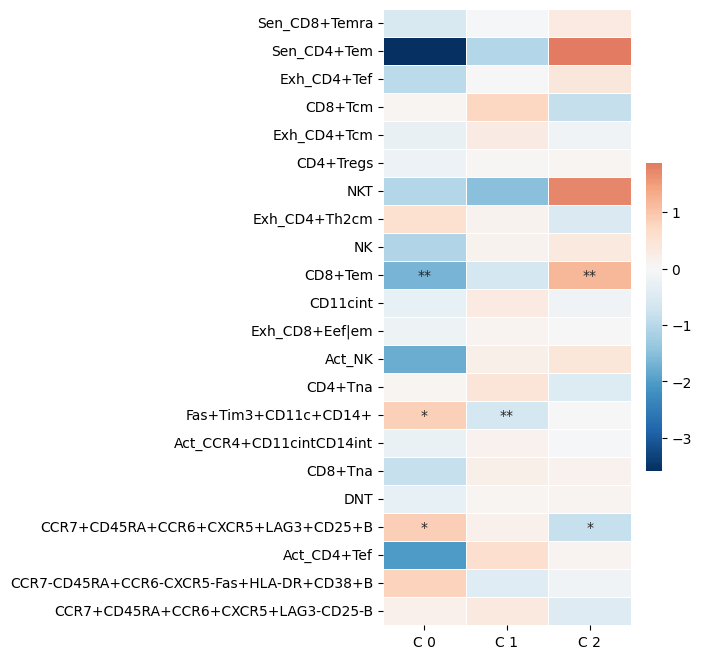

In [123]:
r = utils.cytof_clusters_analysis(usable_cytof,clus_labels, res_dir)

network = utils.add_to_network(list(r[0].index), pd.DataFrame(r[1]), pd.DataFrame(r[0].reset_index(drop=True)), r[2], network)

## GSEA on BACTERIA

Cluster C 0
Cluster C 1
Cluster C 2


<class 'pyvis.network.Network'> |N|=18 |E|=18

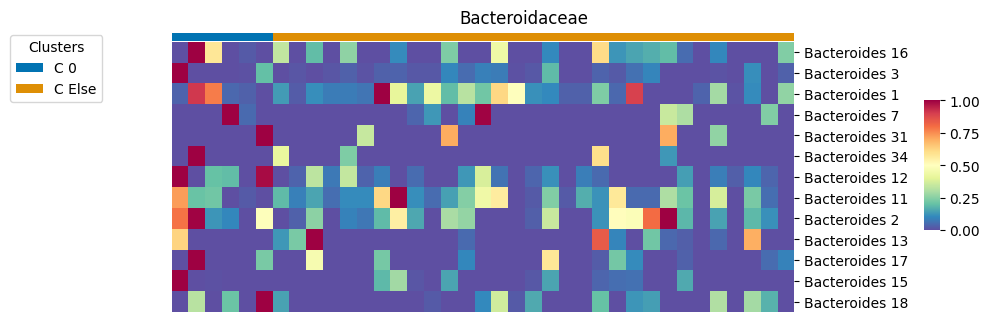

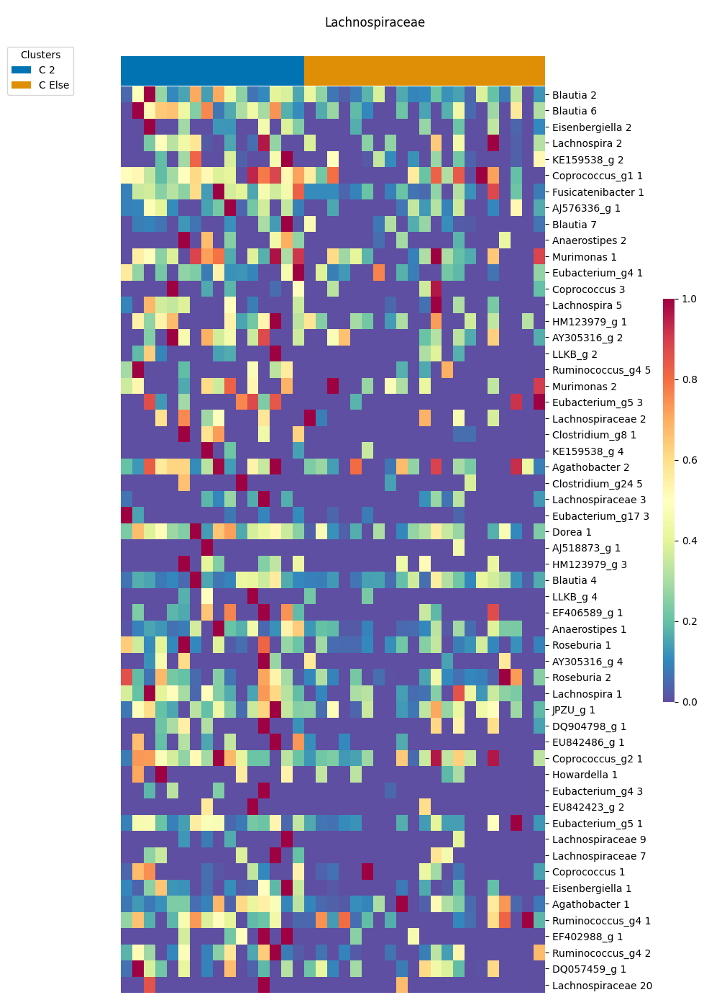

In [124]:
res = utils.gsea_analysis_bacteria(micro_data_norm.iloc[:,micro_data_norm.columns.isin(list(usable_micro['Donor'])+['genename'])],
                                clus_labels, res_dir, [custom_bacteria_gene_lists])

[network.append(element) for element in res]

utils.plot_heatmaps_gsea_bacteria(res, micro_fused_rel[micro_fused_rel['Donor'].isin(list(usable_micro['Donor']))].reset_index(drop=True), 
                                clus_labels, micro_taxa, res_dir)

plotting.draw_network(network, clus_labels, res_dir)

# Microbiome vs Cytof vs TCR vs RNA

In [125]:
RNA_shared = aggregated[aggregated['Donor'].isin(tcr_stats_fused_top['Donor'])]
RNA_shared = RNA_shared[RNA_shared['Donor'].isin(micro_fused['Donor'])]
RNA_shared = RNA_shared[RNA_shared['Donor'].isin(cytof_meta['Donor'])]
RNA_shared.reset_index(drop=True, inplace = True)

micro_shared = micro_fused[micro_fused['Donor'].isin(aggregated['Donor'])]
micro_shared = micro_shared[micro_shared['Donor'].isin(tcr_stats_fused_top['Donor'])]
micro_shared = micro_shared[micro_shared['Donor'].isin(cytof_meta['Donor'])]
micro_shared.reset_index(drop=True, inplace = True)

tcr_shared = tcr_stats_fused_top[tcr_stats_fused_top['Donor'].isin(micro_fused['Donor'])]
tcr_shared = tcr_shared[tcr_shared['Donor'].isin(aggregated['Donor'])]
tcr_shared = tcr_shared[tcr_shared['Donor'].isin(cytof_meta['Donor'])]
tcr_shared.reset_index(drop = True, inplace = True)

aux = cytof.copy()
aux['Donor'] = cytof_meta['Donor']
cytof_shared = aux[aux['Donor'].isin(aggregated['Donor'])]
cytof_shared = cytof_shared[cytof_shared['Donor'].isin(micro_fused['Donor'])]
cytof_shared = cytof_shared[cytof_shared['Donor'].isin(tcr_stats_fused_top['Donor'])]
cytof_shared.reset_index(drop=True, inplace = True)

In [126]:
# Cytof
idx = list(set(range(affinity_cytof.shape[0])).difference(list(cytof[~ ( (cytof_meta['Donor'].isin(micro_fused['Donor']))  & (cytof_meta['Donor'].isin(aggregated['Donor'])) & (cytof_meta['Donor'].isin(tcr_stats_fused_top['Donor']))) ].index)))
affinity_cytof_mod = affinity_cytof[np.ix_(idx,idx)]
print(affinity_cytof_mod.shape)
# Microbiome
idx = list(set(range(affinity_microbe.shape[0])).difference(list(micro_fused[~ ( (micro_fused['Donor'].isin(cytof_meta['Donor']))  & (micro_fused['Donor'].isin(aggregated['Donor'])) & (micro_fused['Donor'].isin(tcr_stats_fused_top['Donor']))) ].index)))
affinity_microbe_mod = affinity_microbe[np.ix_(idx,idx)]
print(affinity_microbe_mod.shape)
# RNA
idx = list(set(range(affinity_RNA.shape[0])).difference(list(aggregated[~ ( (aggregated['Donor'].isin(cytof_meta['Donor']))  & (aggregated['Donor'].isin(micro_fused['Donor'])) & (aggregated['Donor'].isin(tcr_stats_fused_top['Donor']))) ].index)))
affinity_RNA_mod = affinity_RNA[np.ix_(idx,idx)]
print(affinity_RNA_mod.shape)
# TCR
idx = list(set(range(affinity_tcr_fused_top.shape[0])).difference(list(tcr_stats_fused_top[~ ( (tcr_stats_fused_top['Donor'].isin(micro_fused['Donor']))  & (tcr_stats_fused_top['Donor'].isin(aggregated['Donor'])) & (tcr_stats_fused_top['Donor'].isin(cytof_meta['Donor']))) ].index)))
affinity_tcr_fused_top_mod = affinity_tcr_fused_top[np.ix_(idx,idx)]
print(affinity_tcr_fused_top_mod.shape)

(37, 37)
(37, 37)
(37, 37)
(37, 37)


Silhouette score: 0.2364626800282222


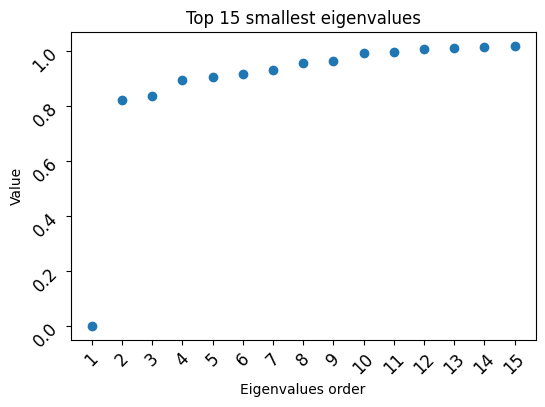

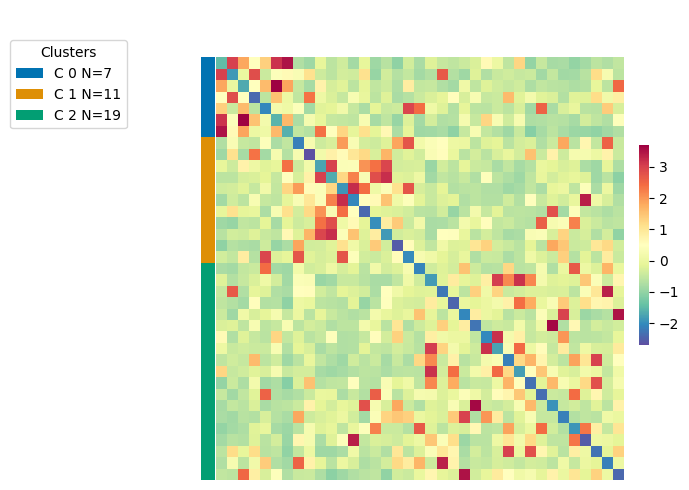

In [127]:
res_dir = results_dir + 'Microbiome+RNA+TCR+Cytof/'
dim = affinity_microbe_mod.shape[0]//10

affinity_4 = snf.snf([affinity_microbe_mod, affinity_tcr_fused_top_mod, affinity_cytof_mod, affinity_RNA_mod], K=dim)

plotting.eigengap_visual(affinity_4, res_dir)

n_clusters = 3
clus_labels = utils.spectral_clustering_custom(affinity_4, n_clusters)

plotting.draw_clustermap(clus_labels, affinity_4, res_dir, 'standard')

    Shannon index  Simpson index  Chao1 richness Cluster
0        5.404588       0.956193           143.0     C 2
1        4.803342       0.890112           165.0     C 2
2        5.667028       0.960775           164.0     C 2
3        5.151253       0.929988           135.0     C 2
4        2.185117       0.484440            65.0     C 1
5        5.652822       0.951746           172.0     C 1
6        4.670710       0.926658            87.0     C 2
7        4.779579       0.932829           104.0     C 0
8        5.743790       0.962472           150.0     C 0
9        5.953117       0.973073           153.0     C 2
10       4.439294       0.906097            97.0     C 2
11       4.440118       0.918895            68.0     C 0
12       5.156061       0.934494           130.0     C 2
13       2.690157       0.602660            82.0     C 1
14       5.158967       0.921853           141.0     C 1
15       1.814680       0.367421            79.0     C 1
16       4.369336       0.91967

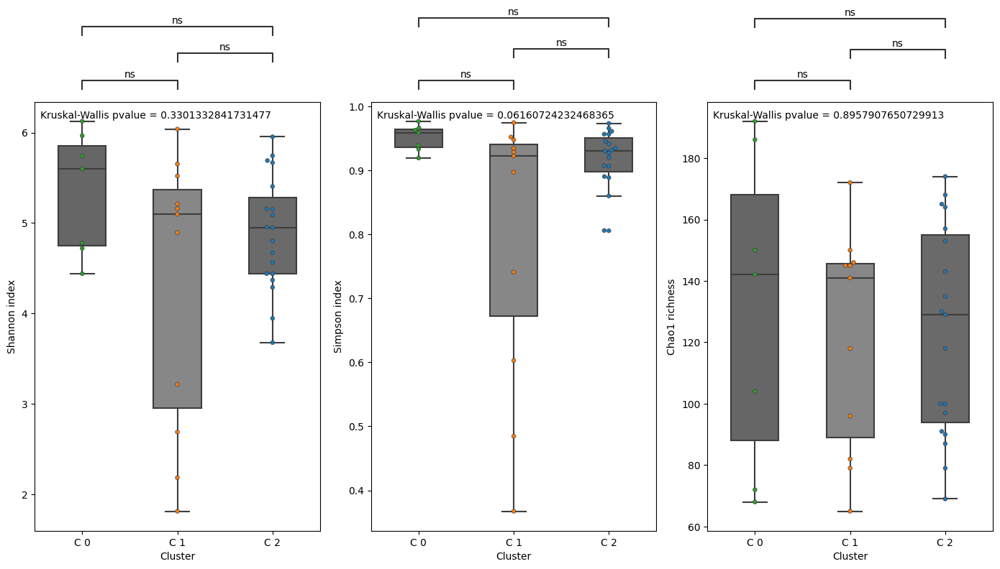

In [128]:
plotting.alpha_diversity_microbiome(micro_fused_rel[micro_fused_rel['Donor'].isin(list(micro_shared['Donor']))].drop(columns=['Donor']), 
                                                    micro_shared['Donor'], clus_labels, res_dir)

## Logistic Regression on clusters

Size of metadata: (37, 409)
Size of metadata after NaNs removal: (36, 407)
Shape of the regression input: (36, 7)
C 0
Optimization terminated successfully.
         Current function value: 0.286611
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   36
Model:                          Logit   Df Residuals:                       28
Method:                           MLE   Df Model:                            7
Date:                Fri, 09 Feb 2024   Pseudo R-squ.:                  0.4182
Time:                        16:03:14   Log-Likelihood:                -10.318
converged:                       True   LL-Null:                       -17.734
Covariance Type:            nonrobust   LLR p-value:                   0.03822
                             coef    std err          z      P>|z|      [0.025

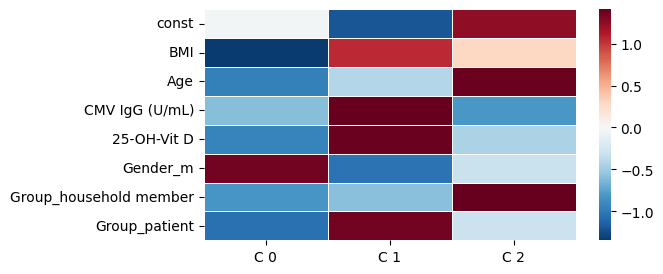

In [129]:
network = []
clus, parameters, pvalues = utils.lr_custom(tcr_shared, meta, clus_labels, res_dir)

network = utils.add_to_network(clus, parameters, pvalues, 'LR_reg', network)

## Addition to LR

Size of metadata: (9, 411)
Size of metadata after NaNs removal: (8, 409)
Shape of the regression input: (8, 9)
C 0
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 16
         Function evaluations: 17
         Gradient evaluations: 17
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                    8
Model:                          Logit   Df Residuals:                        0
Method:                           MLE   Df Model:                            7
Date:                Fri, 09 Feb 2024   Pseudo R-squ.:                   1.000
Time:                        16:03:14   Log-Likelihood:            -7.2472e-05
converged:                       True   LL-Null:                       -3.0142
Covariance Type:            nonrobust   LLR p-value:                    0.5365
                               coef    std err          z      P>|z|      [0.025 

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



Size of metadata: (22, 410)
Size of metadata after NaNs removal: (22, 408)
Shape of the regression input: (22, 7)
C 0
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   22
Model:                          Logit   Df Residuals:                       15
Method:                           MLE   Df Model:                            6
Date:                Fri, 09 Feb 2024   Pseudo R-squ.:                   1.000
Time:                        16:03:15   Log-Likelihood:            -0.00022424
converged:                       True   LL-Null:                       -8.7628
Covariance Type:            nonrobust   LLR p-value:                  0.007535
                     coef    std err          z      P>|z|      [0.025      0.

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning:

overflow encountered in exp

/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/env/lib/python3.11/site-packages/statsmodels/base/model.py:592: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



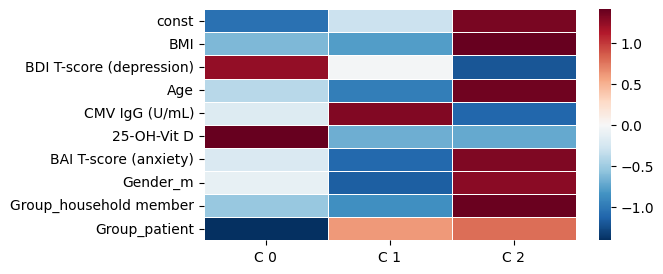

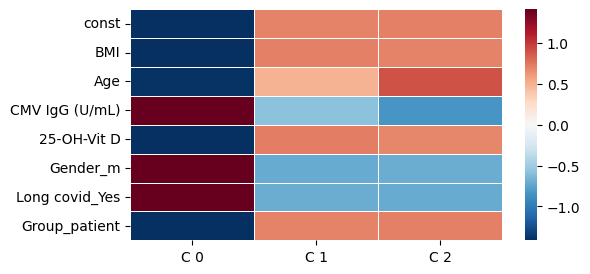

In [130]:
clus, parameters, pvalues = utils.lr_custom(tcr_shared, dep_anx.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels, res_dir)
clus, parameters, pvalues = utils.lr_custom(tcr_shared, covid_patients.merge(meta, left_on = 'Donor', right_on='Subjectnr', how = 'inner').drop(columns=['Donor']).reset_index(drop=True), clus_labels, res_dir)

## One vs Rest Testing

In [131]:
usable_cytof = cytof_meta[cytof_meta['Donor'].isin(cytof_shared['Donor'])]
usable_cytof.drop(columns = 'Donor', inplace = True)
usable_cytof.reset_index(drop = True, inplace = True)

usable_micro = micro_fused[micro_fused['Donor'].isin(micro_shared['Donor'])]
usable_micro.reset_index(drop = True, inplace = True)

usable_TCR = TCR_stats[TCR_stats['Donor'].isin(tcr_shared['Donor'])]
usable_TCR.drop(columns = 'Donor', inplace = True)
usable_TCR.reset_index(drop = True, inplace = True)

genenames = normalized_counts['genename']
usable_RNA = normalized_counts.drop(columns = 'genename')
usable_RNA = usable_RNA[[c for c in usable_RNA.columns if c in list(RNA_shared['Donor'])]]
usable_RNA['genename'] = genenames
usable_RNA.reset_index(drop = True, inplace=True)

/var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T/ipykernel_29400/3105114398.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T/ipykernel_29400/3105114398.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



   mann_pvalues          features cluster
0      0.530541        entropyCD4     C 0
1      0.662499        entropyCD8     C 0
2      0.770713  tcrcovidmatchCD4     C 0
3      0.445056  tcrcovidmatchCD8     C 0
4      0.741172   tcrcovidfreqCD4     C 0
5      0.709855   tcrcovidfreqCD8     C 0
0      0.727162        entropyCD4     C 1
1      0.434874        entropyCD8     C 1
2      0.424202  tcrcovidmatchCD4     C 1
3      0.078098  tcrcovidmatchCD8     C 1
4      0.894041   tcrcovidfreqCD4     C 1
5      0.067407   tcrcovidfreqCD8     C 1
0      0.403358        entropyCD4     C 2
1      0.280707        entropyCD8     C 2
2      0.626116  tcrcovidmatchCD4     C 2
3      0.318583  tcrcovidmatchCD8     C 2
4      0.692215   tcrcovidfreqCD4     C 2
5      0.047770   tcrcovidfreqCD8     C 2


[1] "Warning: Deleting existing log file: /var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T//RtmpR394O7/maaslin2.output.folder/maaslin2.log"
2024-02-09 16:03:40 INFO::Writing function arguments to log file
2024-02-09 16:03:40 INFO::Verifying options selected are valid
2024-02-09 16:03:40 INFO::Determining format of input files
2024-02-09 16:03:40 INFO::Input format is data samples as rows and metadata samples as rows
2024-02-09 16:03:40 INFO::Formula for fixed effects: expr ~  cluster_2
2024-02-09 16:03:40 INFO::Filter data based on min abundance and min prevalence
2024-02-09 16:03:40 INFO::Total samples in data: 37
2024-02-09 16:03:40 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-02-09 16:03:40 INFO::Total filtered features: 1
2024-02-09 16:03:40 INFO::Filtered feature names from abundance and prevalence filtering: t513
2024-02-09 16:03:40 INFO::Total filtered features with variance filtering: 0
2024-02-09 16:03:40 INFO::Filtered feature 

[1] "Warning: Deleting existing log file: /var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T//RtmpR394O7/maaslin2.output.folder/maaslin2.log"
2024-02-09 16:03:41 INFO::Writing function arguments to log file
2024-02-09 16:03:41 INFO::Verifying options selected are valid
2024-02-09 16:03:41 INFO::Determining format of input files
2024-02-09 16:03:41 INFO::Input format is data samples as rows and metadata samples as rows
2024-02-09 16:03:41 INFO::Formula for fixed effects: expr ~  cluster_1
2024-02-09 16:03:41 INFO::Filter data based on min abundance and min prevalence
2024-02-09 16:03:41 INFO::Total samples in data: 37
2024-02-09 16:03:41 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-02-09 16:03:41 INFO::Total filtered features: 1
2024-02-09 16:03:41 INFO::Filtered feature names from abundance and prevalence filtering: t513
2024-02-09 16:03:41 INFO::Total filtered features with variance filtering: 0
2024-02-09 16:03:41 INFO::Filtered feature 

[1] "Warning: Deleting existing log file: /var/folders/br/mxlpyjk52nz_ksh4b5vpy4340000gn/T//RtmpR394O7/maaslin2.output.folder/maaslin2.log"
2024-02-09 16:03:42 INFO::Writing function arguments to log file
2024-02-09 16:03:42 INFO::Verifying options selected are valid
2024-02-09 16:03:42 INFO::Determining format of input files
2024-02-09 16:03:42 INFO::Input format is data samples as rows and metadata samples as rows
2024-02-09 16:03:42 INFO::Formula for fixed effects: expr ~  cluster_0
2024-02-09 16:03:42 INFO::Filter data based on min abundance and min prevalence
2024-02-09 16:03:42 INFO::Total samples in data: 37
2024-02-09 16:03:42 INFO::Min samples required with min abundance for a feature not to be filtered: 0.000000
2024-02-09 16:03:42 INFO::Total filtered features: 1
2024-02-09 16:03:42 INFO::Filtered feature names from abundance and prevalence filtering: t513
2024-02-09 16:03:42 INFO::Total filtered features with variance filtering: 0
2024-02-09 16:03:42 INFO::Filtered feature 









-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)











-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)











-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)






[None]

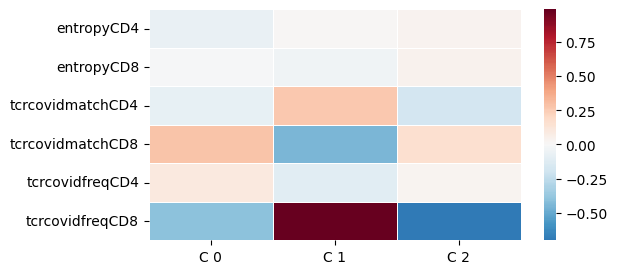

In [132]:
res = plotting.mann_sign([(usable_TCR, 'TCR')], clus_labels, res_dir)

for r in res:
    network = utils.add_to_network(list(r[0].index), pd.DataFrame(r[1]), pd.DataFrame(r[0].reset_index(drop=True)), r[2], network)

res = plotting.micro_analysis(usable_micro, clus_labels, micro_taxa, res_dir)

[network.append(element) for element in res]

## Cytof clusters analysis

Cytof number of columns 22
No need to drop Donor


/Users/fabioaffaticati/Desktop/Work/activ_covid-and-omics/src/modules/utils.py:516: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



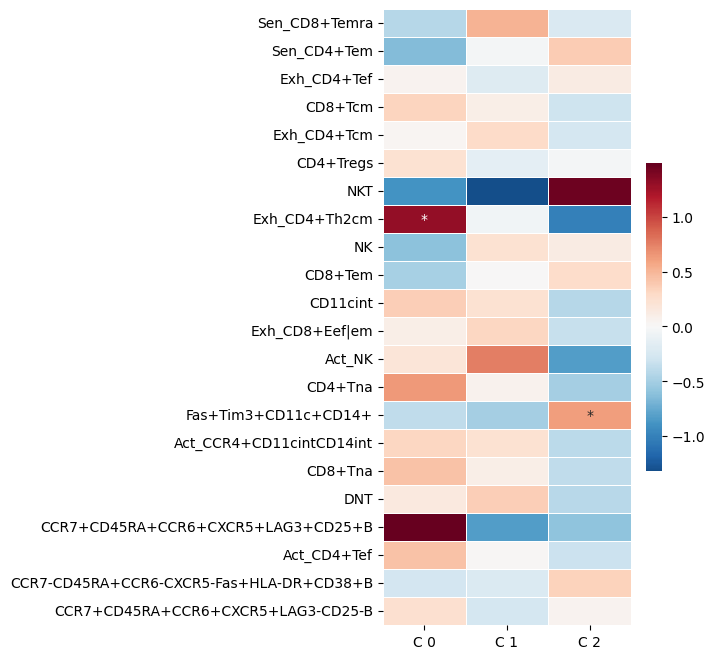

In [133]:
r = utils.cytof_clusters_analysis(usable_cytof,clus_labels, res_dir)

network = utils.add_to_network(list(r[0].index), pd.DataFrame(r[1]), pd.DataFrame(r[0].reset_index(drop=True)), r[2], network)

## GSEA

In [134]:
gsea_res = utils.gsea_analysis_single(usable_RNA, clus_labels, res_dir, hallmark)

# Multiset analysis
utils.gsea_analysis_multi(usable_RNA, clus_labels, res_dir, path_sets)

# Add GSEA results to the network
[network.append(element) for element in gsea_res]

2024-02-09 16:03:50,747 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-09 16:03:52,612 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-09 16:03:53,485 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-09 16:03:54,450 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-09 16:03:59,015 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-09 16:03:59,919 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-09 16:04:25,089 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-09 16:04:28,331 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-09 16:04:34,593 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-09 16:04:39,097 [WARNING] Dropping duplicated gene names, only keep the first values
2024-02-09 16:04:40,181 [WARNING] Dropping duplicated gene names, only

[None, None]

## GSEA on BACTERIA

Cluster C 0
Cluster C 1
Cluster C 2


<class 'pyvis.network.Network'> |N|=10 |E|=8

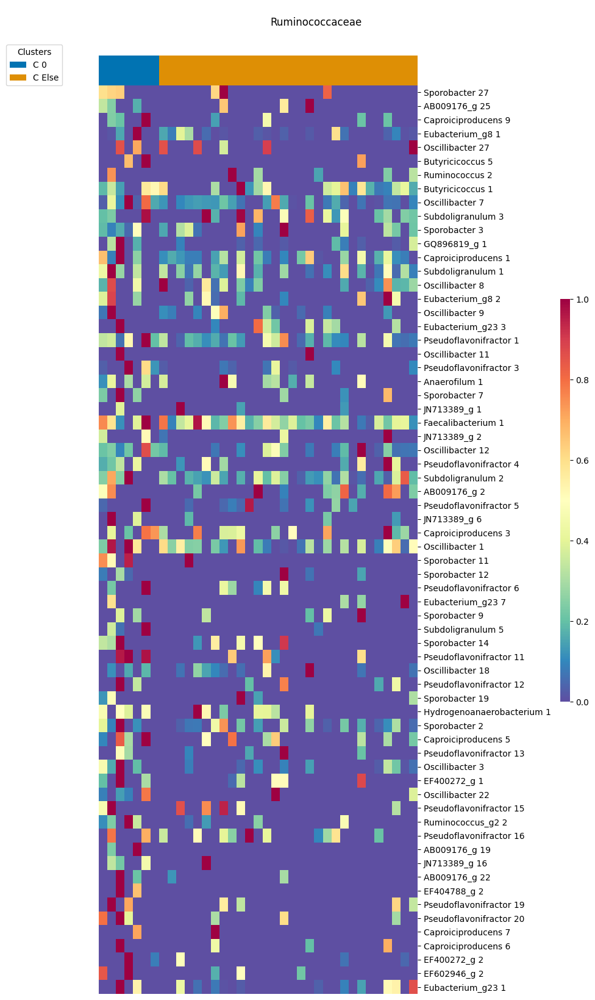

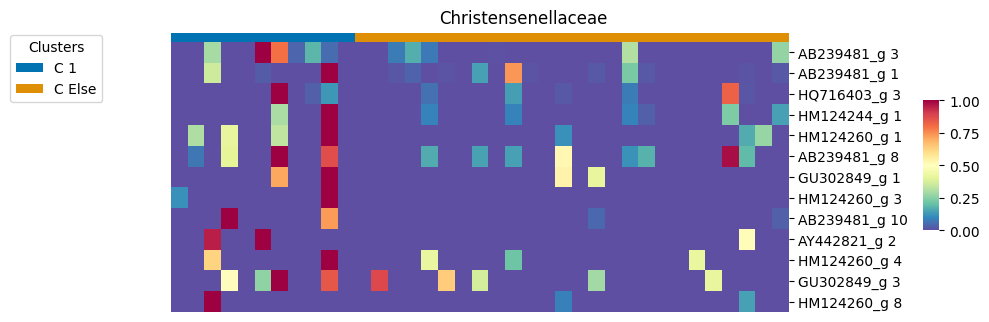

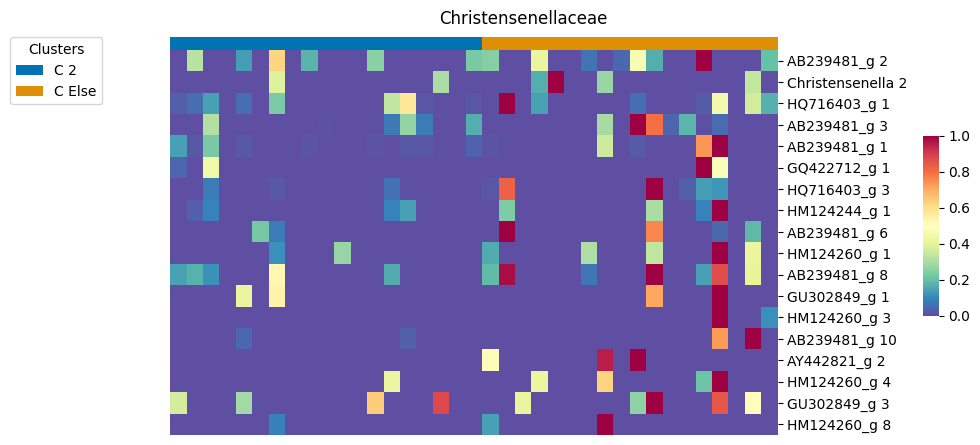

In [135]:
res = utils.gsea_analysis_bacteria(micro_data_norm.iloc[:,micro_data_norm.columns.isin(list(usable_micro['Donor'])+['genename'])],
                                clus_labels, res_dir, [custom_bacteria_gene_lists])

[network.append(element) for element in res]

utils.plot_heatmaps_gsea_bacteria(res, micro_fused_rel[micro_fused_rel['Donor'].isin(list(usable_micro['Donor']))].reset_index(drop=True), 
                                clus_labels, micro_taxa, res_dir)

plotting.draw_network(network, clus_labels, res_dir)